# Simple Model of the LNG Market

In [1]:
import shutil
import sys
import os.path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import chart_studio
import chart_studio.plotly as py
import seaborn as sns
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import folium
from folium.plugins import MarkerCluster
import json

plt.close('all')

from IPython.display import display
from geopy.geocoders import Nominatim
from geopy import distance
from pyomo.environ import *

geolocator = Nominatim(user_agent="Your_Name")
#pd.set_option('precision', 3)
MMBtu_LNG = 23.12 # 1m³ of LNG = 21.04MMBtu
MMBtu_Gas = 0.036 # 1m³ of Gas = 0.036MMBtu
LNG_to_Gas = 584 # 1m³ of LNG = 584m³ of gas (IGU LNG Annual Report 2019)
mt_LNG_BCM = 1.379 * 10**9 # mega tonne of LNG to bcm (https://www.enerdynamics.com/Energy-Currents_Blog/Understanding-Liquefied-Natural-Gas-LNG-Units.aspx)
mt_MMBtu = mt_LNG_BCM * MMBtu_Gas
t_oil_MMBtu = 39.6526 #  tonne of oil to mmbtu             https://unitjuggler.com/

print(107.1*10**9 * MMBtu_Gas)
print(77.665*mt_MMBtu)

3855599999.9999995
3855601259.9999995


## 1 Data 

### 1.1 Importing Nodes

In [2]:
# Data for importing and exporting countries from "BP Stats Review (2020)"

# "Import (MMBtu)" column consists of imports in m³ multiplied with conversion factor

Imp_Nodes = pd.DataFrame({
    
    "Country" : ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan",
                 "France", "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific",
                 "Other Europe", "Total North America", "Total S. & C. America", "Total ME & Africa"],
    
    "Import Jan (MMBtu)" : [10.5651, 9.2547, 6.279, 2.83, 2.2386, 1.1288, 1.632, 1.42, 1.741, 1.074, 2.353, 0.585, 1.7, 1.9584, 0.911, 0.3536, 0.0952],
    
    "Import Feb (MMBtu)" : [10.30575, 5.93775, 4.095, 2.56, 1.46055, 0.9248, 1.83, 1.374, 1.17, 0.93, 1.782, 0.299, 1.768, 1.8496, 0.6528, 1.02, 0.3536],
    
    "Import Mar (MMBtu)" : [10.22385, 5.5419, 3.78105, 2.38, 2.0475, 1.2104, 2.335, 1.493, 1.78, 1.605, 1.4, 1.115, 2.1986, 1.6864, 0.9656, 0.9112, 0.1768],
    
    "Import Apr (MMBtu)" : [7.7532, 6.1971, 3.9585, 2.62, 2.0748, 1.1832, 2.572, 1.596, 2.244, 1.115, 0.707, 0.8074, 2.2168, 2.1624, 1.02, 1.0744, 0.748],
    
    "Import May (MMBtu)" : [7.7259, 6.04695, 4.05405, 2.75, 2.03385, 1.1152, 1.832, 1.656, 2.19, 1.115, 0.503, 0.7028, 2.9784, 2.4072, 0.9656, 1.1424, 1.4144],
    
    "Import Jun (MMBtu)" : [7.2345, 6.18345, 4.54545, 2.73, 1.89735, 1.0744, 1.739, 1.903, 0.76, 1.387, 0.68, 0.6528, 2.0264, 2.312, 1.2784, 1.904, 1.3192],
    
    "Import Jul (MMBtu)" : [7.2345, 6.6612, 4.54545, 2.79, 2.25225, 1.088, 1.046, 2.49, 0.3944, 1.265, 0.517, 0.8704, 2.6656, 1.8768, 0.8432, 1.972, 1.4688],
    
    "Import Aug (MMBtu)" : [8.463, 7.5075, 4.914, 2.82, 1.8837, 1.0064, 1.638, 2.144, 0.19, 1.265, 0.816, 0.9112, 2.4888, 1.9176, 1.088, 1.7408, 1.8496],
    
    "Import Sep (MMBtu)" : [8.94075, 6.92055, 3.4125, 2.79, 2.0475, 0.9928, 1.2745, 2.139, 1.3, 1.13, 0.558, 0.2856, 2.3256, 1.8088, 1.0064, 1.0472, 1.5776],
    
    "Import Oct (MMBtu)" : [8.85885, 5.6511, 4.368, 2.83, 2.00655, 1.0608, 1.7745, 1.95, 1.85, 1.35, 0.843, 0.7616, 2.1986, 2.0944, 0.9248, 0.8024, 1.1016],
    
    "Import Nov (MMBtu)" : [8.83155, 8.66775, 5.1597, 2.79, 1.51515, 0.6664, 2.84, 1.931, 2.4, 0.94, 1.115, 1.0336, 3.876, 2.2848, 0.5984, 0.9384, 0.476],
    
    "Import Dec (MMBtu)" : [9.4185, 10.30575, 6.51105, 2.83, 1.7745, 0.9792, 2.56, 1.81, 3.05, 1.1, 1.89, 0.9928, 4.148, 2.0808, 0.9656, 0.5576, 0.276],
    
    "Regasification Terminal" : ["Sodegaura", "Yancheng", "Incheon", "Dahej", "Kaohsiung",
                                 "Karachi", "Dunkirk",
                                 "Barcelona", "Isle of Grain", "Rovigo", "Marmara", "Zeebrugge",
                                 "Map Ta Phut, Thailand",
                                 "Świnoujście, Poland", "Ensenada, Mexico", "Rio de Janeiro, Brazil",
                                 "Al Ahmadi, Kuwait"],
    
    "Import (MMBtu)" : [105.6*10**9 * MMBtu_Gas, 84.9*10**9 * MMBtu_Gas, 55.6*10**9 * MMBtu_Gas,
                         32.9*10**9 * MMBtu_Gas, 23.2*10**9 * MMBtu_Gas, 12.4*10**9 * MMBtu_Gas,
                         23.1*10**9 * MMBtu_Gas, 21.9*10**9 * MMBtu_Gas, 19.1*10**9 * MMBtu_Gas,
                         14.3*10**9 * MMBtu_Gas, 13.2*10**9 * MMBtu_Gas, 9*10**9 * MMBtu_Gas,
                         30.6*10**9 * MMBtu_Gas, 24.4*10**9 * MMBtu_Gas, 11.2*10**9 * MMBtu_Gas,
                         13.5*10**9 * MMBtu_Gas, 10.9*10**9 * MMBtu_Gas],
    
    "Import 2030 (MMBtu)" : [86.287, 135, 58.6, 55, 28.75, 51.735, 30.944, 29.379,
                        
                             25.574, 19.146, 17.654, 12.093, 120, 40.776, 12.363,
                        
                             14.842, 47.14],

    "Import 2040 (MMBtu)" : [71.84, 167.676, 62.5, 75.72, 31.25, 70.5, 40.407,
                             38.363, 33.395, 25.001, 23.053, 15.791, 195.391,
                             44.799, 13.514, 16.217, 88],
    
    "Import Europe +33% (MMBtu)" : [105.6*10**9 * MMBtu_Gas, 84.9*10**9 * MMBtu_Gas, 55.6*10**9 * MMBtu_Gas,
                                     32.9*10**9 * MMBtu_Gas, 23.2*10**9 * MMBtu_Gas, 12.4*10**9 * MMBtu_Gas,
                                     (4/3)*23.1*10**9 * MMBtu_Gas, (4/3)*21.9*10**9 * MMBtu_Gas, (4/3)*19.1*10**9 * MMBtu_Gas,
                                     (4/3)*14.3*10**9 * MMBtu_Gas, (4/3)*13.2*10**9 * MMBtu_Gas, (4/3)*9*10**9 * MMBtu_Gas,
                                     30.6*10**9 * MMBtu_Gas, (4/3)*24.4*10**9 * MMBtu_Gas, 11.2*10**9 * MMBtu_Gas,
                                     13.5*10**9 * MMBtu_Gas, 10.9*10**9 * MMBtu_Gas],
    
    "Import Asia Pacific -20% (MMBtu)" : [(4/5)*105.6*10**9 * MMBtu_Gas, (4/5)*1.121*84.9*10**9 * MMBtu_Gas, (4/5)*1.121*55.6*10**9 * MMBtu_Gas,
                                     32.9*10**9 * MMBtu_Gas, (4/5)*23.2*10**9 * MMBtu_Gas, 12.4*10**9 * MMBtu_Gas,
                                     23.1*10**9 * MMBtu_Gas, 21.9*10**9 * MMBtu_Gas, 19.1*10**9 * MMBtu_Gas,
                                     14.3*10**9 * MMBtu_Gas, 13.2*10**9 * MMBtu_Gas, 9*10**9 * MMBtu_Gas,
                                     (4/5)*30.6*10**9 * MMBtu_Gas, 24.4*10**9 * MMBtu_Gas, 11.2*10**9 * MMBtu_Gas,
                                     13.5*10**9 * MMBtu_Gas, 10.9*10**9 * MMBtu_Gas],
    

})

#Imp_Countries["Import (MMBtu)"] = (Imp_Countries["Import (MMBtu)"].astype(float)/1000000000).astype(str)

Imp_Nodes["Location"] = Imp_Nodes["Regasification Terminal"].apply(geolocator.geocode)
Imp_Nodes["Point"]= Imp_Nodes["Location"].apply(lambda loc: tuple(loc.point) if loc else None)
Imp_Nodes[["Latitude", "Longitude", "Altitude"]] = pd.DataFrame(Imp_Nodes["Point"].to_list(), index=Imp_Nodes.index)

#del Imp_Nodes["Altitude"]
#del Imp_Nodes["Location"]
#del Imp_Nodes["Point"]


#center the columns, display() method doesn't work anymore, so not necessary for now
def pd_centered(df):
    return df.style.set_table_styles([
        {"selector": "th", "props": [("text-align", "center")]},
        {"selector": "td", "props": [("text-align", "center")]}])

Imp_Nodes["Import Jan (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import Feb (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import Mar (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import Apr (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import May (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import Jun (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import Jul (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import Aug (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import Sep (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import Oct (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import Nov (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import Dec (MMBtu)"] *= 10**9 * MMBtu_Gas

Imp_Nodes["Import 2030 (MMBtu)"] *= 10**9 * MMBtu_Gas
Imp_Nodes["Import 2040 (MMBtu)"] *= 10**9 * MMBtu_Gas
#Imp_Nodes["Import (MMBtu)"] = Imp_Nodes["Import (MMBtu)"]/(10**9 * MMBtu_Gas)

#print(Imp_Nodes["Import (MMBtu)"].sum()/(10**9 * MMBtu_Gas))
print(Imp_Nodes["Import 2030 (MMBtu)"].sum())
print(Imp_Nodes["Import 2040 (MMBtu)"].sum())
print(Imp_Nodes["Import Europe +33% (MMBtu)"].sum()/(10**9 * MMBtu_Gas))
print(Imp_Nodes["Import Asia Pacific -20% (MMBtu)"].sum()/(10**9 * MMBtu_Gas))
Imp_Nodes

28270188000.0
36483012000.0
547.4666666666667
459.4204


,Country,Import Jan (MMBtu),Import Feb (MMBtu),Import Mar (MMBtu),Import Apr (MMBtu),Import May (MMBtu),Import Jun (MMBtu),Import Jul (MMBtu),Import Aug (MMBtu),Import Sep (MMBtu),...,Import (MMBtu),Import 2030 (MMBtu),Import 2040 (MMBtu),Import Europe +33% (MMBtu),Import Asia Pacific -20% (MMBtu),Location,Point,Latitude,Longitude,Altitude
0,Japan,380343600.0,371007000.0,368058600.0,279115200.0,278132400.0,260442000.0,260442000.0,304668000.0,321867000.0,...,3.801600e+09,3.106332e+09,2.586240e+09,3.801600e+09,3.041280e+09,"(袖ケ浦市, 千葉県, 日本, (35.4296688, 139.9544661))","(35.4296688, 139.9544661, 0.0)",35.429669,139.954466,0.0
1,China,333169200.0,213759000.0,199508400.0,223095600.0,217690200.0,222604200.0,239803200.0,270270000.0,249139800.0,...,3.056400e+09,4.860000e+09,6.036336e+09,3.056400e+09,2.740980e+09,"(盐城市, 江苏省, 224043, 中国, (33.349559, 120.1577019))","(33.349559, 120.1577019, 0.0)",33.349559,120.157702,0.0
2,South Korea,226044000.0,147420000.0,136117800.0,142506000.0,145945800.0,163636200.0,163636200.0,176904000.0,122850000.0,...,2.001600e+09,2.109600e+09,2.250000e+09,2.001600e+09,1.795035e+09,"(인천, 대한민국, (37.456, 126.7052))","(37.456, 126.7052, 0.0)",37.456000,126.705200,0.0
3,India,101880000.0,92160000.0,85680000.0,94320000.0,99000000.0,98280000.0,100440000.0,101520000.0,100440000.0,...,1.184400e+09,1.980000e+09,2.725920e+09,1.184400e+09,1.184400e+09,"(Dahej, Vagra Taluka, Bharuch District, Gujara...","(21.7118382, 72.5898083, 0.0)",21.711838,72.589808,0.0
4,Taiwan,80589600.0,52579800.0,73710000.0,74692800.0,73218600.0,68304600.0,81081000.0,67813200.0,73710000.0,...,8.352000e+08,1.035000e+09,1.125000e+09,8.352000e+08,6.681600e+08,"(高雄市, 臺灣, (22.6203348, 120.3120375))","(22.6203348, 120.3120375, 0.0)",22.620335,120.312038,0.0
5,Pakistan,40636800.0,33292800.0,43574400.0,42595200.0,40147200.0,38678400.0,39168000.0,36230400.0,35740800.0,...,4.464000e+08,1.862460e+09,2.538000e+09,4.464000e+08,4.464000e+08,"(کراچی, سندھ, پاکستان, (24.8546842, 67.0207055))","(24.8546842, 67.0207055, 0.0)",24.854684,67.020706,0.0
6,France,58752000.0,65880000.0,84060000.0,92592000.0,65952000.0,62604000.0,37656000.0,58968000.0,45882000.0,...,8.316000e+08,1.113984e+09,1.454652e+09,1.108800e+09,8.316000e+08,"(Dunkerque, Nord, Hauts-de-France, France métr...","(51.0347708, 2.3772525, 0.0)",51.034771,2.377252,0.0
7,Spain,51120000.0,49464000.0,53748000.0,57456000.0,59616000.0,68508000.0,89640000.0,77184000.0,77004000.0,...,7.884000e+08,1.057644e+09,1.381068e+09,1.051200e+09,7.884000e+08,"(Barcelona, Barcelonès, Barcelona, Catalunya, ...","(41.3828939, 2.1774322, 0.0)",41.382894,2.177432,0.0
8,UK,62676000.0,42120000.0,64080000.0,80784000.0,78840000.0,27360000.0,14198400.0,6840000.0,46800000.0,...,6.876000e+08,9.206640e+08,1.202220e+09,9.168000e+08,6.876000e+08,"(Isle of Grain, Grain, Medway, England, United...","(51.4540158, 0.6979607094472984, 0.0)",51.454016,0.697961,0.0
9,Italy,38664000.0,33480000.0,57780000.0,40140000.0,40140000.0,49932000.0,45540000.0,45540000.0,40680000.0,...,5.148000e+08,6.892560e+08,9.000360e+08,6.864000e+08,5.148000e+08,"(Rovigo, Veneto, Italia, (44.97720615, 12.2741...","(44.97720615, 12.274190436964231, 0.0)",44.977206,12.274190,0.0


### 1.2 Exporting Nodes

In [170]:
# define DF with data for exporting countries (BP 2020)

Exp_Nodes = pd.DataFrame({
    
    "Country" : ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                 "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific", "Other Europe",
                 "Other Americas", "Other ME", "Other Africa"],
    
    "Export (MMBtu)" : [107.1*10**9 * MMBtu_Gas, 104.7*10**9 * MMBtu_Gas, 47.5*10**9 * MMBtu_Gas,
                        39.4*10**9 * MMBtu_Gas, 35.1*10**9 * MMBtu_Gas, 28.8*10**9 * MMBtu_Gas,
                        17.0*10**9 * MMBtu_Gas, 16.6*10**9 * MMBtu_Gas, 16.5*10**9 * MMBtu_Gas,
                        14.1*10**9 * MMBtu_Gas, 20.9*10**9 * MMBtu_Gas, 8.6*10**9 * MMBtu_Gas, 
                        5.301*10**9 * MMBtu_Gas, 7.7*10**9 * MMBtu_Gas, 15.8*10**9 * MMBtu_Gas],
    
    "Export Jan (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export Feb (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export Mar (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export Apr (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export May (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export Jun (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export Jul (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export Aug (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export Sep (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export Oct (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export Nov (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export Dec (MMBtu)" : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    
    "Export 2030 (MMBtu)" : [151.69, 124.4, 150.5, 60, 43, 39.28, 17, 20, 37.7, 15.86, 20.9, 8.6, 50, 7.7, 60],
                             
    "Export 2040 (MMBtu)" : [173.75, 140, 220, 85, 43, 70, 17, 20, 37.7, 15.86, 20.9, 8.6, 60, 7.7, 100],
        
    "Break Eeven Price ($/MMBtu)" : [2.36, 7.5, 5.95, 4.5, 6.0, 4.08,
                                     5.1, 4.93, 6.0, 3.7, 8.4, 5.0,
                                     6.0, 3.0, 4.5],
    
    "Break Eeven Price 2030 ($/MMBtu)" : [2.934, 9.325, 7.398, 5.595, 7.46, 5.0723, 6.341,
                                          6.13, 7.46, 4.6, 10.444, 6.217, 7.460, 3.73, 5.595],
    
    "Break Eeven Price 2040 ($/MMBtu)" : [3.577, 11.367, 9.018, 6.82, 9.094, 6.184, 7.73, 7.472,
                                          9.094, 5.608, 12.731, 7.578, 9.094, 4.547, 6.82],
    
    
    #"Feedstock ($/MMBtu)" : [1.5, 3.0, 3.0, 0.5, 3.0, 2.2, 3.0, 0.5, 2.0, 1.5],

    #"Liquefaction ($/MMBtu)" : [2.0, 3.5, 3.0, 4.0, 3.0, 1.88, 2.1, 2.0, 4.0, 2.0],
    
    "Liquefaction Terminal" : ["Ras Laffan", "Gladstone", "Sabine Pass",
                               "Sabetta", "Bintulu", "Bonny Island",
                               "Point Fortin", " Bethioua", "Bontang",
                               "Qalhat, Oman", "Port Moresby, Papua New Guinea",
                               "Hammerfest, Norway", "Callao, Peru",
                               "Abu Dhabi, UAE", "Soyo, Angola"],
    
    # data for capacity from IGU 2020
    
    "Nominal Liquefaction Capacity 2019 (MMBtu)" : [77.665*mt_MMBtu, 86*mt_MMBtu, 37.8*mt_MMBtu,
                                              26.6*1.07*mt_MMBtu, 30.5*mt_MMBtu, 22.2*mt_MMBtu,
                                              14.8*mt_MMBtu, 25.5*mt_MMBtu, 26.6*mt_MMBtu,
                                              10.4*mt_MMBtu, 14.1*mt_MMBtu, 4.2*mt_MMBtu,
                                              4.5*mt_MMBtu, 5.8*mt_MMBtu, 11.3*mt_MMBtu],
    
    "Nominal Liquefaction Capacity (MMBtu)" : [77.1*mt_MMBtu/12, 86*mt_MMBtu/12, 37.8*mt_MMBtu/12,
                                              26.6*1.07*mt_MMBtu/12, 30.5*mt_MMBtu/12, 22.2*mt_MMBtu/12,
                                              14.8*mt_MMBtu/12, 25.5*mt_MMBtu/12, 26.6*mt_MMBtu/12,
                                              10.4*mt_MMBtu/12, 14.1*mt_MMBtu/12, 4.2*mt_MMBtu/12,
                                              4.5*mt_MMBtu/12, 5.8*mt_MMBtu/12, 11.3*mt_MMBtu/12],
    
    
    "Nominal Liquefaction Capacity 2019 HC (MMBtu)" : [(2/3)*77.1*mt_MMBtu, 86*mt_MMBtu, 37.8*mt_MMBtu,
                                              26.6*1.07*mt_MMBtu, 30.5*mt_MMBtu, 22.2*mt_MMBtu,
                                              14.8*mt_MMBtu, 25.5*mt_MMBtu, 26.6*mt_MMBtu,
                                              (2/3)*10.4*mt_MMBtu, 14.1*mt_MMBtu, 4.2*mt_MMBtu,
                                              4.5*mt_MMBtu, (2/3)*5.8*mt_MMBtu, 11.3*mt_MMBtu],
    
        
})

# Price for US: https://www.macrotrends.net/2478/natural-gas-prices-historical-chart and 
# https://www.argusmedia.com/en/news/1431713-cheniere-longterm-lng-sales-data-excludes-some-fees
# Price for Qatar and Algeria: https://www.argusmedia.com/en/news/2098570-sonatrach-offers-spot-lng-cargoes-as-exports-slow
# Price for Papua NG: https://oilprice.com/Energy/Energy-General/Low-Gas-Prices-Could-Derail-Papua-New-Guineas-LNG-Ambitions.html
# Egypt Export 2019: https://www.mees.com/2020/4/10/oil-gas/egypt-2019-lng-exports/2aa75e10-7b34-11ea-9c97-c54251792df2
# Russia Export 2019: https://www.hellenicshippingnews.com/russian-lng-exports-a-year-in-review/

#Exp_Countries["Export (Bcm)"] = (Exp_Countries["Export (Bcm)"].astype(float)/1000000000).astype(str)

#"Nominal Liquefaction Capacity (MMBtu)" : [77*mt_MMBtu, 75.4*mt_MMBtu, 24.6*mt_MMBtu,
#                                              21.8*mt_MMBtu, 30.5*mt_MMBtu, 21.9*mt_MMBtu,
#                                              15.5*mt_MMBtu, 25.3*mt_MMBtu, 20.9*mt_MMBtu,
#                                              10.8*mt_MMBtu, 14.1*mt_MMBtu, 4.2*mt_MMBtu,
#                                              4.5*mt_MMBtu, 5.8*mt_MMBtu, 11.3*mt_MMBtu],


Exp_Nodes["Location"] = Exp_Nodes["Liquefaction Terminal"].apply(geolocator.geocode)
Exp_Nodes["Point"] = Exp_Nodes["Location"].apply(lambda loc: tuple(loc.point) if loc else None)
Exp_Nodes[["Latitude", "Longitude", "Altitude"]] = pd.DataFrame(Exp_Nodes["Point"].to_list(), index=Exp_Nodes.index)

# remove unnecessary columns
#del Exp_Nodes["Altitude"]
#del Exp_Nodes["Location"]
#del Exp_Nodes["Point"]

#display(pd_centered(Exp_Countries))
Exp_Nodes["Export Jan (MMBtu)"] = Exp_Nodes["Nominal Liquefaction Capacity (MMBtu)"] * 1.007
Exp_Nodes["Export Jun (MMBtu)"] = Exp_Nodes["Nominal Liquefaction Capacity (MMBtu)"] * 0.95
Exp_Nodes["Export Sep (MMBtu)"] = Exp_Nodes["Nominal Liquefaction Capacity (MMBtu)"] * 0.968
Exp_Nodes["Export Aug (MMBtu)"] = Exp_Nodes["Nominal Liquefaction Capacity (MMBtu)"] * 0.95
Exp_Nodes["Export Nov (MMBtu)"] = Exp_Nodes["Nominal Liquefaction Capacity (MMBtu)"] * 1.005
Exp_Nodes["Export Dec (MMBtu)"] = Exp_Nodes["Nominal Liquefaction Capacity (MMBtu)"] * 1.12

Exp_Nodes["Export 2030 (MMBtu)"] *= 10**9 * MMBtu_Gas
Exp_Nodes["Export 2040 (MMBtu)"] *= 10**9 * MMBtu_Gas
#Exp_Nodes["Nominal Liquefaction Capacity 2019 (MMBtu)"] = Exp_Nodes["Nominal Liquefaction Capacity 2019 (MMBtu)"]/(10**9 * MMBtu_Gas)

Exp_Nodes

,Country,Export (MMBtu),Export Jan (MMBtu),Export Feb (MMBtu),Export Mar (MMBtu),Export Apr (MMBtu),Export May (MMBtu),Export Jun (MMBtu),Export Jul (MMBtu),Export Aug (MMBtu),...,Break Eeven Price 2040 ($/MMBtu),Liquefaction Terminal,Nominal Liquefaction Capacity 2019 (MMBtu),Nominal Liquefaction Capacity (MMBtu),Nominal Liquefaction Capacity 2019 HC (MMBtu),Location,Point,Latitude,Longitude,Altitude
0,Qatar,3.855600e+09,3.211954e+08,0,0,0,0,303014565.0,0,303014565.0,...,3.577,Ras Laffan,3.855601e+09,318962700.0,2.551702e+09,"(رأس لفان, قطر, (25.8976567, 51.5331527))","(25.8976567, 51.5331527, 0.0)",25.897657,51.533153,0.0
1,Australia,3.769200e+09,3.582725e+08,0,0,0,0,337992900.0,0,337992900.0,...,11.367,Gladstone,4.269384e+09,355782000.0,4.269384e+09,"(Gladstone, Gladstone Regional, Queensland, 46...","(-23.8431724, 151.256132, 0.0)",-23.843172,151.256132,0.0
2,USA,1.710000e+09,1.574733e+08,0,0,0,0,148559670.0,0,148559670.0,...,9.018,Sabine Pass,1.876543e+09,156378600.0,1.876543e+09,"(Sabine Pass, Port Arthur, Jefferson County, T...","(29.7329013, -93.8956445, 0.0)",29.732901,-93.895645,0.0
3,Russia,1.418400e+09,1.185715e+08,0,0,0,0,111859929.3,0,111859929.3,...,6.820,Sabetta,1.412968e+09,117747294.0,1.412968e+09,"(Сабетта, муниципальный округ Ямальский район,...","(71.236046, 72.1269901, 0.0)",71.236046,72.126990,0.0
4,Malaysia,1.263600e+09,1.270617e+08,0,0,0,0,119869575.0,0,119869575.0,...,9.094,Bintulu,1.514142e+09,126178500.0,1.514142e+09,"(Bintulu, Sarawak, 97000, Malaysia, (3.1874261...","(3.1874261, 113.0472803, 0.0)",3.187426,113.047280,0.0
5,Nigeria,1.036800e+09,9.248429e+07,0,0,0,0,87249330.0,0,87249330.0,...,6.184,Bonny Island,1.102097e+09,91841400.0,1.102097e+09,"(Bonny Island, Bonny, Rivers, Nigeria, (4.4564...","(4.45646145, 7.2434246315589625, 0.0)",4.456461,7.243425,0.0
6,Trinidad & Tobago,6.120000e+08,6.165619e+07,0,0,0,0,58166220.0,0,58166220.0,...,7.730,Point Fortin,7.347312e+08,61227600.0,7.347312e+08,"(Point Fortin, Trinidad and Tobago, (10.173767...","(10.1737672, -61.672388881539796, 0.0)",10.173767,-61.672389,0.0
7,Algeria,5.976000e+08,1.062320e+08,0,0,0,0,100218825.0,0,100218825.0,...,7.472,Bethioua,1.265922e+09,105493500.0,1.265922e+09,"(Bethioua ⴱⴻⵟⵟⵉⵡⴰ بطيوة, Daïra Bethioua, Oran ...","(35.805837, -0.267936, 0.0)",35.805837,-0.267936,0.0
8,Indonesia,5.940000e+08,1.108145e+08,0,0,0,0,104541990.0,0,104541990.0,...,9.094,Bontang,1.320530e+09,110044200.0,1.320530e+09,"(Bontang, Kalimantan Timur, Indonesia, (0.1236...","(0.1236548, 117.471708, 0.0)",0.123655,117.471708,0.0
9,Oman,5.076000e+08,4.332597e+07,0,0,0,0,40873560.0,0,40873560.0,...,5.608,"Qalhat, Oman",5.162976e+08,43024800.0,3.441984e+08,"(قلهات, جنوب الشرقية, عمان, (22.6999957, 59.36...","(22.6999957, 59.3698964, 0.0)",22.699996,59.369896,0.0


In [4]:
# Maps

m = folium.Map(location=Exp_Nodes[["Latitude", "Longitude"]].mean().to_list(), zoom_start=1.5)
#marker_cluster = MarkerCluster().add_to(m)

for i,r in Exp_Nodes.iterrows():
    location = (r["Latitude"], r["Longitude"])
    folium.Marker(location=location,
                      popup = r['Country'],
                      tooltip=r['Country'],
                  icon = folium.Icon(color='orange')).add_to(m)
    
for i,r in Imp_Nodes.iterrows():
    location = (r["Latitude"], r["Longitude"])
    folium.Marker(location=location,
                  popup = r['Country'],
                  tooltip=r['Country'],
                  icon = folium.Icon(color='blue')).add_to(m)
                                                        
# display the map

# folium.Choropleth(
#     geo_data=us_states,
#     name='choropleth',
#     data=Exp_Nodes,
#     columns=['Country', "Nominal Liquefaction Capacity 2019 (MMBtu)"],
#     key_on='feature.id',
#     fill_color='YlGn',
#     fill_opacity=0.7,
#     line_opacity=0.2,
#     #legend_name='Unemployment Rate %'
# ).add_to(m)
m

### 1.3 Sea distances among the importing and exporting nodes

In [5]:
# Define DF with distances among largest liquefaction and regas terminals in nautical miles
# In case of lack of the route to the specific terminal, next largest port was taken
# sea-distances.org, searoutes.com

Distances = pd.DataFrame([(6512, 5846, 6161, 1301, 5251, 881, 6240, 4650, 6260, 4380, 3460, 6270, 4374, 6840, 11406, 8154, 297),
                          
                          (3861, 4134, 4313, 5918, 3594, 6306, 11650, 10060, 11670, 9790, 8870, 11680, 4091, 12190, 6367, 8078, 7279),
                          
                          (9205, 10075, 10005, 9645, 10495, 9460, 4881, 5206, 4897, 6354, 6341, 4908, 12015, 5364, 4315, 5234, 9930),
                          
                          (4929, 5596, 5671, 8810, 6279, 8570, 2494, 4252, 2511, 5546, 5481, 2477, 7821, 2547, 9185, 7524, 9040),
    
                          (2276, 1656, 1998, 3231, 1262, 3466, 8980, 7390, 9000, 7120, 6200, 9010, 926, 9360, 7364, 9061, 4439),
                          
                          (10752, 10088, 10406, 6988, 9446, 7059, 4287, 3824, 4309, 4973, 4961, 4321, 8697, 4832, 8095, 3387, 7577),
                          
                          (8885, 9755, 9665, 8370, 10175, 8210, 3952, 3926, 3974, 5074, 5062, 3984, 11127, 4536, 4005, 3113, 8680),
                          
                          (9590, 8930, 9240, 4720, 8328, 4540, 1519, 343, 1541, 1432, 1417, 1552, 7450, 2129, 7445, 4464, 5000),
                          
                          (2651, 2181, 2487, 3517, 1448, 4014, 9260, 7670, 9280, 7390, 6470, 9290, 1651, 9910, 7203, 9212, 4987),
                          
                          (6046, 5379, 5694, 853, 4741, 446, 5760, 4180, 5790, 3900, 2980, 5800, 3864, 6310, 10896, 7623, 808),
                          
                          (3139, 3403, 3541, 5311, 2839, 5601, 10980, 9300, 10990, 9030, 8110, 10970, 3384, 11480, 6184, 8894, 6572),
                          
                          (12450, 11770, 12090, 7570, 11160, 7380, 1389, 3124, 1378, 4273, 4261, 1376, 10310, 1374, 8044, 6352, 7860),
                          
                          (8424, 9304, 9231, 10665, 9484, 10475, 6085, 6215, 6105, 7365, 7355, 6115, 11132, 6645, 3527, 5064, 10980),
                          
                          (6444, 5778, 6093, 1233, 5162, 803, 6180, 4590, 6200, 4310, 3390, 6210, 4284, 6950, 11328, 8091, 351),
                          
                          (10057, 9291, 9608, 6191, 8677, 6262, 4878, 4409, 4901, 5559, 5546, 4911, 8053, 5654, 8595, 3357, 6741)],

                  index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                           "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                           "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                  columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

#display(pd_centered(Distances))
Distances

# Define DF with distances among largest liquefaction and regas terminals in nautical miles
# In case of lack of the route to the specific terminal, next largest port was taken
# sea-distances.org, searoutes.com

# if route over canal: distance rounded on 0 for suez and on 5 for panama, needed for later calculations

Distances_Suez_Closed = pd.DataFrame([(6512, 5846, 6161, 1301, 5251, 881, 11044, 10587, 11084, 11811, 11849, 11009, 4374, 11753, 11406, 8154, 297),
                          
                          (3861, 4134, 4313, 5918, 3594, 6306, 12555, 12695, 12575, 13845, 13825, 12585, 4091, 13125, 6367, 8078, 7279),
                          
                          (9205, 10075, 10005, 9645, 10495, 12069, 4881, 5206, 4897, 6354, 6341, 4908, 12015, 5364, 4315, 5234, 12548),
                          
                          (4929, 5596, 5671, 10541, 6279, 10816, 2494, 4252, 2511, 5546, 5481, 2477, 7821, 2547, 9185, 7524, 11762),
                          
                          (2276, 1656, 1998, 3231, 1262, 3466, 12003, 11544, 12043, 12769, 12689, 12049, 926, 12612, 7364, 9061, 4439),
                          
                          (10752, 10088, 10406, 6988, 9446, 7059, 4287, 3824, 4309, 4973, 4961, 4321, 8697, 4832, 8095, 3387, 7577),
                          
                          (8885, 9755, 9665, 10054, 10175, 10009, 3952, 3926, 3974, 5074, 5062, 3984, 11127, 4536, 4005, 3113, 10534),
                          
                          (12425, 13038, 13424, 10101, 8328, 10056, 1519, 343, 1541, 1432, 1417, 1552, 7450, 2129, 7445, 4464, 10581),
                          
                          (2651, 2181, 2487, 3517, 1448, 4014, 12129, 11671, 12169, 12894, 12814, 12176, 1651, 12738, 7203, 9212, 4987),
                          
                          (6046, 5379, 5694, 853, 4741, 446, 10503, 10044, 10542, 11269, 11188, 10549, 3864, 11112, 10896, 7623, 808),
                          
                          (3139, 3403, 3541, 5311, 2839, 5601, 13279, 13319, 12821, 14044, 13964, 13324, 3384, 13888, 6184, 8894, 6572),
                          
                          (13075, 13995, 13915, 12114, 14494, 12069, 1389, 3124, 1378, 4273, 4261, 1376, 13714, 1374, 8044, 6352, 12594),
                          
                          (8424, 9304, 9231, 10665, 9484, 10475, 6085, 6215, 6105, 7365, 7355, 6115, 11132, 6645, 3527, 5064, 12349),
                          
                          (6444, 5778, 6093, 1233, 5162, 803, 10953, 10494, 10992, 11719, 11638, 10999, 4284, 11562, 11328, 8091, 351),
                          
                          (10057, 9291, 9608, 6191, 8677, 6262, 4878, 4409, 4901, 5559, 5546, 4911, 8053, 5654, 8595, 3357, 6741)],

                  index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                           "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                           "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                  columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

#display(pd_centered(Distances))
Distances

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,6512,5846,6161,1301,5251,881,6240,4650,6260,4380,3460,6270,4374,6840,11406,8154,297
Australia,3861,4134,4313,5918,3594,6306,11650,10060,11670,9790,8870,11680,4091,12190,6367,8078,7279
USA,9205,10075,10005,9645,10495,9460,4881,5206,4897,6354,6341,4908,12015,5364,4315,5234,9930
Russia,4929,5596,5671,8810,6279,8570,2494,4252,2511,5546,5481,2477,7821,2547,9185,7524,9040
Malaysia,2276,1656,1998,3231,1262,3466,8980,7390,9000,7120,6200,9010,926,9360,7364,9061,4439
Nigeria,10752,10088,10406,6988,9446,7059,4287,3824,4309,4973,4961,4321,8697,4832,8095,3387,7577
Trinidad & Tobago,8885,9755,9665,8370,10175,8210,3952,3926,3974,5074,5062,3984,11127,4536,4005,3113,8680
Algeria,9590,8930,9240,4720,8328,4540,1519,343,1541,1432,1417,1552,7450,2129,7445,4464,5000
Indonesia,2651,2181,2487,3517,1448,4014,9260,7670,9280,7390,6470,9290,1651,9910,7203,9212,4987
Oman,6046,5379,5694,853,4741,446,5760,4180,5790,3900,2980,5800,3864,6310,10896,7623,808


### 1.4 LNG Carrier

To keep the model simple it is assumed that there is only one type of the LNG carrier.

In [6]:
# define DF with lng carrier properties
#LNG_Carrier_Number = 530

LNG_Carrier = pd.DataFrame({"Capacity (m³)" : [160000], # average capacity in 2019 160000 (!!! GIIGNL p. 21; https://www.rivieramm.com/opinion/opinion/lng-shipping-by-numbers-36027)
                            "Spot Charter Rate ($/day)" : [69337], # average spot charter rate in 2019 (https://www.statista.com/statistics/1112660/lng-tanker-average-spot-charter-rate/)
                            "Speed (knots/h)" : [17], # Argus LNG daily (MT/Literature/Transport and Contracts)
                            "Bunker (mt/d)" : [99], #Almost half of tankers are ST, Outlook for competitive LNG supply Oxford
                            "Bunkers Price ($/mt)" : [670], # Outlook for competitive LNG supply Oxford
                            "Boil off" : [1/1000], # the daily guaranteed maximum boil-off or DGMB (0,1%)
                            "Boil Cost $/mmBtu" : [5],
                            "Heel" : [4/100]}) # 4% of the cargo is retained as the heel (LNG storage tanks need to be kept cool)

#print(LNG_Carrier_DF.loc[0, "Capacity (m³)"])
#display(pd_centered(LNG_Carrier))
LNG_Carrier.style
#LNG_Carrier.loc[0, "Capacity (m³)"]

,Capacity (m³),Spot Charter Rate ($/day),Speed (knots/h),Bunker (mt/d),Bunkers Price ($/mt),Boil off,Boil Cost $/mmBtu,Heel
0,160000,69337,17,99,670,0.001000,5,0.040000


### 1.5 Additional Costs

In [7]:
# define DF containing additional costs
# Outlook for competitive LNG Supply OIES

Additional_Costs = pd.DataFrame({
    "Port Costs ($ for 3 days)" : [400000], 
    "Suez Canal Costs ($/Cargo)" : [1000000],  # 0.24 $/mmBtU
    "Panama Canal Costs ($/Cargo)" : [950000], # 0.21 $/mmBtu,                     
    "Insurance ($/day)" : [2600],
    "Fees (Percentage of Charter Costs)" : [2/100]})

#display(pd_centered(Additional_Costs))
Additional_Costs.style

,Port Costs ($ for 3 days),Suez Canal Costs ($/Cargo),Panama Canal Costs ($/Cargo),Insurance ($/day),Fees (Percentage of Charter Costs)
0,400000,1000000,950000,2600,0.020000


### 1.6 GHG

In [8]:
# api-lng-ghg-emissions-guidelines-05-2015.pdf

CO2 = pd.DataFrame({
    "Bunker Fuel": [0.0845], #t/mmBtu
    "BOG": [0.0576]})

CH4 = pd.DataFrame({"Bunker Fuel": [0.0000046], #t/mmBtu
                    "BOG": [0.0000916]})

CH4

,Bunker Fuel,BOG
0,0.000005,0.000092


## 2 Cost and voyage times calculations

### 2.1 (Return) Voyage Times

In [9]:
# https://timera-energy.com/deconstructing-lng-shipping-costs/ and OIES articles!

Time = Distances / (LNG_Carrier.loc[0, "Speed (knots/h)"] * 12) # in days

# note to myself: it would be better to define a function which would compute the time!!!
#display(pd_centered(Time))
Time

Time_Suez_Closed = Distances_Suez_Closed / (LNG_Carrier.loc[0, "Speed (knots/h)"] * 12) # in days
Time

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,31.921569,28.656863,30.200980,6.377451,25.740196,4.318627,30.588235,22.794118,30.686275,21.470588,16.960784,30.735294,21.441176,33.529412,55.911765,39.970588,1.455882
Australia,18.926471,20.264706,21.142157,29.009804,17.617647,30.911765,57.107843,49.313725,57.205882,47.990196,43.480392,57.254902,20.053922,59.754902,31.210784,39.598039,35.681373
USA,45.122549,49.387255,49.044118,47.279412,51.446078,46.372549,23.926471,25.519608,24.004902,31.147059,31.083333,24.058824,58.897059,26.294118,21.151961,25.656863,48.676471
Russia,24.161765,27.431373,27.799020,43.186275,30.779412,42.009804,12.225490,20.843137,12.308824,27.186275,26.867647,12.142157,38.338235,12.485294,45.024510,36.882353,44.313725
Malaysia,11.156863,8.117647,9.794118,15.838235,6.186275,16.990196,44.019608,36.225490,44.117647,34.901961,30.392157,44.166667,4.539216,45.882353,36.098039,44.416667,21.759804
Nigeria,52.705882,49.450980,51.009804,34.254902,46.303922,34.602941,21.014706,18.745098,21.122549,24.377451,24.318627,21.181373,42.632353,23.686275,39.681373,16.602941,37.142157
Trinidad & Tobago,43.553922,47.818627,47.377451,41.029412,49.877451,40.245098,19.372549,19.245098,19.480392,24.872549,24.813725,19.529412,54.544118,22.235294,19.632353,15.259804,42.549020
Algeria,47.009804,43.774510,45.294118,23.137255,40.823529,22.254902,7.446078,1.681373,7.553922,7.019608,6.946078,7.607843,36.519608,10.436275,36.495098,21.882353,24.509804
Indonesia,12.995098,10.691176,12.191176,17.240196,7.098039,19.676471,45.392157,37.598039,45.490196,36.225490,31.715686,45.539216,8.093137,48.578431,35.308824,45.156863,24.446078
Oman,29.637255,26.367647,27.911765,4.181373,23.240196,2.186275,28.235294,20.490196,28.382353,19.117647,14.607843,28.431373,18.941176,30.931373,53.411765,37.367647,3.960784


### 2.2 Charter Costs

In [10]:
Charter_Costs = (Time + 3) * LNG_Carrier.loc[0, "Spot Charter Rate ($/day)"] # in $

Charter_Costs_Suez_Closed = (Time_Suez_Closed + 3) * LNG_Carrier.loc[0, "Spot Charter Rate ($/day)"] # in $

# display(pd_centered(Charter_Costs))
Charter_Costs_Suez_Closed

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,2.421357e+06,2.194992e+06,2.302056e+06,6.502043e+05,1.992759e+06,5.074517e+05,3.961726e+06,3.806397e+06,3.975321e+06,4.222419e+06,4.235335e+06,3.949830e+06,1.694678e+06,4.202706e+06,4.084765e+06,2.979452e+06,3.089575e+05
Australia,1.520316e+06,1.613105e+06,1.673945e+06,2.219464e+06,1.429566e+06,2.351340e+06,4.475295e+06,4.522880e+06,4.482093e+06,4.913750e+06,4.906952e+06,4.485492e+06,1.598490e+06,4.669031e+06,2.372073e+06,2.953620e+06,2.682050e+06
USA,3.336673e+06,3.632375e+06,3.608583e+06,3.486224e+06,3.775128e+06,4.310110e+06,1.867001e+06,1.977464e+06,1.872439e+06,2.367655e+06,2.363236e+06,1.876178e+06,4.291756e+06,2.031166e+06,1.674625e+06,1.986981e+06,4.472916e+06
Russia,1.883315e+06,2.110020e+06,2.135512e+06,3.790763e+06,2.342163e+06,3.884232e+06,1.055690e+06,1.653212e+06,1.061468e+06,2.093026e+06,2.070933e+06,1.049912e+06,2.866269e+06,1.073704e+06,3.329875e+06,2.765323e+06,4.205765e+06
Malaysia,9.815944e+05,7.708643e+05,8.871057e+05,1.306187e+06,6.369487e+05,1.386060e+06,4.287678e+06,4.131669e+06,4.301273e+06,4.548031e+06,4.520840e+06,4.303313e+06,5.227466e+05,4.494669e+06,2.710941e+06,3.287729e+06,1.716771e+06
Nigeria,3.862479e+06,3.636794e+06,3.744878e+06,2.583143e+06,3.418586e+06,2.607275e+06,1.665108e+06,1.507740e+06,1.672585e+06,1.898270e+06,1.894192e+06,1.676664e+06,3.164010e+06,1.850346e+06,2.959398e+06,1.359209e+06,2.783337e+06
Trinidad & Tobago,3.227909e+06,3.523611e+06,3.493021e+06,3.625237e+06,3.666364e+06,3.609943e+06,1.551245e+06,1.542408e+06,1.558723e+06,1.932599e+06,1.928520e+06,1.562122e+06,3.989936e+06,1.749740e+06,1.569259e+06,1.266080e+06,3.788383e+06
Algeria,4.431110e+06,4.639461e+06,4.770658e+06,3.641212e+06,3.038592e+06,3.625917e+06,7.242997e+05,3.245923e+05,7.317773e+05,6.947295e+05,6.896312e+05,7.355160e+05,2.740171e+06,9.316310e+05,2.738472e+06,1.725268e+06,3.804358e+06
Indonesia,1.109052e+06,9.493051e+05,1.053311e+06,1.403394e+06,7.001677e+05,1.572318e+06,4.330504e+06,4.174835e+06,4.344099e+06,4.590517e+06,4.563326e+06,4.346478e+06,7.691649e+05,4.537495e+06,2.656219e+06,3.339052e+06,1.903029e+06
Oman,2.262969e+06,2.036265e+06,2.143329e+06,4.979348e+05,1.819416e+06,3.596007e+05,3.777847e+06,3.621839e+06,3.791102e+06,4.038200e+06,4.010670e+06,3.793482e+06,1.521335e+06,3.984838e+06,3.911423e+06,2.798972e+06,4.826399e+05


### 2.3 Fuel Costs

In [11]:
# this is arbitrary cost 
lng_cost = 5 # $/MMBtu 

#Fuel_Costs = Time * LNG_Carrier.loc[0, "Boil off"] * 0.98 * LNG_Carrier.loc[0, "Capacity (m³)"] * lng_cost * MMBtu_LNG

#Fuel_Costs_Suez_Closed = Time_Suez_Closed * LNG_Carrier.loc[0, "Boil off"] * 0.98 * LNG_Carrier.loc[0, "Capacity (m³)"] * lng_cost * MMBtu_LNG

Fuel_Costs = Time * LNG_Carrier.loc[0, "Bunker (mt/d)"] * LNG_Carrier.loc[0, "Bunkers Price ($/mt)"] + 3 * 25 * LNG_Carrier.loc[0, "Bunkers Price ($/mt)"] 
                            
Fuel_Costs_Suez_Closed = Time_Suez_Closed * LNG_Carrier.loc[0, "Bunker (mt/d)"] * LNG_Carrier.loc[0, "Bunkers Price ($/mt)"] + 3 * 25 * LNG_Carrier.loc[0, "Bunkers Price ($/mt)"]
#display(pd_centered(Fuel_Costs))
Fuel_Costs

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,2.167608e+06,1.951060e+06,2.053481e+06,4.732663e+05,1.757597e+06,3.367046e+05,2.079168e+06,1.562184e+06,2.085671e+06,1.474394e+06,1.175259e+06,2.088922e+06,1.472443e+06,2.274256e+06,3.758877e+06,2.701499e+06,1.468187e+05
Australia,1.305643e+06,1.394408e+06,1.452609e+06,1.974470e+06,1.218829e+06,2.100627e+06,3.838213e+06,3.321229e+06,3.844716e+06,3.233440e+06,2.934304e+06,3.847968e+06,1.380427e+06,4.013793e+06,2.120461e+06,2.676788e+06,2.416995e+06
USA,3.043229e+06,3.326107e+06,3.303346e+06,3.186293e+06,3.462668e+06,3.126141e+06,1.637293e+06,1.742966e+06,1.642495e+06,2.116234e+06,2.112008e+06,1.646072e+06,3.956892e+06,1.794339e+06,1.453260e+06,1.752070e+06,3.278960e+06
Russia,1.652900e+06,1.869773e+06,1.894159e+06,2.914796e+06,2.091848e+06,2.836760e+06,8.611668e+05,1.432775e+06,8.666943e+05,1.853516e+06,1.832381e+06,8.556393e+05,2.593225e+06,8.783996e+05,3.036726e+06,2.496656e+06,2.989579e+06
Malaysia,7.902847e+05,5.886935e+05,6.998938e+05,1.100800e+06,4.605856e+05,1.177210e+06,2.970071e+06,2.453087e+06,2.976574e+06,2.365297e+06,2.066162e+06,2.979825e+06,3.513362e+05,3.093626e+06,2.444633e+06,2.996408e+06,1.493578e+06
Nigeria,3.546231e+06,3.330334e+06,3.433730e+06,2.322378e+06,3.121589e+06,2.345463e+06,1.444155e+06,1.293612e+06,1.451309e+06,1.667206e+06,1.663305e+06,1.455210e+06,2.878054e+06,1.621361e+06,2.682315e+06,1.151523e+06,2.513889e+06
Trinidad & Tobago,2.939182e+06,3.222060e+06,3.192796e+06,2.771731e+06,3.358621e+06,2.719707e+06,1.335231e+06,1.326777e+06,1.342384e+06,1.700046e+06,1.696144e+06,1.345636e+06,3.668161e+06,1.525117e+06,1.352464e+06,1.062433e+06,2.872526e+06
Algeria,3.168410e+06,2.953813e+06,3.054609e+06,1.584944e+06,2.758075e+06,1.526418e+06,5.441484e+05,1.617754e+05,5.513016e+05,5.158606e+05,5.109834e+05,5.548782e+05,2.472596e+06,7.424881e+05,2.470970e+06,1.501706e+06,1.675985e+06
Indonesia,9.122149e+05,7.593957e+05,8.588907e+05,1.193792e+06,5.210629e+05,1.355390e+06,3.061112e+06,2.544128e+06,3.067615e+06,2.453087e+06,2.153951e+06,3.070866e+06,5.870678e+05,3.272457e+06,2.392284e+06,3.045505e+06,1.671758e+06
Oman,2.016089e+06,1.799216e+06,1.901637e+06,3.276004e+05,1.591772e+06,1.952656e+05,1.923097e+06,1.409365e+06,1.932851e+06,1.318324e+06,1.019188e+06,1.936103e+06,1.306618e+06,2.101928e+06,3.593052e+06,2.528846e+06,3.129688e+05


### Boil-off and Emissions

In [12]:
### Boiloff

BoilOff = Time * LNG_Carrier.loc[0,"Boil off"] * LNG_Carrier.loc[0, "Capacity (m³)"] *0.98 * MMBtu_LNG

BoilOff_Cost = BoilOff * LNG_Carrier.loc[0,"Boil Cost $/mmBtu"]

### Suez Closed
BoilOff_Suez_Closed = Time_Suez_Closed * LNG_Carrier.loc[0,"Boil off"] * LNG_Carrier.loc[0, "Capacity (m³)"] * MMBtu_LNG

BoilOff_Cost_Suez_Closed = BoilOff_Suez_Closed * LNG_Carrier.loc[0,"Boil Cost $/mmBtu"]


##### Emissions
Consumption_HOF = (Time * LNG_Carrier.loc[0, "Bunker (mt/d)"] + 3 * 25)

CO2_Emissions_Bunker = Consumption_HOF * t_oil_MMBtu * CO2.loc[0, "Bunker Fuel"]
CO2_Emissions_BoilOff = BoilOff * CO2.loc[0, "BOG"]

CO2_Emissions = CO2_Emissions_Bunker + CO2_Emissions_BoilOff

CH4_Emissions_Bunker = Consumption_HOF * t_oil_MMBtu * CH4.loc[0, "Bunker Fuel"]
CH4_Emissions_BoilOff = BoilOff * CH4.loc[0, "BOG"]

CH4_Emissions = CH4_Emissions_Bunker + CH4_Emissions_BoilOff
CO2_Emissions

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,17505.744676,15741.085393,16575.721541,3698.478123,14164.550448,2585.629927,16785.042987,12572.117672,16838.035758,11856.715259,9419.047781,16864.532144,11840.817428,18374.826125,30473.075805,21856.451197,1038.241006
Australia,10481.552845,11204.904173,11679.189476,15931.859370,9774.099349,16959.919132,31119.587614,26906.662299,31172.580385,26191.259887,23753.592408,31199.076771,11090.969715,32550.392438,17121.547085,21655.078666,19538.017454
USA,24641.221327,26946.406877,26760.932178,25807.062295,28059.255074,25316.879161,13184.184180,14045.316713,13226.578397,17087.101783,17052.656482,13255.724421,32086.705690,14463.959606,11684.488753,14119.506592,26562.209285
Russia,13311.366831,15078.675752,15277.398645,23594.614095,16888.378891,22958.700839,6859.496929,11517.561523,6904.540785,14946.193824,14773.967318,6814.453074,20974.121556,6999.927773,24588.228556,20187.178902,24204.030964
Malaysia,6281.875722,4639.099813,5545.276202,8812.280550,3595.142219,9434.945613,24045.052650,19832.127335,24098.045422,19116.724923,16679.057445,24124.541807,2704.863662,25051.915304,19763.236732,24259.673374,12013.043935
Nigeria,28740.212184,26980.852178,27823.437242,18766.972632,25279.784221,18955.096970,11610.298873,10383.516218,11668.590921,13427.950927,13396.155265,11700.386584,23295.204937,13054.351890,21700.122522,9225.624166,20327.609746
Trinidad & Tobago,23793.336987,26098.522537,25860.055066,22428.773127,27211.370733,22004.830957,10722.669954,10653.779352,10780.962003,13695.564422,13663.768760,10807.458388,29733.826646,12270.058875,10863.100798,8499.623200,23250.161081
Algeria,25661.332174,23912.570722,24733.958677,12757.592371,22317.488307,12280.657430,4276.099330,1160.124380,4334.391378,4045.580775,4005.836197,4363.537403,19991.105649,5892.378854,19977.857456,12079.284899,13499.491169
Indonesia,7275.490184,6030.160059,6840.949459,9570.077179,4087.974992,10886.947545,24786.951448,20574.026133,24839.944219,19832.127335,17394.459857,24866.440605,4625.851620,26509.216514,19336.644923,24659.768797,13465.045867
Oman,16271.013106,14503.704184,15338.340332,2511.440047,12813.234781,1433.037152,15513.216477,11326.787547,15592.705634,10584.888749,8147.221271,15619.202019,10489.501761,16970.517687,29121.760138,20449.493120,2392.206312


### 2.4 Agents and Broker Fees + Insurance

In [13]:
Fees_and_Insurance = (Time + 3) * Additional_Costs.loc[0, "Insurance ($/day)"] + Charter_Costs * Additional_Costs.loc[0, "Fees (Percentage of Charter Costs)"]

Fees_and_Insurance_Suez_Closed = (Time_Suez_Closed + 3) * Additional_Costs.loc[0, "Insurance ($/day)"] + Charter_Costs_Suez_Closed * Additional_Costs.loc[0, "Fees (Percentage of Charter Costs)"]

#display(pd_centered(Fees_and_Insurance))
Fees_and_Insurance_Suez_Closed

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,139223.214510,126207.680980,132363.676569,37385.458922,114579.689314,29177.464804,227791.379608,218860.300294,228573.093333,242780.740294,243523.368333,227107.380098,97440.615882,241647.255392,234865.888824,171312.562941,17764.444412
Australia,87415.137353,92750.333529,96248.502451,127614.765686,82197.198235,135197.388824,257320.615588,260056.613627,257711.472451,282530.883235,282140.026373,257906.900882,91909.991275,268460.036176,136389.502255,169827.306863,154212.575196
USA,191852.091078,208854.364608,207486.365588,200450.942059,217062.358725,247822.793824,107348.837353,113700.261373,107661.522843,136135.445294,135881.388333,107876.494118,246767.480294,116788.030588,96287.588137,114247.460980,257183.815686
Russia,108286.893824,121321.970196,122787.683431,217961.329510,134669.732059,223335.611373,60700.070784,95056.389020,61032.299118,120344.828039,119074.543235,60367.842451,164804.796176,61735.841471,191461.234216,159000.571765,241823.140980
Malaysia,56439.730980,44323.168235,51006.820588,75103.146176,36623.288039,79695.714314,246532.966176,237562.801176,247314.679902,261502.784020,259939.356569,247431.936961,30056.892745,258434.557647,155873.716863,189037.921667,98710.900686
Nigeria,222084.869412,209108.421569,215323.045686,148525.607843,196561.916275,149913.149706,95740.388529,86692.052157,96170.331078,109146.778922,108912.264804,96404.845196,181924.326765,106391.238039,170159.535196,78151.829706,160036.342451
Trinidad & Tobago,185598.381275,202600.654804,200841.798922,208443.964902,210808.648922,207564.536961,89193.536078,88685.422157,89623.478627,111120.606078,110886.091961,89818.907059,229413.435588,100606.556471,90229.306765,72797.090686,217824.529608
Algeria,254780.045980,266759.808824,274303.346275,209362.478529,174713.017647,208483.050588,41645.798725,18663.415196,42075.741275,39945.571373,39652.428725,42290.712549,157554.401373,53566.933039,157456.687157,99199.471765,218743.043235
Indonesia,63768.297157,54583.160882,60563.270882,80692.399314,40258.256863,90405.192353,248995.364412,240044.742255,249777.078137,263945.639412,262382.211961,249913.878039,44225.454020,260896.955882,152727.319118,191988.890980,109420.378725
Oman,130116.249608,117081.173235,123237.168824,28630.265196,104612.839314,20676.328039,217218.701471,208248.536471,217980.872353,232188.519314,230605.549020,218117.672255,87473.765882,229120.292941,224899.038824,160935.313235,27750.837255


### 2.5 Suez/Panama Canal Fee

In [14]:
Canal_Fees = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                   index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                           "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                           "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                  columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for index in Distances.index:
    for columns in Distances.columns:
        if (((Distances.loc[index, columns]) % 5 == 0) and ((Distances.loc[index, columns]) %10 != 0)):
            Canal_Fees.loc[index, columns] += Additional_Costs.loc[0, "Panama Canal Costs ($/Cargo)"]
        elif ((Distances.loc[index, columns]) % 10 == 0):
            Canal_Fees.loc[index, columns] += Additional_Costs.loc[0, "Suez Canal Costs ($/Cargo)"]
            
#display(pd_centered(Canal_Fees))
Canal_Fees

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,0.0,0.0,0.0,0.0,0.0,0.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,0.0,1000000.0,0.0,0.0,0.0
Australia,0.0,0.0,0.0,0.0,0.0,0.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,0.0,1000000.0,0.0,0.0,0.0
USA,950000.0,950000.0,950000.0,950000.0,950000.0,1000000.0,0.0,0.0,0.0,0.0,0.0,0.0,950000.0,0.0,950000.0,0.0,1000000.0
Russia,0.0,0.0,0.0,1000000.0,0.0,1000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,950000.0,0.0,1000000.0
Malaysia,0.0,0.0,0.0,0.0,0.0,0.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,0.0,1000000.0,0.0,0.0,0.0
Nigeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,950000.0,0.0,0.0
Trinidad & Tobago,950000.0,950000.0,950000.0,1000000.0,950000.0,1000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,950000.0,0.0,1000000.0
Algeria,1000000.0,1000000.0,1000000.0,1000000.0,0.0,1000000.0,0.0,0.0,0.0,0.0,0.0,0.0,1000000.0,0.0,950000.0,0.0,1000000.0
Indonesia,0.0,0.0,0.0,0.0,0.0,0.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,0.0,1000000.0,0.0,0.0,0.0
Oman,0.0,0.0,0.0,0.0,0.0,0.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,0.0,1000000.0,0.0,0.0,0.0


### 2.6 Port Costs

In [15]:
Port_Costs = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                           "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                           "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                  columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

Port_Costs += Additional_Costs.loc[0, "Port Costs ($ for 3 days)"]

#display(pd_centered(Port_Costs))
Port_Costs

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0
Australia,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0
USA,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0
Russia,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0
Malaysia,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0
Nigeria,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0
Trinidad & Tobago,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0
Algeria,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0
Indonesia,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0
Oman,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0,400000.0


### 2.7 Total Costs of Transportation

In [16]:
Transport_Costs =  Charter_Costs + Fuel_Costs + Fees_and_Insurance + Canal_Fees + Port_Costs + BoilOff_Cost

Transport_Costs_Suez_Closed =  Charter_Costs_Suez_Closed + Fuel_Costs_Suez_Closed + Fees_and_Insurance_Suez_Closed + Canal_Fees + Port_Costs + BoilOff_Cost_Suez_Closed

#######

Transport_Costs_MMBtu = Transport_Costs / ((0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] - LNG_Carrier.loc[0, "Capacity (m³)"]*LNG_Carrier.loc[0, "Boil off"] * Time) * MMBtu_LNG) # 1-heel-boil_off = 0.94

Transport_Costs_MMBtu_Suez_Closed = Transport_Costs_Suez_Closed / ((0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] - LNG_Carrier.loc[0, "Capacity (m³)"]*LNG_Carrier.loc[0, "Boil off"] * Time_Suez_Closed) * MMBtu_LNG) # 1-heel-boil_off = 0.94

#display(pd_centered(Transport_Costs_MMBtu))
Transport_Costs_MMBtu.style #in $/MMBtu
Transport_Costs_MMBtu

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,1.698875,1.539996,1.614999,0.485414,1.399013,0.390496,1.931106,1.552250,1.935913,1.488555,1.272890,1.938317,1.192845,2.075764,2.902371,2.095512,0.259207
Australia,1.073139,1.136760,1.178576,1.557117,1.011094,1.649611,3.270271,2.868416,3.275371,2.800873,2.572228,3.277921,1.126727,3.408369,1.664187,2.076997,1.883271
USA,2.640114,2.856997,2.839470,2.749543,2.962445,2.718594,1.311796,1.388387,1.315561,1.661080,1.657973,1.318149,3.348183,1.425719,1.458538,1.394998,2.835870
Russia,1.323091,1.480650,1.498437,2.557396,1.643162,2.498166,0.757325,1.164317,0.761224,1.468800,1.453404,0.753426,2.014501,0.769484,2.635152,1.942495,2.614304
Malaysia,0.707382,0.565970,0.643861,0.927023,0.476583,0.981412,2.599445,2.209194,2.604397,2.143593,1.921496,2.606873,0.400646,2.693719,1.903800,2.317661,1.208059
Nigeria,2.737777,2.571878,2.651178,1.813131,2.412626,1.830224,1.172498,1.064530,1.177641,1.333450,1.330625,1.180447,2.228243,1.300272,2.366383,0.963113,1.955328
Trinidad & Tobago,2.560859,2.776983,2.754529,2.448926,2.882060,2.409611,1.094325,1.088270,1.099451,1.357247,1.354419,1.101781,2.832008,1.230783,1.385707,0.899764,2.525294
Algeria,2.750971,2.587069,2.663906,1.568794,2.137959,1.526278,0.534847,0.269519,0.539841,0.515105,0.511704,0.542339,2.223798,0.673770,2.207621,1.213913,1.635092
Indonesia,0.793364,0.685654,0.755719,0.993234,0.518735,1.108772,2.668872,2.277429,2.673839,2.209194,1.986448,2.676323,0.564833,2.830867,1.864931,2.354859,1.336747
Oman,1.587588,1.429266,1.503894,0.384183,1.278885,0.292627,1.816052,1.441491,1.823226,1.375770,1.161203,1.825617,1.073837,1.947935,2.773916,1.966471,0.374041


### 2.8 Total Costs

In [103]:
#taken from EXP_Countries df

Breakeven = pd.DataFrame([(2.36, 2.36, 2.36, 2.36, 2.36, 2.36, 2.36, 2.36, 2.36, 2.36, 2.36, 2.36, 2.36, 2.36, 2.36, 2.36, 2.36),
                          
                          (7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5),
                          
                          (5.95, 5.95, 5.95, 5.95, 5.95, 5.95, 5.95, 5.95, 5.95, 5.95, 5.95, 5.95, 5.95, 5.95, 5.95, 5.95, 5.95),
                          
                          (4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5),
                          
                          (6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0),
                          
                          (4.08, 4.08, 4.08, 4.08, 4.08, 4.08, 4.08, 4.08, 4.08, 4.08, 4.08, 4.08, 4.08, 4.08, 4.08, 4.08, 4.08),
                           
                          (5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1),
                          
                          (2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5),
                          
                          (6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0),
                          
                          (3.7, 3.7, 3.7, 3.7, 3.7, 3.7, 3.7, 3.7, 3.7, 3.7, 3.7, 3.7, 3.7, 3.7, 3.7, 3.7, 3.7),
                          
                          (7.7, 7.7, 7.7, 7.7, 7.7, 7.7, 7.7, 7.7, 7.7, 7.7, 7.7, 7.7, 7.7, 7.7, 7.7, 7.7, 7.7),
                          
                          (5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0),
                         
                          (6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0),
                          
                          (3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0),
                          
                          (4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5)

                       ],

                  index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                           "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                           "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                  columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

Total_Costs = Breakeven + Transport_Costs_MMBtu
Total_Costs_Suez_Closed = Breakeven + Transport_Costs_MMBtu_Suez_Closed


TotalCosts = Total_Costs

Total_Costs_2030 = Total_Costs*1.02**11
Total_Costs_2040 = Total_Costs*1.02**21

Total_Costs_Tr_05 = Breakeven + 0.5*Transport_Costs_MMBtu
Total_Costs_Tr_20 = Breakeven + 2*Transport_Costs_MMBtu

Total_Costs_Tr_05

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,3.209438,3.129998,3.167500,2.602707,3.059507,2.555248,3.325553,3.136125,3.327957,3.104277,2.996445,3.329159,2.956422,3.397882,3.811185,3.407756,2.489603
Australia,8.036569,8.068380,8.089288,8.278558,8.005547,8.324805,9.135135,8.934208,9.137685,8.900437,8.786114,9.138961,8.063364,9.204184,8.332094,8.538498,8.441635
USA,7.270057,7.378499,7.369735,7.324771,7.431222,7.309297,6.605898,6.644194,6.607780,6.780540,6.778987,6.609075,7.624092,6.662859,6.679269,6.647499,7.367935
Russia,5.161546,5.240325,5.249218,5.778698,5.321581,5.749083,4.878662,5.082159,4.880612,5.234400,5.226702,4.876713,5.507250,4.884742,5.817576,5.471248,5.807152
Malaysia,6.353691,6.282985,6.321930,6.463511,6.238291,6.490706,7.299722,7.104597,7.302198,7.071796,6.960748,7.303437,6.200323,7.346860,6.951900,7.158830,6.604029
Nigeria,5.448888,5.365939,5.405589,4.986565,5.286313,4.995112,4.666249,4.612265,4.668821,4.746725,4.745312,4.670224,5.194121,4.730136,5.263192,4.561556,5.057664
Trinidad & Tobago,6.380430,6.488491,6.477265,6.324463,6.541030,6.304806,5.647163,5.644135,5.649725,5.778624,5.777209,5.650890,6.516004,5.715391,5.792853,5.549882,6.362647
Algeria,3.875486,3.793535,3.831953,3.284397,3.568979,3.263139,2.767423,2.634759,2.769921,2.757553,2.755852,2.771170,3.611899,2.836885,3.603811,3.106957,3.317546
Indonesia,6.396682,6.342827,6.377860,6.496617,6.259367,6.554386,7.334436,7.138714,7.336920,7.104597,6.993224,7.338162,6.282417,7.415434,6.932466,7.177429,6.668374
Oman,4.493794,4.414633,4.451947,3.892092,4.339443,3.846314,4.608026,4.420746,4.611613,4.387885,4.280602,4.612809,4.236918,4.673967,5.086958,4.683236,3.887021


## 3 Model

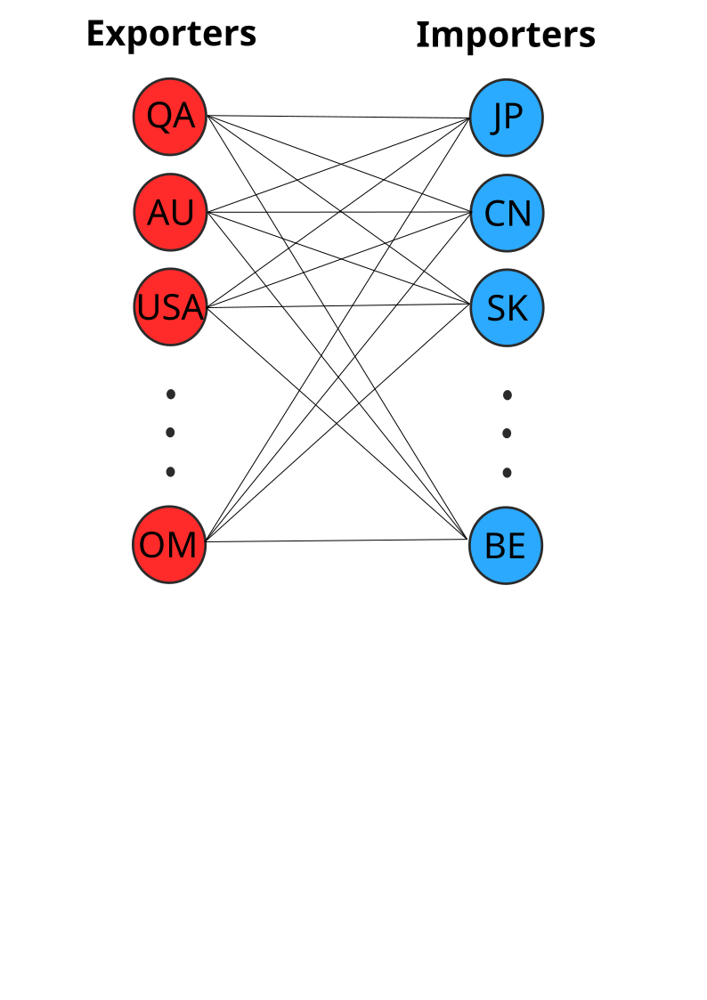

### 3.1 Data File and Functions

In [18]:
Supply = Exp_Nodes.set_index("Country")["Nominal Liquefaction Capacity (MMBtu)"].to_dict()
Supply_Jan = Exp_Nodes.set_index("Country")["Export Jan (MMBtu)"].to_dict()
Supply_Jun = Exp_Nodes.set_index("Country")["Export Jun (MMBtu)"].to_dict()
Supply_Aug = Exp_Nodes.set_index("Country")["Export Aug (MMBtu)"].to_dict()
Supply_Sep = Exp_Nodes.set_index("Country")["Export Sep (MMBtu)"].to_dict()
Supply_Nov = Exp_Nodes.set_index("Country")["Export Nov (MMBtu)"].to_dict()
Supply_Dec = Exp_Nodes.set_index("Country")["Export Dec (MMBtu)"].to_dict()
Supply_2019 = Exp_Nodes.set_index("Country")["Nominal Liquefaction Capacity 2019 (MMBtu)"].to_dict()
Supply_2030 = Exp_Nodes.set_index("Country")["Export 2030 (MMBtu)"].to_dict()
Supply_2040 = Exp_Nodes.set_index("Country")["Export 2040 (MMBtu)"].to_dict()
Supply_HC = Exp_Nodes.set_index("Country")["Nominal Liquefaction Capacity 2019 HC (MMBtu)"].to_dict()

#print(Supply)

Demand_Jan = Imp_Nodes.set_index("Country")["Import Jan (MMBtu)"].to_dict()
Demand_Feb = Imp_Nodes.set_index("Country")["Import Feb (MMBtu)"].to_dict()
Demand_Mar = Imp_Nodes.set_index("Country")["Import Mar (MMBtu)"].to_dict()
Demand_Apr = Imp_Nodes.set_index("Country")["Import Apr (MMBtu)"].to_dict()
Demand_May = Imp_Nodes.set_index("Country")["Import May (MMBtu)"].to_dict()
Demand_Jun = Imp_Nodes.set_index("Country")["Import Jun (MMBtu)"].to_dict()
Demand_Jul = Imp_Nodes.set_index("Country")["Import Jul (MMBtu)"].to_dict()
Demand_Aug = Imp_Nodes.set_index("Country")["Import Aug (MMBtu)"].to_dict()
Demand_Sep = Imp_Nodes.set_index("Country")["Import Sep (MMBtu)"].to_dict()
Demand_Oct = Imp_Nodes.set_index("Country")["Import Oct (MMBtu)"].to_dict()
Demand_Nov = Imp_Nodes.set_index("Country")["Import Nov (MMBtu)"].to_dict()
Demand_Dec = Imp_Nodes.set_index("Country")["Import Dec (MMBtu)"].to_dict()
Demand_2019 = Imp_Nodes.set_index("Country")["Import (MMBtu)"].to_dict()
Demand_2030 = Imp_Nodes.set_index("Country")["Import 2030 (MMBtu)"].to_dict()
Demand_2040 = Imp_Nodes.set_index("Country")["Import 2040 (MMBtu)"].to_dict()
Demand_2019_EU = Imp_Nodes.set_index("Country")["Import Europe +33% (MMBtu)"].to_dict()
Demand_2019_Asia = Imp_Nodes.set_index("Country")["Import Asia Pacific -20% (MMBtu)"].to_dict()

#print(Demand)

Cost = {}

for index in Total_Costs.index:
    for column in Total_Costs.columns:
        Cost[column, index] = Total_Costs.loc[index,column]
        
Cost_Suez_Closed = {}
        
for index in Total_Costs_Suez_Closed.index:
    for column in Total_Costs_Suez_Closed.columns:
        Cost_Suez_Closed[column, index] = Total_Costs_Suez_Closed.loc[index,column]
        
        
Cost_Tr_05 = {}
        
for index in Total_Costs_Tr_05.index:
    for column in Total_Costs_Tr_05.columns:
        Cost_Tr_05[column, index] = Total_Costs_Tr_05.loc[index,column]
        
Cost_Tr_20 = {}
        
for index in Total_Costs_Tr_20.index:
    for column in Total_Costs_Tr_20.columns:
        Cost_Tr_20[column, index] = Total_Costs_Tr_20.loc[index,column]
        
#Cost
#print(len(Cost))
#Demand_Dec
#Cost_Suez_Closed

CUS = list(Demand_2019.keys()) # Customer
SRC = list(Supply_2019.keys()) # Source
Supply_2019
Cost_Tr_05

{('Japan', 'Qatar'): 3.209437691221729,
 ('China', 'Qatar'): 3.1299978412031244,
 ('South Korea', 'Qatar'): 3.1674996863441693,
 ('India', 'Qatar'): 2.602707152776285,
 ('Taiwan', 'Qatar'): 3.059506644020708,
 ('Pakistan', 'Qatar'): 2.555248058170255,
 ('France', 'Qatar'): 3.325553224227776,
 ('Spain', 'Qatar'): 3.13612507536437,
 ('UK', 'Qatar'): 3.327956648658353,
 ('Italy', 'Qatar'): 3.1042773326486044,
 ('Turkey', 'Qatar'): 2.9964449011782714,
 ('Belgium', 'Qatar'): 3.3291585552311083,
 ('Other Asia Pacific', 'Qatar'): 2.9564223577519906,
 ('Other Europe', 'Qatar'): 3.397882106750829,
 ('Total North America', 'Qatar'): 3.8111854307815447,
 ('Total S. & C. America', 'Qatar'): 3.407755887966407,
 ('Total ME & Africa', 'Qatar'): 2.4896033615255364,
 ('Japan', 'Australia'): 8.036569407161423,
 ('China', 'Australia'): 8.068380234727938,
 ('South Korea', 'Australia'): 8.089288178627465,
 ('India', 'Australia'): 8.278558483292436,
 ('Taiwan', 'Australia'): 8.00554700318655,
 ('Pakistan', 

In [19]:
def LNG_Model_3(Demand, Supply):
    
    model = ConcreteModel()
    model.dual = Suffix(direction=Suffix.IMPORT)
    
    CUS = list(Demand.keys()) 
    SRC = list(Supply.keys()) 

    model.x = Var(CUS, SRC, domain = NonNegativeReals)

    
    model.Cost = Objective(expr = sum([Cost[c,s]*model.x[c,s] for c in CUS for s in SRC]), sense = minimize)

    
    model.src = ConstraintList()
    for s in SRC:
        model.src.add(sum([model.x[c,s] for c in CUS]) <= Supply[s])
        
    model.dmd = ConstraintList()
    for c in CUS:
        model.dmd.add(sum([model.x[c,s] for s in SRC]) == Demand[c])
    
    model.div = ConstraintList()
    for c in CUS:
        for s in SRC:
            model.div.add(model.x[c,s] <= (1/3) * Demand[c])
            
    
    return model

if __name__ == "__main__":
    
    model_2019_Jan = LNG_Model_3(Demand_Jan, Supply_Jan)
    results_2019_Jan = SolverFactory('glpk').solve(model_2019_Jan)
    
    model_2019_Feb = LNG_Model_3(Demand_Feb, Supply)
    results_2019_Feb = SolverFactory('glpk').solve(model_2019_Feb)
    
    model_2019_Mar = LNG_Model_3(Demand_Mar, Supply)
    results_2019_Mar = SolverFactory('glpk').solve(model_2019_Mar)
    
    model_2019_Apr = LNG_Model_3(Demand_Apr, Supply)
    results_2019_Apr = SolverFactory('glpk').solve(model_2019_Apr)
    
    model_2019_May = LNG_Model_3(Demand_May, Supply)
    results_2019_May = SolverFactory('glpk').solve(model_2019_May)
    
    model_2019_Jun = LNG_Model_3(Demand_Jun, Supply_Jun)
    results_2019_Jun = SolverFactory('glpk').solve(model_2019_Jun)
    
    model_2019_Jul = LNG_Model_3(Demand_Jul, Supply)
    results_2019_Jul = SolverFactory('glpk').solve(model_2019_Jul)
    
    model_2019_Aug = LNG_Model_3(Demand_Aug, Supply_Aug)
    results_2019_Aug = SolverFactory('glpk').solve(model_2019_Aug)
    
    model_2019_Sep = LNG_Model_3(Demand_Sep, Supply_Sep)
    results_2019_Sep = SolverFactory('glpk').solve(model_2019_Sep)
    
    model_2019_Oct = LNG_Model_3(Demand_Oct, Supply)
    results_2019_Oct = SolverFactory('glpk').solve(model_2019_Oct)
    
    model_2019_Nov = LNG_Model_3(Demand_Nov, Supply_Nov)
    results_2019_Nov = SolverFactory('glpk').solve(model_2019_Nov)
    
    model_2019_Dec = LNG_Model_3(Demand_Dec, Supply_Dec)
    results_2019_Dec = SolverFactory('glpk').solve(model_2019_Dec)
    
    results_2019_Feb.write()

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: unknown
  Lower bound: 7854610422.51401
  Upper bound: 7854610422.51401
  Number of objectives: 1
  Number of constraints: 288
  Number of variables: 256
  Number of nonzeros: 766
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Termination condition: optimal
  Statistics: 
    Branch and bound: 
      Number of bounded subproblems: 0
      Number of created subproblems: 0
  Error rc: 0
  Time: 0.015590190887451172
# ----------------------------------------------------------
#   Solution Information
# --------

### 3.2 January

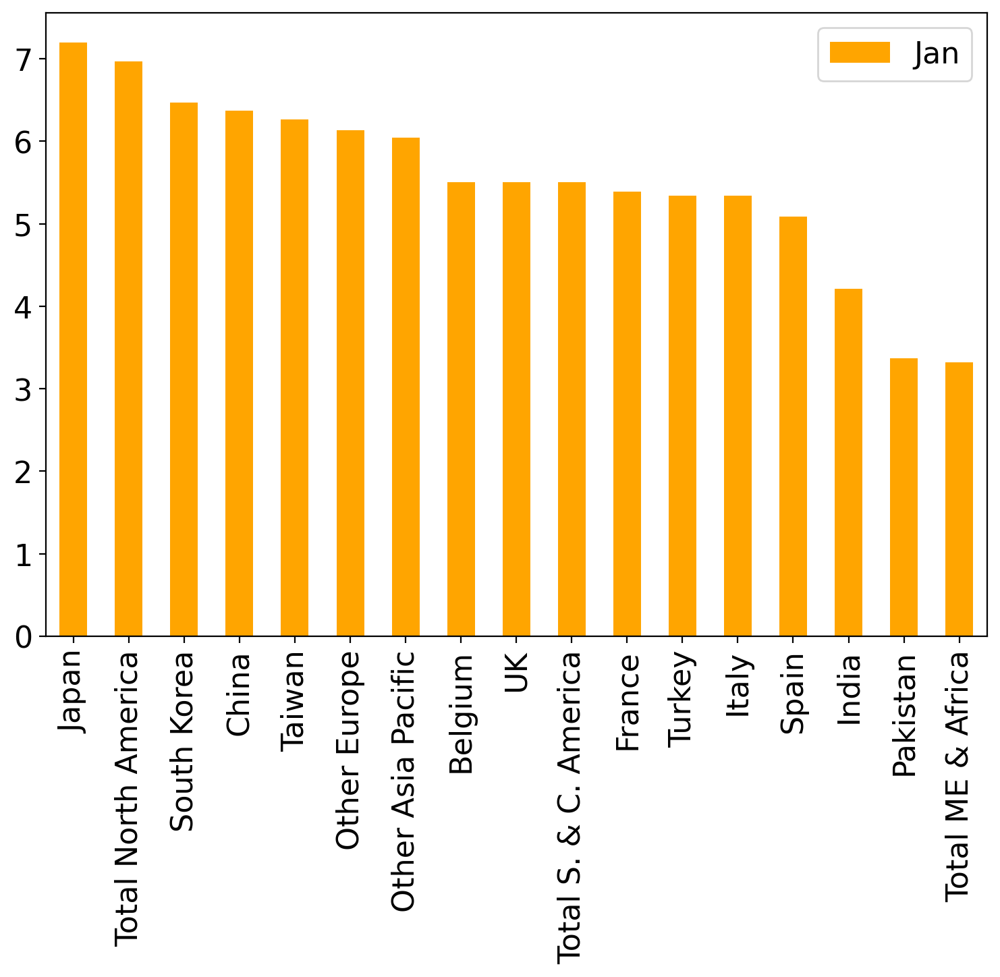

In [144]:
transported_LNG_3_Jan = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

Emissions_Jan = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_Jan.index:
    for importer in transported_LNG_3_Jan.columns:
        transported_LNG_3_Jan.loc[exporter, importer] = model_2019_Jan.x[importer, exporter]() / MMBtu_Gas / 1000000000
        
        
Merit_Order_3_Jan = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))


for i in transported_LNG_3_Jan.index:
    for j in transported_LNG_3_Jan.columns:
        if transported_LNG_3_Jan.loc[i,j] > 0:
            Merit_Order_3_Jan.loc[i,j] = TotalCosts.loc[i,j]

Merit_Order_3_Jan

Sum_3_Jan = Merit_Order_3_Jan * transported_LNG_3_Jan * MMBtu_Gas * 1000000000

DES_Pr_3_Jan = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Jan.columns))),
                   
                   index = ["Jan"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Jan = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Jan.columns))),
                   
                   index = ["Jan"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Jan.loc["Jan"] = [10.5651, 9.2547, 6.279, 2.83, 2.2386, 1.1288, 1.632, 1.42, 1.741, 1.074, 2.353, 0.585, 1.7, 1.9584, 0.911, 0.3536, 0.0952]

Imp_3_Jan *= 10**9 * MMBtu_Gas
Imp_3_Jan

for column in Sum_3_Jan.columns:
    DES_Pr_3_Jan.loc["Jan", column] = Sum_3_Jan[column].sum()


DES_Pri_3_Jan = DES_Pr_3_Jan / Imp_3_Jan
DES_Price_3_Jan = DES_Pri_3_Jan.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_Jan.sort_values(by="Jan", ascending=False, inplace = True)

plt.rcParams['figure.dpi'] = 200
DES_Price_3_Jan.plot(kind = 'bar', color = 'orange', figsize=(9,6))
#transported_LNG_3_Jan
plt.savefig("Jan.svg")

### 3.3 February

#### February DES Price 

<AxesSubplot:>

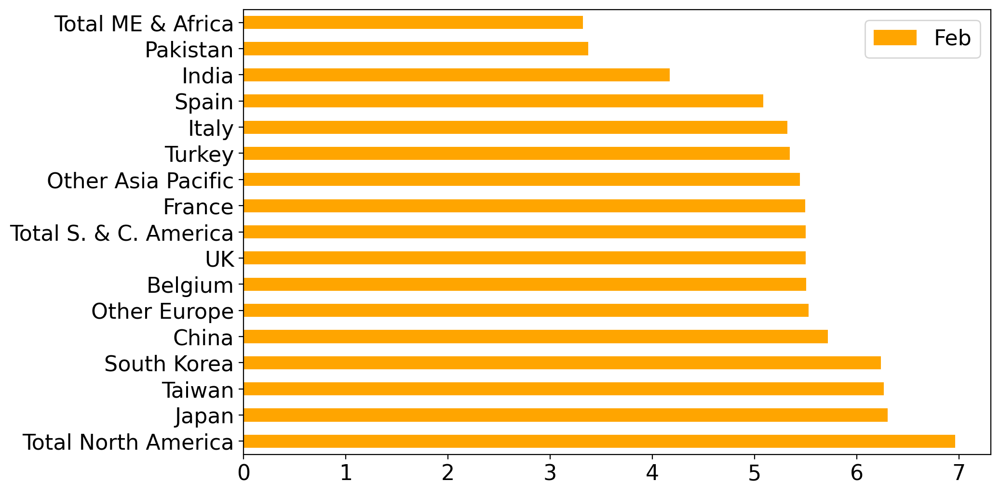

In [146]:
transported_LNG_3_Feb = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

Emissions_Feb = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_Feb.index:
    for importer in transported_LNG_3_Feb.columns:
        transported_LNG_3_Feb.loc[exporter, importer] = model_2019_Feb.x[importer, exporter]() / MMBtu_Gas / 1000000000
        
        
Merit_Order_3_Feb = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))


for i in transported_LNG_3_Feb.index:
    for j in transported_LNG_3_Feb.columns:
        if transported_LNG_3_Feb.loc[i,j] > 0:
            Merit_Order_3_Feb.loc[i,j] = TotalCosts.loc[i,j]


Sum_3_Feb = Merit_Order_3_Feb * transported_LNG_3_Feb * MMBtu_Gas * 1000000000

DES_Pr_3_Feb = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Feb.columns))),
                   
                   index = ["Feb"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Feb = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Feb.columns))),
                   
                   index = ["Feb"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Feb.loc["Feb"] = [10.30575, 5.93775, 4.095, 2.56, 1.46055, 0.9248, 1.83, 1.374, 1.17, 0.93, 1.782, 0.299, 1.768, 1.8496, 0.6528, 1.02, 0.3536]

Imp_3_Feb *= 10**9 * MMBtu_Gas
Imp_3_Feb

for column in Sum_3_Feb.columns:
    DES_Pr_3_Feb.loc["Feb", column] = Sum_3_Feb[column].sum()


DES_Pri_3_Feb = DES_Pr_3_Feb / Imp_3_Feb
DES_Price_3_Feb = DES_Pri_3_Feb.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_Feb.sort_values(by="Feb", ascending=False, inplace = True)

DES_Price_3_Feb.plot(kind = 'barh', color = 'orange', figsize=(10,6))

### 3.4 March

#### March DES Price

<AxesSubplot:>

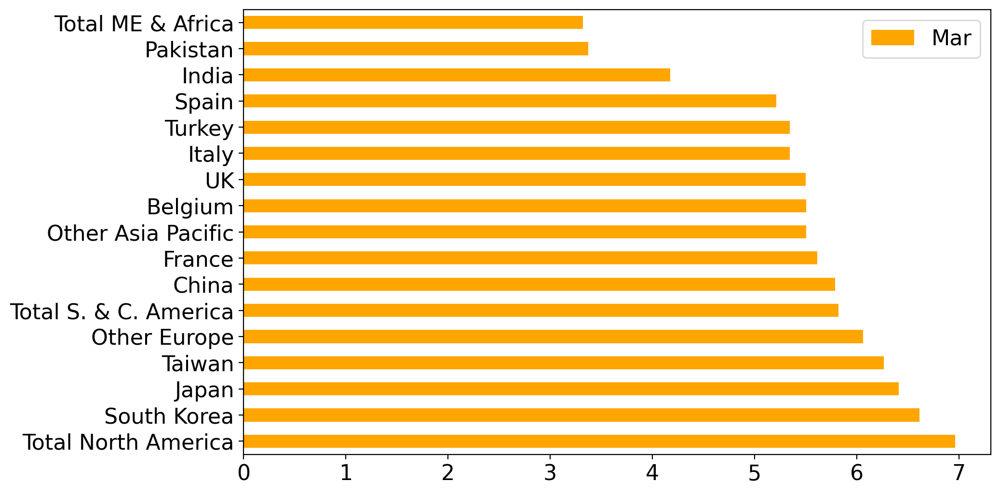

In [149]:
transported_LNG_3_Mar = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_Mar.index:
    for importer in transported_LNG_3_Mar.columns:
        transported_LNG_3_Mar.loc[exporter, importer] = model_2019_Mar.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_3_Mar = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for i in transported_LNG_3_Mar.index:
    for j in transported_LNG_3_Mar.columns:
        if transported_LNG_3_Mar.loc[i,j] > 0:
            Merit_Order_3_Mar.loc[i,j] = TotalCosts.loc[i,j]

Sum_3_Mar = Merit_Order_3_Mar * transported_LNG_3_Mar * MMBtu_Gas * 1000000000

DES_Pr_3_Mar = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Mar.columns))),
                   
                   index = ["Mar"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Mar = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Mar.columns))),
                   
                   index = ["Mar"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Mar.loc["Mar"] = [10.22385, 5.5419, 3.78105, 2.38, 2.0475, 1.2104, 2.335, 1.493, 1.78, 1.605, 1.4, 1.115, 2.1986, 1.6864, 0.9656, 0.9112, 0.1768]

Imp_3_Mar *= 10**9 * MMBtu_Gas
Imp_3_Mar

for column in Sum_3_Mar.columns:
    DES_Pr_3_Mar.loc["Mar", column] = Sum_3_Mar[column].sum()


DES_Pri_3_Mar = DES_Pr_3_Mar / Imp_3_Mar
DES_Price_3_Mar = DES_Pri_3_Mar.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_Mar.sort_values(by="Mar", ascending=False, inplace = True)

DES_Price_3_Mar.plot(kind = 'barh', color = 'orange', figsize=(10,6))

### 3.5 April

In [150]:
transported_LNG_3_Apr = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_Apr.index:
    for importer in transported_LNG_3_Apr.columns:
        transported_LNG_3_Apr.loc[exporter, importer] = model_2019_Apr.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_3_Apr = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for i in transported_LNG_3_Apr.index:
    for j in transported_LNG_3_Apr.columns:
        if transported_LNG_3_Apr.loc[i,j] > 0:
            Merit_Order_3_Apr.loc[i,j] = TotalCosts.loc[i,j]

#### April DES Price

<AxesSubplot:>

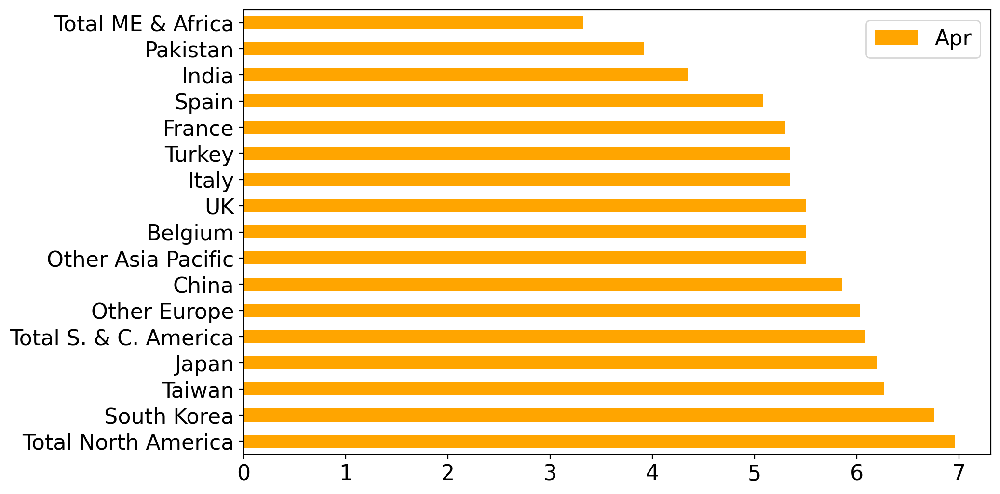

In [151]:
Sum_3_Apr = Merit_Order_3_Apr * transported_LNG_3_Apr * MMBtu_Gas * 1000000000

DES_Pr_3_Apr = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Apr.columns))),
                   
                   index = ["Apr"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Apr = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Apr.columns))),
                   
                   index = ["Apr"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Apr.loc["Apr"] = [7.7532, 6.1971, 3.9585, 2.62, 2.0748, 1.1832, 2.572, 1.596, 2.244, 1.115, 0.707, 0.8074, 2.2168, 2.1624, 1.02, 1.0744, 0.748]

Imp_3_Apr *= 10**9 * MMBtu_Gas
Imp_3_Apr

for column in Sum_3_Apr.columns:
    DES_Pr_3_Apr.loc["Apr", column] = Sum_3_Apr[column].sum()


DES_Pri_3_Apr = DES_Pr_3_Apr / Imp_3_Apr
DES_Price_3_Apr = DES_Pri_3_Apr.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_Apr.sort_values(by="Apr", ascending=False, inplace = True)

DES_Price_3_Apr.plot(kind = 'barh', color = 'orange', figsize=(10,6))

### 3.6 May

In [152]:
transported_LNG_3_May = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_May.index:
    for importer in transported_LNG_3_May.columns:
        transported_LNG_3_May.loc[exporter, importer] = model_2019_May.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_3_May = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for i in transported_LNG_3_May.index:
    for j in transported_LNG_3_May.columns:
        if transported_LNG_3_May.loc[i,j] > 0:
            Merit_Order_3_May.loc[i,j] = TotalCosts.loc[i,j]

#### May DES PRice

<AxesSubplot:>

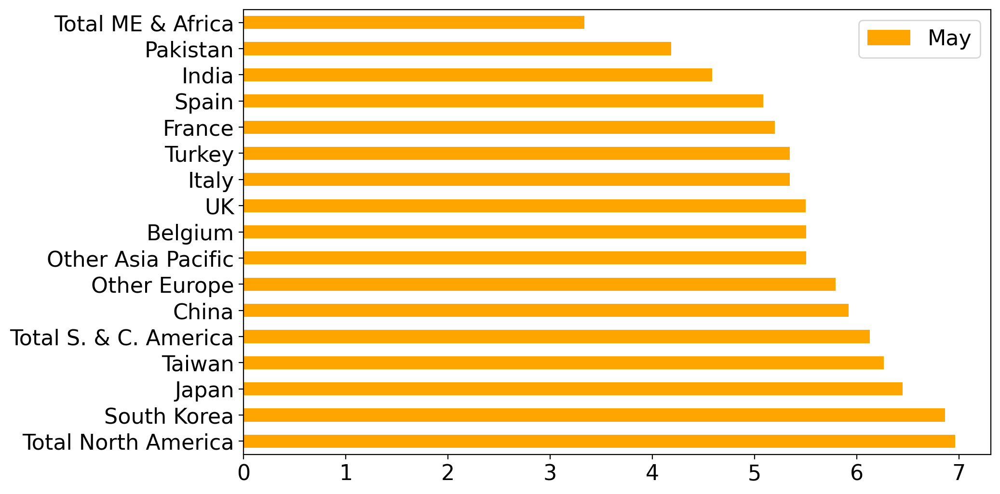

In [153]:
Sum_3_May = Merit_Order_3_May * transported_LNG_3_May * MMBtu_Gas * 1000000000

DES_Pr_3_May = pd.DataFrame(np.zeros((1,len(Merit_Order_3_May.columns))),
                   
                   index = ["May"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_May = pd.DataFrame(np.zeros((1,len(Merit_Order_3_May.columns))),
                   
                   index = ["May"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_May.loc["May"] = [7.7259, 6.04695, 4.05405, 2.75, 2.03385, 1.1152, 1.832, 1.656, 2.19, 1.115, 0.503, 0.7028, 2.9784, 2.4072, 0.9656, 1.1424, 1.4144]

Imp_3_May *= 10**9 * MMBtu_Gas
Imp_3_May

for column in Sum_3_May.columns:
    DES_Pr_3_May.loc["May", column] = Sum_3_May[column].sum()


DES_Pri_3_May = DES_Pr_3_May / Imp_3_May
DES_Price_3_May = DES_Pri_3_May.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_May.sort_values(by="May", ascending=False, inplace = True)

DES_Price_3_May.plot(kind = 'barh', color = 'orange', figsize=(10,6))

### 3.7 June

In [154]:
transported_LNG_3_Jun = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_Jun.index:
    for importer in transported_LNG_3_Jun.columns:
        transported_LNG_3_Jun.loc[exporter, importer] = model_2019_Jun.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_3_Jun = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for i in transported_LNG_3_Jun.index:
    for j in transported_LNG_3_Jun.columns:
        if transported_LNG_3_Jun.loc[i,j] > 0:
            Merit_Order_3_Jun.loc[i,j] = TotalCosts.loc[i,j]


#### June DES Price

<AxesSubplot:>

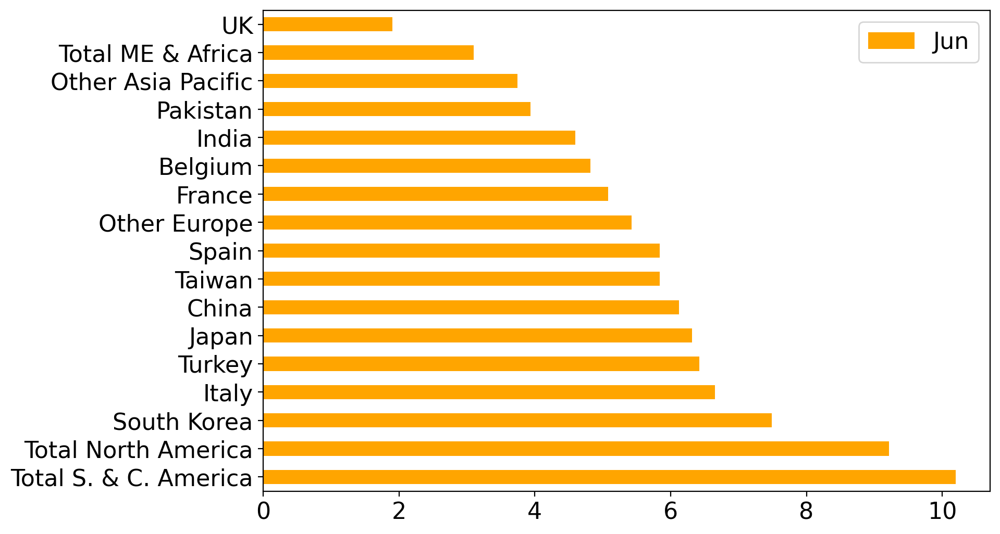

In [155]:
Sum_3_Jun = Merit_Order_3_Jun * transported_LNG_3_Jun * MMBtu_Gas * 1000000000

DES_Pr_3_Jun = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Jun.columns))),
                   
                   index = ["Jun"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Jun = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Jun.columns))),
                   
                   index = ["Jun"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Jun.loc["Jun"] = [7.7259, 6.04695, 4.05405, 2.75, 2.03385, 1.1152, 1.832, 1.656, 2.19, 1.115, 0.503, 0.7028, 2.9784, 2.4072, 0.9656, 1.1424, 1.4144]

Imp_3_Jun *= 10**9 * MMBtu_Gas
Imp_3_Jun

for column in Sum_3_Jun.columns:
    DES_Pr_3_Jun.loc["Jun", column] = Sum_3_Jun[column].sum()


DES_Pri_3_Jun = DES_Pr_3_Jun / Imp_3_Jun
DES_Price_3_Jun = DES_Pri_3_Jun.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_Jun.sort_values(by="Jun", ascending=False, inplace = True)

DES_Price_3_Jun.plot(kind = 'barh', color = 'orange', figsize=(9,6))

### 3.8 July

In [156]:
transported_LNG_3_Jul = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_Jul.index:
    for importer in transported_LNG_3_Jul.columns:
        transported_LNG_3_Jul.loc[exporter, importer] = model_2019_Jul.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_3_Jul = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for i in transported_LNG_3_Jul.index:
    for j in transported_LNG_3_Jul.columns:
        if transported_LNG_3_Jul.loc[i,j] > 0:
            Merit_Order_3_Jul.loc[i,j] = TotalCosts.loc[i,j]


#### July DES Price

<AxesSubplot:>

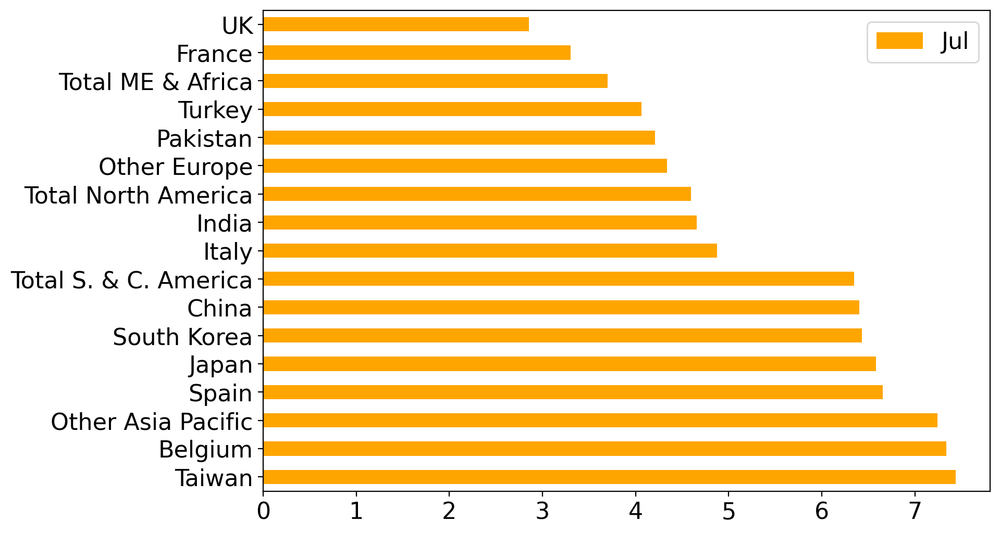

In [157]:
Sum_3_Jul = Merit_Order_3_Jul * transported_LNG_3_Jul * MMBtu_Gas * 1000000000

DES_Pr_3_Jul = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Jul.columns))),
                   
                   index = ["Jul"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Jul = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Jul.columns))),
                   
                   index = ["Jul"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Jul.loc["Jul"] = [7.2345, 6.18345, 4.54545, 2.73, 1.89735, 1.0744, 1.739, 1.903, 0.76, 1.387, 0.68, 0.6528, 2.0264, 2.312, 1.2784, 1.904, 1.3192]

Imp_3_Jul *= 10**9 * MMBtu_Gas
Imp_3_Jul

for column in Sum_3_Jul.columns:
    DES_Pr_3_Jul.loc["Jul", column] = Sum_3_Jul[column].sum()


DES_Pri_3_Jul = DES_Pr_3_Jul / Imp_3_Jul
DES_Price_3_Jul = DES_Pri_3_Jul.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_Jul.sort_values(by="Jul", ascending=False, inplace = True)

DES_Price_3_Jul.plot(kind = 'barh', color = 'orange', figsize=(9,6))

### 3.9 August

In [158]:
transported_LNG_3_Aug = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_Aug.index:
    for importer in transported_LNG_3_Aug.columns:
        transported_LNG_3_Aug.loc[exporter, importer] = model_2019_Aug.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_3_Aug = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for i in transported_LNG_3_Aug.index:
    for j in transported_LNG_3_Aug.columns:
        if transported_LNG_3_Aug.loc[i,j] > 0:
            Merit_Order_3_Aug.loc[i,j] = TotalCosts.loc[i,j]


#### August DES Price

<AxesSubplot:>

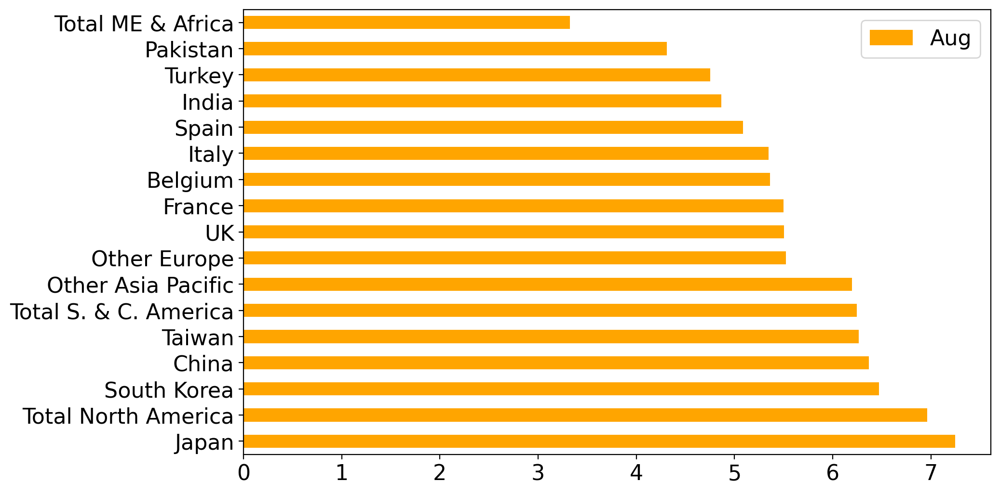

In [159]:
Sum_3_Aug = Merit_Order_3_Aug * transported_LNG_3_Aug * MMBtu_Gas * 1000000000

DES_Pr_3_Aug = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Aug.columns))),
                   
                   index = ["Aug"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Aug = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Aug.columns))),
                   
                   index = ["Aug"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Aug.loc["Aug"] = [8.463, 7.5075, 4.914, 2.82, 1.8837, 1.0064, 1.638, 2.144, 0.19, 1.265, 0.816, 0.9112, 2.4888, 1.9176, 1.088, 1.7408, 1.8496]

Imp_3_Aug *= 10**9 * MMBtu_Gas
Imp_3_Aug

for column in Sum_3_Aug.columns:
    DES_Pr_3_Aug.loc["Aug", column] = Sum_3_Aug[column].sum()


DES_Pri_3_Aug = DES_Pr_3_Aug / Imp_3_Aug
DES_Price_3_Aug = DES_Pri_3_Aug.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_Aug.sort_values(by="Aug", ascending=False, inplace = True)

DES_Price_3_Aug.plot(kind = 'barh', color = 'orange', figsize=(10,6))

### 3.10 September

In [160]:
transported_LNG_3_Sep = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_Sep.index:
    for importer in transported_LNG_3_Sep.columns:
        transported_LNG_3_Sep.loc[exporter, importer] = model_2019_Sep.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_3_Sep = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for i in transported_LNG_3_Sep.index:
    for j in transported_LNG_3_Sep.columns:
        if transported_LNG_3_Sep.loc[i,j] > 0:
            Merit_Order_3_Sep.loc[i,j] = TotalCosts.loc[i,j]


#### September DES Price

<AxesSubplot:>

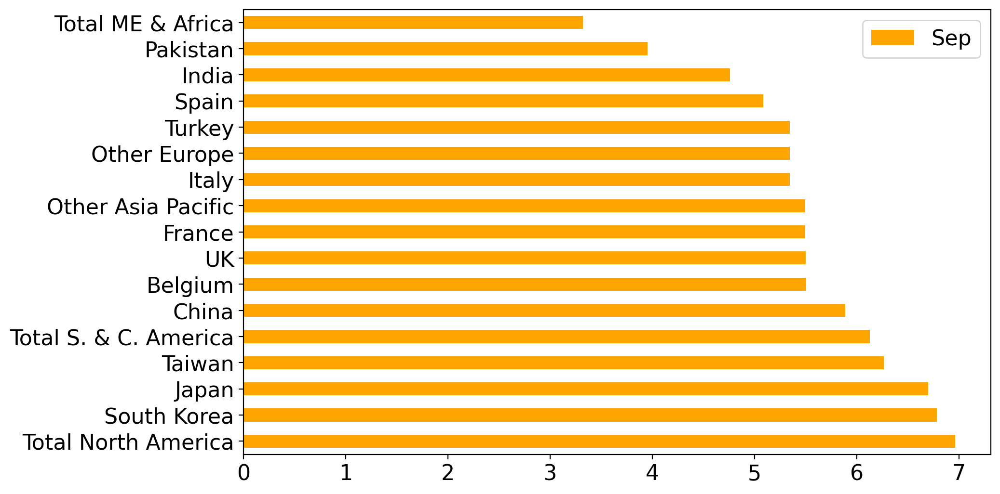

In [161]:
Sum_3_Sep = Merit_Order_3_Sep * transported_LNG_3_Sep * MMBtu_Gas * 1000000000

DES_Pr_3_Sep = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Sep.columns))),
                   
                   index = ["Sep"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Sep = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Sep.columns))),
                   
                   index = ["Sep"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Sep.loc["Sep"] = [8.94075, 6.92055, 3.4125, 2.79, 2.0475, 0.9928, 1.2745, 2.139, 1.3, 1.13, 0.558, 0.2856, 2.3256, 1.8088, 1.0064, 1.0472, 1.5776]

Imp_3_Sep *= 10**9 * MMBtu_Gas
Imp_3_Sep

for column in Sum_3_Sep.columns:
    DES_Pr_3_Sep.loc["Sep", column] = Sum_3_Sep[column].sum()


DES_Pri_3_Sep = DES_Pr_3_Sep / Imp_3_Sep
DES_Price_3_Sep = DES_Pri_3_Sep.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_Sep.sort_values(by="Sep", ascending=False, inplace = True)

DES_Price_3_Sep.plot(kind = 'barh', color = 'orange', figsize=(10,6))

### 3.11 October

In [162]:
transported_LNG_3_Oct = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_Oct.index:
    for importer in transported_LNG_3_Oct.columns:
        transported_LNG_3_Oct.loc[exporter, importer] = model_2019_Oct.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_3_Oct = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for i in transported_LNG_3_Oct.index:
    for j in transported_LNG_3_Oct.columns:
        if transported_LNG_3_Oct.loc[i,j] > 0:
            Merit_Order_3_Oct.loc[i,j] = TotalCosts.loc[i,j]


#### October DES Price

<AxesSubplot:>

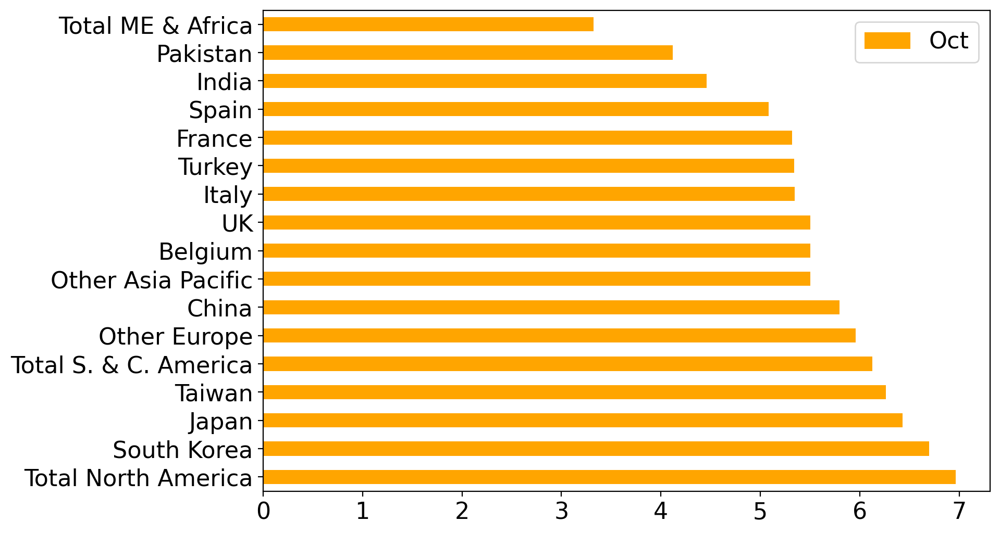

In [163]:
Sum_3_Oct = Merit_Order_3_Oct * transported_LNG_3_Oct * MMBtu_Gas * 1000000000

DES_Pr_3_Oct = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Oct.columns))),
                   
                   index = ["Oct"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Oct = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Oct.columns))),
                   
                   index = ["Oct"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Oct.loc["Oct"] = [8.85885, 5.6511, 4.368, 2.83, 2.00655, 1.0608, 1.7745, 1.95, 1.85, 1.35, 0.843, 0.7616, 2.1986, 2.0944, 0.9248, 0.8024, 1.1016]

Imp_3_Oct *= 10**9 * MMBtu_Gas
Imp_3_Oct

for column in Sum_3_Oct.columns:
    DES_Pr_3_Oct.loc["Oct", column] = Sum_3_Oct[column].sum()


DES_Pri_3_Oct = DES_Pr_3_Oct / Imp_3_Oct
DES_Price_3_Oct = DES_Pri_3_Oct.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_Oct.sort_values(by="Oct", ascending=False, inplace = True)

DES_Price_3_Oct.plot(kind = 'barh', color = 'orange', figsize=(9,6))

### 3.12 November

In [164]:
transported_LNG_3_Nov = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_Nov.index:
    for importer in transported_LNG_3_Nov.columns:
        transported_LNG_3_Nov.loc[exporter, importer] = model_2019_Nov.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_3_Nov = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for i in transported_LNG_3_Nov.index:
    for j in transported_LNG_3_Nov.columns:
        if transported_LNG_3_Nov.loc[i,j] > 0:
            Merit_Order_3_Nov.loc[i,j] = TotalCosts.loc[i,j]


#### November DES Price

<AxesSubplot:>

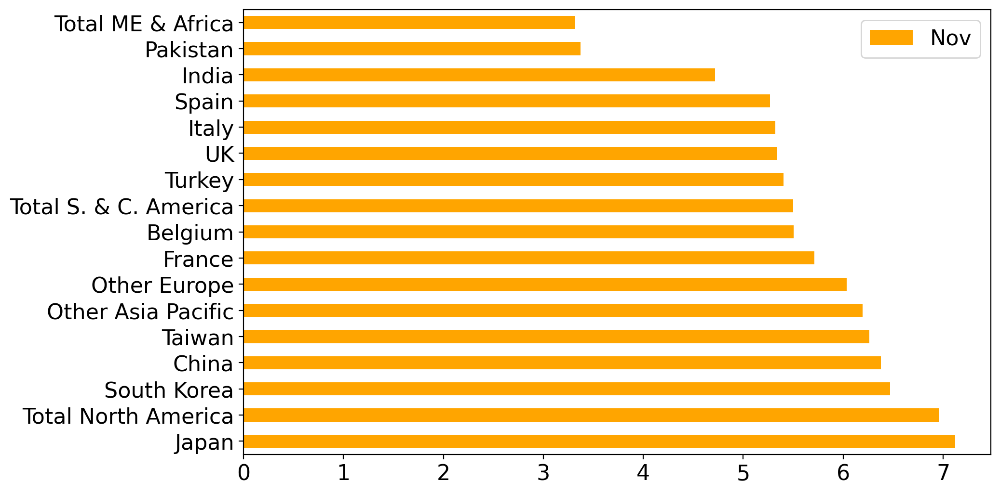

In [165]:
Sum_3_Nov = Merit_Order_3_Nov * transported_LNG_3_Nov * MMBtu_Gas * 1000000000

DES_Pr_3_Nov = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Nov.columns))),
                   
                   index = ["Nov"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Nov = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Nov.columns))),
                   
                   index = ["Nov"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Nov.loc["Nov"] = [8.83155, 8.66775, 5.1597, 2.79, 1.51515, 0.6664, 2.84, 1.931, 2.4, 0.94, 1.115, 1.0336, 3.876, 2.2848, 0.5984, 0.9384, 0.476]

Imp_3_Nov *= 10**9 * MMBtu_Gas
Imp_3_Nov

for column in Sum_3_Nov.columns:
    DES_Pr_3_Nov.loc["Nov", column] = Sum_3_Nov[column].sum()


DES_Pri_3_Nov = DES_Pr_3_Nov / Imp_3_Nov
DES_Price_3_Nov = DES_Pri_3_Nov.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_Nov.sort_values(by="Nov", ascending=False, inplace = True)

DES_Price_3_Nov.plot(kind = 'barh', color = 'orange', figsize=(10,6))

### 3.13 December

In [166]:
transported_LNG_3_Dec = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_Dec.index:
    for importer in transported_LNG_3_Dec.columns:
        transported_LNG_3_Dec.loc[exporter, importer] = model_2019_Dec.x[importer, exporter]() / MMBtu_Gas / 10**9


Merit_Order_3_Dec = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for i in transported_LNG_3_Dec.index:
    for j in transported_LNG_3_Dec.columns:
        if transported_LNG_3_Dec.loc[i,j] > 0:
            Merit_Order_3_Dec.loc[i,j] = TotalCosts.loc[i,j]


#### December DES Price

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,0.981784,3.435250,2.170350,0.943333,0.5915,0.3264,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.382667,0.000000,0.000000,0.000000,0.092
Australia,3.139500,3.435250,2.170350,0.211626,0.5915,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.382667,0.000000,0.000000,0.000000,0.000
USA,0.000000,0.000000,0.000000,0.000000,0.0000,0.0000,0.853333,0.603333,1.016667,0.366667,0.630000,0.330933,0.000000,0.693600,0.321867,0.048712,0.000
Russia,3.139500,0.000000,0.316255,0.000000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.207494,0.000000,0.000000,0.000
Malaysia,0.000000,2.542887,0.000000,0.000000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.382667,0.000000,0.000000,0.000000,0.000
Nigeria,0.000000,0.000000,0.000000,0.000000,0.0000,0.0000,0.853333,0.000000,0.420676,0.366667,0.391608,0.000000,0.000000,0.639138,0.000000,0.185867,0.000
Trinidad & Tobago,0.000000,0.000000,0.000000,0.000000,0.0000,0.0000,0.518913,0.000000,0.595991,0.000000,0.000000,0.330933,0.000000,0.000000,0.321867,0.137155,0.000
Algeria,0.000000,0.000000,0.000000,0.000000,0.0000,0.0000,0.334420,0.603333,1.016667,0.366667,0.630000,0.330933,0.000000,0.000000,0.000000,0.000000,0.000
Indonesia,0.085639,0.892363,1.854095,0.000000,0.5915,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000
Oman,0.000000,0.000000,0.000000,0.920149,0.0000,0.3264,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.092


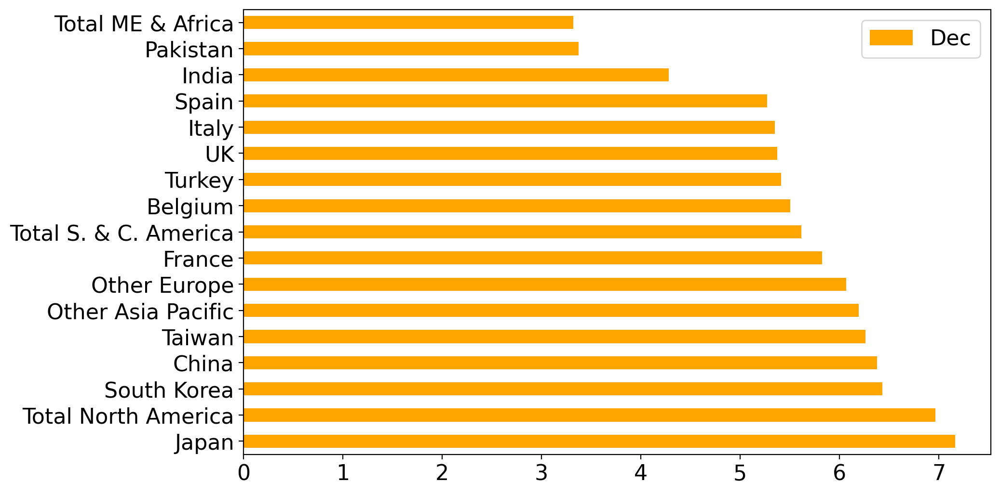

In [167]:
Sum_3_Dec = Merit_Order_3_Dec * transported_LNG_3_Dec * MMBtu_Gas * 1000000000

DES_Pr_3_Dec = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Dec.columns))),
                   
                   index = ["Dec"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Dec = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Dec.columns))),
                   
                   index = ["Dec"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_Dec.loc["Dec"] = [9.4185, 10.30575, 6.51105, 2.83, 1.7745, 0.9792, 2.56, 1.81, 3.05, 1.1, 1.89, 0.9928, 4.148, 2.0808, 0.9656, 0.5576, 0.276]

Imp_3_Dec *= 10**9 * MMBtu_Gas
Imp_3_Dec

for column in Sum_3_Dec.columns:
    DES_Pr_3_Dec.loc["Dec", column] = Sum_3_Dec[column].sum()


DES_Pri_3_Dec = DES_Pr_3_Dec / Imp_3_Dec
DES_Price_3_Dec = DES_Pri_3_Dec.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_Dec.sort_values(by="Dec", ascending=False, inplace = True)

DES_Price_3_Dec.plot(kind = 'barh', color = 'orange', figsize=(10,6))
transported_LNG_3_Dec

## 4. Baseline (2019)

### 4.1 Monthly DES Prices

/tmp/ipykernel_18619/675928728.py:2: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/675928728.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/675928728.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/675928728.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/675928728.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/675928728.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future versi

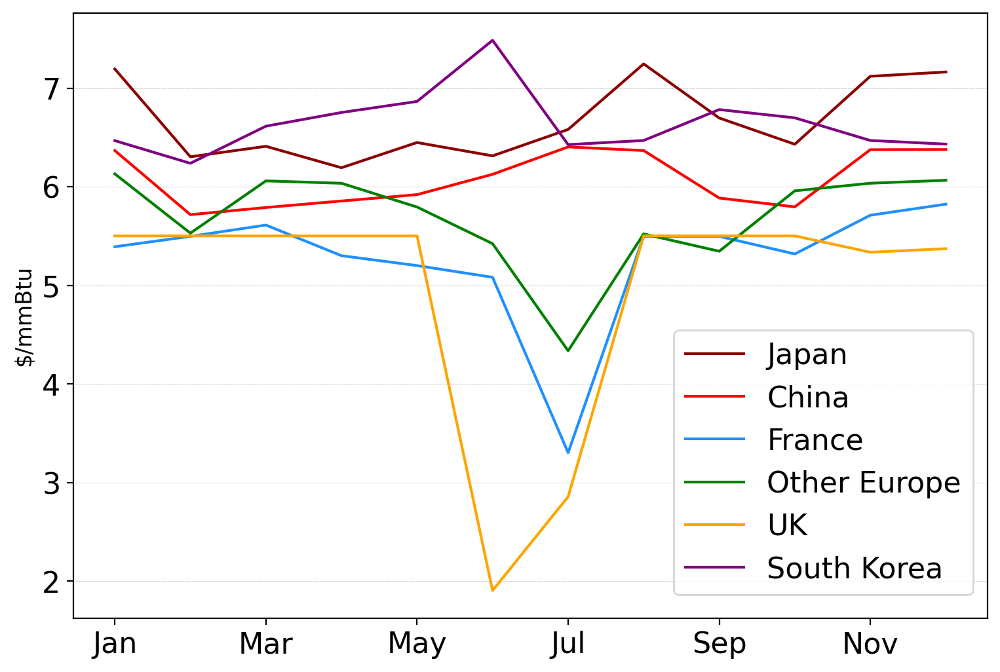

<Figure size 1280x960 with 0 Axes>

In [169]:
Des_2019 = DES_Pri_3_Jan
Des_2019 = Des_2019.append(DES_Pri_3_Feb)
Des_2019 = Des_2019.append(DES_Pri_3_Mar)
Des_2019 = Des_2019.append(DES_Pri_3_Apr)
Des_2019 = Des_2019.append(DES_Pri_3_May)
Des_2019 = Des_2019.append(DES_Pri_3_Jun)
Des_2019 = Des_2019.append(DES_Pri_3_Jul)
Des_2019 = Des_2019.append(DES_Pri_3_Aug)
Des_2019 = Des_2019.append(DES_Pri_3_Sep)
Des_2019 = Des_2019.append(DES_Pri_3_Oct)
Des_2019 = Des_2019.append(DES_Pri_3_Nov)
Des_2019 = Des_2019.append(DES_Pri_3_Dec)

Des_2019

ax = plt.gca()

Des_2019.plot(kind='line', y='Japan', color = 'darkred', ax=ax, figsize = (9, 6))
Des_2019.plot(kind='line',y='China', ax=ax, color = 'red')
Des_2019.plot(kind='line',y='France', ax=ax, color = 'dodgerblue')
Des_2019.plot(kind='line',y='Other Europe', ax=ax, color = 'green')
Des_2019.plot(kind='line',y='UK', ax=ax, color = 'orange')
Des_2019.plot(kind='line',y='South Korea', ax=ax, color = 'purple')
#Des_2019.plot(kind='line',y='Pakistan', ax=ax, color = 'grey')


#ax.set_xlabel(fontsize = 12)
ax.set_ylabel("$/mmBtu", fontsize = 12)
plt.legend(bbox_to_anchor=(1, 0.5))
plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)
plt.show()
plt.savefig("Monthly_DES_Prices_2019.svg")
#Des_2019

### 4.2 Monthly Costs 

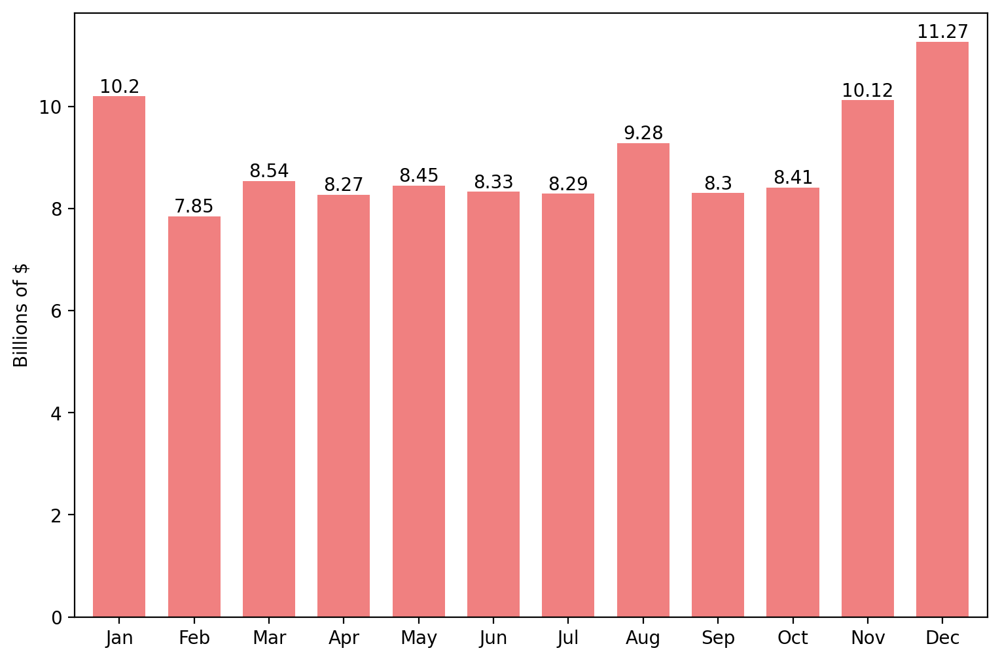

<Figure size 1280x960 with 0 Axes>

In [44]:
Monthly_Costs = pd.DataFrame([(round(model_2019_Jan.Cost() / 10**9, 2),
               round(model_2019_Feb.Cost() / 10**9, 2),
               round(model_2019_Mar.Cost() / 10**9, 2),
               round(model_2019_Apr.Cost() / 10**9, 2),
               round(model_2019_May.Cost() / 10**9, 2),
               round(model_2019_Jun.Cost() / 10**9, 2),
               round(model_2019_Jul.Cost() / 10**9, 2),
               round(model_2019_Aug.Cost() / 10**9, 2),
               round(model_2019_Sep.Cost() / 10**9, 2),
               round(model_2019_Oct.Cost() / 10**9, 2),
               round(model_2019_Nov.Cost() / 10**9, 2),
               round(model_2019_Dec.Cost() / 10**9, 2))],
                   
                   index = ["Monthly Costs for Imported LNG"], #"Import (MMBtu)"
    
                   columns = ["Jan", "Feb", "Mar", "Apr", "May", "Jun",
                              "Jul", "Aug","Sep", "Oct", "Nov", "Dec"]).T


ax = Monthly_Costs.plot(figsize = (9, 6), kind="bar", color="lightcoral", rot=0, width=0.7)
for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("Billions of $")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()
plt.savefig("Monthly_Costs_for_Imported_LNG.svg")

### 4.3 Transported Volumes

In [45]:
Transported_LNG_2019 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

Transported_LNG_2019 = transported_LNG_3_Jan + transported_LNG_3_Feb + transported_LNG_3_Mar + transported_LNG_3_Apr + transported_LNG_3_May + transported_LNG_3_Jun + transported_LNG_3_Jul + transported_LNG_3_Aug + transported_LNG_3_Sep + transported_LNG_3_Oct + transported_LNG_3_Nov + transported_LNG_3_Dec
Transported_LNG_2019

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,22.378983,28.291900,18.541250,10.906667,7.7441,4.143467,0.000000,0.000000,0.000000,0.000000,0.498667,0.000000,10.196933,0.000000,0.000000e+00,0.000000,3.618933
Australia,35.185150,15.659982,18.117917,0.771832,7.7441,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.926849,0.000000,-1.034803e-16,0.000000,0.000000
USA,2.384654,0.000000,0.000000,0.000000,0.0000,0.025179,7.691000,7.302000,6.356467,4.718098,4.388000,3.005733,0.000000,8.146400,3.739933e+00,3.326003,0.000000
Russia,33.383157,0.000000,1.361357,0.000000,0.0000,0.000000,0.000000,0.000000,0.012955,0.000000,0.000000,0.353374,0.000000,4.138255,0.000000e+00,0.000000,0.000000
Malaysia,0.000000,26.738380,5.603173,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.717947,0.000000,0.000000e+00,0.000000,0.000000
Nigeria,0.000000,0.000000,0.000000,2.634700,0.0000,0.000000,4.748333,5.709992,0.843045,4.758667,3.533682,0.000000,0.676916,3.244569,0.000000e+00,4.463896,0.000000
Trinidad & Tobago,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,4.332137,0.000000,5.500466,0.025205,0.000000,2.652359,0.000000,0.181218,3.739933e+00,3.977882,0.000000
Algeria,0.000000,0.000000,0.000000,0.110508,0.0000,0.004636,6.301530,7.302000,6.356467,4.758667,4.388000,3.005733,0.000000,2.936958,0.000000e+00,0.000000,0.000000
Indonesia,1.244263,14.185438,8.203694,0.000000,7.7441,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.303905,0.000000,0.000000e+00,0.000000,0.000000
Oman,0.000000,0.000000,0.000000,7.687506,0.0000,3.046944,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,3.607150


### 4.4 LNG Shippments Table and Sankey Diagram

In [46]:
colours_exp = ["steelblue", "orange", "mediumseagreen", "lightcoral", "purple", "peru",
           "deeppink", "gray", "gold", "turquoise", "cornflowerblue", "lime",
           "teal",  "darksalmon", "slateblue"]

colours_imp = ["crimson", "red", "lightskyblue", "saddlebrown", "lightsalmon", "seagreen",
                   "dodgerblue", "darkorange", "mediumblue", "limegreen", "darkred", "indigo",
                   "yellow", "purple", "steelblue", "seagreen", "springgreen"]

In [47]:
# Generate a colour pallet to let us colour in each line
palette = sns.color_palette("pastel", len(Transported_LNG_2019.index))
colours = palette.as_hex()

colours_exp = ["steelblue", "orange", "mediumseagreen", "lightcoral", "purple", "peru",
           "deeppink", "gray", "gold", "turquoise", "cornflowerblue", "lime",
           "teal",  "darksalmon", "slateblue"]

colours_imp = ["crimson", "red", "lightskyblue", "saddlebrown", "lightsalmon", "seagreen",
                   "dodgerblue", "darkorange", "mediumblue", "limegreen", "darkred", "indigo",
                   "yellow", "purple", "steelblue", "seagreen", "springgreen"]
# Nodes & links

nodes = [['ID', 'Label', 'Color'],
         [0,'Qatar','steelblue'],
        [1,'Australia','darkorange'],
        [2,'USA','mediumseagreen'],
        [3,'Russia','lightcoral'],
        [4,'Malaysia','purple'],
        [5,'Nigeria','peru'],
        [6,'Trinidad & Tobago','deeppink'],
        [7,'Algeria','gray'],
        [8,'Indonesia','gold'],
        [9,'Oman','turquoise'],
         [10,"Other Asia Pacific",'cornflowerblue'],
         [11,"Other Europe",'sandybrown'],
         [12,'Other Americas','teal'],
         [13,'Other Middle East','darksalmon'],
         [14,'Other Africa','slateblue'], 
         [15,'Japan','crimson'], 
         [16,'China','red'],
         [17,'South Korea','lightskyblue'],
         [18,'India','saddlebrown'],
         [19,'Taiwan','lightsalmon'],
         [20,'Pakistan','seagreen'],
         [21,'France','dodgerblue'],
         [22,'Spain','darkorange'],
         [23,'UK','mediumblue'],
         [24,'Italy','limegreen'],
         [25,'Turkey','darkred'],
         [26,'Belgium','indigo'],
         [27,'Other Asia Pacific','yellow'],
         [28,'Other Europe','purple'],
         [29,'Total North America','steelblue'],
         [30,'Total S. & C. America','seagreen'],
         [31,'Total ME & Africa','springgreen'],
        ]



# links with your data
links = [['Source','Target','Value','Link Color']]

c_count = 0 #colour counter
i = 0 
j = 14

for index in Transported_LNG_2019.index:
    for column in Transported_LNG_2019.columns:
        j += 1
        if Transported_LNG_2019.loc[index, column] != 0:
            links.append([i, j, Transported_LNG_2019.loc[index, column], colours[c_count]])
            #print(i+1,",", j+1, ",", Transported_LNG_3.loc[index, column])
    i += 1
    j = 14
    c_count += 1

#links

# Retrieve headers and build dataframes
nodes_headers = nodes.pop(0)
links_headers = links.pop(0)
df_nodes = pd.DataFrame(nodes, columns = nodes_headers)
df_links = pd.DataFrame(links, columns = links_headers)

# Sankey plot setup
data_trace = dict(
    type='sankey',
    domain = dict(
      x =  [0,1],
      y =  [0,1]
    ),
    orientation = "h",
    valueformat = ".0f",
    node = dict(
      pad = 14,
     thickness = 45,
      line = dict(
        color = "black",
        width = 0
      ),
      label =  df_nodes['Label'].dropna(axis=0, how='any'),
      color = df_nodes['Color']
    ),
    link = dict(
      source = df_links['Source'].dropna(axis=0, how='any'),
      target = df_links['Target'].dropna(axis=0, how='any'),
      value = df_links['Value'].dropna(axis=0, how='any'),
      color = df_links['Link Color'].dropna(axis=0, how='any'),
  )
)

layout = dict(
              width=1000, height=1000,
              paper_bgcolor = "white",
              #title = "LNG Shipments",
              font = dict(size = 15)
             )

fig = dict(data=[data_trace], layout=layout)
iplot(fig, validate=False)
#plt.rcParams['figure.dpi'] = 200

### 4.5 Number of Carriers

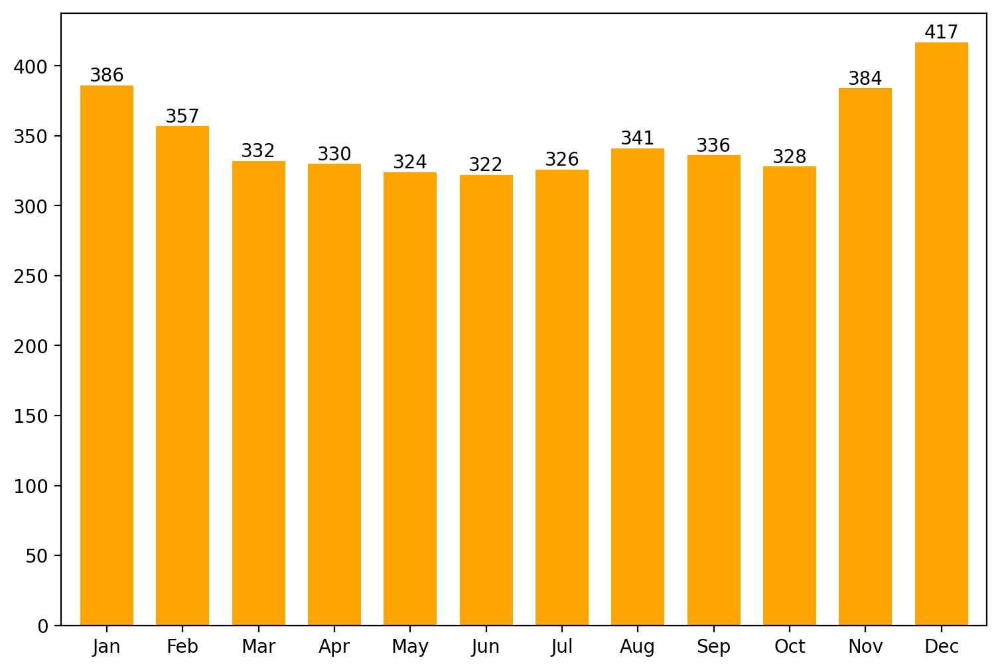

In [48]:
LNG_Carrier_Number_Jan = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

LNG_Carrier_Number_Feb = LNG_Carrier_Number_Mar = LNG_Carrier_Number_Apr = LNG_Carrier_Number_May = LNG_Carrier_Number_Jun = LNG_Carrier_Number_Jul = LNG_Carrier_Number_Aug = LNG_Carrier_Number_Sep = LNG_Carrier_Number_Oct = LNG_Carrier_Number_Nov = LNG_Carrier_Number_Dec = LNG_Carrier_Number_Jan

LNG_Carrier_Number_Jan = (transported_LNG_3_Jan*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/31
JanC = round(LNG_Carrier_Number_Jan.to_numpy().sum())

LNG_Carrier_Number_Feb = (transported_LNG_3_Feb*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/28
FebC = round(LNG_Carrier_Number_Feb.to_numpy().sum())

LNG_Carrier_Number_Mar = (transported_LNG_3_Mar*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/31
MarC = round(LNG_Carrier_Number_Mar.to_numpy().sum())

LNG_Carrier_Number_Apr = (transported_LNG_3_Apr*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/30
AprC = round(LNG_Carrier_Number_Apr.to_numpy().sum())

LNG_Carrier_Number_May = (transported_LNG_3_May*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/31
MayC = round(LNG_Carrier_Number_May.to_numpy().sum())

LNG_Carrier_Number_Jun = (transported_LNG_3_Jun*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/30
JunC = round(LNG_Carrier_Number_Jun.to_numpy().sum())

LNG_Carrier_Number_Jul = (transported_LNG_3_Jul*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/31
JulC = round(LNG_Carrier_Number_Jul.to_numpy().sum())

LNG_Carrier_Number_Aug = (transported_LNG_3_Aug*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/31
AugC = round(LNG_Carrier_Number_Aug.to_numpy().sum())

LNG_Carrier_Number_Sep = (transported_LNG_3_Sep*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/30
SepC = round(LNG_Carrier_Number_Sep.to_numpy().sum())

LNG_Carrier_Number_Oct = (transported_LNG_3_Oct*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/31
OctC = round(LNG_Carrier_Number_Oct.to_numpy().sum())

LNG_Carrier_Number_Nov = (transported_LNG_3_Nov*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/30
NovC = round(LNG_Carrier_Number_Nov.to_numpy().sum())

LNG_Carrier_Number_Dec = (transported_LNG_3_Dec*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/31
DecC = round(LNG_Carrier_Number_Dec.to_numpy().sum())

LNG_Carr_2019 = [JanC, FebC, MarC, AprC, MayC, JunC, JulC, AugC, SepC, OctC, NovC, DecC]


LNG_Carriers_2019 = pd.DataFrame(LNG_Carr_2019,
                   
                   index = ["Jan", "Feb", "Mar", "Apr", "May", "Jun",
                            "Jul", "Aug","Sep", "Oct", "Nov", "Dec"], #"Import (MMBtu)"
    
                   columns = ["Number of LNG Carriers"])


ax = LNG_Carriers_2019.plot(figsize = (9, 6), kind="bar", color = "orange", rot=0, width=0.7)
for container in ax.containers:
    ax.bar_label(container)
    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()
#LNG_Carrier_Number_Jan
#plt.savefig("Number of LNG Carriers.svg")

### 4.6 Monthly Transport Emissions 2019

In [49]:
Emissions_CO2_Jan_ = (transported_LNG_3_Jan*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)#* CO2_Emissions
Emissions_CO2_Jan_

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,12.728164,36.226496,24.620164,10.813369,8.734796,4.303630,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.602188,0.000000,0.000000,0.000000,3.618497e-01
Australia,40.919020,35.895946,24.377439,0.000000,8.657877,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.916044,0.000000,0.000000,0.000000,0.000000e+00
USA,5.816814,0.000000,0.000000,0.000000,0.000000,0.000000,6.355295,5.539363,6.780341,4.173225,9.235146,2.278422,0.000000,7.646116,3.536882,0.000000,0.000000e+00
Russia,38.488085,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00
Malaysia,0.000000,35.428044,1.100321,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.992187,0.000000,0.000000,0.000000,0.000000e+00
Nigeria,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.127341,5.498629,0.000000,4.184405,9.166920,0.000000,0.000000,7.624355,0.000000,1.366060,0.000000e+00
Trinidad & Tobago,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.200312,0.000000,6.747014,0.042057,0.000000,2.267211,0.000000,1.759456,3.531043,1.364076,0.000000e+00
Algeria,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.242982,5.398634,6.660717,4.106555,8.996241,2.238222,0.000000,0.182914,0.000000,0.000000,0.000000e+00
Indonesia,3.863098,0.000000,23.039095,0.000000,8.560249,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00
Oman,0.000000,0.000000,0.000000,9.097358,0.000000,4.293845,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.628180e-01


#### 4.6.1 CO2-Emissions

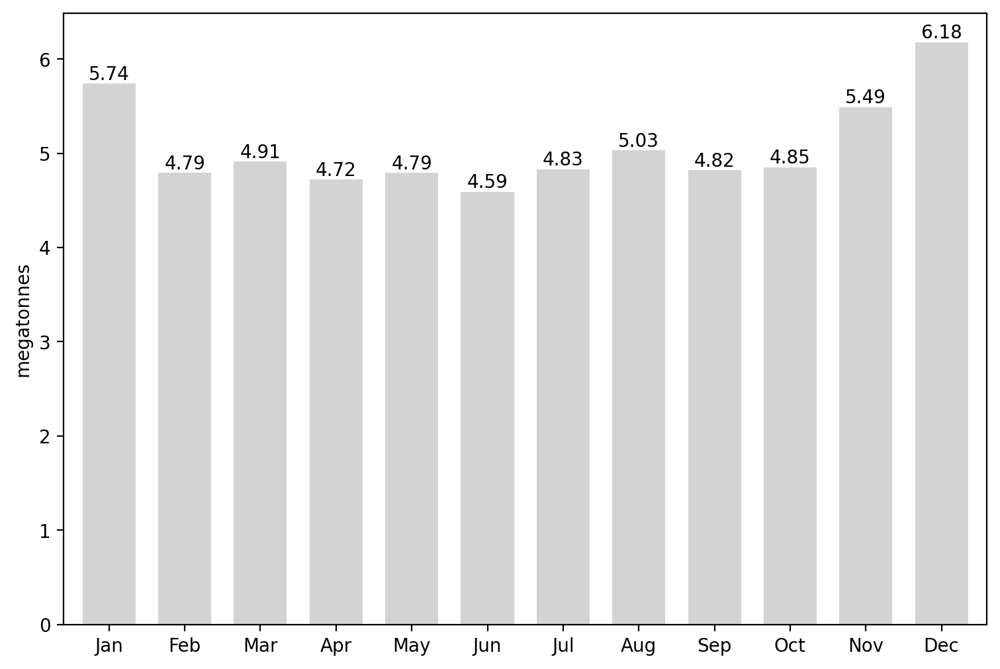

60.74

In [50]:
Emissions_CO2_Jan = (transported_LNG_3_Jan*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time) * CO2_Emissions
Jan_CO2 = round(Emissions_CO2_Jan.to_numpy().sum()/10**6,2)

Emissions_CO2_Feb = CO2_Emissions * (transported_LNG_3_Feb*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Feb_CO2 = round(Emissions_CO2_Feb.to_numpy().sum()/10**6,2)

Emissions_CO2_Mar = CO2_Emissions * (transported_LNG_3_Mar*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Mar_CO2 = round(Emissions_CO2_Mar.to_numpy().sum()/10**6,2)

Emissions_CO2_Apr = CO2_Emissions * (transported_LNG_3_Apr*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Apr_CO2 = round(Emissions_CO2_Apr.to_numpy().sum()/10**6,2)

Emissions_CO2_May = CO2_Emissions * (transported_LNG_3_May*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
May_CO2 = round(Emissions_CO2_May.to_numpy().sum()/10**6,2)

Emissions_CO2_Jun = CO2_Emissions * (transported_LNG_3_Jun*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Jun_CO2 = round(Emissions_CO2_Jun.to_numpy().sum()/10**6,2)

Emissions_CO2_Jul = CO2_Emissions * (transported_LNG_3_Jul*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Jul_CO2 = round(Emissions_CO2_Jul.to_numpy().sum()/10**6,2)

Emissions_CO2_Aug = CO2_Emissions * (transported_LNG_3_Aug*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Aug_CO2 = round(Emissions_CO2_Aug.to_numpy().sum()/10**6,2)

Emissions_CO2_Sep = CO2_Emissions * (transported_LNG_3_Sep*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Sep_CO2 = round(Emissions_CO2_Sep.to_numpy().sum()/10**6,2)

Emissions_CO2_Oct = CO2_Emissions * (transported_LNG_3_Oct*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Oct_CO2 = round(Emissions_CO2_Oct.to_numpy().sum()/10**6,2)

Emissions_CO2_Nov = CO2_Emissions * (transported_LNG_3_Nov*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Nov_CO2 = round(Emissions_CO2_Nov.to_numpy().sum()/10**6,2)

Emissions_CO2_Dec = CO2_Emissions * (transported_LNG_3_Dec*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Dec_CO2 = round(Emissions_CO2_Dec.to_numpy().sum()/10**6,2)


Emi_2019_CO2 = [Jan_CO2, Feb_CO2, Mar_CO2, Apr_CO2, May_CO2, Jun_CO2,
            Jul_CO2, Aug_CO2, Sep_CO2, Oct_CO2, Nov_CO2, Dec_CO2]

Emissions_2019_CO2 = pd.DataFrame(Emi_2019_CO2,
                   
                   index = ["Jan", "Feb", "Mar", "Apr", "May", "Jun",
                            "Jul", "Aug","Sep", "Oct", "Nov", "Dec"], #"Import (MMBtu)"
    
                   columns = ["CO2 Emissions"])


ax = Emissions_2019_CO2.plot(figsize = (9, 6), kind="bar", color = "lightgray", rot=0, width=0.7)
for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("megatonnes")    
    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()
                                           
CO2_per_mmBtu = Emissions_2019_CO2.to_numpy().sum()#/(Transported_LNG_2019.to_numpy().sum() * MMBtu_Gas * 10**3)
CO2_per_mmBtu

#Emissions_CO2_Jan

In [51]:
CO2_2019 = Emissions_CO2_Jan + Emissions_CO2_Feb + Emissions_CO2_Mar + Emissions_CO2_Apr + Emissions_CO2_May + Emissions_CO2_Jun + Emissions_CO2_Jul + Emissions_CO2_Aug + Emissions_CO2_Sep + Emissions_CO2_Oct + Emissions_CO2_Nov + Emissions_CO2_Dec
#CO2_2019.to_numpy().sum()
CO2_2019

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,4.617052e+06,5.229763e+06,3.615207e+06,4.623927e+05,1.284019e+06,122537.608926,0.000000e+00,0.000000e+00,0.000000,0.000000,54458.334661,0.000000,1.406732e+06,0.000000e+00,0.000000e+00,0.000000,42844.121125
Australia,4.285070e+06,2.041755e+06,2.464562e+06,1.444584e+05,8.782211e+05,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,5.066622e+05,0.000000e+00,-2.086434e-11,0.000000,0.000000
USA,7.027344e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,7634.050059,1.184603e+06,1.200235e+06,982284.531386,949311.881062,881052.454723,465536.247200,0.000000e+00,1.380110e+06,5.089757e+05,549667.546422,0.000000
Russia,5.192762e+06,0.000000e+00,2.440046e+05,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,1031.896076,0.000000,0.000000,27774.825239,0.000000e+00,3.342391e+05,0.000000e+00,0.000000,0.000000
Malaysia,0.000000e+00,1.424541e+06,3.574747e+05,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,3.007194e+05,0.000000e+00,0.000000e+00,0.000000,0.000000
Nigeria,0.000000e+00,0.000000e+00,0.000000e+00,5.842337e+05,0.000000e+00,0.000000,6.420121e+05,6.887590e+05,114572.106459,746871.213338,553261.546461,0.000000,1.880608e+05,4.946924e+05,0.000000e+00,477296.740052,0.000000
Trinidad & Tobago,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,5.399933e+05,0.000000e+00,689431.553352,4036.873944,0.000000,333283.018092,0.000000e+00,2.592883e+04,4.724148e+05,391290.230431,0.000000
Algeria,0.000000e+00,0.000000e+00,0.000000e+00,1.645609e+04,0.000000e+00,663.959159,3.092338e+05,9.661915e+04,316218.548731,220831.394567,201613.789723,150542.009594,0.000000e+00,1.992400e+05,0.000000e+00,0.000000,0.000000
Indonesia,1.045104e+05,9.850963e+05,6.473431e+05,0.000000e+00,3.631703e+05,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,2.817618e+05,0.000000e+00,0.000000e+00,0.000000,0.000000
Oman,0.000000e+00,0.000000e+00,0.000000e+00,2.207922e+05,0.000000e+00,49827.893946,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,98658.829927


#### 4.6.2 CH4-Emissions

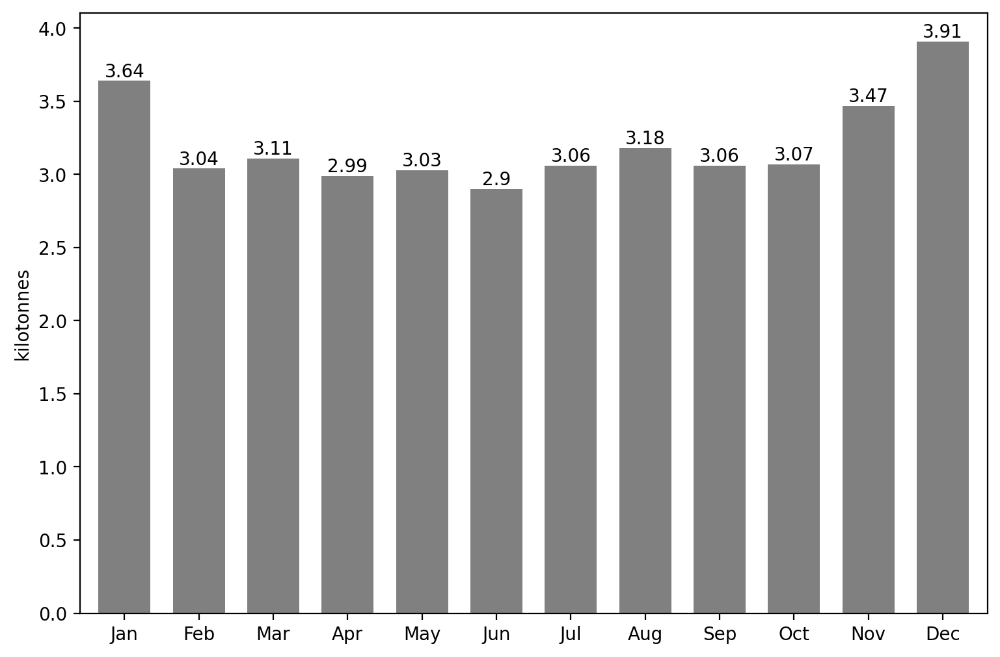

38.459999999999994

In [52]:
Emissions_CH4_Jan = CH4_Emissions * (transported_LNG_3_Jan*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Jan_CH4 = round(Emissions_CH4_Jan.to_numpy().sum()/10**3,2)

Emissions_CH4_Feb = CH4_Emissions * (transported_LNG_3_Feb*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Feb_CH4 = round(Emissions_CH4_Feb.to_numpy().sum()/10**3,2)

Emissions_CH4_Mar = CH4_Emissions * (transported_LNG_3_Mar*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Mar_CH4 = round(Emissions_CH4_Mar.to_numpy().sum()/10**3,2)

Emissions_CH4_Apr = CH4_Emissions * (transported_LNG_3_Apr*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Apr_CH4 = round(Emissions_CH4_Apr.to_numpy().sum()/10**3,2)

Emissions_CH4_May = CH4_Emissions * (transported_LNG_3_May*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
May_CH4 = round(Emissions_CH4_May.to_numpy().sum()/10**3,2)

Emissions_CH4_Jun = CH4_Emissions * (transported_LNG_3_Jun*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Jun_CH4 = round(Emissions_CH4_Jun.to_numpy().sum()/10**3,2)

Emissions_CH4_Jul = CH4_Emissions * (transported_LNG_3_Jul*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Jul_CH4 = round(Emissions_CH4_Jul.to_numpy().sum()/10**3,2)

Emissions_CH4_Aug = CH4_Emissions * (transported_LNG_3_Aug*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Aug_CH4 = round(Emissions_CH4_Aug.to_numpy().sum()/10**3,2)

Emissions_CH4_Sep = CH4_Emissions * (transported_LNG_3_Sep*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Sep_CH4 = round(Emissions_CH4_Sep.to_numpy().sum()/10**3,2)

Emissions_CH4_Oct = CH4_Emissions * (transported_LNG_3_Oct*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Oct_CH4 = round(Emissions_CH4_Oct.to_numpy().sum()/10**3,2)

Emissions_CH4_Nov = CH4_Emissions * (transported_LNG_3_Nov*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Nov_CH4 = round(Emissions_CH4_Nov.to_numpy().sum()/10**3,2)

Emissions_CH4_Dec = CH4_Emissions * (transported_LNG_3_Dec*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Dec_CH4 = round(Emissions_CH4_Dec.to_numpy().sum()/10**3,2)


Emi_2019_CH4 = [Jan_CH4, Feb_CH4, Mar_CH4, Apr_CH4, May_CH4, Jun_CH4,
                Jul_CH4, Aug_CH4, Sep_CH4, Oct_CH4, Nov_CH4, Dec_CH4]

Emissions_2019_CH4 = pd.DataFrame(Emi_2019_CH4,
                   
                   index = ["Jan", "Feb", "Mar", "Apr", "May", "Jun",
                            "Jul", "Aug","Sep", "Oct", "Nov", "Dec"], #"Import (MMBtu)"
    
                   columns = ["CH4 Emissions"])


ax = Emissions_2019_CH4.plot(figsize = (9, 6), kind="bar", color = "grey", rot=0, width=0.7)
for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("kilotonnes")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()

Emissions_2019_CH4.to_numpy().sum()

In [53]:
CH4_2019 = Emissions_CH4_Jan + Emissions_CH4_Feb + Emissions_CH4_Mar + Emissions_CH4_Apr + Emissions_CH4_May + Emissions_CH4_Jun + Emissions_CH4_Jul + Emissions_CH4_Aug + Emissions_CH4_Sep + Emissions_CH4_Oct + Emissions_CH4_Nov + Emissions_CH4_Dec
CH4_2019.to_numpy().sum()
#CH4_2019
CH4_per_mmBtu = Emissions_2019_CH4.to_numpy().sum()/(Transported_LNG_2019.to_numpy().sum() * MMBtu_Gas * 10**3)
CH4_per_mmBtu


0.0021133613629011378

## 5   Shadow Prices

### 5.1 Analysis by exporting nodes

#### 5.1.1 Jan

Qatar                         8.9           8.9       -4.8487
Australia                    10.0           9.9        0.0000
USA                           4.4           4.4       -0.3175
Russia                        3.3           3.3       -3.0845
Malaysia                      3.5           3.5       -2.2261
Nigeria                       2.6           2.6       -2.4131
Trinidad & Tobago             1.7           1.7       -1.4713
Algeria                       3.0           3.0       -4.6283
Indonesia                     3.1           3.1       -2.1142
Oman                          1.2           1.2       -4.0938
Other Asia Pacific            1.6           1.6       -0.3018
Other Europe                  0.5           0.5       -2.3001
Other Americas                0.5           0.5       -0.7462
Other ME                      0.7           0.7       -4.7080
Other Africa                  1.3           1.3       -2.0558


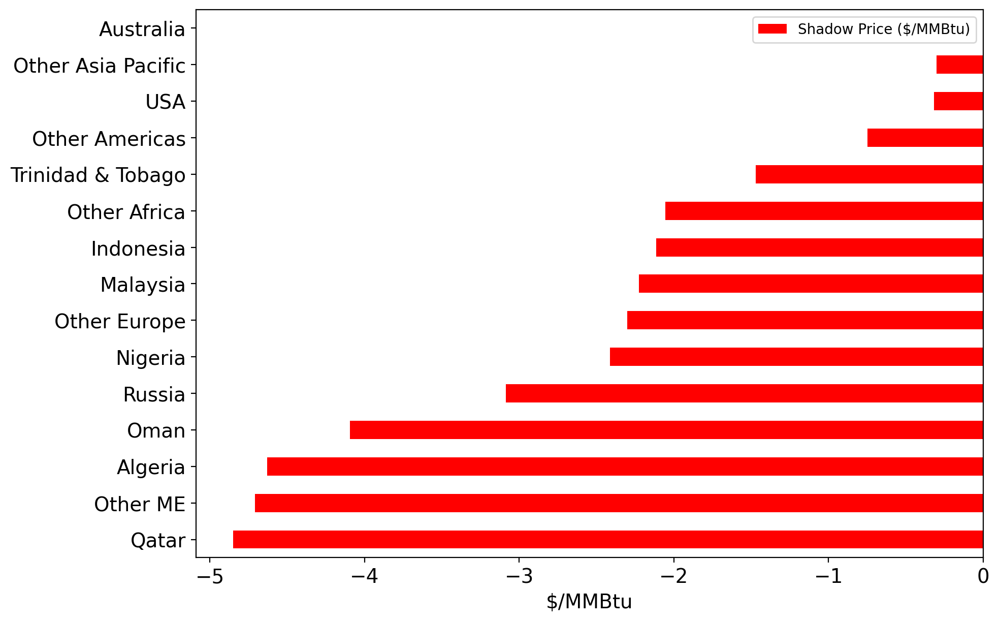

In [54]:
dual_export_Jan = pd.DataFrame(np.zeros((1, len(Merit_Order_3_Jan.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])


for m in model_2019_Jan.src.keys():
    s = SRC[m-1]
    dual_export_Jan.loc["Shadow Price ($/MMBtu)", s] = model_2019_Jan.dual[model_2019_Jan.src[m]]
    print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_Jan[s]/MMBtu_Gas/10**9,model_2019_Jan.src[m]()/MMBtu_Gas/10**9,model_2019_Jan.dual[model_2019_Jan.src[m]]))

Dual_Export_Jan = dual_export_Jan.T
#Dual_Export

Dual_Export_Jan.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_Jan.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.2 Feb

Qatar                         8.9           8.9       -4.5312
Australia                     9.9           4.9        0.0000
USA                           4.3           3.4        0.0000
Russia                        3.3           3.3       -2.7670
Malaysia                      3.5           3.5       -2.0347
Nigeria                       2.6           2.6       -2.1043
Trinidad & Tobago             1.7           1.7       -1.1538
Algeria                       2.9           2.9       -4.3108
Indonesia                     3.1           3.1       -1.9229
Oman                          1.2           1.2       -3.9024
Other Asia Pacific            1.6           0.0        0.0000
Other Europe                  0.5           0.5       -1.9827
Other Americas                0.5           0.5       -0.4287
Other ME                      0.7           0.7       -4.5166
Other Africa                  1.3           1.3       -1.8645


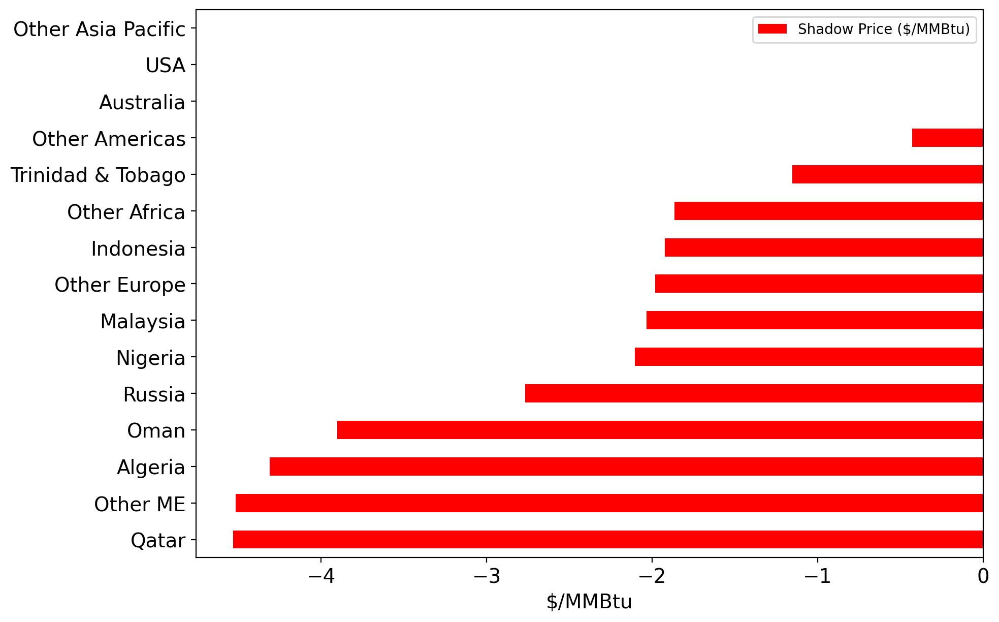

In [55]:
dual_export_Feb = pd.DataFrame(np.zeros((1, len(Merit_Order_3_Feb.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])


for m in model_2019_Feb.src.keys():
    s = SRC[m-1]
    dual_export_Feb.loc["Shadow Price ($/MMBtu)", s] = model_2019_Feb.dual[model_2019_Feb.src[m]]
    print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply[s]/MMBtu_Gas/10**9,model_2019_Feb.src[m]()/MMBtu_Gas/10**9,model_2019_Feb.dual[model_2019_Feb.src[m]]))

Dual_Export_Feb = dual_export_Feb.T
#Dual_Export

Dual_Export_Feb.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_Feb.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.3 March

Qatar                         8.9           8.9       -4.5469
Australia                     9.9           5.6        0.0000
USA                           4.3           4.3       -0.3848
Russia                        3.3           3.3       -2.7827
Malaysia                      3.5           3.5       -2.0549
Nigeria                       2.6           2.6       -2.6719
Trinidad & Tobago             1.7           1.7       -1.7301
Algeria                       2.9           2.9       -4.8895
Indonesia                     3.1           3.1       -1.9511
Oman                          1.2           1.2       -4.1534
Other Asia Pacific            1.6           0.9        0.0000
Other Europe                  0.5           0.5       -2.5502
Other Americas                0.5           0.5       -0.4444
Other ME                      0.7           0.7       -4.7675
Other Africa                  1.3           1.3       -2.1154


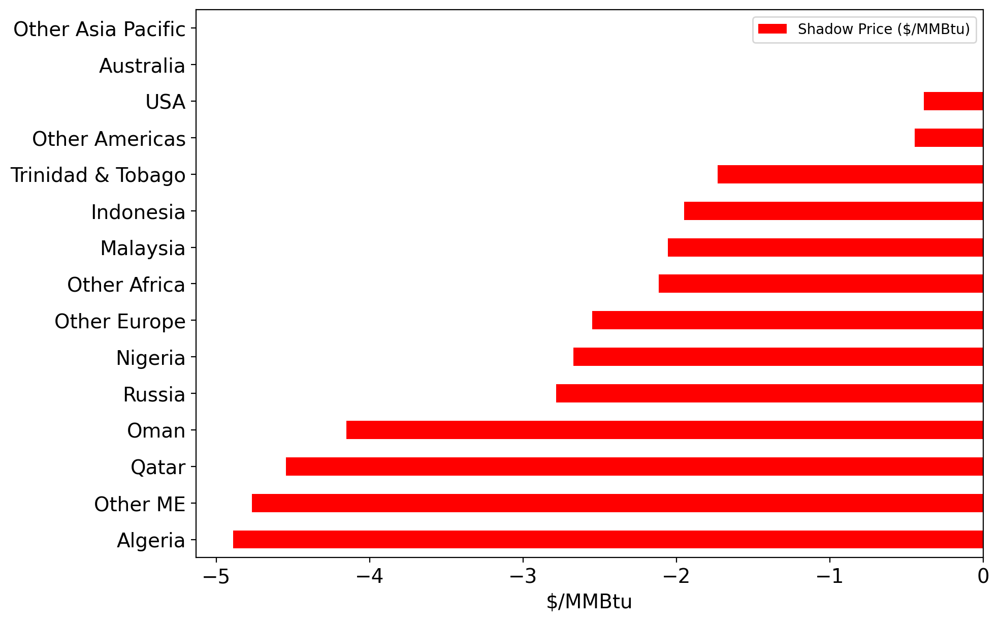

In [56]:
dual_export_Mar = pd.DataFrame(np.zeros((1, len(Merit_Order_3_Mar.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])


for m in model_2019_Mar.src.keys():
        s = SRC[m-1]
        dual_export_Mar.loc["Shadow Price ($/MMBtu)", s] = model_2019_Mar.dual[model_2019_Mar.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply[s]/MMBtu_Gas/10**9,model_2019_Mar.src[m]()/MMBtu_Gas/10**9,model_2019_Mar.dual[model_2019_Mar.src[m]]))

Dual_Export_Mar = dual_export_Mar.T
#Dual_Export

Dual_Export_Mar.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_Mar.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.4 April

Qatar                         8.9           8.9       -4.5469
Australia                     9.9           5.0        0.0000
USA                           4.3           4.3       -0.4542
Russia                        3.3           3.3       -2.7827
Malaysia                      3.5           3.5       -2.0549
Nigeria                       2.6           2.6       -2.7413
Trinidad & Tobago             1.7           1.7       -1.7995
Algeria                       2.9           2.9       -4.9590
Indonesia                     3.1           3.1       -1.9511
Oman                          1.2           1.2       -4.4896
Other Asia Pacific            1.6           0.6        0.0000
Other Europe                  0.5           0.5       -2.6196
Other Americas                0.5           0.5       -0.4444
Other ME                      0.7           0.7       -5.1037
Other Africa                  1.3           1.3       -2.3431


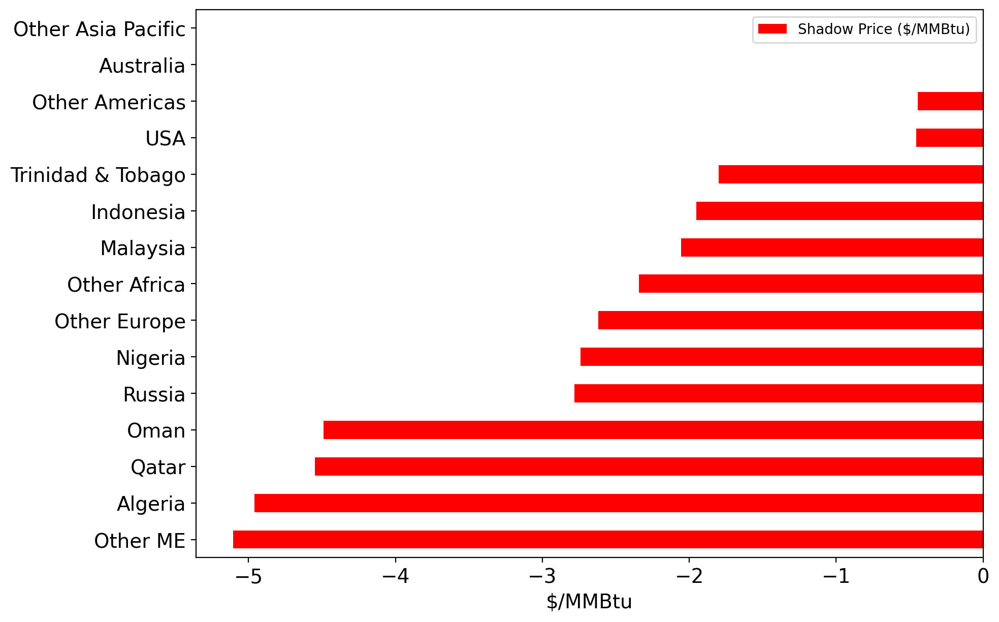

In [57]:
dual_export_Apr = pd.DataFrame(np.zeros((1, len(Merit_Order_3_Apr.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])


for m in model_2019_Apr.src.keys():
        s = SRC[m-1]
        dual_export_Apr.loc["Shadow Price ($/MMBtu)", s] = model_2019_Apr.dual[model_2019_Apr.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply[s]/MMBtu_Gas/10**9,model_2019_Apr.src[m]()/MMBtu_Gas/10**9,model_2019_Apr.dual[model_2019_Apr.src[m]]))


Dual_Export_Apr = dual_export_Apr.T
#Dual_Export

Dual_Export_Apr.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_Apr.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.5 May

Qatar                         8.9           8.9       -4.5469
Australia                     9.9           5.2        0.0000
USA                           4.3           4.3       -0.0157
Russia                        3.3           3.3       -2.7827
Malaysia                      3.5           3.5       -2.0549
Nigeria                       2.6           2.6       -2.6719
Trinidad & Tobago             1.7           1.7       -1.7301
Algeria                       2.9           2.9       -4.8784
Indonesia                     3.1           3.1       -1.9511
Oman                          1.2           1.2       -4.4808
Other Asia Pacific            1.6           1.0        0.0000
Other Europe                  0.5           0.5       -2.5502
Other Americas                0.5           0.5       -0.4444
Other ME                      0.7           0.7       -5.1005
Other Africa                  1.3           1.3       -2.3011


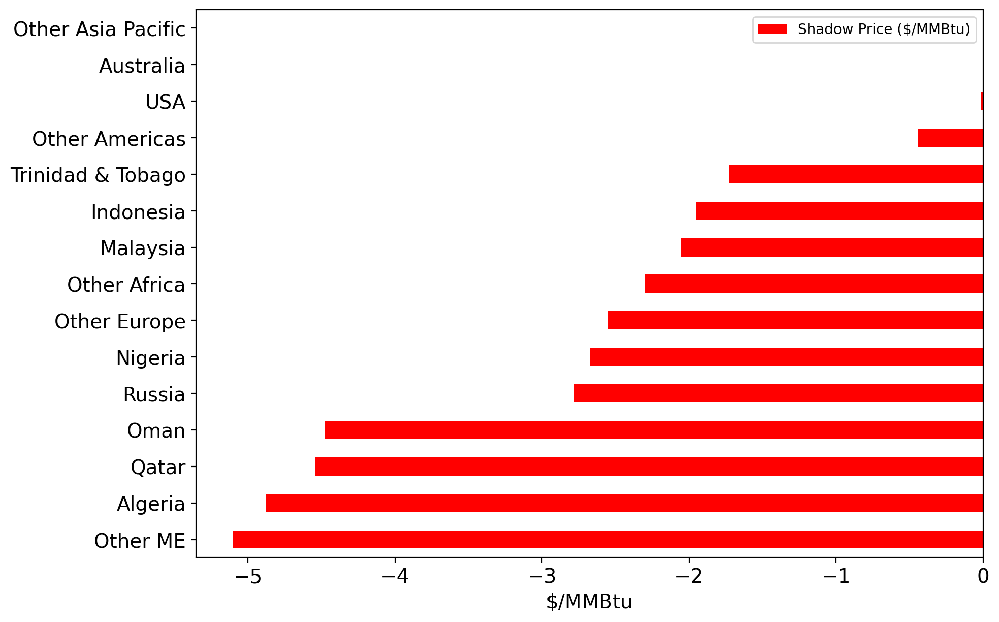

In [58]:
dual_export_May = pd.DataFrame(np.zeros((1, len(Merit_Order_3_May.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])


for m in model_2019_May.src.keys():
        s = SRC[m-1]
        dual_export_May.loc["Shadow Price ($/MMBtu)", s] = model_2019_May.dual[model_2019_May.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply[s]/MMBtu_Gas/10**9,model_2019_May.src[m]()/MMBtu_Gas/10**9,model_2019_May.dual[model_2019_May.src[m]]))


Dual_Export_May = dual_export_May.T
#Dual_Export

Dual_Export_May.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_May.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.6 June

Qatar                         8.4           8.4       -4.5549
Australia                     9.4           5.4        0.0000
USA                           4.1           4.1       -0.5679
Russia                        3.1           3.1       -2.7907
Malaysia                      3.3           3.3       -2.0630
Nigeria                       2.4           2.4       -2.7943
Trinidad & Tobago             1.6           1.6       -1.8525
Algeria                       2.8           2.8       -4.8864
Indonesia                     2.9           2.9       -1.9511
Oman                          1.1           1.1       -4.6033
Other Asia Pacific            1.5           1.5       -0.0080
Other Europe                  0.5           0.5       -2.5582
Other Americas                0.5           0.5       -0.5581
Other ME                      0.6           0.6       -5.2230
Other Africa                  1.2           1.2       -2.4568


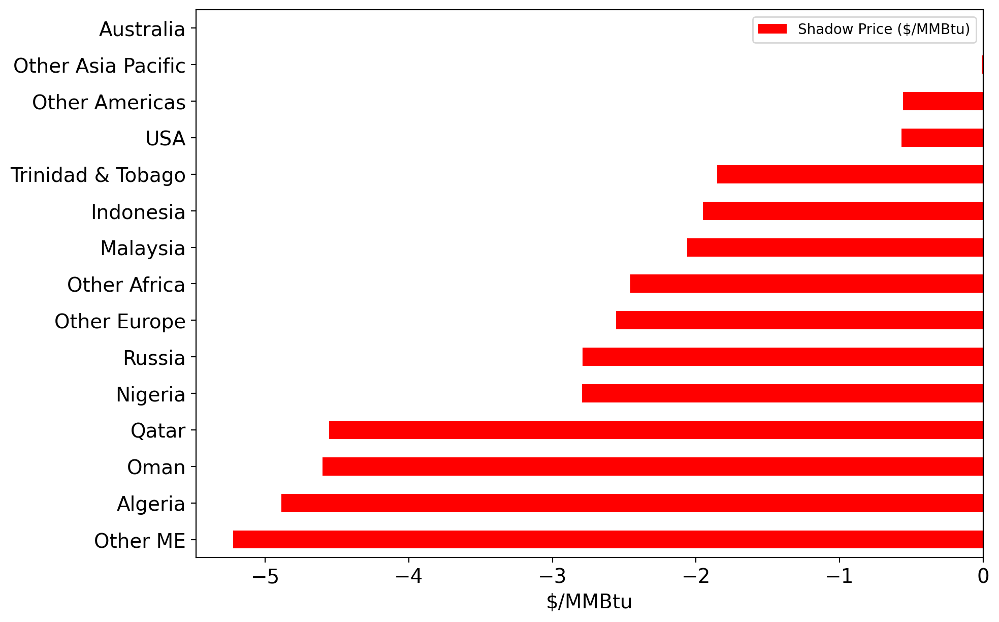

In [59]:
dual_export_Jun = pd.DataFrame(np.zeros((1, len(Merit_Order_3_Jun.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])


for m in model_2019_Jun.src.keys():
        s = SRC[m-1]
        dual_export_Jun.loc["Shadow Price ($/MMBtu)", s] = model_2019_Jun.dual[model_2019_Jun.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_Jun[s]/MMBtu_Gas/10**9,model_2019_Jun.src[m]()/MMBtu_Gas/10**9,model_2019_Jun.dual[model_2019_Jun.src[m]]))


Dual_Export_Jun = dual_export_Jun.T
#Dual_Export

Dual_Export_Jun.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_Jun.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.7 July

Qatar                         8.9           8.9       -4.5312
Australia                     9.9           5.5        0.0000
USA                           4.3           4.2        0.0000
Russia                        3.3           3.3       -2.7004
Malaysia                      3.5           3.5       -2.0549
Nigeria                       2.6           2.6       -2.2826
Trinidad & Tobago             1.7           1.7       -1.3407
Algeria                       2.9           2.9       -4.1069
Indonesia                     3.1           3.1       -1.9511
Oman                          1.2           1.2       -4.0915
Other Asia Pacific            1.6           0.3        0.0000
Other Europe                  0.5           0.5       -2.1609
Other Americas                0.5           0.5       -0.4287
Other ME                      0.7           0.7       -4.7112
Other Africa                  1.3           1.3       -1.9450


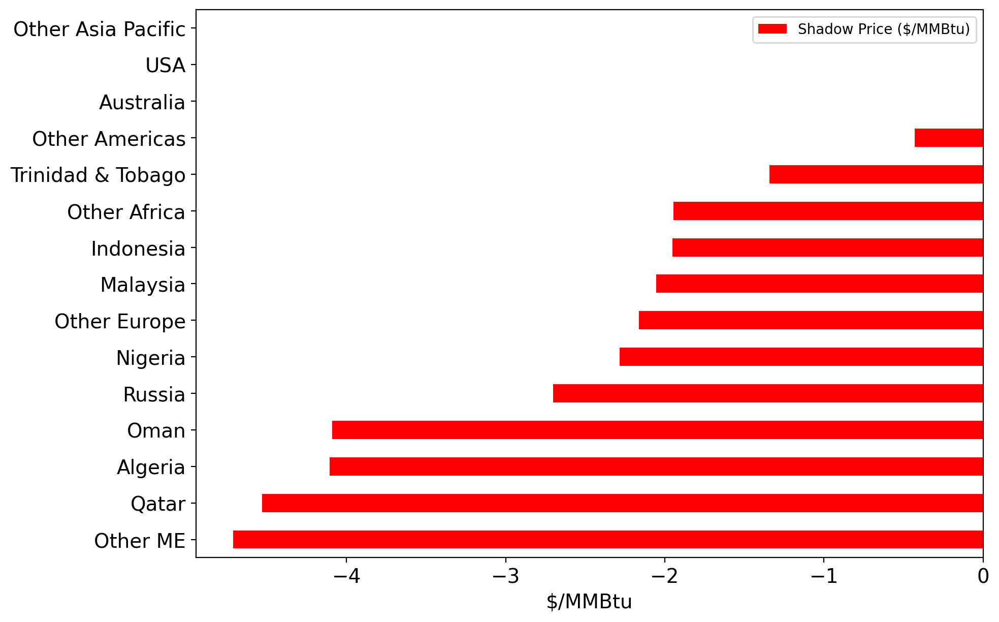

In [60]:
dual_export_Jul = pd.DataFrame(np.zeros((1, len(Merit_Order_3_Jul.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])


for m in model_2019_Jul.src.keys():
        s = SRC[m-1]
        dual_export_Jul.loc["Shadow Price ($/MMBtu)", s] = model_2019_Jul.dual[model_2019_Jul.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply[s]/MMBtu_Gas/10**9,model_2019_Jul.src[m]()/MMBtu_Gas/10**9,model_2019_Jul.dual[model_2019_Jul.src[m]]))


Dual_Export_Jul = dual_export_Jul.T
#Dual_Export

Dual_Export_Jul.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_Jul.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.8 August

Qatar                         8.4           8.4       -4.9199
Australia                     9.4           8.4        0.0000
USA                           4.1           4.1       -0.3887
Russia                        3.1           3.1       -3.1557
Malaysia                      3.3           3.3       -2.3051
Nigeria                       2.4           2.4       -3.1640
Trinidad & Tobago             1.6           1.6       -2.2073
Algeria                       2.8           2.8       -5.2514
Indonesia                     2.9           2.9       -2.1854
Oman                          1.1           1.1       -4.9729
Other Asia Pacific            1.5           1.5       -0.3730
Other Europe                  0.5           0.5       -2.9232
Other Americas                0.5           0.5       -0.8522
Other ME                      0.6           0.6       -5.6843
Other Africa                  1.2           1.2       -2.9182


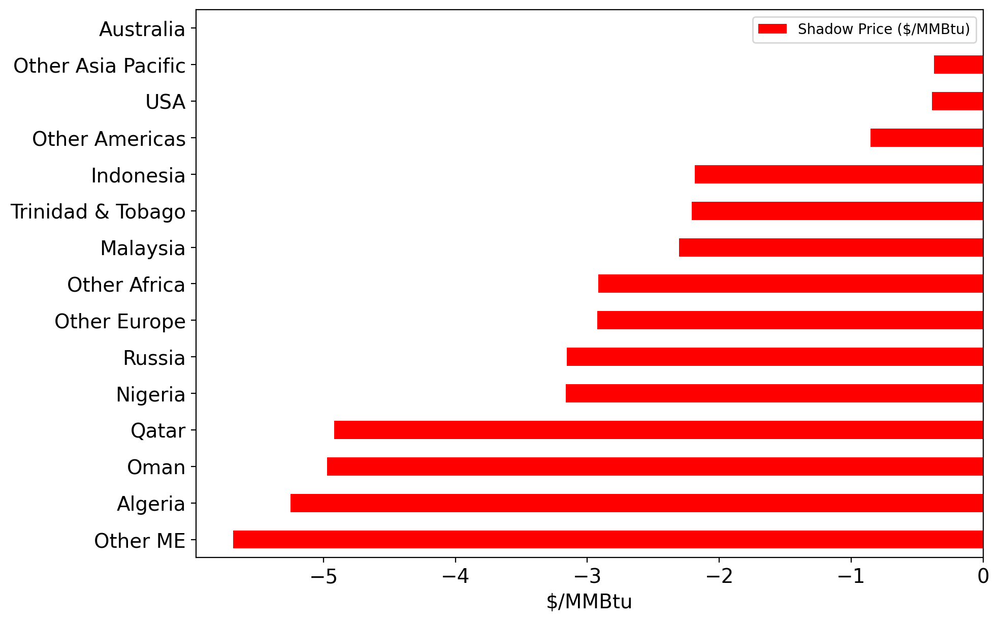

In [61]:
dual_export_Aug = pd.DataFrame(np.zeros((1, len(Merit_Order_3_Aug.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])


for m in model_2019_Aug.src.keys():
        s = SRC[m-1]
        dual_export_Aug.loc["Shadow Price ($/MMBtu)", s] = model_2019_Aug.dual[model_2019_Aug.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_Aug[s]/MMBtu_Gas/10**9,model_2019_Aug.src[m]()/MMBtu_Gas/10**9,model_2019_Aug.dual[model_2019_Aug.src[m]]))

Dual_Export_Aug = dual_export_Aug.T
#Dual_Export

Dual_Export_Aug.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_Aug.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.9 September

Qatar                         8.6           8.6       -4.5469
Australia                     9.6           5.4        0.0000
USA                           4.2           4.2       -0.0157
Russia                        3.2           3.2       -2.7004
Malaysia                      3.4           3.4       -2.0549
Nigeria                       2.5           2.5       -2.2077
Trinidad & Tobago             1.6           1.6       -1.2572
Algeria                       2.8           2.8       -4.0579
Indonesia                     3.0           3.0       -1.9511
Oman                          1.2           1.2       -4.0166
Other Asia Pacific            1.6           0.9        0.0000
Other Europe                  0.5           0.5       -2.0860
Other Americas                0.5           0.5       -0.4444
Other ME                      0.6           0.6       -4.7112
Other Africa                  1.3           1.3       -1.9450


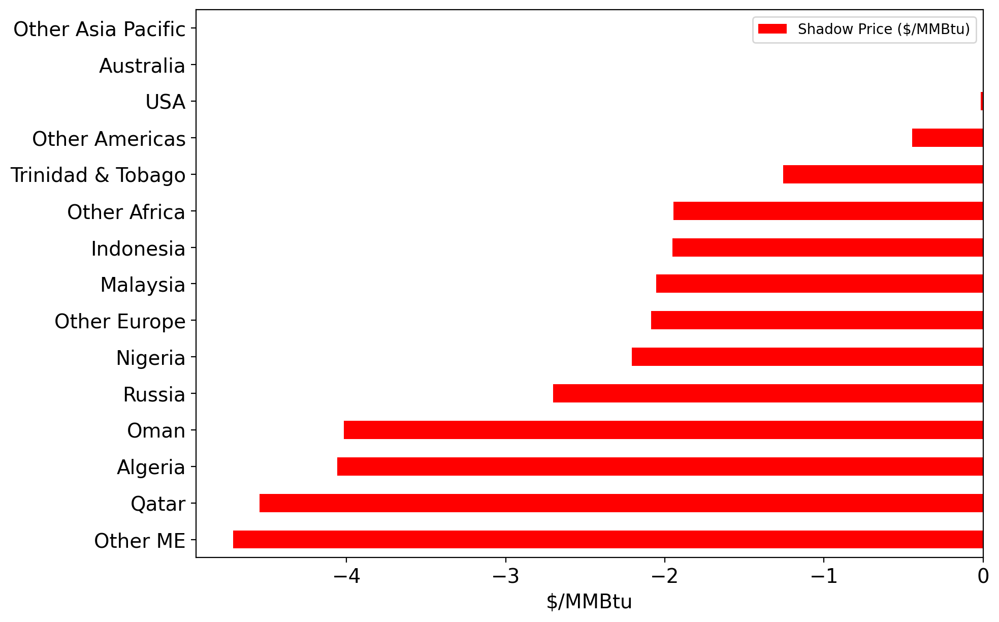

In [62]:
dual_export_Sep = pd.DataFrame(np.zeros((1, len(Merit_Order_3_Sep.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])

for m in model_2019_Sep.src.keys():
        s = SRC[m-1]
        dual_export_Sep.loc["Shadow Price ($/MMBtu)", s] = model_2019_Sep.dual[model_2019_Sep.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_Sep[s]/MMBtu_Gas/10**9,model_2019_Sep.src[m]()/MMBtu_Gas/10**9,model_2019_Sep.dual[model_2019_Sep.src[m]]))

Dual_Export_Sep = dual_export_Sep.T
#Dual_Export

Dual_Export_Sep.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_Sep.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.10 October

Qatar                         8.9           8.9       -4.5469
Australia                     9.9           5.3        0.0000
USA                           4.3           4.3       -0.0157
Russia                        3.3           3.3       -2.7827
Malaysia                      3.5           3.5       -2.0549
Nigeria                       2.6           2.6       -2.6719
Trinidad & Tobago             1.7           1.7       -1.7301
Algeria                       2.9           2.9       -4.8784
Indonesia                     3.1           3.1       -1.9511
Oman                          1.2           1.2       -4.4808
Other Asia Pacific            1.6           0.7        0.0000
Other Europe                  0.5           0.5       -2.5502
Other Americas                0.5           0.5       -0.4444
Other ME                      0.7           0.7       -5.1005
Other Africa                  1.3           1.3       -2.3011


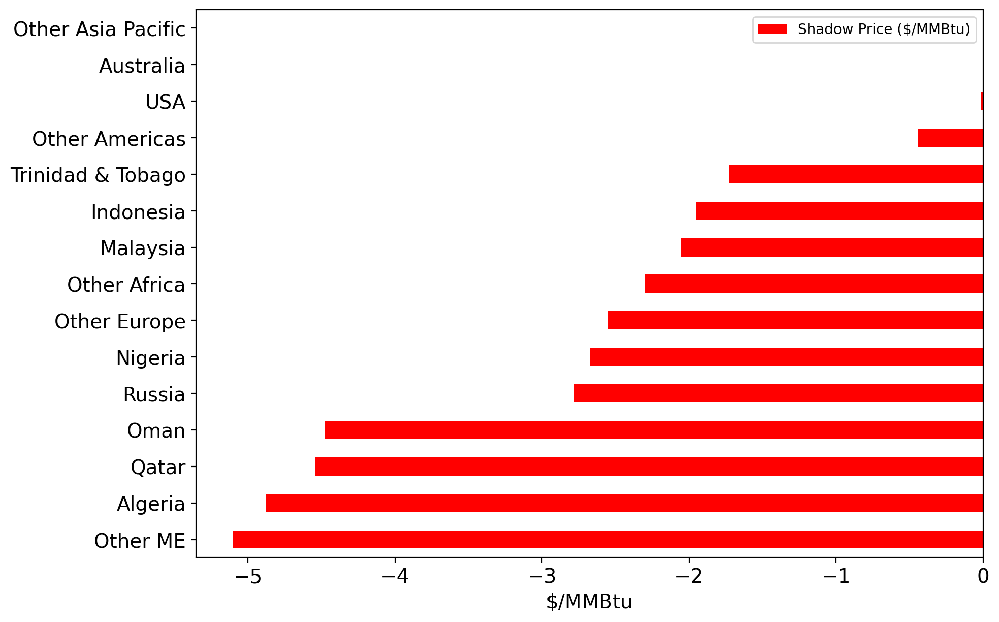

In [63]:
dual_export_Oct = pd.DataFrame(np.zeros((1, len(Merit_Order_3_Oct.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])

for m in model_2019_Oct.src.keys():
        s = SRC[m-1]
        dual_export_Oct.loc["Shadow Price ($/MMBtu)", s] = model_2019_Oct.dual[model_2019_Oct.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply[s]/MMBtu_Gas/10**9,model_2019_Oct.src[m]()/MMBtu_Gas/10**9,model_2019_Oct.dual[model_2019_Oct.src[m]]))

Dual_Export_Oct = dual_export_Oct.T
#Dual_Export

Dual_Export_Oct.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_Oct.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.11 November

Qatar                         8.9           8.9       -5.3681
Australia                     9.9           9.9        0.0000
USA                           4.4           4.4       -1.2958
Russia                        3.3           3.3       -3.6039
Malaysia                      3.5           3.5       -2.7533
Nigeria                       2.6           2.6       -3.4931
Trinidad & Tobago             1.7           1.7       -2.5513
Algeria                       2.9           2.9       -5.7108
Indonesia                     3.1           3.1       -2.6337
Oman                          1.2           1.2       -4.9729
Other Asia Pacific            1.6           1.6       -0.8212
Other Europe                  0.5           0.5       -3.3715
Other Americas                0.5           0.5       -1.2656
Other ME                      0.7           0.7       -5.5871
Other Africa                  1.3           1.3       -2.9350


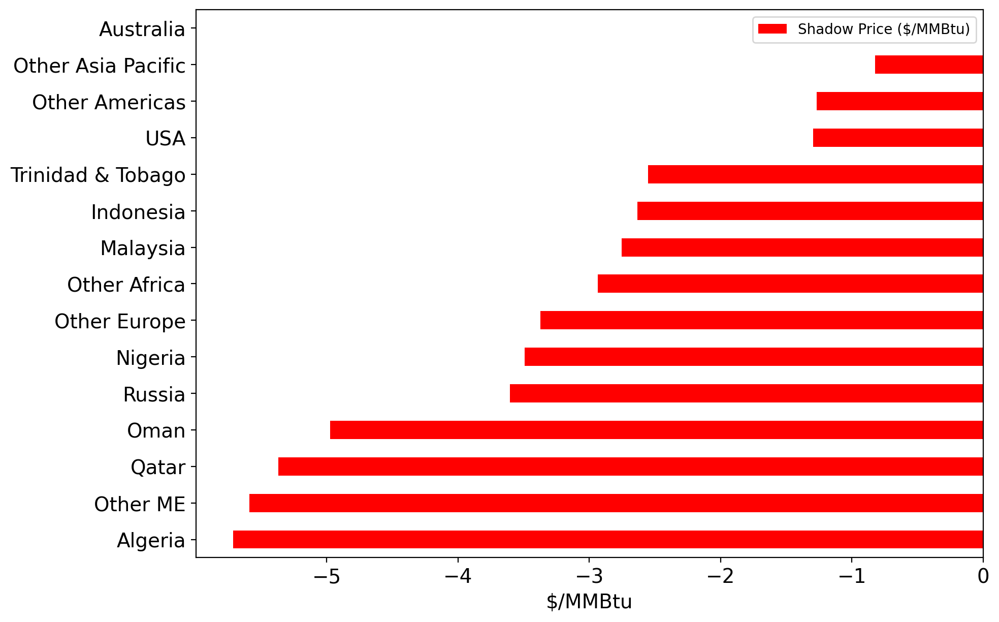

In [64]:
dual_export_Nov = pd.DataFrame(np.zeros((1, len(Merit_Order_3_Nov.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])

for m in model_2019_Nov.src.keys():
        s = SRC[m-1]
        dual_export_Nov.loc["Shadow Price ($/MMBtu)", s] = model_2019_Nov.dual[model_2019_Nov.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_Nov[s]/MMBtu_Gas/10**9,model_2019_Nov.src[m]()/MMBtu_Gas/10**9,model_2019_Nov.dual[model_2019_Nov.src[m]]))

Dual_Export_Nov = dual_export_Nov.T
#Dual_Export

Dual_Export_Nov.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_Nov.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.12 December

Qatar                         9.9           9.9       -5.5811
Australia                    11.1          10.9        0.0000
USA                           4.9           4.9       -1.2061
Russia                        3.7           3.7       -3.6039
Malaysia                      3.9           3.9       -2.9663
Nigeria                       2.9           2.9       -3.4931
Trinidad & Tobago             1.9           1.9       -2.5513
Algeria                       3.3           3.3       -5.7108
Indonesia                     3.4           3.4       -2.8466
Oman                          1.3           1.3       -4.9729
Other Asia Pacific            1.8           1.8       -1.0342
Other Europe                  0.5           0.5       -3.3715
Other Americas                0.6           0.6       -1.4786
Other ME                      0.7           0.7       -5.5871
Other Africa                  1.5           1.5       -2.9350


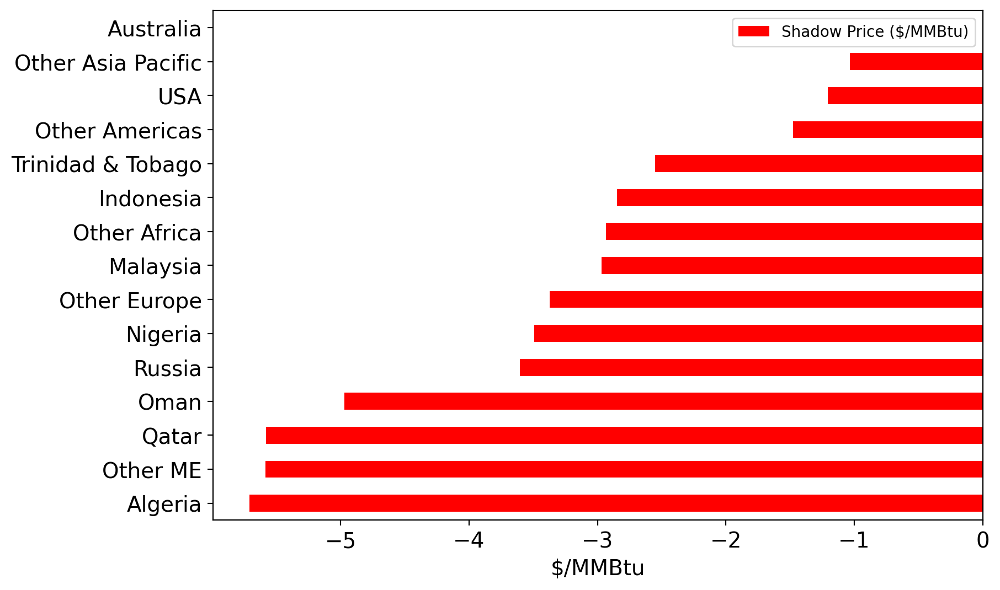

In [65]:
dual_export_Dec = pd.DataFrame(np.zeros((1, len(Merit_Order_3_Dec.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])

for m in model_2019_Dec.src.keys():
        s = SRC[m-1]
        dual_export_Dec.loc["Shadow Price ($/MMBtu)", s] = model_2019_Dec.dual[model_2019_Dec.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_Dec[s]/MMBtu_Gas/10**9,model_2019_Dec.src[m]()/MMBtu_Gas/10**9,model_2019_Dec.dual[model_2019_Dec.src[m]]))

Dual_Export_Dec = dual_export_Dec.T
#Dual_Export

Dual_Export_Dec.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_Dec.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.1.13 Monthly Exporters Shadow Prices

/tmp/ipykernel_18619/714260028.py:2: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/714260028.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/714260028.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/714260028.py:8: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/714260028.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/714260028.py:10: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future vers

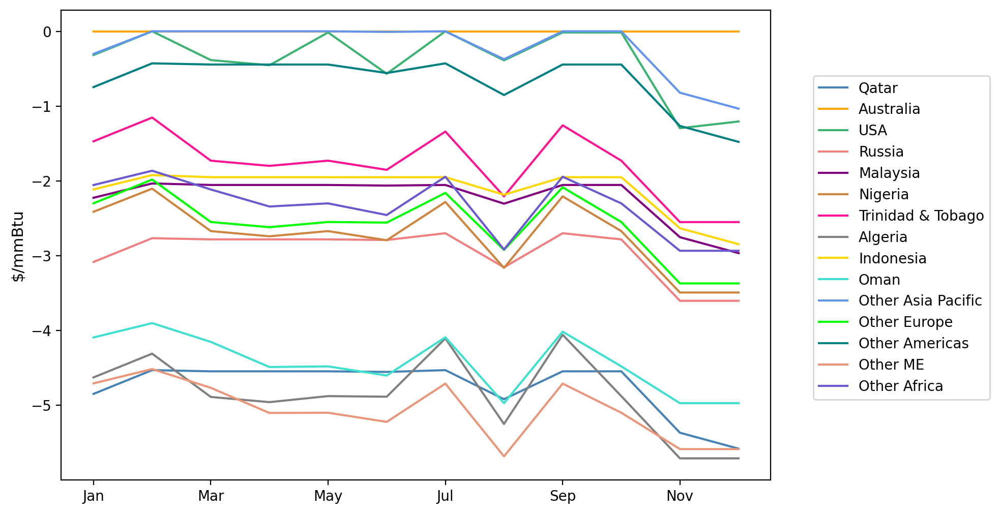

In [66]:
Exporter_Shadow = dual_export_Jan
Exporter_Shadow = Exporter_Shadow.append(dual_export_Feb)



Exporter_Shadow = Exporter_Shadow.append(dual_export_Mar)
Exporter_Shadow = Exporter_Shadow.append(dual_export_Apr)
Exporter_Shadow = Exporter_Shadow.append(dual_export_May)
Exporter_Shadow = Exporter_Shadow.append(dual_export_Jun)
Exporter_Shadow = Exporter_Shadow.append(dual_export_Jul)
Exporter_Shadow = Exporter_Shadow.append(dual_export_Aug)
Exporter_Shadow = Exporter_Shadow.append(dual_export_Sep)
Exporter_Shadow = Exporter_Shadow.append(dual_export_Oct)
Exporter_Shadow = Exporter_Shadow.append(dual_export_Nov)
Exporter_Shadow = Exporter_Shadow.append(dual_export_Dec)

Months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep",
          "Oct", "Nov", "Dec"]

idx = pd.Index(Months)
Exporter_Shadow = Exporter_Shadow.set_index(idx)

ax = Exporter_Shadow.plot(figsize = (9, 6), color = colours_exp)
plt.legend(bbox_to_anchor=(1.05, 0.875))
ax.set_ylabel("$/mmBtu", fontsize = 11)
plt.show()

#Exporter_Shadow.T

### 5.2 Analysis by importing nodes

#### 5.2.1 January

Japan                                10.6      10.6      8.9076
China                                 9.3       9.3      8.7921
South Korea                           6.3       6.3      8.8699
India                                 2.8       2.8      8.1780
Taiwan                                2.2       2.2      8.7027
Pakistan                              1.1       1.1      8.0864
France                                1.6       1.6      7.6656
Spain                                 1.4       1.4      7.6596
UK                                    1.7       1.7      7.6708
Italy                                 1.1       1.1      7.9286
Turkey                                2.4       2.4      7.9257
Belgium                               0.6       0.6      7.6736
Other Asia Pacific                    1.7       1.7      8.6267
Other Europe                          2.0       2.0      7.8021
Total North America                   0.9       0.9      7.9570
Total S. & C. America                 0.

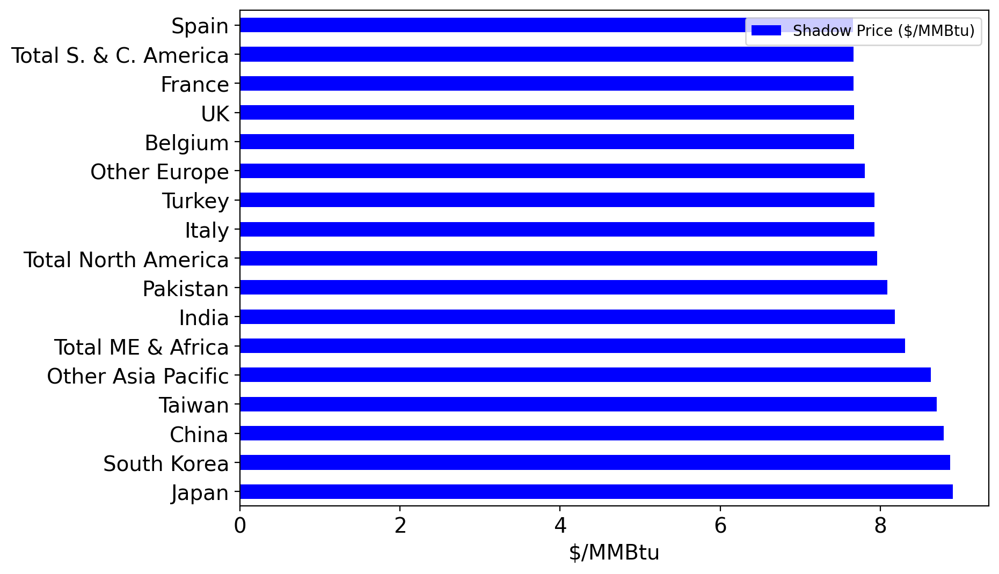

In [67]:
dual_import_Jan = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Jan.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])



for n in model_2019_Jan.dmd.keys():
        c = CUS[n-1]
        dual_import_Jan.loc["Shadow Price ($/MMBtu)", c] = model_2019_Jan.dual[model_2019_Jan.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_Jan[c]/MMBtu_Gas/10**9,model_2019_Jan.dmd[n]()/MMBtu_Gas/10**9,model_2019_Jan.dual[model_2019_Jan.dmd[n]]))

Dual_Import_Jan = dual_import_Jan.T
Dual_Import_Jan

Dual_Import_Jan.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_Jan.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.2 February

Japan                                10.3      10.3      8.5901
China                                 5.9       5.9      8.6368
South Korea                           4.1       4.1      8.6786
India                                 2.6       2.6      7.9866
Taiwan                                1.5       1.5      8.5111
Pakistan                              0.9       0.9      8.0036
France                                1.8       1.8      7.3482
Spain                                 1.4       1.4      7.3384
UK                                    1.2       1.2      7.3620
Italy                                 0.9       0.9      7.6111
Turkey                                1.8       1.8      7.6080
Belgium                               0.3       0.3      7.3648
Other Asia Pacific                    1.8       1.8      8.4354
Other Europe                          1.8       1.8      7.4846
Total North America                   0.7       0.7      7.6395
Total S. & C. America                 1.

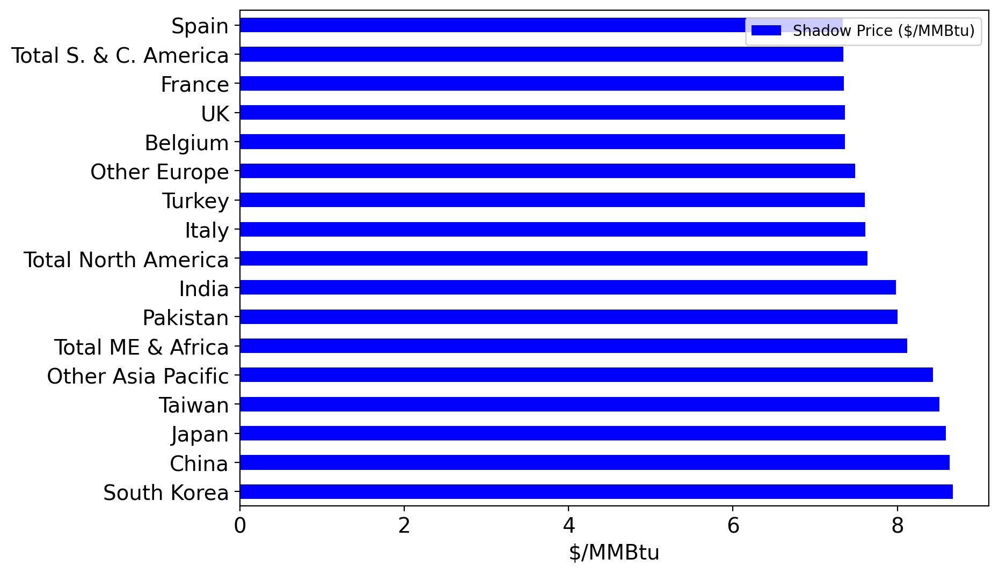

In [68]:
dual_import_Feb = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Feb.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_Feb.dmd.keys():
        c = CUS[n-1]
        dual_import_Feb.loc["Shadow Price ($/MMBtu)", c] = model_2019_Feb.dual[model_2019_Feb.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_Feb[c]/MMBtu_Gas/10**9,model_2019_Feb.dmd[n]()/MMBtu_Gas/10**9,model_2019_Feb.dual[model_2019_Feb.dmd[n]]))

Dual_Import_Feb = dual_import_Feb.T
Dual_Import_Feb

Dual_Import_Feb.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_Feb.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.3 March

Japan                                10.2      10.2      8.6058
China                                 5.5       5.5      8.6368
South Korea                           3.8       3.8      8.6988
India                                 2.4       2.4      8.2375
Taiwan                                2.0       2.0      8.5315
Pakistan                              1.2       1.2      8.1460
France                                2.3       2.3      7.9244
Spain                                 1.5       1.5      7.8164
UK                                    1.8       1.8      7.9295
Italy                                 1.6       1.6      8.0853
Turkey                                1.4       1.4      8.0825
Belgium                               1.1       1.1      7.9323
Other Asia Pacific                    2.2       2.2      8.6267
Other Europe                          1.7       1.7      8.0522
Total North America                   1.0       1.0      8.2158
Total S. & C. America                 0.

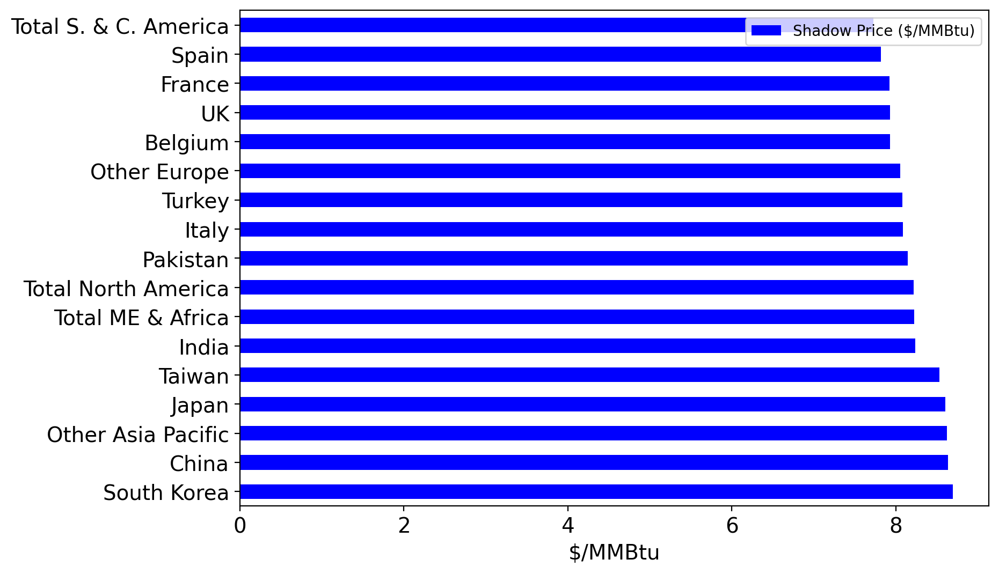

In [69]:
dual_import_Mar = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Mar.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_Mar.dmd.keys():
        c = CUS[n-1]
        dual_import_Mar.loc["Shadow Price ($/MMBtu)", c] = model_2019_Mar.dual[model_2019_Mar.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_Mar[c]/MMBtu_Gas/10**9,model_2019_Mar.dmd[n]()/MMBtu_Gas/10**9,model_2019_Mar.dual[model_2019_Mar.dmd[n]]))

Dual_Import_Mar = dual_import_Mar.T
Dual_Import_Mar

Dual_Import_Mar.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_Mar.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.4 April

Japan                                 7.8       7.8      8.6058
China                                 6.2       6.2      8.6368
South Korea                           4.0       4.0      8.6988
India                                 2.6       2.6      8.5737
Taiwan                                2.1       2.1      8.5315
Pakistan                              1.2       1.2      8.4822
France                                2.6       2.6      7.9938
Spain                                 1.6       1.6      7.9878
UK                                    2.2       2.2      7.9990
Italy                                 1.1       1.1      8.2567
Turkey                                0.7       0.7      8.1798
Belgium                               0.8       0.8      8.0013
Other Asia Pacific                    2.2       2.2      8.6267
Other Europe                          2.2       2.2      8.1216
Total North America                   1.0       1.0      9.1642
Total S. & C. America                 1.

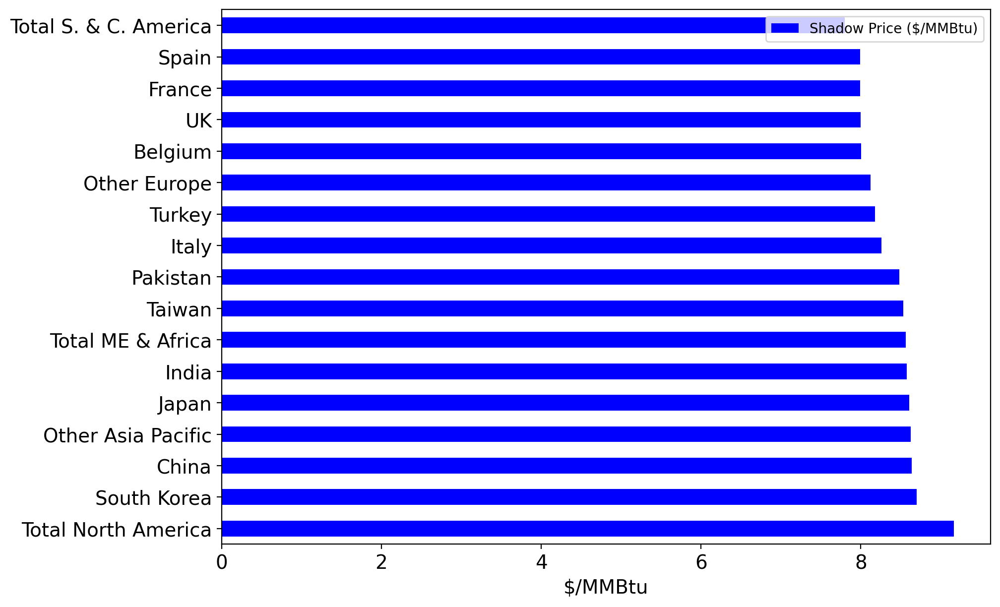

In [70]:
dual_import_Apr = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Apr.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_Apr.dmd.keys():
        c = CUS[n-1]
        dual_import_Apr.loc["Shadow Price ($/MMBtu)", c] = model_2019_Apr.dual[model_2019_Apr.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_Apr[c]/MMBtu_Gas/10**9,model_2019_Apr.dmd[n]()/MMBtu_Gas/10**9,model_2019_Apr.dual[model_2019_Apr.dmd[n]]))

Dual_Import_Apr = dual_import_Apr.T
Dual_Import_Apr

Dual_Import_Apr.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_Apr.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.5 May

Japan                                 7.7       7.7      8.6058
China                                 6.0       6.0      8.6368
South Korea                           4.1       4.1      8.6988
India                                 2.8       2.8      8.5650
Taiwan                                2.0       2.0      8.5315
Pakistan                              1.1       1.1      8.4735
France                                1.8       1.8      7.9244
Spain                                 1.7       1.7      7.9183
UK                                    2.2       2.2      7.9295
Italy                                 1.1       1.1      8.0853
Turkey                                0.5       0.5      8.0825
Belgium                               0.7       0.7      7.9318
Other Asia Pacific                    3.0       3.0      8.6267
Other Europe                          2.4       2.4      8.0522
Total North America                   1.0       1.0      8.2158
Total S. & C. America                 1.

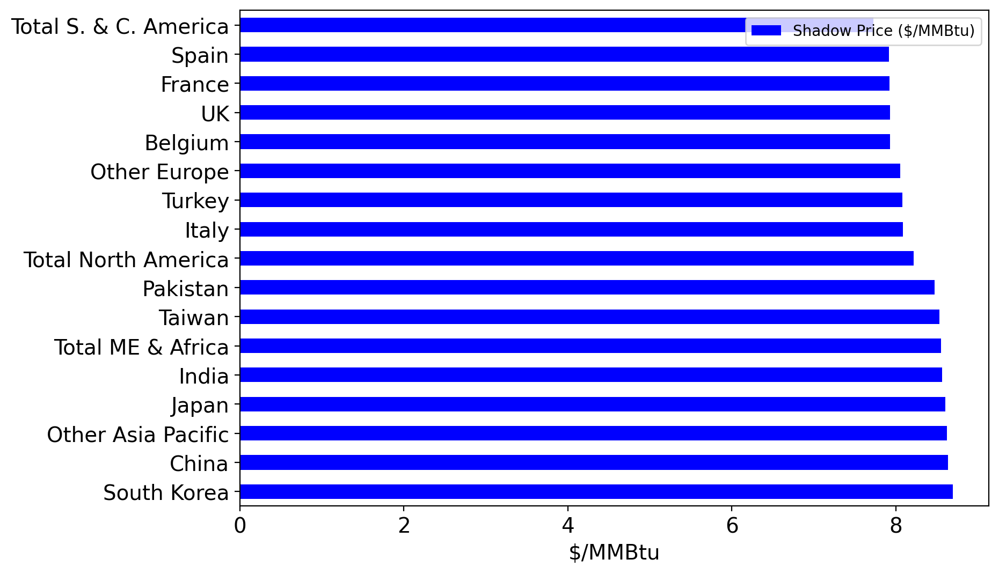

In [71]:
dual_import_May = pd.DataFrame(np.zeros((1,len(Merit_Order_3_May.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_May.dmd.keys():
        c = CUS[n-1]
        dual_import_May.loc["Shadow Price ($/MMBtu)", c] = model_2019_May.dual[model_2019_May.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_May[c]/MMBtu_Gas/10**9,model_2019_May.dmd[n]()/MMBtu_Gas/10**9,model_2019_May.dual[model_2019_May.dmd[n]]))

Dual_Import_May = dual_import_May.T
Dual_Import_May

Dual_Import_May.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_May.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.6 June

Japan                                 7.2       7.2      8.6138
China                                 6.2       6.2      8.6368
South Korea                           4.5       4.5      8.7068
India                                 2.7       2.7      8.6874
Taiwan                                1.9       1.9      8.5395
Pakistan                              1.1       1.1      8.5959
France                                1.7       1.7      8.0468
Spain                                 1.9       1.9      8.0407
UK                                    0.8       0.8      8.0519
Italy                                 1.4       1.4      8.3097
Turkey                                0.7       0.7      8.2049
Belgium                               0.7       0.7      8.0441
Other Asia Pacific                    2.0       2.0      8.5159
Other Europe                          2.3       2.3      8.0602
Total North America                   1.3       1.3      8.3382
Total S. & C. America                 1.

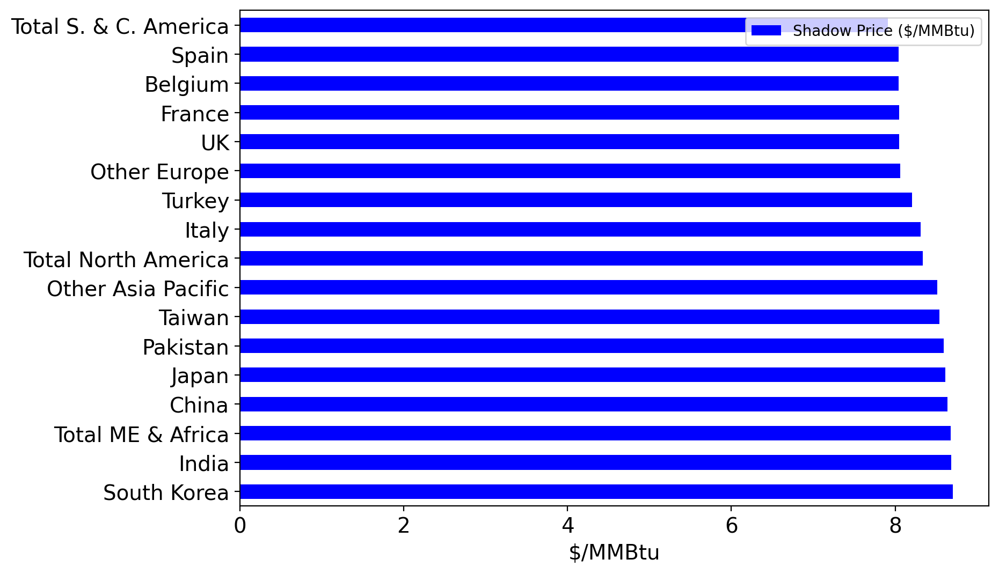

In [72]:
dual_import_Jun = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Jun.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_Jun.dmd.keys():
        c = CUS[n-1]
        dual_import_Jun.loc["Shadow Price ($/MMBtu)", c] = model_2019_Jun.dual[model_2019_Jun.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_Jun[c]/MMBtu_Gas/10**9,model_2019_Jun.dmd[n]()/MMBtu_Gas/10**9,model_2019_Jun.dual[model_2019_Jun.dmd[n]]))

Dual_Import_Jun = dual_import_Jun.T
Dual_Import_Jun

Dual_Import_Jun.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_Jun.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.7 July

Japan                                 7.2       7.2      8.5901
China                                 6.7       6.7      8.6368
South Korea                           4.5       4.5      8.6988
India                                 2.8       2.8      8.1757
Taiwan                                2.3       2.3      8.5315
Pakistan                              1.1       1.1      8.0841
France                                1.0       1.0      7.5351
Spain                                 2.5       2.5      7.4271
UK                                    0.4       0.4      7.5402
Italy                                 1.3       1.3      7.6960
Turkey                                0.5       0.5      7.7951
Belgium                               0.9       0.9      7.5430
Other Asia Pacific                    2.7       2.7      8.5159
Other Europe                          1.9       1.9      7.6628
Total North America                   0.8       0.8      7.8264
Total S. & C. America                 2.

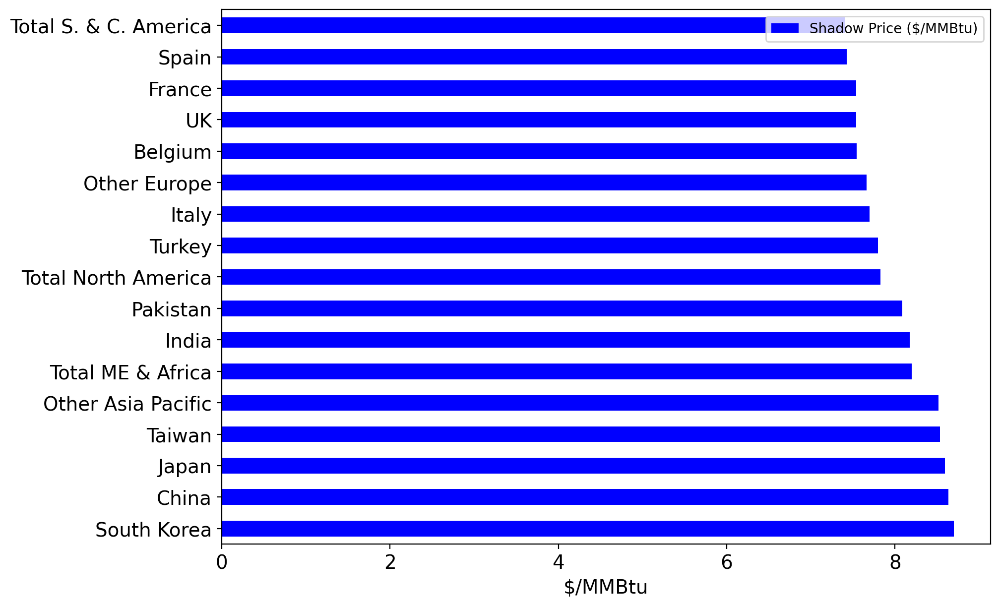

In [73]:
dual_import_Jul = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Jul.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_Jul.dmd.keys():
        c = CUS[n-1]
        dual_import_Jul.loc["Shadow Price ($/MMBtu)", c] = model_2019_Jul.dual[model_2019_Jul.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_Jul[c]/MMBtu_Gas/10**9,model_2019_Jul.dmd[n]()/MMBtu_Gas/10**9,model_2019_Jul.dual[model_2019_Jul.dmd[n]]))

Dual_Import_Jul = dual_import_Jul.T
Dual_Import_Jul

Dual_Import_Jul.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_Jul.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.8 August

Japan                                 8.5       8.5      8.9788
China                                 7.5       7.5      8.8711
South Korea                           4.9       4.9      8.9411
India                                 2.8       2.8      9.0571
Taiwan                                1.9       1.9      8.7817
Pakistan                              1.0       1.0      9.0573
France                                1.6       1.6      8.4130
Spain                                 2.1       2.1      8.3085
UK                                    0.2       0.2      8.4068
Italy                                 1.3       1.3      8.5774
Turkey                                0.8       0.8      8.5746
Belgium                               0.9       0.9      8.4091
Other Asia Pacific                    2.5       2.5      8.7057
Other Europe                          1.9       1.9      8.4252
Total North America                   1.1       1.1      9.1642
Total S. & C. America                 1.

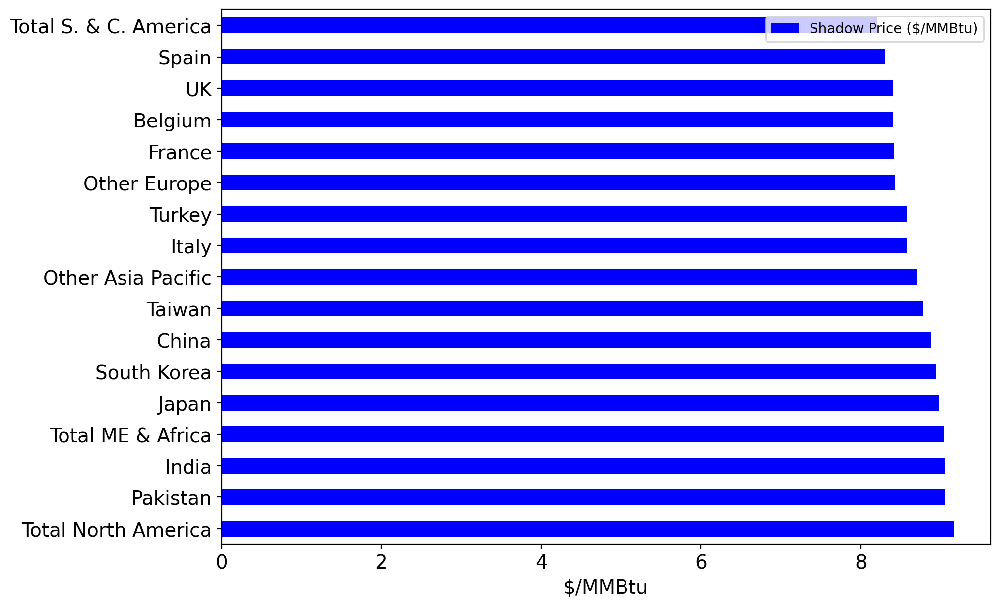

In [74]:
dual_import_Aug = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Aug.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])



for n in model_2019_Aug.dmd.keys():
        c = CUS[n-1]
        dual_import_Aug.loc["Shadow Price ($/MMBtu)", c] = model_2019_Aug.dual[model_2019_Aug.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_Aug[c]/MMBtu_Gas/10**9,model_2019_Aug.dmd[n]()/MMBtu_Gas/10**9,model_2019_Aug.dual[model_2019_Aug.dmd[n]]))

Dual_Import_Aug = dual_import_Aug.T
Dual_Import_Aug

Dual_Import_Aug.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_Aug.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.9 September

Japan                                 8.9       8.9      8.6058
China                                 6.9       6.9      8.6368
South Korea                           3.4       3.4      8.6988
India                                 2.8       2.8      8.1008
Taiwan                                2.0       2.0      8.5315
Pakistan                              1.0       1.0      8.0841
France                                1.3       1.3      7.4515
Spain                                 2.1       2.1      7.3540
UK                                    1.3       1.3      7.4566
Italy                                 1.1       1.1      7.7144
Turkey                                0.6       0.6      7.6236
Belgium                               0.3       0.3      7.4590
Other Asia Pacific                    2.3       2.3      8.5159
Other Europe                          1.8       1.8      7.5880
Total North America                   1.0       1.0      8.6541
Total S. & C. America                 1.

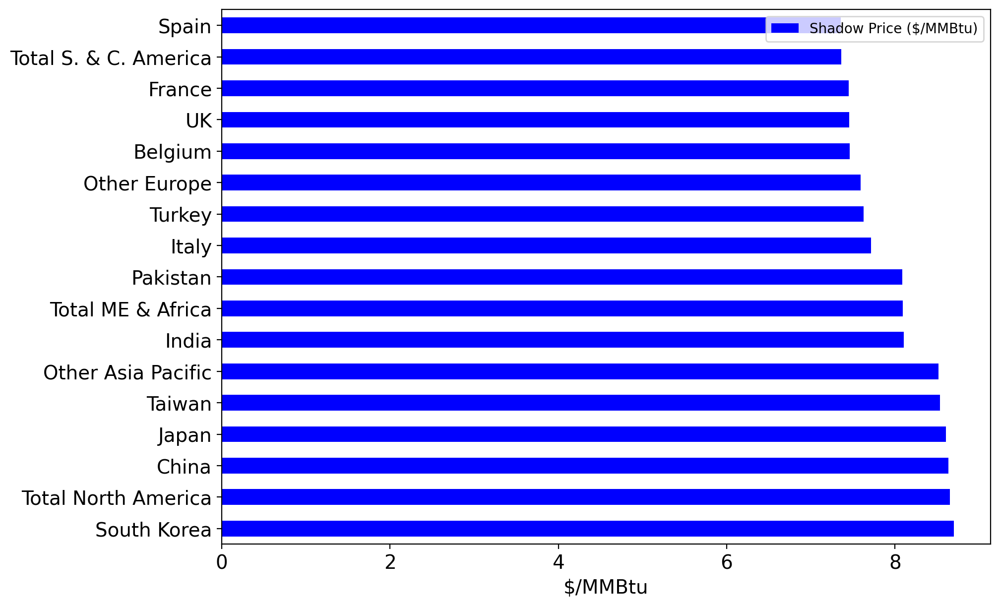

In [75]:
dual_import_Sep = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Sep.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_Sep.dmd.keys():
        c = CUS[n-1]
        dual_import_Sep.loc["Shadow Price ($/MMBtu)", c] = model_2019_Sep.dual[model_2019_Sep.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_Sep[c]/MMBtu_Gas/10**9,model_2019_Sep.dmd[n]()/MMBtu_Gas/10**9,model_2019_Sep.dual[model_2019_Sep.dmd[n]]))

Dual_Import_Sep = dual_import_Sep.T
Dual_Import_Sep

Dual_Import_Sep.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_Sep.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.10 October

Japan                                 8.9       8.9      8.6058
China                                 5.7       5.7      8.6368
South Korea                           4.4       4.4      8.6988
India                                 2.8       2.8      8.5650
Taiwan                                2.0       2.0      8.5315
Pakistan                              1.1       1.1      8.4735
France                                1.8       1.8      7.9244
Spain                                 2.0       2.0      7.8164
UK                                    1.9       1.9      7.9295
Italy                                 1.4       1.4      8.0853
Turkey                                0.8       0.8      8.0825
Belgium                               0.8       0.8      7.9318
Other Asia Pacific                    2.2       2.2      8.6267
Other Europe                          2.1       2.1      8.0522
Total North America                   0.9       0.9      8.2158
Total S. & C. America                 0.

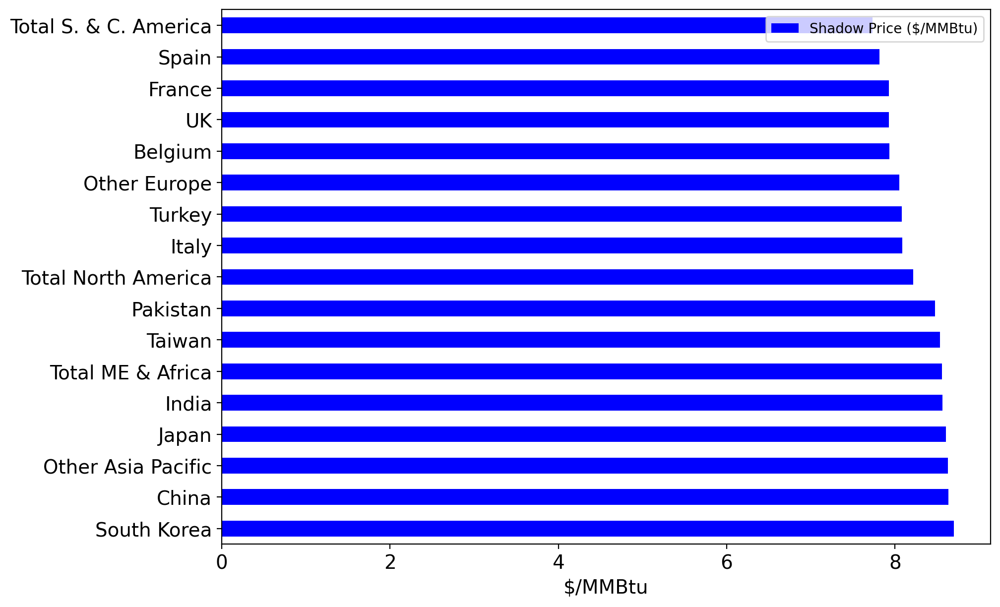

In [76]:
dual_import_Oct = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Oct.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_Oct.dmd.keys():
        c = CUS[n-1]
        dual_import_Oct.loc["Shadow Price ($/MMBtu)", c] = model_2019_Oct.dual[model_2019_Oct.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_Oct[c]/MMBtu_Gas/10**9,model_2019_Oct.dmd[n]()/MMBtu_Gas/10**9,model_2019_Oct.dual[model_2019_Oct.dmd[n]]))

Dual_Import_Oct = dual_import_Oct.T
Dual_Import_Oct

Dual_Import_Oct.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_Oct.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.11 November

Japan                                 8.8       8.8      9.4270
China                                 8.7       8.7      9.3193
South Korea                           5.2       5.2      9.3894
India                                 2.8       2.8      9.0571
Taiwan                                1.5       1.5      9.2299
Pakistan                              0.7       0.7      9.0741
France                                2.8       2.8      8.7457
Spain                                 1.9       1.9      8.6360
UK                                    2.4       2.4      8.7508
Italy                                 0.9       0.9      8.9068
Turkey                                1.1       1.1      8.9038
Belgium                               1.0       1.0      8.7531
Other Asia Pacific                    3.9       3.9      9.1985
Other Europe                          2.3       2.3      8.8734
Total North America                   0.6       0.6      9.0370
Total S. & C. America                 0.

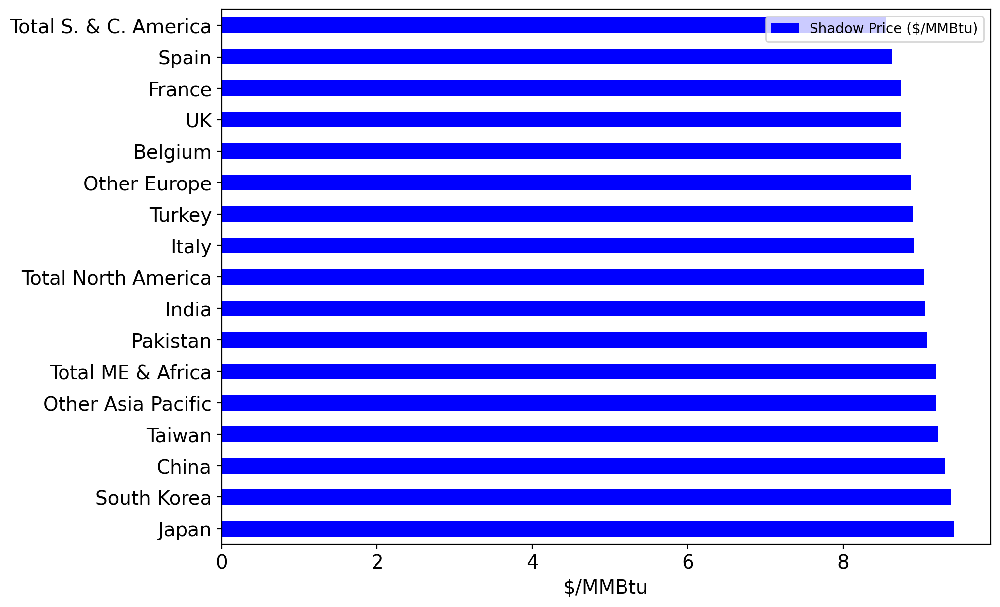

In [77]:
dual_import_Nov = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Nov.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_Nov.dmd.keys():
        c = CUS[n-1]
        dual_import_Nov.loc["Shadow Price ($/MMBtu)", c] = model_2019_Nov.dual[model_2019_Nov.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_Nov[c]/MMBtu_Gas/10**9,model_2019_Nov.dmd[n]()/MMBtu_Gas/10**9,model_2019_Nov.dual[model_2019_Nov.dmd[n]]))

Dual_Import_Nov = dual_import_Nov.T
Dual_Import_Nov

Dual_Import_Nov.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_Nov.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.12 December

Japan                                 9.4       9.4      9.6400
China                                10.3      10.3      9.5323
South Korea                           6.5       6.5      9.6024
India                                 2.8       2.8      9.0571
Taiwan                                1.8       1.8      9.4429
Pakistan                              1.0       1.0      8.9656
France                                2.6       2.6      8.7457
Spain                                 1.8       1.8      8.6360
UK                                    3.0       3.0      8.7508
Italy                                 1.1       1.1      8.9068
Turkey                                1.9       1.9      8.9038
Belgium                               1.0       1.0      8.7531
Other Asia Pacific                    4.1       4.1      9.4115
Other Europe                          2.1       2.1      8.8734
Total North America                   1.0       1.0      9.1642
Total S. & C. America                 0.

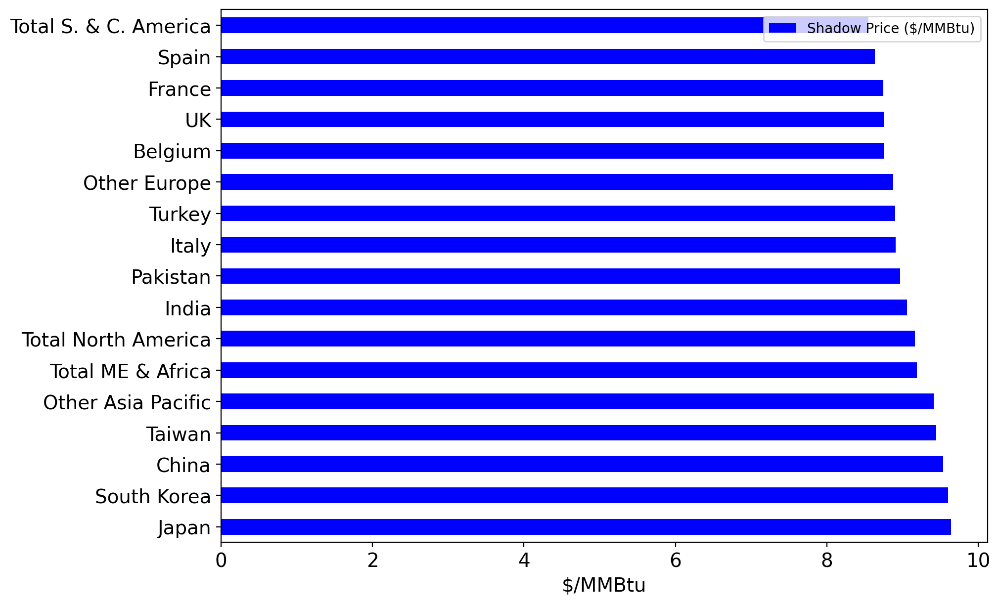

In [78]:
dual_import_Dec = pd.DataFrame(np.zeros((1,len(Merit_Order_3_Dec.columns))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_Dec.dmd.keys():
        c = CUS[n-1]
        dual_import_Dec.loc["Shadow Price ($/MMBtu)", c] = model_2019_Dec.dual[model_2019_Dec.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_Dec[c]/MMBtu_Gas/10**9,model_2019_Dec.dmd[n]()/MMBtu_Gas/10**9,model_2019_Dec.dual[model_2019_Dec.dmd[n]]))

Dual_Import_Dec = dual_import_Dec.T
Dual_Import_Dec

Dual_Import_Dec.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_Dec.plot(kind = 'barh', figsize = (10, 7), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 5.2.13 Importer Monthly Shadow Prices

/tmp/ipykernel_18619/1955412461.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/1955412461.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/1955412461.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/1955412461.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/1955412461.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/1955412461.py:8: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future

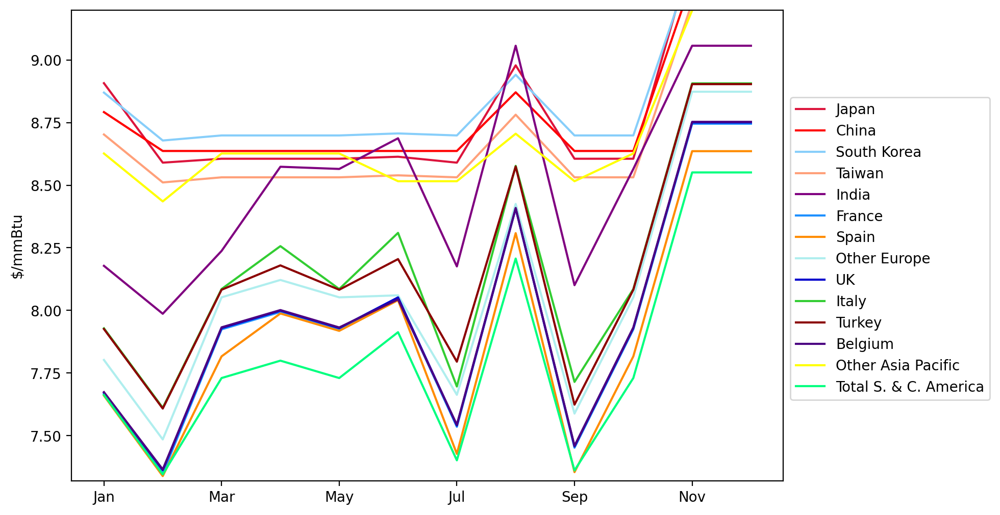

In [79]:
Importer_Shadow = dual_import_Jan

Importer_Shadow = Importer_Shadow.append(dual_import_Feb)
Importer_Shadow = Importer_Shadow.append(dual_import_Mar)
Importer_Shadow = Importer_Shadow.append(dual_import_Apr)
Importer_Shadow = Importer_Shadow.append(dual_import_May)
Importer_Shadow = Importer_Shadow.append(dual_import_Jun)
Importer_Shadow = Importer_Shadow.append(dual_import_Jul)
Importer_Shadow = Importer_Shadow.append(dual_import_Aug)
Importer_Shadow = Importer_Shadow.append(dual_import_Sep)
Importer_Shadow = Importer_Shadow.append(dual_import_Oct)
Importer_Shadow = Importer_Shadow.append(dual_import_Nov)
Importer_Shadow = Importer_Shadow.append(dual_import_Dec)


Importer_Shadow = Importer_Shadow.set_index(idx)

ax = plt.gca()

Importer_Shadow.plot(kind='line', y='Japan', ylim=(7.32,9.2), ax=ax, color = 'crimson', figsize = (9, 6))
Importer_Shadow.plot(kind='line',y='China', ax=ax, color = 'red')
Importer_Shadow.plot(kind='line',y='South Korea', ax=ax, color = 'lightskyblue')
Importer_Shadow.plot(kind='line',y='Taiwan', ax=ax, color = 'lightsalmon')
Importer_Shadow.plot(kind='line',y='India', ax=ax, color = 'purple')
Importer_Shadow.plot(kind='line',y='France', ax=ax, color = 'dodgerblue')
Importer_Shadow.plot(kind='line',y='Spain', ax=ax, color = 'darkorange')
Importer_Shadow.plot(kind='line',y='Other Europe', ax=ax, color = 'paleturquoise')
Importer_Shadow.plot(kind='line',y='UK', ax=ax, color = 'mediumblue')
Importer_Shadow.plot(kind='line',y='Italy', ax=ax, color = 'limegreen')
Importer_Shadow.plot(kind='line',y='Turkey', ax=ax, color = 'darkred')
Importer_Shadow.plot(kind='line',y='Belgium', ax=ax, color = 'indigo')
Importer_Shadow.plot(kind='line',y='Other Asia Pacific', ax=ax, color = 'yellow')
Importer_Shadow.plot(kind='line',y='Total S. & C. America', ax=ax, color = 'springgreen')


# colours_exp_imp = ["crimson", "red", "lightskyblue", "saddlebrown", "lightsalmon", "seagreen",
#                    "dodgerblue", "darkorange", "mediumblue", "limegreen", "darkred", "indigo",
#                    "yellow", "paleturquoise", "steelblue", "seagreen", "springgreen"]

#ax = Importer_Shadow.plot(figsize = (9, 6), ylim=(7.32,9.7))
ax.set_ylabel("$/mmBtu")
plt.legend(bbox_to_anchor=(1, 0.83))
plt.show()
#Importer_Shadow.T

## 6 Outlook

### 6.1 2019

In [80]:
model_2019 = LNG_Model_3(Demand_2019, Supply_2019)
results_2019 = SolverFactory('glpk').solve(model_2019)
results_2019.write()
Demand_2019

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: unknown
  Lower bound: 107162663938.078
  Upper bound: 107162663938.078
  Number of objectives: 1
  Number of constraints: 288
  Number of variables: 256
  Number of nonzeros: 766
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Termination condition: optimal
  Statistics: 
    Branch and bound: 
      Number of bounded subproblems: 0
      Number of created subproblems: 0
  Error rc: 0
  Time: 0.030960559844970703
# ----------------------------------------------------------
#   Solution Information
# --------

{'Japan': 3801599999.9999995,
 'China': 3056400000.0,
 'South Korea': 2001599999.9999998,
 'India': 1184400000.0,
 'Taiwan': 835199999.9999999,
 'Pakistan': 446399999.99999994,
 'France': 831599999.9999999,
 'Spain': 788400000.0,
 'UK': 687600000.0,
 'Italy': 514799999.99999994,
 'Turkey': 475199999.99999994,
 'Belgium': 324000000.0,
 'Other Asia Pacific': 1101600000.0,
 'Other Europe': 878399999.9999999,
 'Total North America': 403199999.99999994,
 'Total S. & C. America': 485999999.99999994,
 'Total ME & Africa': 392400000.0}

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: unknown
  Lower bound: 107162663938.078
  Upper bound: 107162663938.078
  Number of objectives: 1
  Number of constraints: 288
  Number of variables: 256
  Number of nonzeros: 766
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Termination condition: optimal
  Statistics: 
    Branch and bound: 
      Number of bounded subproblems: 0
      Number of created subproblems: 0
  Error rc: 0
  Time: 0.02482771873474121
# ----------------------------------------------------------
#   Solution Information
# ---------

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,23.600035,28.3000,18.533333,10.966667,7.733333,4.133333,0.000000,0.0,0.000000,0.000000e+00,0.0,0.0,10.2,0.000000,0.000000,0.000000,3.633333
Australia,35.200000,11.5659,18.533333,0.000000,7.733333,0.000000,0.000000,0.0,0.000000,0.000000e+00,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
USA,2.226200,0.0000,0.000000,0.000000,0.000000,0.000000,7.700000,7.3,6.366667,4.766667e+00,4.4,3.0,0.0,8.133333,3.733333,4.500000,0.000000
Russia,35.200000,0.0000,0.417565,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000e+00,0.0,0.0,0.0,3.631533,0.000000,0.000000,0.000000
Malaysia,0.000000,28.3000,3.559500,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000e+00,0.0,0.0,10.2,0.000000,0.000000,0.000000,0.000000
Nigeria,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,4.434967,7.3,0.000000,4.766667e+00,4.4,0.0,0.0,5.212167,0.000000,4.500000,0.000000
Trinidad & Tobago,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,3.265033,0.0,6.366667,1.655685e-15,0.0,3.0,0.0,0.000000,3.733333,4.044167,0.000000
Algeria,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,7.700000,7.3,6.366667,4.766667e+00,4.4,3.0,0.0,1.631167,0.000000,0.000000,0.000000
Indonesia,0.000000,16.7341,2.013967,0.000000,7.733333,0.000000,0.000000,0.0,0.000000,0.000000e+00,0.0,0.0,10.2,0.000000,0.000000,0.000000,0.000000
Oman,0.000000,0.0000,0.000000,10.735133,0.000000,0.000000,0.000000,0.0,0.000000,0.000000e+00,0.0,0.0,0.0,0.000000,0.000000,0.000000,3.606467


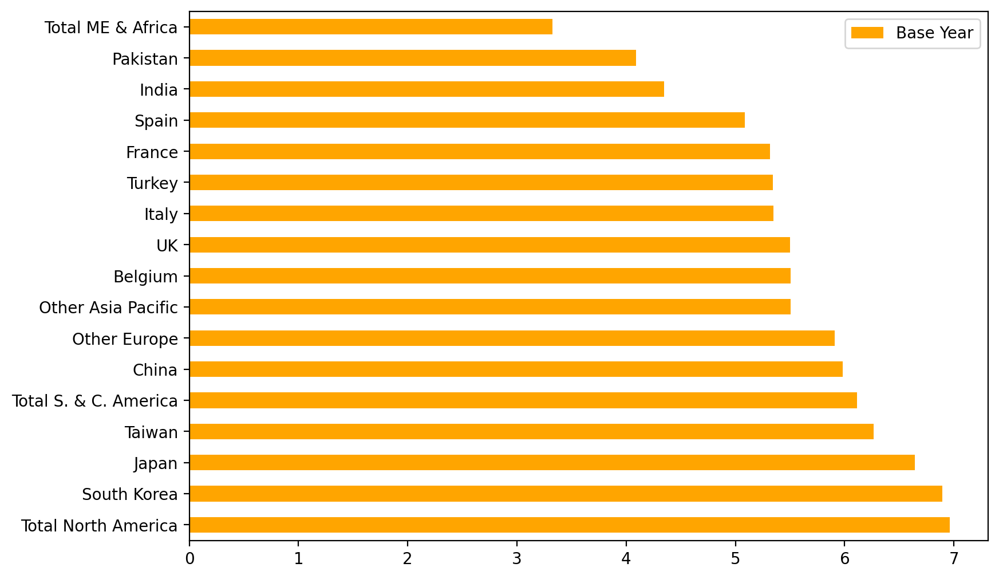

In [81]:
model_3_2019 = ConcreteModel()
model_3_2019.dual = Suffix(direction=Suffix.IMPORT)

CUS_2019 = list(Demand_2019.keys()) 
SRC_2019 = list(Supply_2019.keys())

model_3_2019.x = Var(CUS_2019, SRC_2019, domain = NonNegativeReals)

model_3_2019.Cost = Objective(
    expr = sum([Cost[c,s]*model_3_2019.x[c,s] for c in CUS_2019 for s in SRC_2019]),
    sense = minimize)

model_3_2019.src = ConstraintList()
for s in SRC_2019:
    model_3_2019.src.add(sum([model_3_2019.x[c,s] for c in CUS_2019]) <= Supply_2019[s])
        
model_3_2019.dmd = ConstraintList()
for c in CUS_2019:
    model_3_2019.dmd.add(sum([model_3_2019.x[c,s] for s in SRC_2019]) == Demand_2019[c])

model_3_2019.div = ConstraintList()
for c in CUS_2019:
    for s in SRC_2019:
        model_3_2019.div.add(model_3_2019.x[c,s] <= (1/3) * Demand_2019[c])
    
results_3_2019 = SolverFactory('glpk').solve(model_3_2019)
results_3_2019.write()

transported_LNG_3_2019 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_2019.index:
    for importer in transported_LNG_3_2019.columns:
        transported_LNG_3_2019.loc[exporter, importer] = model_3_2019.x[importer, exporter]() / MMBtu_Gas / 1000000000


#Merit_Order_3_2019

Merit_Order_3_2019 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))


for i in transported_LNG_3_2019.index:
    for j in transported_LNG_3_2019.columns:
        if transported_LNG_3_2019.loc[i,j] > 0:
            Merit_Order_3_2019.loc[i,j] = Total_Costs.loc[i,j]


Sum_3_2019 = Merit_Order_3_2019 * transported_LNG_3_2019 * MMBtu_Gas * 1000000000

DES_Pr_3_2019 = pd.DataFrame(np.zeros((1,len(Merit_Order_3_2019.columns))),
                   
                   index = ["Base Year"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_2019 = pd.DataFrame(np.zeros((1,len(Merit_Order_3_2019.columns))),
                   
                   index = ["Base Year"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_2019.loc["Base Year"] = [105.6*10**9 * MMBtu_Gas, 84.9*10**9 * MMBtu_Gas, 55.6*10**9 * MMBtu_Gas,
                         32.9*10**9 * MMBtu_Gas, 23.2*10**9 * MMBtu_Gas, 12.4*10**9 * MMBtu_Gas,
                         23.1*10**9 * MMBtu_Gas, 21.9*10**9 * MMBtu_Gas, 19.1*10**9 * MMBtu_Gas,
                         14.3*10**9 * MMBtu_Gas, 13.2*10**9 * MMBtu_Gas, 9*10**9 * MMBtu_Gas,
                         30.6*10**9 * MMBtu_Gas, 24.4*10**9 * MMBtu_Gas, 11.2*10**9 * MMBtu_Gas,
                         13.5*10**9 * MMBtu_Gas, 10.9*10**9 * MMBtu_Gas]


for column in Sum_3_2019.columns:
    DES_Pr_3_2019.loc["Base Year", column] = Sum_3_2019[column].sum()


DES_Pri_3_2019 = DES_Pr_3_2019 / Imp_3_2019
DES_Price_3_2019 = DES_Pri_3_2019.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_2019.sort_values(by="Base Year", ascending=False, inplace = True)

DES_Price_3_2019.plot(kind = 'barh', color = 'orange', figsize=(9,6))
transported_LNG_3_2019

### 6.1.1 Shadow Exporter 2019

Qatar                       107.1         107.1       -4.5549
Australia                   118.6          73.0        0.0000
USA                          52.1          52.1       -0.0237
Russia                       39.2          39.2       -2.7084
Malaysia                     42.1          42.1       -2.0630
Nigeria                      30.6          30.6       -2.5976
Trinidad & Tobago            20.4          20.4       -1.6558
Algeria                      35.2          35.2       -4.8041
Indonesia                    36.7          36.7       -1.9511
Oman                         14.3          14.3       -4.3791
Other Asia Pacific           19.4          19.4       -0.0080
Other Europe                  5.8           5.8       -2.4759
Other Americas                6.2           6.2       -0.4524
Other ME                      8.0           8.0       -4.9933
Other Africa                 15.6          15.6       -2.1994


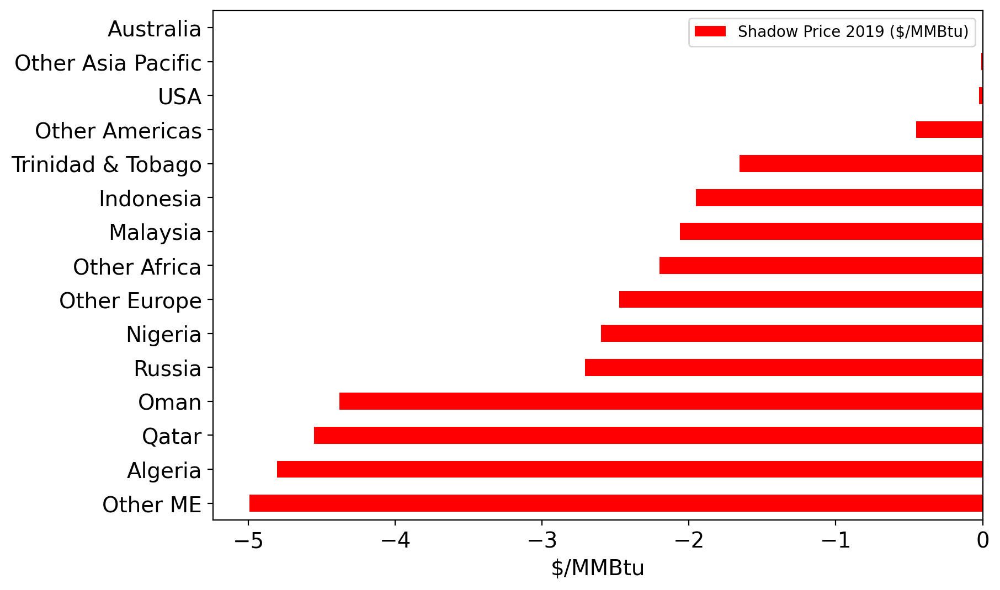

In [82]:
dual_export_2019 = pd.DataFrame(np.zeros((1, len(transported_LNG_3_2019.index))),
                   
                   index = ["Shadow Price 2019 ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])


for m in model_3_2019.src.keys():
        s = SRC_2019[m-1]
        dual_export_2019.loc["Shadow Price 2019 ($/MMBtu)", s] = model_3_2019.dual[model_3_2019.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_2019[s]/MMBtu_Gas/10**9,model_3_2019.src[m]()/MMBtu_Gas/10**9,model_3_2019.dual[model_3_2019.src[m]]))

Dual_Export_2019 = dual_export_2019.T
#Dual_Export

Dual_Export_2019.sort_values("Shadow Price 2019 ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_2019.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

### 6.1.2 Shadowprice Importers 2019

Japan                               105.6     105.6      8.6138
China                                84.9      84.9      8.6368
South Korea                          55.6      55.6      8.7068
India                                32.9      32.9      8.4633
Taiwan                               23.2      23.2      8.5111
Pakistan                             12.4      12.4      8.3662
France                               23.1      23.1      7.8501
Spain                                21.9      21.9      7.7421
UK                                   19.1      19.1      7.8552
Italy                                14.3      14.3      8.1130
Turkey                               13.2      13.2      8.0082
Belgium                               9.0       9.0      7.8580
Other Asia Pacific                   30.6      30.6      8.5159
Other Europe                         24.4      24.4      7.9779
Total North America                  11.2      11.2      8.1415
Total S. & C. America                13.

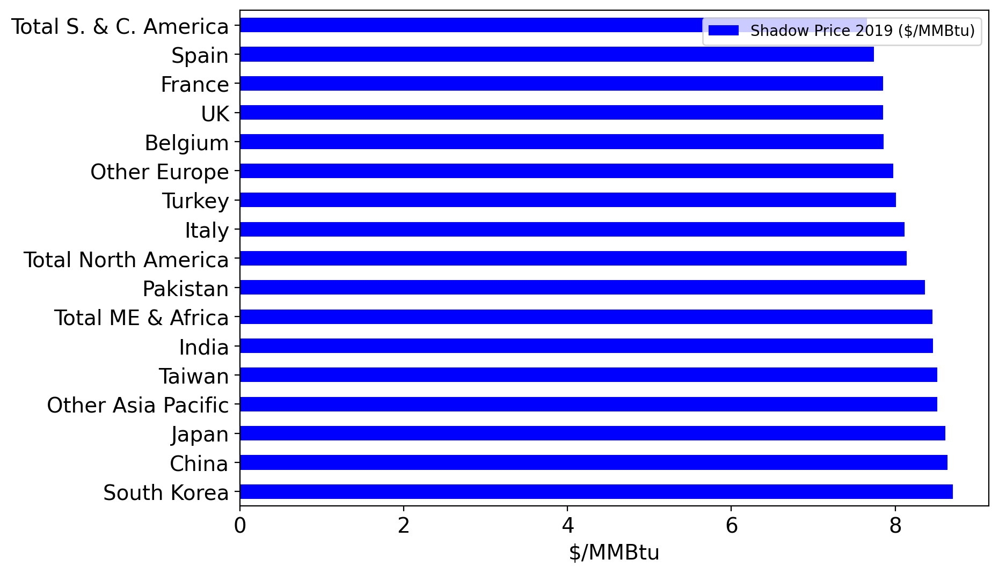

In [83]:
dual_import_2019 = pd.DataFrame(np.zeros((1,len(transported_LNG_3_2019.columns))),
                   
                   index = ["Shadow Price 2019 ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_3_2019.dmd.keys():
        c = CUS_2019[n-1]
        dual_import_2019.loc["Shadow Price 2019 ($/MMBtu)", c] = model_3_2019.dual[model_3_2019.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_2019[c]/MMBtu_Gas/10**9,model_3_2019.dmd[n]()/MMBtu_Gas/10**9,model_3_2019.dual[model_3_2019.dmd[n]]))

Dual_Import_2019 = dual_import_2019.T
Dual_Import_2019

Dual_Import_2019.sort_values("Shadow Price 2019 ($/MMBtu)", inplace = True, ascending=False)
ax = Dual_Import_2019.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

### 6.2 2030

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: unknown
  Lower bound: 221002364540.587
  Upper bound: 221002364540.587
  Number of objectives: 1
  Number of constraints: 288
  Number of variables: 256
  Number of nonzeros: 766
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Termination condition: optimal
  Statistics: 
    Branch and bound: 
      Number of bounded subproblems: 0
      Number of created subproblems: 0
  Error rc: 0
  Time: 0.025689125061035156
# ----------------------------------------------------------
#   Solution Information
# --------

<AxesSubplot:>

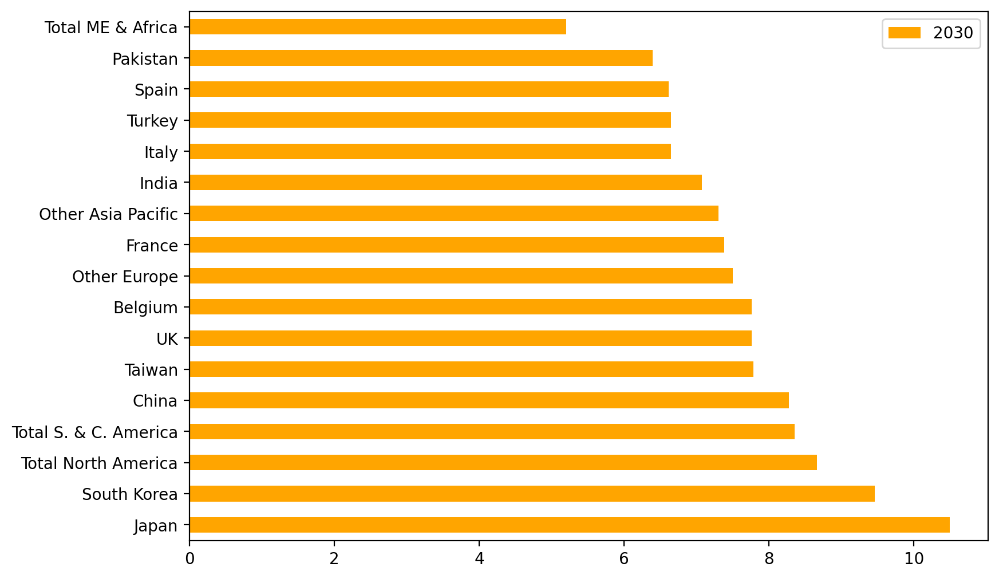

In [84]:
Supply_2030 = Exp_Nodes.set_index("Country")["Export 2030 (MMBtu)"].to_dict()

Demand_2030 = Imp_Nodes.set_index("Country")["Import 2030 (MMBtu)"].to_dict()

Cost_2030 = {}

for index in Total_Costs_2030.index:
    for column in Total_Costs_2030.columns:
        Cost_2030[column, index] = Total_Costs_2030.loc[index,column]

model_3_2030 = ConcreteModel()
model_3_2030.dual = Suffix(direction=Suffix.IMPORT)

CUS_2030 = list(Demand_2030.keys()) # Customer
SRC_2030 = list(Supply_2030.keys()) # Source

model_3_2030.x = Var(CUS_2030, SRC_2030, domain = NonNegativeReals)

model_3_2030.Cost = Objective(
    expr = sum([Cost_2030[c,s]*model_3_2030.x[c,s] for c in CUS_2030 for s in SRC_2030]),
    sense = minimize)




model_3_2030.src = ConstraintList()
for s in SRC_2030:
    model_3_2030.src.add(sum([model_3_2030.x[c,s] for c in CUS_2030]) <= Supply_2030[s])
    


model_3_2030.dmd = ConstraintList()
for c in CUS_2030:
    model_3_2030.dmd.add(sum([model_3_2030.x[c,s] for s in SRC_2030]) == Demand_2030[c])
    


model_3_2030.div = ConstraintList()
for c in CUS_2030:
    for s in SRC_2030:
        model_3_2030.div.add(model_3_2030.x[c,s] <= (1/3) * Demand_2030[c])
        

results_3_2030 = SolverFactory('glpk').solve(model_3_2030)
results_3_2030.write()

transported_LNG_3_2030 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_2030.index:
    for importer in transported_LNG_3_2030.columns:
        transported_LNG_3_2030.loc[exporter, importer] = model_3_2030.x[importer, exporter]() / MMBtu_Gas / 1000000000

        
        
Merit_Order_3_2030 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))


for i in transported_LNG_3_2030.index:
    for j in transported_LNG_3_2030.columns:
        if transported_LNG_3_2030.loc[i,j] > 0:
            Merit_Order_3_2030.loc[i,j] = Total_Costs_2030.loc[i,j]

#Merit_Order_3_2030

Sum_3_2030 = Merit_Order_3_2030 * transported_LNG_3_2030 * MMBtu_Gas * 1000000000

DES_Pr_3_2030 = pd.DataFrame(np.zeros((1,len(Merit_Order_3_2030.columns))),
                   
                   index = ["2030"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_2030 = pd.DataFrame(np.zeros((1,len(Merit_Order_3_2030.columns))),
                   
                   index = ["2030"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_2030.loc["2030"] = [86.287, 135, 58.6, 55, 28.75, 51.735, 30.944, 29.379,
                        
                             25.574, 19.146, 17.654, 12.093, 120, 40.776, 12.363,
                        
                             14.842, 47.14]

Imp_3_2030 *= 10**9 * MMBtu_Gas
Imp_3_2030

for column in Sum_3_2030.columns:
    DES_Pr_3_2030.loc["2030", column] = Sum_3_2030[column].sum()


DES_Pri_3_2030 = DES_Pr_3_2030 / Imp_3_2030
DES_Price_3_2030 = DES_Pri_3_2030.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_2030.sort_values(by="2030", ascending=False, inplace = True)

DES_Price_3_2030.plot(kind = 'barh', color = 'orange', figsize=(9,6))

#### 6.2.1 Shadowprice Exporter 2030

Qatar                       151.7         151.7       -5.9862
Australia                   124.4         124.4       -0.0300
USA                         150.5         129.2        0.0000
Russia                       60.0          60.0       -3.4703
Malaysia                     43.0          43.0       -2.7425
Nigeria                      39.3          39.3       -3.4894
Trinidad & Tobago            17.0          17.0       -2.3184
Algeria                      20.0          20.0       -6.4424
Indonesia                    37.7          37.7       -2.5937
Oman                         15.9          15.9       -5.8140
Other Asia Pacific           20.9          20.9       -0.1304
Other Europe                  8.6           8.6       -3.3381
Other Americas               50.0          50.0       -0.5346
Other ME                      7.7           7.7       -6.8121
Other Africa                 60.0          60.0       -2.7975


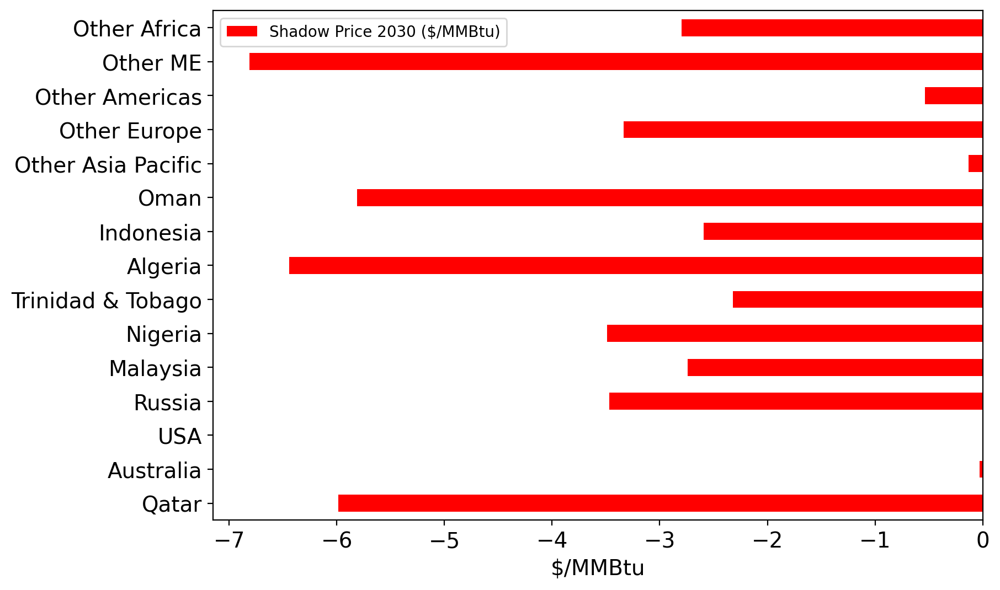

In [85]:
dual_export_2030 = pd.DataFrame(np.zeros((1, len(Merit_Order_3_2030.index))),
                   
                   index = ["Shadow Price 2030 ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])

for m in model_3_2030.src.keys():
        s = SRC_2030[m-1]
        dual_export_2030.loc["Shadow Price 2030 ($/MMBtu)", s] = model_3_2030.dual[model_3_2030.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_2030[s]/MMBtu_Gas/10**9,model_3_2030.src[m]()/MMBtu_Gas/10**9,model_3_2030.dual[model_3_2030.src[m]]))

Dual_Export_2030 = dual_export_2030.T
#Dual_Export

#Dual_Export_2030.sort_values("Shadow Price 2030 ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_2030.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 6.2.2 Shadowprice Importer 2030

Japan                                86.3      86.3     10.6896
China                               135.0     135.0     10.9065
South Korea                          58.6      58.6     10.9286
India                                55.0      55.0     10.8168
Taiwan                               28.8      28.8     10.6989
Pakistan                             51.7      51.7     10.7783
France                               30.9      30.9     10.0202
Spain                                29.4      29.4      9.8860
UK                                   25.6      25.6     10.0266
Italy                                19.1      19.1     10.2204
Turkey                               17.7      17.7     10.2189
Belgium                              12.1      12.1     10.0301
Other Asia Pacific                  120.0     120.0     10.7563
Other Europe                         40.8      40.8     10.1791
Total North America                  12.4      12.4     11.4245
Total S. & C. America                14.

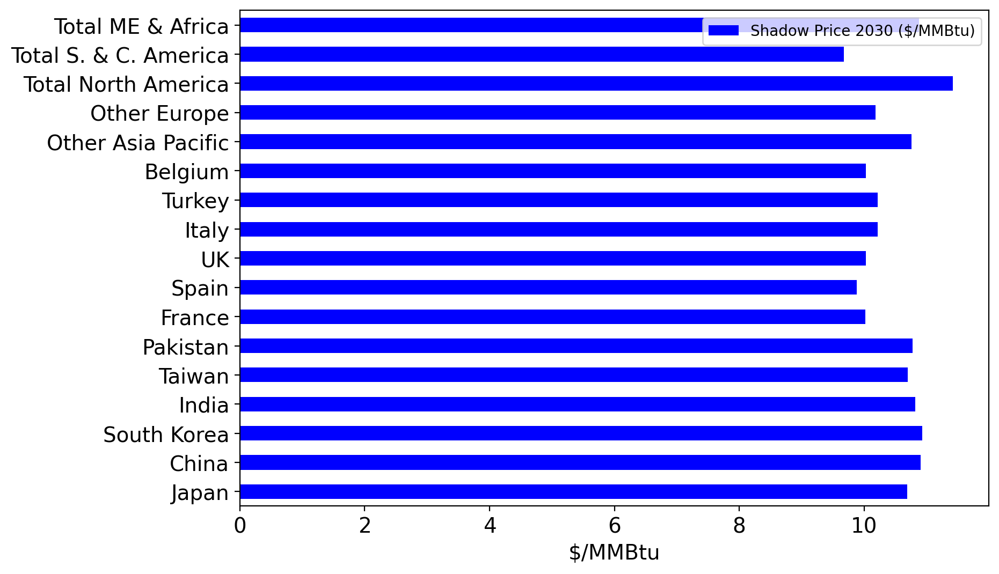

In [86]:
dual_import_2030 = pd.DataFrame(np.zeros((1,len(Merit_Order_3_2030.columns))),
                   
                   index = ["Shadow Price 2030 ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_3_2030.dmd.keys():
        c = CUS_2030[n-1]
        dual_import_2030.loc["Shadow Price 2030 ($/MMBtu)", c] = model_3_2030.dual[model_3_2030.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_2030[c]/MMBtu_Gas/10**9,model_3_2030.dmd[n]()/MMBtu_Gas/10**9,model_3_2030.dual[model_3_2030.dmd[n]]))

Dual_Import_2030 = dual_import_2030.T
Dual_Import_2030

#Dual_Import_2030.sort_values("Shadow Price 2030 ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_2030.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

### 6.3 2040

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: unknown
  Lower bound: 353661146603.852
  Upper bound: 353661146603.852
  Number of objectives: 1
  Number of constraints: 288
  Number of variables: 256
  Number of nonzeros: 766
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Termination condition: optimal
  Statistics: 
    Branch and bound: 
      Number of bounded subproblems: 0
      Number of created subproblems: 0
  Error rc: 0
  Time: 0.024363994598388672
# ----------------------------------------------------------
#   Solution Information
# --------

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,0.000000,20.129667,0.000000,25.240,10.416667,23.5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,65.130333,0.000,0.000000,0.000000,29.333333
Australia,0.000000,55.892000,20.833333,0.000,10.416667,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,52.858000,0.000,0.000000,0.000000,0.000000
USA,23.946667,36.097333,20.833333,20.243,0.000000,23.5,13.469000,12.787667,11.131667,8.333667,7.684333,5.263667,0.000000,14.933,4.504667,5.405667,5.773333
Russia,23.946667,36.466667,0.000000,0.000,0.000000,0.0,0.000000,0.000000,4.390000,0.000000,0.000000,5.263667,0.000000,14.933,0.000000,0.000000,0.000000
Malaysia,0.000000,0.000000,0.000000,0.000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,43.000000,0.000,0.000000,0.000000,0.000000
Nigeria,0.000000,0.000000,0.000000,4.997,0.000000,0.0,13.469000,12.787667,11.131667,8.333667,7.684333,5.263667,0.000000,6.333,0.000000,0.000000,0.000000
Trinidad & Tobago,0.000000,0.000000,0.000000,0.000,0.000000,0.0,5.753667,0.000000,6.741667,0.000000,0.000000,0.000000,0.000000,0.000,4.504667,0.000000,0.000000
Algeria,0.000000,0.000000,0.000000,0.000,0.000000,0.0,0.000000,3.982000,0.000000,8.333667,7.684333,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
Indonesia,0.000000,0.000000,0.000000,0.000,3.297333,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34.402667,0.000,0.000000,0.000000,0.000000
Oman,0.000000,0.000000,0.000000,0.000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,15.860000


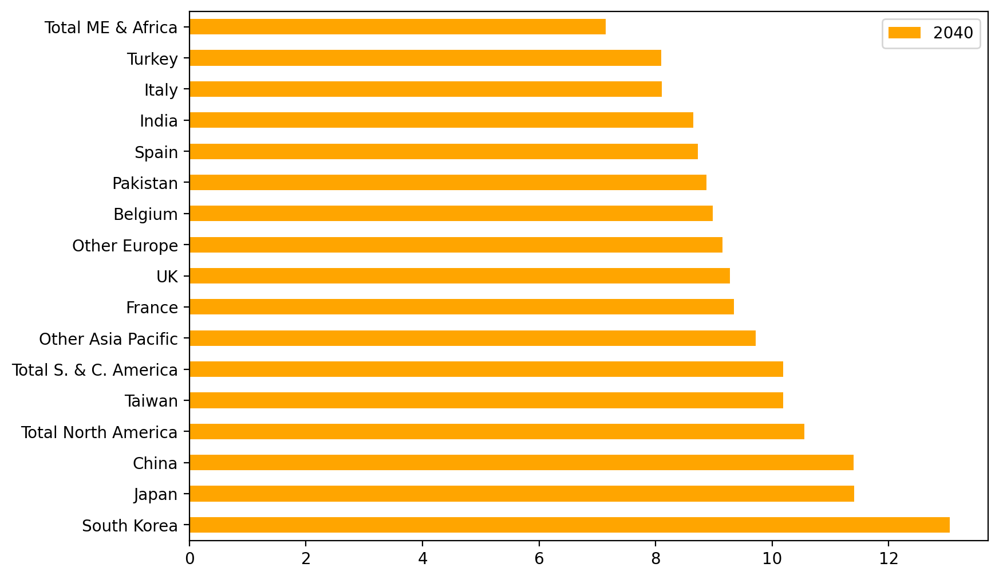

In [87]:
Supply_2040 = Exp_Nodes.set_index("Country")["Export 2040 (MMBtu)"].to_dict()

Demand_2040 = Imp_Nodes.set_index("Country")["Import 2040 (MMBtu)"].to_dict()

Cost_2040 = {}

for index in Total_Costs_2040.index:
    for column in Total_Costs_2040.columns:
        Cost_2040[column, index] = Total_Costs_2040.loc[index,column]

model_3_2040 = ConcreteModel()
model_3_2040.dual = Suffix(direction=Suffix.IMPORT)

CUS_2040 = list(Demand_2040.keys()) 
SRC_2040 = list(Supply_2040.keys()) 

model_3_2040.x = Var(CUS_2040, SRC_2040, domain = NonNegativeReals)

model_3_2040.Cost = Objective(
    expr = sum([Cost_2040[c,s]*model_3_2040.x[c,s] for c in CUS_2040 for s in SRC_2040]),
    sense = minimize)



model_3_2040.src = ConstraintList()
for s in SRC_2040:
    model_3_2040.src.add(sum([model_3_2040.x[c,s] for c in CUS_2040]) <= Supply_2040[s])
    

model_3_2040.dmd = ConstraintList()
for c in CUS_2040:
    model_3_2040.dmd.add(sum([model_3_2040.x[c,s] for s in SRC_2040]) == Demand_2040[c])
    

model_3_2040.div = ConstraintList()
for c in CUS_2040:
    for s in SRC_2040:
        model_3_2040.div.add(model_3_2040.x[c,s] <= (1/3) * Demand_2040[c])
        

results_3_2040 = SolverFactory('glpk').solve(model_3_2040)
results_3_2040.write()

transported_LNG_3_2040 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_3_2040.index:
    for importer in transported_LNG_3_2040.columns:
        transported_LNG_3_2040.loc[exporter, importer] = model_3_2040.x[importer, exporter]() / MMBtu_Gas / 1000000000

        
        
Merit_Order_3_2040 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))


for i in transported_LNG_3_2040.index:
    for j in transported_LNG_3_2040.columns:
        if transported_LNG_3_2040.loc[i,j] > 0:
            Merit_Order_3_2040.loc[i,j] = Total_Costs_2040.loc[i,j]

#Merit_Order_3_2030

Sum_3_2040 = Merit_Order_3_2040 * transported_LNG_3_2040 * MMBtu_Gas * 1000000000

DES_Pr_3_2040 = pd.DataFrame(np.zeros((1,len(Merit_Order_3_2040.columns))),
                   
                   index = ["2040"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_2040 = pd.DataFrame(np.zeros((1,len(Merit_Order_3_2040.columns))),
                   
                   index = ["2040"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_3_2040.loc["2040"] = [71.84, 167.676, 62.5, 75.72, 31.25, 70.5, 40.407,
                             38.363, 33.395, 25.001, 23.053, 15.791, 185.391,
                             44.799, 13.514, 16.217, 85]

Imp_3_2040 *= 10**9 * MMBtu_Gas
Imp_3_2040

for column in Sum_3_2040.columns:
    DES_Pr_3_2040.loc["2040", column] = Sum_3_2040[column].sum()


DES_Pri_3_2040 = DES_Pr_3_2040 / Imp_3_2040
DES_Price_3_2040 = DES_Pri_3_2040.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_2040.sort_values(by="2040", ascending=False, inplace = True)

DES_Price_3_2040.plot(kind = 'barh', color = 'orange', figsize=(9,6))
transported_LNG_3_2040

In [88]:
Merit_Order_3_2040

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,0.000000,5.911092,0.000000,4.312699,5.697410,4.168834,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.384927,0.000000,0.000000,0.000000,3.969843
Australia,0.000000,13.090447,13.153826,0.000000,12.899979,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13.075240,0.000000,0.000000,0.000000,0.000000
USA,13.019746,13.348469,13.321904,13.185604,0.000000,13.138696,11.006460,11.122547,11.012166,11.535858,11.531149,11.016089,0.000000,11.179129,11.228871,11.132567,13.316448
Russia,8.825864,9.064669,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.974261,0.000000,0.000000,7.962441,0.000000,7.986780,0.000000,0.000000,0.000000
Malaysia,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.701244,0.000000,0.000000,0.000000,0.000000
Nigeria,0.000000,0.000000,0.000000,8.932020,0.000000,0.000000,7.961034,7.797391,7.968830,8.204985,8.200702,7.973083,0.000000,8.154697,0.000000,0.000000,0.000000
Trinidad & Tobago,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.388531,0.000000,9.396299,0.000000,0.000000,0.000000,0.000000,0.000000,9.830167,0.000000,0.000000
Algeria,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.197667,0.000000,4.569894,4.564738,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Indonesia,0.000000,0.000000,0.000000,0.000000,9.880227,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.950097,0.000000,0.000000,0.000000,0.000000
Oman,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.174887


#### 6.3.1 Shadowprice Exporter 2040

Qatar                       173.8         173.8       -7.4374
Australia                   140.0         140.0       -0.1457
USA                         220.0         213.9        0.0000
Russia                       85.0          85.0       -4.2838
Malaysia                     43.0          43.0       -3.5197
Nigeria                      70.0          70.0       -4.2536
Trinidad & Tobago            17.0          17.0       -2.8618
Algeria                      20.0          20.0       -7.8858
Indonesia                    37.7          37.7       -3.2709
Oman                         15.9          15.9       -7.1416
Other Asia Pacific           20.9          20.9       -0.2125
Other Europe                  8.6           8.6       -4.0692
Other Americas               60.0          60.0       -0.6509
Other ME                      7.7           7.7       -8.3582
Other Africa                100.0         100.0       -3.4426


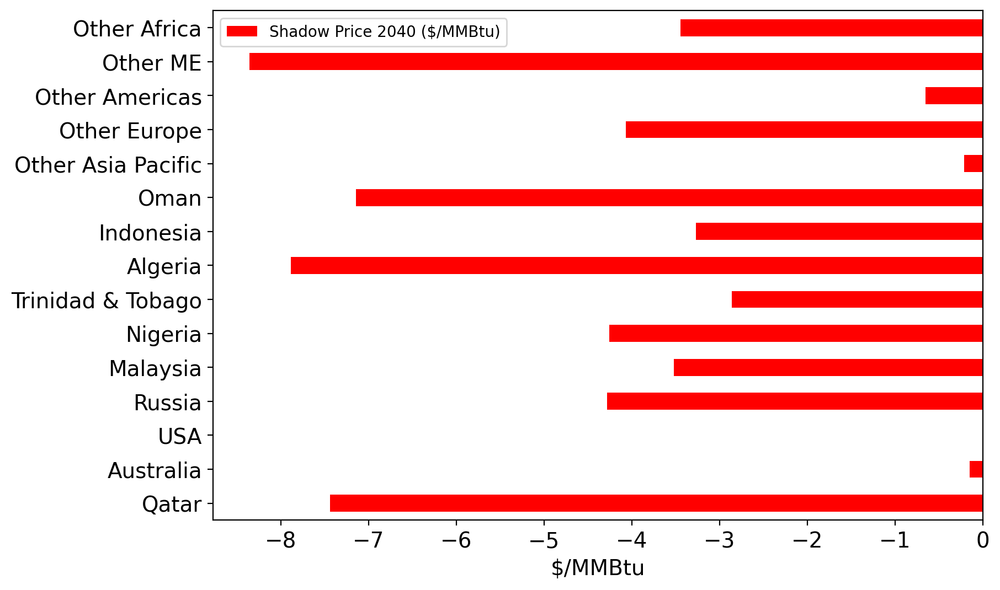

In [89]:
dual_export_2040 = pd.DataFrame(np.zeros((1, len(Merit_Order_3_2040.index))),
                   
                   index = ["Shadow Price 2040 ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])

for m in model_3_2040.src.keys():
        s = SRC_2040[m-1]
        dual_export_2040.loc["Shadow Price 2040 ($/MMBtu)", s] = model_3_2040.dual[model_3_2040.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_2040[s]/MMBtu_Gas/10**9,model_3_2040.src[m]()/MMBtu_Gas/10**9,model_3_2040.dual[model_3_2040.src[m]]))

Dual_Export_2040 = dual_export_2040.T
#Dual_Export

#Dual_Export_2040.sort_values("Shadow Price 2040 ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_2040.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

#### 6.3.2 Shadowprice Importer 2040

Japan                                71.8      71.8     13.1397
China                               167.7     167.7     13.3485
South Korea                          62.5      62.5     13.3754
India                                75.7      75.7     13.1856
Taiwan                               31.3      31.3     13.1511
Pakistan                             70.5      70.5     13.1387
France                               40.4      40.4     12.2503
Spain                                38.4      38.4     12.0835
UK                                   33.4      33.4     12.2581
Italy                                25.0      25.0     12.4586
Turkey                               23.1      23.1     12.4543
Belgium                              15.8      15.8     12.2462
Other Asia Pacific                  195.4     195.4     13.2210
Other Europe                         44.8      44.8     12.4083
Total North America                  13.5      13.5     14.0242
Total S. & C. America                16.

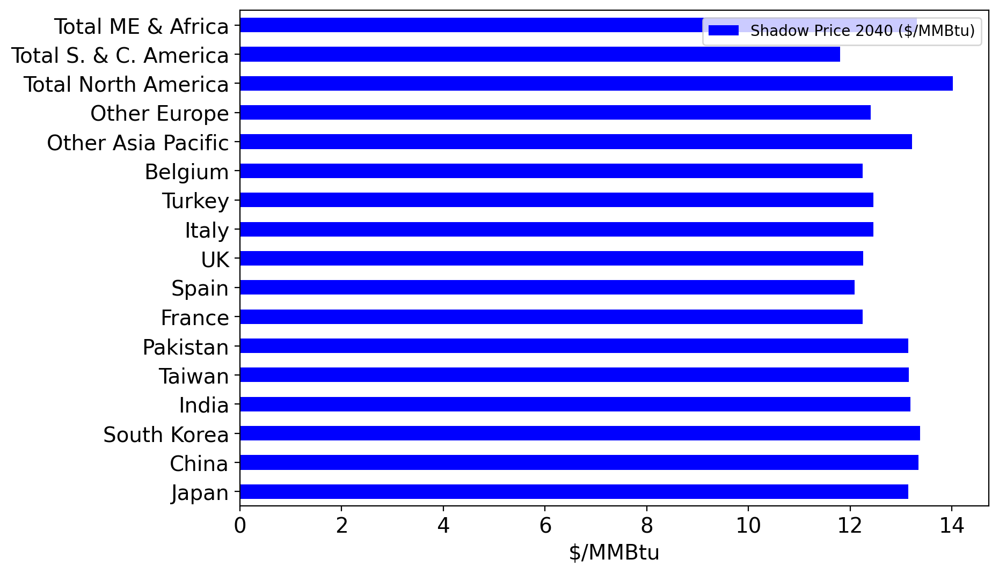

In [90]:
dual_import_2040 = pd.DataFrame(np.zeros((1,len(Merit_Order_3_2040.columns))),
                   
                   index = ["Shadow Price 2040 ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_3_2040.dmd.keys():
        c = CUS_2040[n-1]
        dual_import_2040.loc["Shadow Price 2040 ($/MMBtu)", c] = model_3_2040.dual[model_3_2040.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_2040[c]/MMBtu_Gas/10**9,model_3_2040.dmd[n]()/MMBtu_Gas/10**9,model_3_2040.dual[model_3_2040.dmd[n]]))

Dual_Import_2040 = dual_import_2040.T
Dual_Import_2040

#Dual_Import_2040.sort_values("Shadow Price 2040 ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_2040.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

/tmp/ipykernel_18619/2820704794.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/2820704794.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



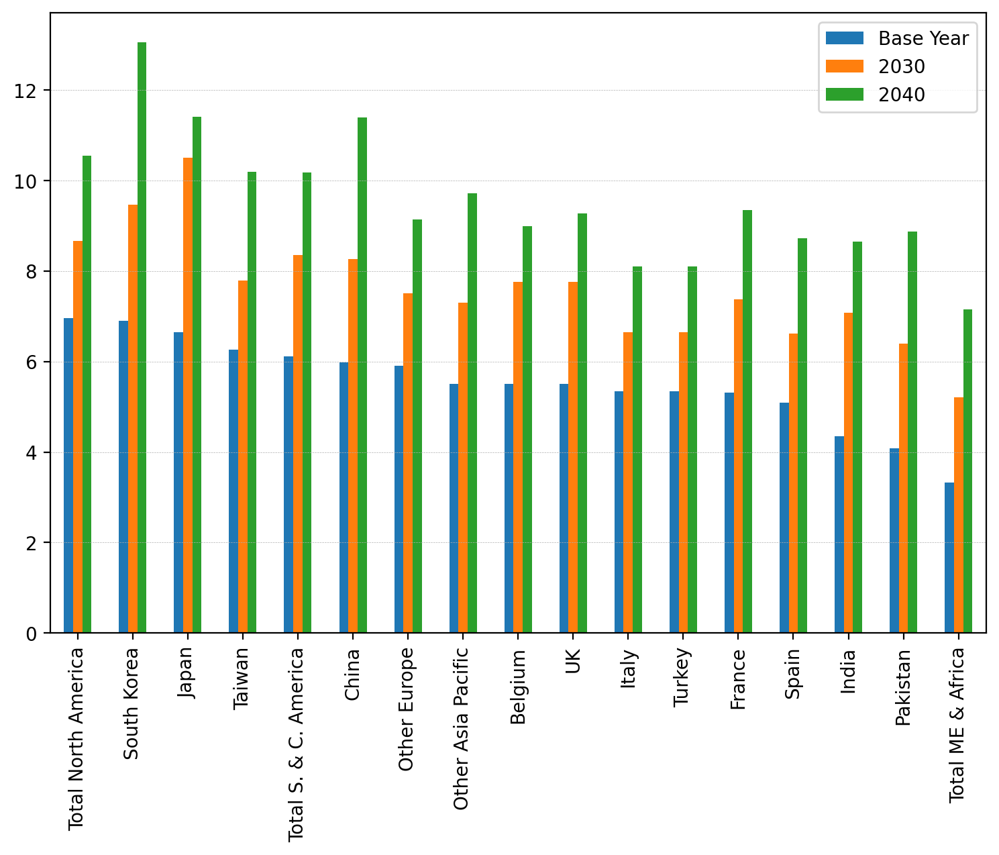

In [91]:
Outlook_DES = DES_Price_3_2019.T

Outlook_DES = Outlook_DES.append(DES_Price_3_2030.T)
Outlook_DES = Outlook_DES.append(DES_Price_3_2040.T)

Years = ["Base Year", "2030", "2040"]

Outlook_DES.T.plot(figsize = (9, 6), kind="bar")
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)

742.4292965917333


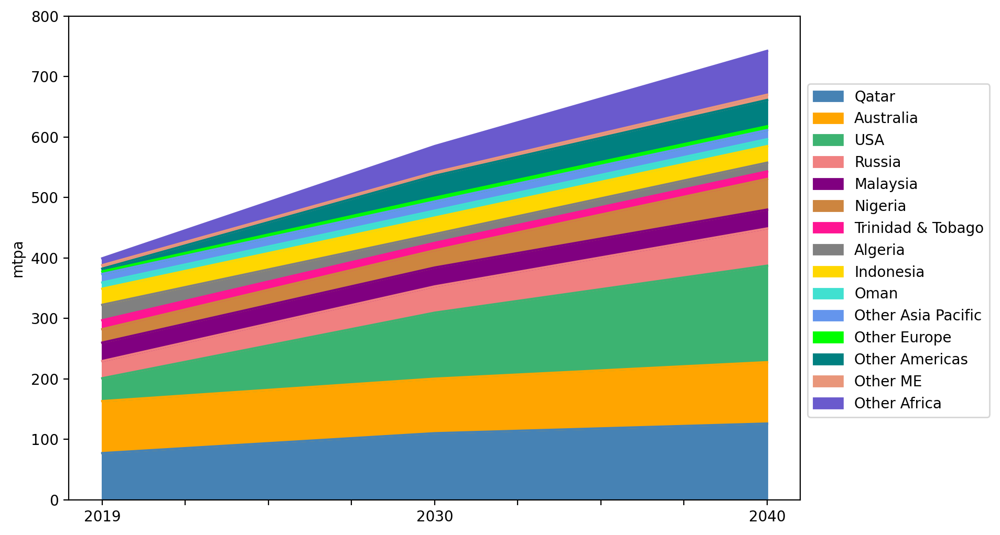

In [92]:
Outlook_Exp = pd.DataFrame([[77.1, 86, 37.8, 26.6*1.07, 30.5, 22.2, 14.8, 25.5, 26.6, 10.4, 14.1, 4.2, 4.5, 5.8, 11.3],
                            [151.69, 124.4, 150.5, 60, 43, 39.28, 17, 20, 37.7, 15.86, 20.9, 8.6, 50, 7.7, 60],
                            [173.75, 140, 220, 85, 43, 70, 17, 20, 37.7, 15.86, 20.9, 8.6, 60, 12, 100],],
                   
                    index = ["2019", "2030", "2040"],
    
                    columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                              "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                              "Other Europe", "Other Americas", "Other ME", "Other Africa"])

Outlook_Exp.loc["2030"] = Outlook_Exp.loc["2030"] * 10**9/mt_LNG_BCM
Outlook_Exp.loc["2040"] = Outlook_Exp.loc["2040"] * 10**9/mt_LNG_BCM
Outlook_Exp.plot.area(figsize = (9, 6), color = colours_exp, ylabel="mtpa", ylim=(0,800))
plt.legend(bbox_to_anchor=(1.0, 0.875))
print(Outlook_Exp.loc["2040"].sum())

### 6.4 DES Prices Plot

/tmp/ipykernel_18619/1937452723.py:2: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/1937452723.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



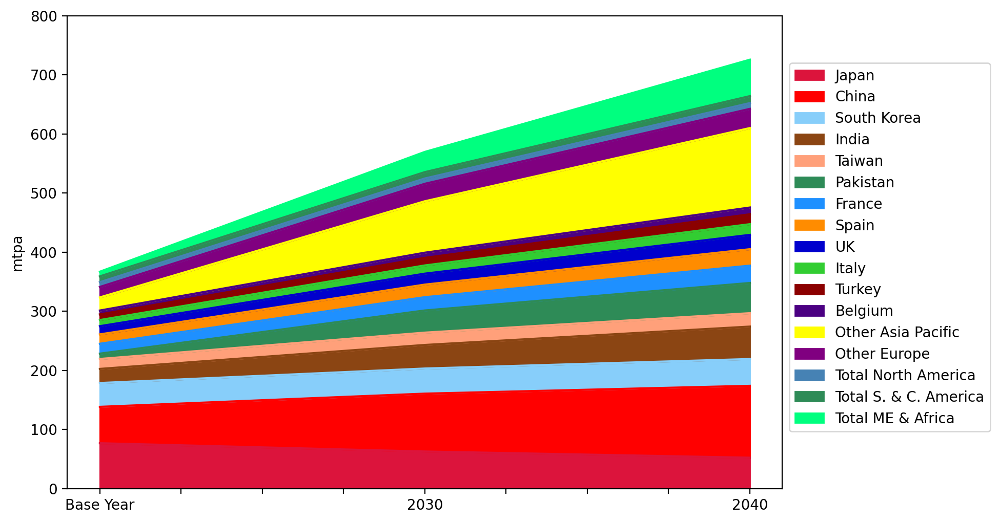

In [93]:
Outlook_Imp = Imp_3_2019/MMBtu_Gas/mt_LNG_BCM
Outlook_Imp = Outlook_Imp.append(Imp_3_2030/MMBtu_Gas/mt_LNG_BCM)
Outlook_Imp = Outlook_Imp.append(Imp_3_2040/MMBtu_Gas/mt_LNG_BCM)
Outlook_Imp
Outlook_Imp.plot.area(figsize = (9, 6), color = colours_imp, ylabel="mtpa", ylim=(0,800))
plt.legend(bbox_to_anchor=(1.0, 0.915))

### 6.5 Importers Shadowprices Outlook

/tmp/ipykernel_18619/2171415889.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/2171415889.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



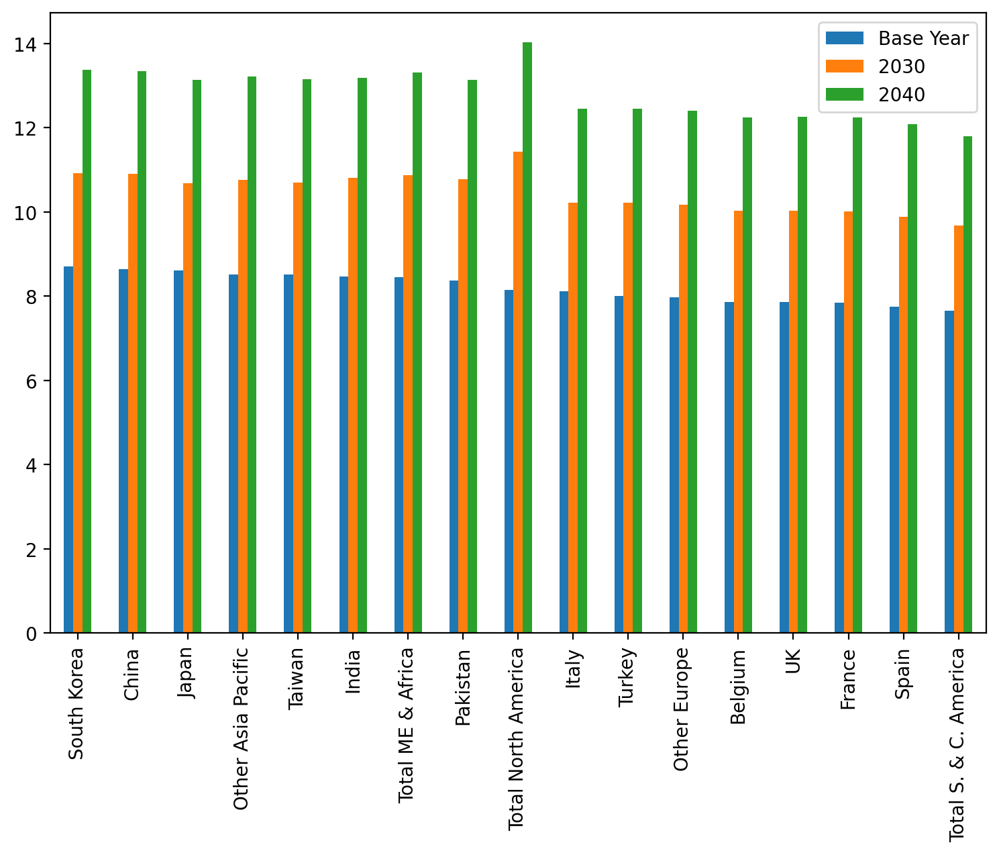

In [94]:
Outlook_Importer_Shadow = Dual_Import_2019.T

Outlook_Importer_Shadow = Outlook_Importer_Shadow.append(Dual_Import_2030.T)
Outlook_Importer_Shadow = Outlook_Importer_Shadow.append(Dual_Import_2040.T)


id_y = pd.Index(Years)
Outlook_Importer_Shadow = Outlook_Importer_Shadow.set_index(id_y)

#Outlook_Importer_Shadow.plot(figsize = (12, 6.5))
#plt.legend(bbox_to_anchor=(1.0, 1.0))
#plt.show()
#Importer_Shadow.T

Outlook_Importer_Shadow.T.plot(figsize = (9, 6), kind="bar")
plt.legend(bbox_to_anchor=(1.0, 1.0))

#Outlook_Importer_Shadow

### 6.6 Exporters Shadowprices Outlook

/tmp/ipykernel_18619/1438215317.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/1438215317.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Other ME,Algeria,Qatar,Oman,Russia,Nigeria,Other Europe,Other Africa,Malaysia,Indonesia,Trinidad & Tobago,Other Americas,USA,Other Asia Pacific,Australia
Base Year,-4.993263,-4.804103,-4.554918,-4.379098,-2.708389,-2.597601,-2.475919,-2.199369,-2.062965,-1.951106,-1.655774,-0.452381,-0.02368,-0.008027,0.000000
2030,-6.812068,-6.442449,-5.986189,-5.813977,-3.470299,-3.489421,-3.338123,-2.797476,-2.742527,-2.593714,-2.318376,-0.534559,0.00000,-0.130387,-0.030008
2040,-8.358229,-7.885820,-7.437377,-7.141561,-4.283800,-4.253584,-4.069153,-3.442618,-3.519726,-3.270873,-2.861762,-0.650894,0.00000,-0.212465,-0.145729


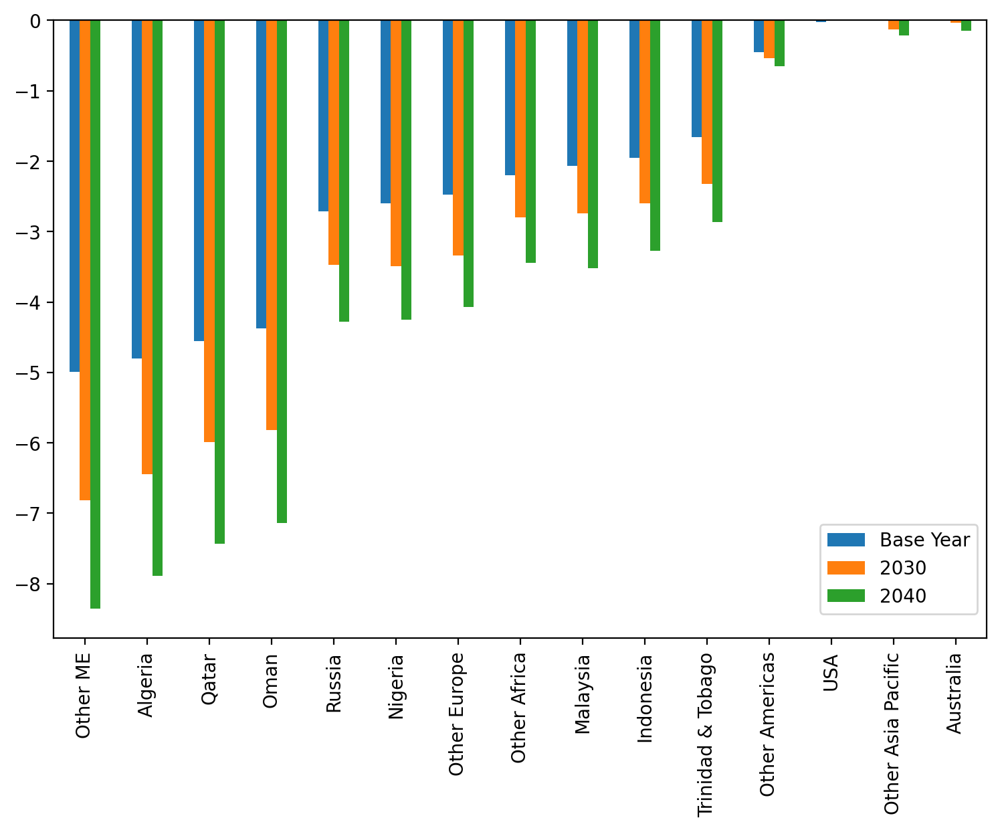

In [95]:
Outlook_Exporter_Shadow = Dual_Export_2019.T

Outlook_Exporter_Shadow = Outlook_Exporter_Shadow.append(Dual_Export_2030.T)
Outlook_Exporter_Shadow = Outlook_Exporter_Shadow.append(Dual_Export_2040.T)

Outlook_Exporter_Shadow = Outlook_Exporter_Shadow.set_index(id_y)

#Outlook_Importer_Shadow.plot(figsize = (12, 6.5))
#plt.legend(bbox_to_anchor=(1.0, 1.0))
#plt.show()
#Importer_Shadow.T

Outlook_Exporter_Shadow.T.plot(figsize = (9, 6), kind="bar")
plt.legend(bbox_to_anchor=(1.0, 0.2))

Outlook_Exporter_Shadow

### Shadowprices Plots (Importers)

<AxesSubplot:>

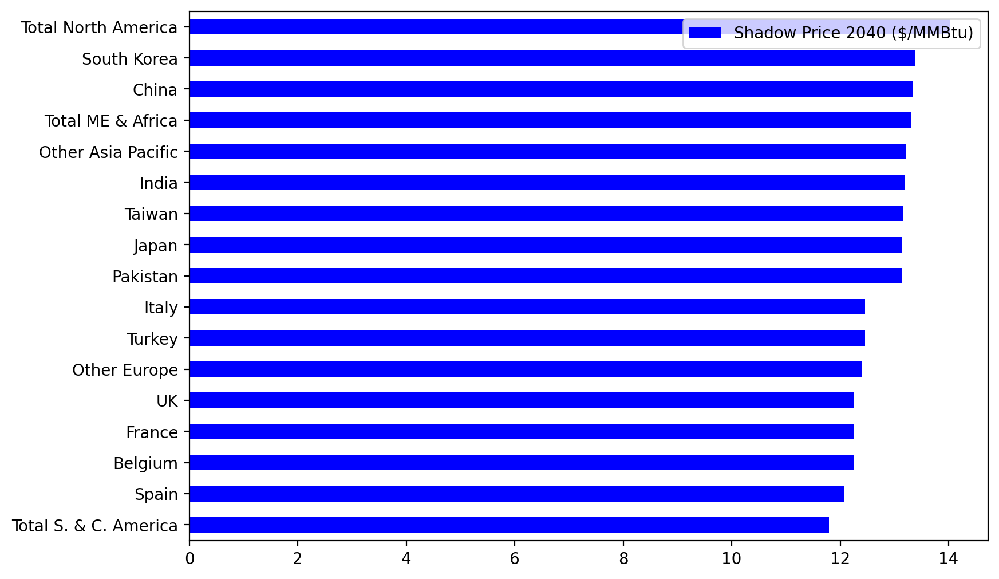

In [96]:
Dual_Import_2040.sort_values("Shadow Price 2040 ($/MMBtu)", ascending=True, inplace = True)
Dual_Import_2030.sort_values("Shadow Price 2030 ($/MMBtu)", ascending=True, inplace = True)
Dual_Import_2019.sort_values("Shadow Price 2019 ($/MMBtu)", ascending=True, inplace = True)

Dual_Import_2040.plot(figsize = (9, 6), kind="barh", color = "blue")

### Shadowprices Plots (Exporters)

<AxesSubplot:>

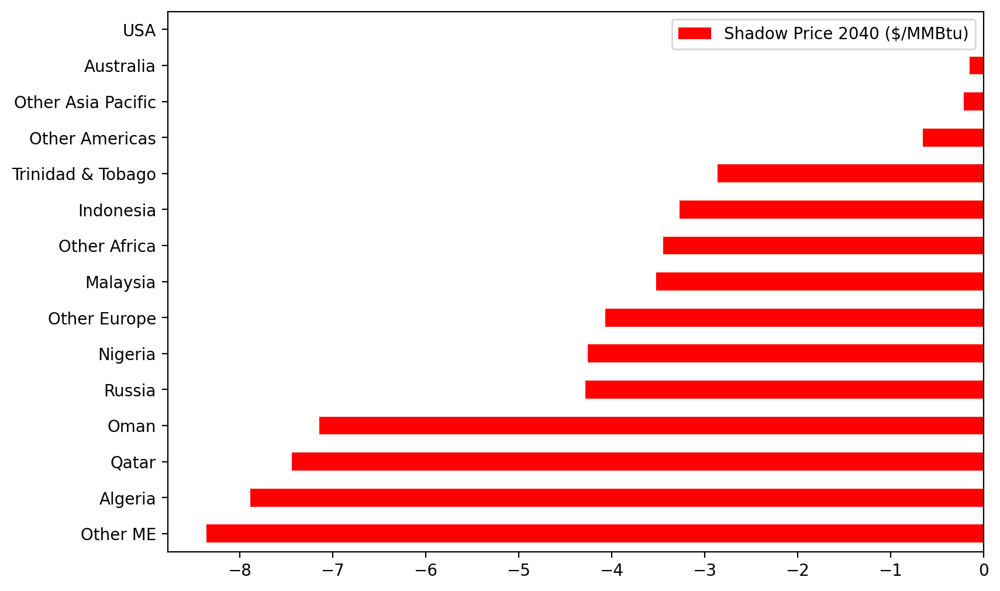

In [97]:
Dual_Export_2040.sort_values("Shadow Price 2040 ($/MMBtu)", ascending=True, inplace = True)
Dual_Export_2030.sort_values("Shadow Price 2030 ($/MMBtu)", ascending=True, inplace = True)
Dual_Export_2019.sort_values("Shadow Price 2019 ($/MMBtu)", ascending=True, inplace = True)

Dual_Export_2040.plot(figsize = (9, 6), kind="barh", color = "red")

### 6.7 Costs Outlook

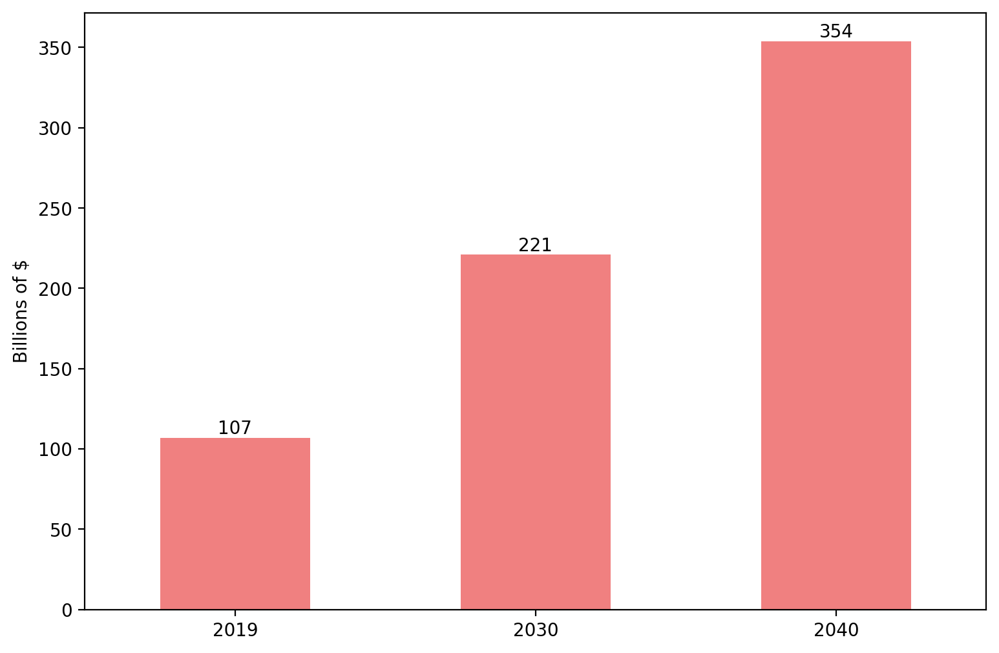

In [98]:
Total_Costs_2019 = model_2019_Jan.Cost() + model_2019_Feb.Cost() + model_2019_Mar.Cost() + model_2019_Apr.Cost() + model_2019_May.Cost() + model_2019_Jun.Cost() + model_2019_Jul.Cost() + model_2019_Aug.Cost() + model_2019_Sep.Cost() + model_2019_Oct.Cost() + model_2019_Nov.Cost() + model_2019_Dec.Cost()


Imports_Outlook = [round(Imp_Nodes["Import (MMBtu)"].sum() / 10**9 / MMBtu_Gas,0),
                   round(Imp_Nodes["Import 2030 (MMBtu)"].sum() / 10**9 / MMBtu_Gas,0),
                   round(Imp_Nodes["Import 2040 (MMBtu)"].sum() / 10**9 / MMBtu_Gas,0)]


Total_Costs = [round(Total_Costs_2019  / 10**9, 0),
               round(model_3_2030.Cost() / 10**9, 0),
               round(model_3_2040.Cost() / 10**9, 0)]

Total_Costs_Outlook = pd.DataFrame({#"Import Volumes": Imports_Outlook, 
                                    "Total Costs": Total_Costs}, 
                                   index = ["2019", "2030", "2040"])

ax = Total_Costs_Outlook.plot(figsize = (9, 6), kind="bar", color = [#"lightblue",
                                                                     "lightcoral"], rot=0)

for container in ax.containers:
    ax.bar_label(container)
ax.set_ylabel("Billions of $")    
        
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
#ax.set_xlabel("Minimal number of different importing routes")
plt.show()

### 6.8 Number of Carriers Outlook

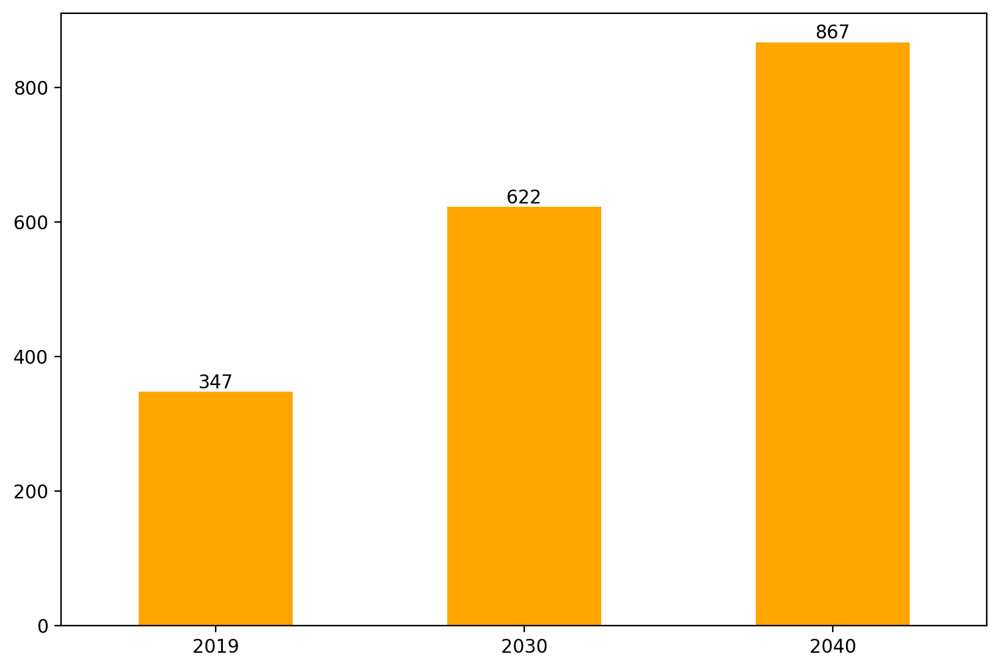

In [99]:
LNG_Carrier_Number_2030 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

LNG_Carrier_Number_2040 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

LNG_Carrier_Number_2019 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

LNG_Carrier_Number_2030 = (transported_LNG_3_2030*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/365
Carriers_2030 = round(LNG_Carrier_Number_2030.to_numpy().sum())

LNG_Carrier_Number_2019 = (transported_LNG_3_2019*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/365
Carriers_2019 = round(LNG_Carrier_Number_2019.to_numpy().sum())

LNG_Carrier_Number_2040 = (transported_LNG_3_2040*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/366
Carriers_2040 = round(LNG_Carrier_Number_2040.to_numpy().sum())


LNG_Carr_Outlook = [Carriers_2019, Carriers_2030, Carriers_2040]


LNG_Carriers_ = pd.DataFrame({"Number of LNG Carriers": LNG_Carr_Outlook, 
                              }, index = ["2019", "2030", "2040"])


ax = LNG_Carriers_.plot(figsize = (9, 6), kind="bar", color = ["orange", "coral"], rot=0)

for container in ax.containers:
    ax.bar_label(container)
    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()

### 6.9 Emissions Outlook

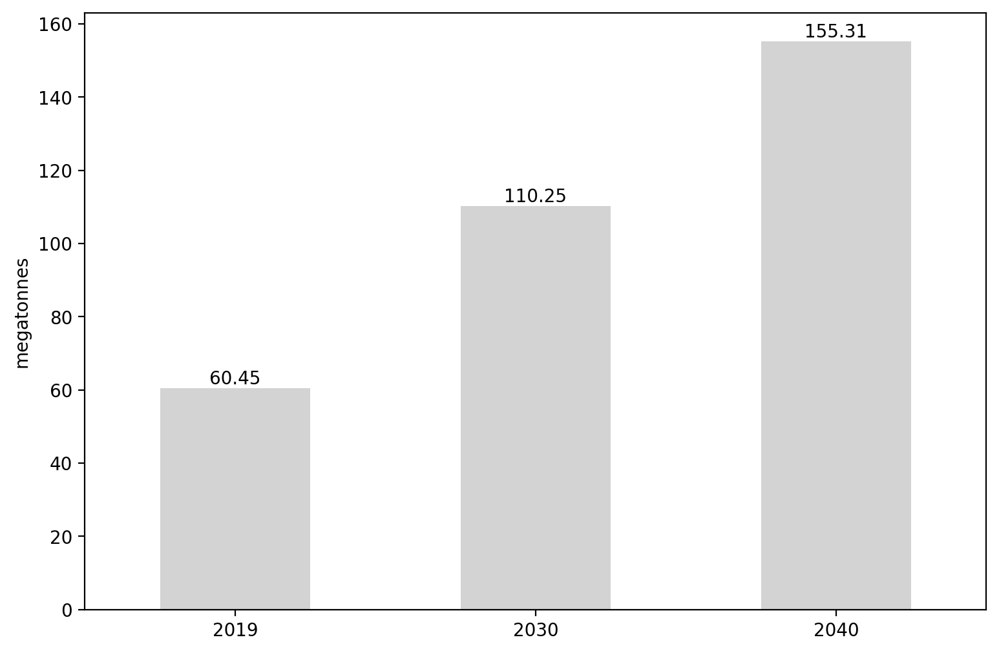

60.45

In [100]:
Emissions_2019_ = CO2_Emissions * (transported_LNG_3_2019*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Outlook_2019_CO2 = round(Emissions_2019_.to_numpy().sum()/10**6,2)

Emissions_2030_ = CO2_Emissions * (transported_LNG_3_2030*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Outlook_2030_CO2 = round(Emissions_2030_.to_numpy().sum()/10**6,2)

Emissions_2040_ = CO2_Emissions * (transported_LNG_3_2040*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Outlook_2040_CO2 = round(Emissions_2040_.to_numpy().sum()/10**6,2)

Emi_Outlook_CO2 = [Outlook_2019_CO2, Outlook_2030_CO2, Outlook_2040_CO2]

Emissions_Outlook_CO2 = pd.DataFrame(Emi_Outlook_CO2,
                   
                   index = ["2019", "2030", "2040"],
    
                   columns = ["CO2 Emissions"])


ax = Emissions_Outlook_CO2.plot(figsize = (9, 6), kind="bar", color = "lightgray", rot=0)
for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("megatonnes")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()
CO2_per_mmBtu_2040 = Emissions_2040_.to_numpy().sum()/(transported_LNG_3_2040.to_numpy().sum() * MMBtu_Gas * 10**9)
Outlook_2019_CO2

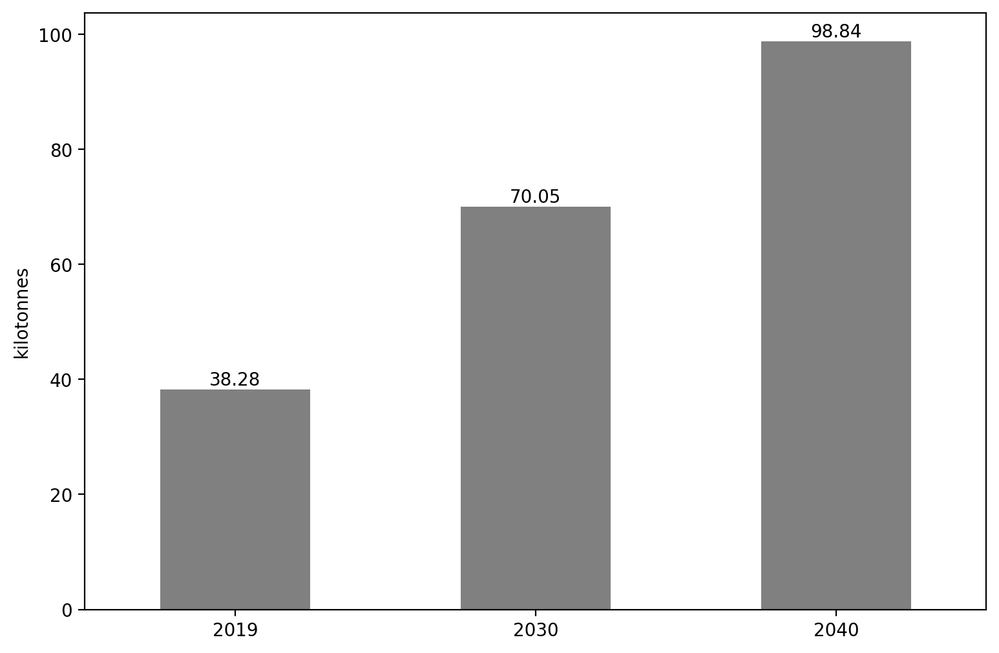

In [101]:
Emissions_2019__ = CH4_Emissions * (transported_LNG_3_2019*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Outlook_2019_CH4 = round(Emissions_2019__.to_numpy().sum()/10**3,2)

Emissions_2030__ = CH4_Emissions * (transported_LNG_3_2030*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Outlook_2030_CH4 = round(Emissions_2030__.to_numpy().sum()/10**3,2)

Emissions_2040__ = CH4_Emissions * (transported_LNG_3_2040*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Outlook_2040_CH4 = round(Emissions_2040__.to_numpy().sum()/10**3,2)

Emi_Outlook_CH4 = [Outlook_2019_CH4, Outlook_2030_CH4, Outlook_2040_CH4]

Emissions_Outlook_CH4 = pd.DataFrame(Emi_Outlook_CH4,
                   
                   index = ["2019", "2030", "2040"],
    
                   columns = ["CH4 Emissions"])


ax = Emissions_Outlook_CH4.plot(figsize = (9, 6), kind="bar", color = "grey", rot=0)
for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("kilotonnes")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()

## 7 Diversification of importing routes

### 7.2 4 Suppliers

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: unknown
  Lower bound: 108422358747.378
  Upper bound: 108422358747.378
  Number of objectives: 1
  Number of constraints: 288
  Number of variables: 256
  Number of nonzeros: 766
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Termination condition: optimal
  Statistics: 
    Branch and bound: 
      Number of bounded subproblems: 0
      Number of created subproblems: 0
  Error rc: 0
  Time: 0.026595115661621094
# ----------------------------------------------------------
#   Solution Information
# --------

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,26.400,21.225,13.900,8.225,5.8,3.1,0.000,5.475,0.675,3.575,3.3,2.25,7.650,0.000,2.8,0.000,2.725
Australia,26.400,21.225,13.900,0.000,5.8,0.0,0.000,0.000,0.000,0.000,0.0,0.00,7.358,0.000,0.0,0.000,0.000
USA,14.701,0.000,0.000,0.000,0.0,0.0,5.775,5.475,4.775,3.575,3.3,2.25,0.000,6.100,2.8,3.375,0.000
Russia,26.400,0.000,8.909,0.000,0.0,0.0,0.000,0.000,0.000,0.000,0.0,0.00,0.000,3.940,0.0,0.000,0.000
Malaysia,0.000,21.225,7.385,0.000,5.8,0.0,0.000,0.000,0.000,0.000,0.0,0.00,7.650,0.000,0.0,0.000,0.000
Nigeria,0.000,0.000,0.000,3.980,0.0,0.0,5.775,5.475,4.100,3.575,3.3,0.00,0.000,1.034,0.0,3.375,0.000
Trinidad & Tobago,0.000,0.000,0.000,0.000,0.0,0.0,5.775,0.000,4.775,0.000,-0.0,2.25,0.000,1.434,2.8,3.375,0.000
Algeria,0.000,0.000,0.000,2.072,0.0,0.0,5.775,5.475,4.775,3.575,3.3,2.25,0.000,6.100,0.0,0.000,1.842
Indonesia,0.000,21.225,2.006,0.000,5.8,0.0,0.000,0.000,0.000,0.000,0.0,0.00,7.650,0.000,0.0,0.000,0.000
Oman,0.000,0.000,0.000,8.225,0.0,3.1,0.000,0.000,0.000,0.000,0.0,0.00,0.292,0.000,0.0,0.000,2.725


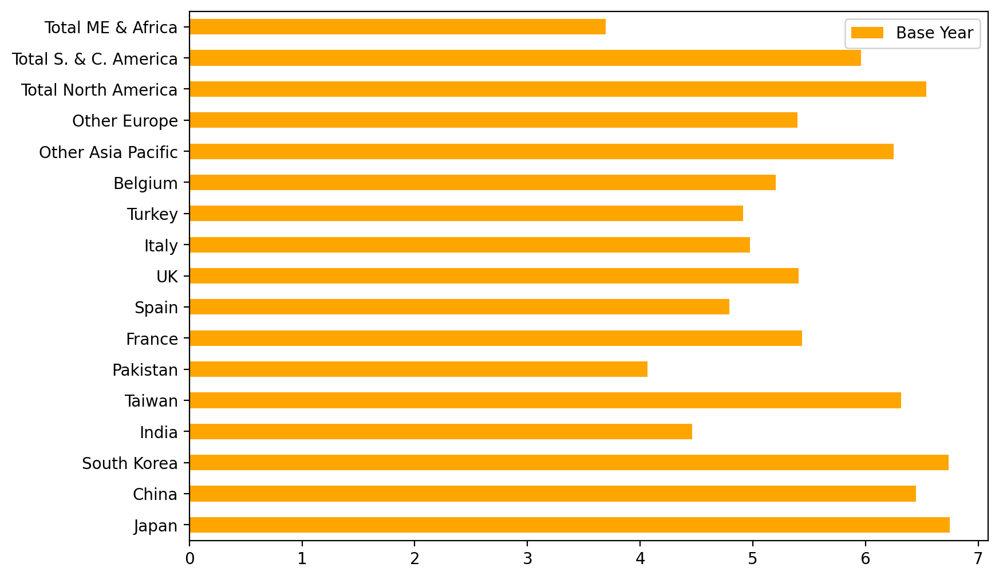

In [104]:
def LNG_Model_4(Demand, Supply):
    
    
    model = ConcreteModel()
    model.dual = Suffix(direction=Suffix.IMPORT)
    
    
    CUS = list(Demand.keys()) 
    SRC = list(Supply.keys()) 

     
    model.x = Var(CUS, SRC, domain = NonNegativeReals)

    
    model.Cost = Objective(expr = sum([Cost[c,s]*model.x[c,s] for c in CUS for s in SRC]), sense = minimize)

    
    model.src = ConstraintList()
    for s in SRC:
        model.src.add(sum([model.x[c,s] for c in CUS]) <= Supply[s])
        
    model.dmd = ConstraintList()
    for c in CUS:
        model.dmd.add(sum([model.x[c,s] for s in SRC]) == Demand[c])
            
    model.div = ConstraintList()
    for c in CUS:
        for s in SRC:
            model.div.add(model.x[c,s] <= 0.25 * Demand[c])
    
    return model

if __name__ == "__main__":
    
    model_2019_4_Suppliers = LNG_Model_4(Demand_2019, Supply_2019)
    results_2019_4_Suppliers = SolverFactory('glpk').solve(model_2019_4_Suppliers)
    
    results_2019_4_Suppliers.write()
    
transported_LNG_2019_4_Suppliers = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_2019_4_Suppliers.index:
    for importer in transported_LNG_2019_4_Suppliers.columns:
        transported_LNG_2019_4_Suppliers.loc[exporter, importer] = model_2019_4_Suppliers.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_4_2019 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))


for i in transported_LNG_2019_4_Suppliers.index:
    for j in transported_LNG_2019_4_Suppliers.columns:
        if transported_LNG_2019_4_Suppliers.loc[i,j] > 0:
            Merit_Order_4_2019.loc[i,j] = Total_Costs.loc[i,j]


Sum_4_2019 = Merit_Order_4_2019 * transported_LNG_2019_4_Suppliers * MMBtu_Gas * 1000000000

DES_Pr_4_2019 = pd.DataFrame(np.zeros((1,len(Merit_Order_4_2019.columns))),
                   
                   index = ["Base Year"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for column in Sum_4_2019.columns:
    DES_Pr_4_2019.loc["Base Year", column] = Sum_4_2019[column].sum()


DES_Pri_4_2019 = DES_Pr_4_2019 / Imp_3_2019
DES_Price_4_2019 = DES_Pri_4_2019.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

#DES_Price_3_2019.sort_values(by="2019", ascending=False, inplace = True)

DES_Price_4_2019.plot(kind = 'barh', color = 'orange', figsize=(9,6))
#DES_Price_3_2019
transported_LNG_2019_4_Suppliers.round(3)

### 7.3 5 Suppliers

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: unknown
  Lower bound: 109412740319.832
  Upper bound: 109412740319.832
  Number of objectives: 1
  Number of constraints: 288
  Number of variables: 256
  Number of nonzeros: 766
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Termination condition: optimal
  Statistics: 
    Branch and bound: 
      Number of bounded subproblems: 0
      Number of created subproblems: 0
  Error rc: 0
  Time: 0.027817487716674805
# ----------------------------------------------------------
#   Solution Information
# --------

,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,23.3376,18.7629,12.287600,7.270900,5.1272,2.7404,5.1051,4.8399,4.2211,3.1603,2.9172,1.9890,6.762600,3.304135,1.2992,1.5660,2.4089
Australia,23.3376,18.7629,12.287600,4.279467,5.1272,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6.762600,0.000000,2.4752,0.0000,0.0000
USA,19.0425,0.0000,0.000000,0.000000,0.0000,0.0000,5.1051,4.8399,4.2211,3.1603,2.9172,1.9890,0.000000,5.392400,2.4752,2.9835,0.0000
Russia,23.3376,5.9101,10.001398,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.0000,0.0000,0.0000
Malaysia,0.0000,18.7629,11.406800,0.000000,5.1272,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6.762600,0.000000,0.0000,0.0000,0.0000
Nigeria,0.0000,0.0000,0.000000,1.568733,0.0000,0.0000,4.7747,4.8399,2.2156,3.1603,2.9172,0.6446,2.590602,4.918665,0.0000,2.9835,0.0000
Trinidad & Tobago,0.0000,0.0000,0.000000,0.000000,0.0000,0.0000,3.0100,2.5404,4.2211,1.6588,1.5312,1.9890,0.000000,0.000000,2.4752,2.9835,0.0000
Algeria,0.0000,0.0000,0.000000,2.390200,0.0000,2.7404,5.1051,4.8399,4.2211,3.1603,2.9172,1.9890,0.000000,5.392400,0.0000,0.0000,2.4089
Indonesia,0.0000,18.7629,9.616602,0.000000,5.1272,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.174698,0.000000,0.0000,0.0000,0.0000
Oman,0.0000,0.0000,0.000000,7.270900,0.0000,2.7404,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.921400,0.000000,0.0000,0.0000,2.4089


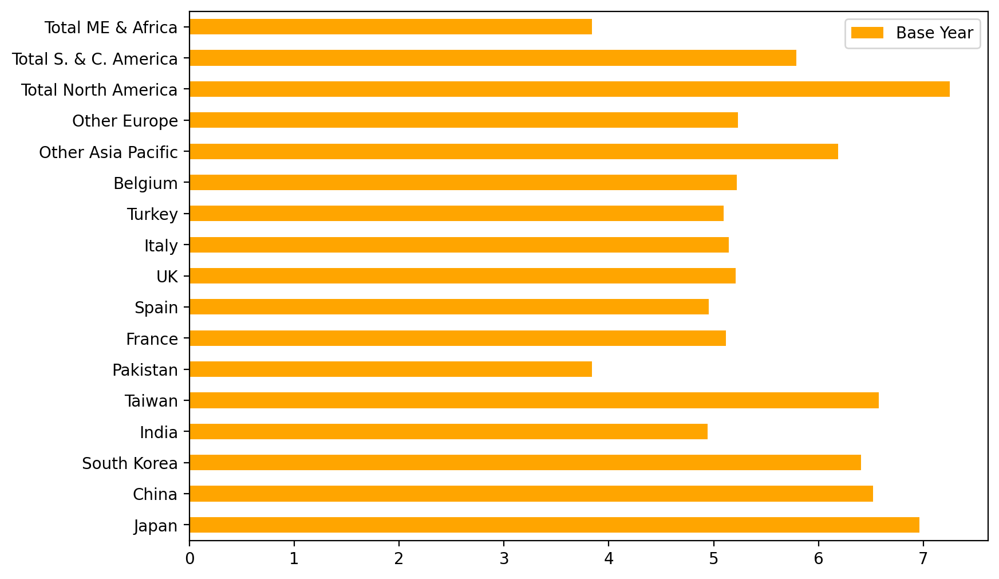

In [105]:
def LNG_Model_5(Demand, Supply):
    
    
    model = ConcreteModel()
    model.dual = Suffix(direction=Suffix.IMPORT)
    
    
    CUS = list(Demand.keys()) 
    SRC = list(Supply.keys()) 

    
    model.x = Var(CUS, SRC, domain = NonNegativeReals)

    
    model.Cost = Objective(expr = sum([Cost[c,s]*model.x[c,s] for c in CUS for s in SRC]), sense = minimize)

    
    model.src = ConstraintList()
    for s in SRC:
        model.src.add(sum([model.x[c,s] for c in CUS]) <= Supply[s])
        
    model.dmd = ConstraintList()
    for c in CUS:
        model.dmd.add(sum([model.x[c,s] for s in SRC]) == Demand[c])
    
    model.div = ConstraintList()
    for c in CUS:
        for s in SRC:
            model.div.add(model.x[c,s] <= 0.221 * Demand[c])
    
    return model


if __name__ == "__main__":
    
    model_2019_5_Suppliers = LNG_Model_5(Demand_2019, Supply_2019)
    results_2019_5_Suppliers = SolverFactory('glpk').solve(model_2019_5_Suppliers)
    
    results_2019_5_Suppliers.write()


transported_LNG_2019_5_Suppliers = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_2019_5_Suppliers.index:
    for importer in transported_LNG_2019_5_Suppliers.columns:
        transported_LNG_2019_5_Suppliers.loc[exporter, importer] = model_2019_5_Suppliers.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_5_2019 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))


for i in transported_LNG_2019_5_Suppliers.index:
    for j in transported_LNG_2019_5_Suppliers.columns:
        if transported_LNG_2019_5_Suppliers.loc[i,j] > 0:
            Merit_Order_5_2019.loc[i,j] = Total_Costs.loc[i,j]
            

Sum_5_2019 = Merit_Order_5_2019 * transported_LNG_2019_5_Suppliers * MMBtu_Gas * 1000000000

DES_Pr_5_2019 = pd.DataFrame(np.zeros((1,len(Merit_Order_5_2019.columns))),
                   
                   index = ["Base Year"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for column in Sum_5_2019.columns:
    DES_Pr_5_2019.loc["Base Year", column] = Sum_5_2019[column].sum()


DES_Pri_5_2019 = DES_Pr_5_2019 / Imp_3_2019
DES_Price_5_2019 = DES_Pri_5_2019.T

#DES_Price_5_2019.sort_values(by="2019", ascending=False, inplace = True)

DES_Price_5_2019.plot(kind = 'barh', color = 'orange', figsize=(9,6))
#Merit_Order_5_2019
transported_LNG_2019_5_Suppliers

### 7.4 DES Prices Plot

/tmp/ipykernel_18619/3473562204.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/3473562204.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Total North America,South Korea,Japan,Taiwan,Total S. & C. America,China,Other Europe,Other Asia Pacific,Belgium,UK,Italy,Turkey,France,Spain,India,Pakistan,Total ME & Africa
3 Exporters,6.963266,6.895238,6.640437,6.262947,6.110937,5.983005,5.910309,5.506108,5.504090,5.501618,5.346545,5.343434,5.316168,5.084146,4.346262,4.087504,3.326893
4 Exporters,6.538042,6.737043,6.748709,6.316356,5.961011,6.447095,5.394373,6.249547,5.202647,5.406634,4.972048,4.915798,5.435866,4.791172,4.461258,4.063785,3.696487
5 Exporters,7.252365,6.406962,6.960202,6.573904,5.786373,6.517592,5.232620,6.184917,5.220089,5.206856,5.144331,5.094278,5.116707,4.953235,4.939615,3.837588,3.841461


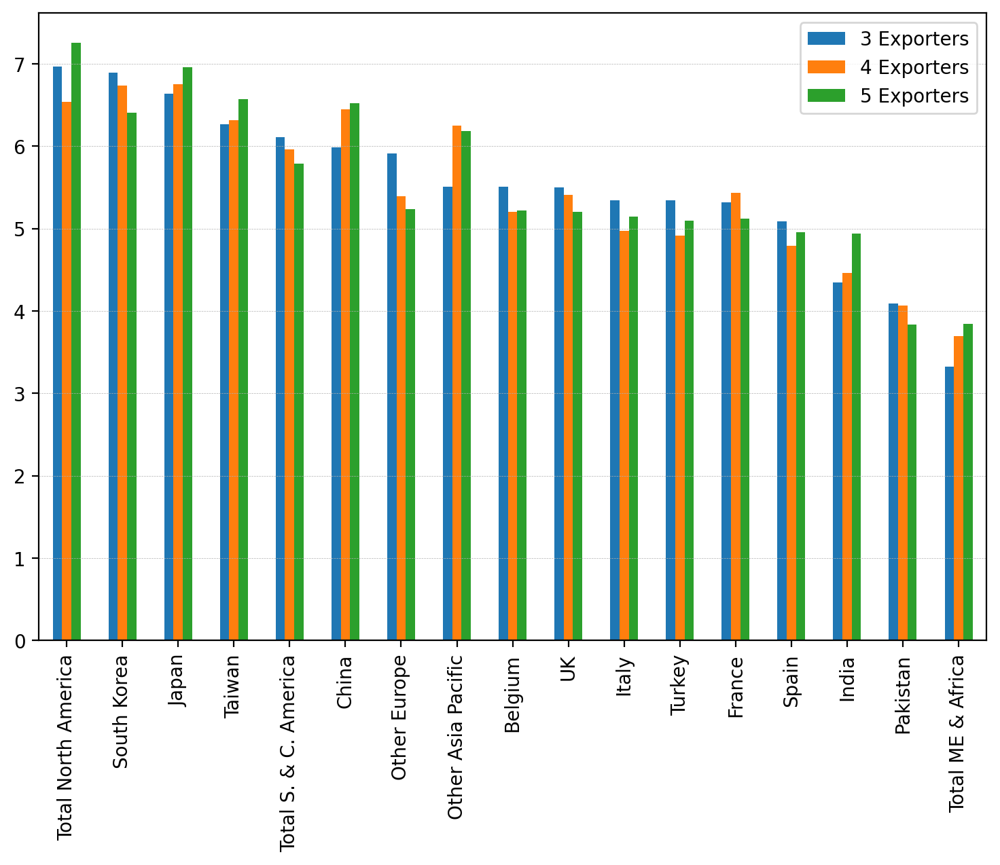

In [106]:
Diver_DES = DES_Price_3_2019.T

Diver_DES = Diver_DES.append(DES_Price_4_2019.T)
Diver_DES = Diver_DES.append(DES_Price_5_2019.T)

Diver_DESv_Num = ["3 Exporters", "4 Exporters", "5 Exporters"]

id_y = pd.Index(Diver_DESv_Num)
Diver_DES = Diver_DES.set_index(id_y)

Diver_DES.T.plot(figsize = (9, 6), kind="bar")
#plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)
Diver_DES

### 7.5 Tankers Number

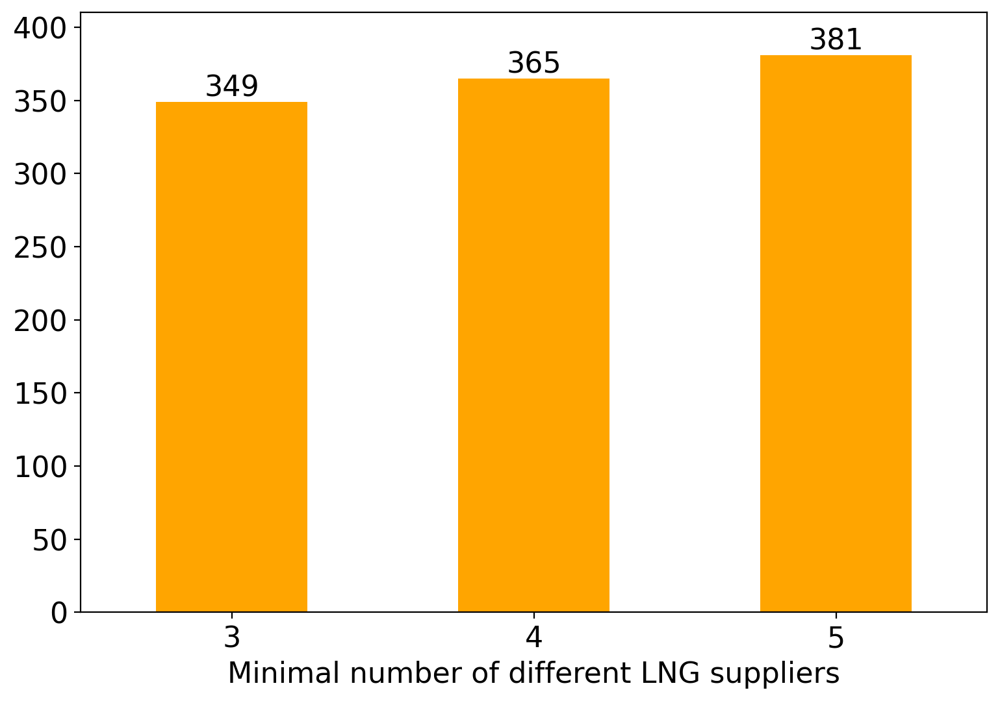

In [107]:
num_carrier_3 = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

num_carrier_3 = (Transported_LNG_2019*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/365
num_carrier_3.to_numpy().sum()

num_carrier_2019_4_Suppliers = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

num_carrier_2019_4_Suppliers = (transported_LNG_2019_4_Suppliers*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/365
num_carrier_2019_4_Suppliers.to_numpy().sum()

num_carrier_2019_5_Suppliers = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

num_carrier_2019_5_Suppliers = (transported_LNG_2019_5_Suppliers*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/365
num_carrier_2019_5_Suppliers.to_numpy().sum()

Num_of_Carriers = [round(num_carrier_3.to_numpy().sum()),
                   round(num_carrier_2019_4_Suppliers.to_numpy().sum()),
                   round(num_carrier_2019_5_Suppliers.to_numpy().sum())]

Carriers_2019_Diversification  = pd.DataFrame(Num_of_Carriers,
                   
                   index = ["3", "4", "5"],
    
                   columns = ["Average Number of Carriers"])

plt.rc('font', size=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)

ax = Carriers_2019_Diversification.plot(figsize = (9, 6), kind="bar", color = "orange", rot=0, ylim=(0,410))
for container in ax.containers:
    ax.bar_label(container)

    
ax.set_xlabel("Minimal number of different LNG suppliers")
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()

### 7.6 Total Costs

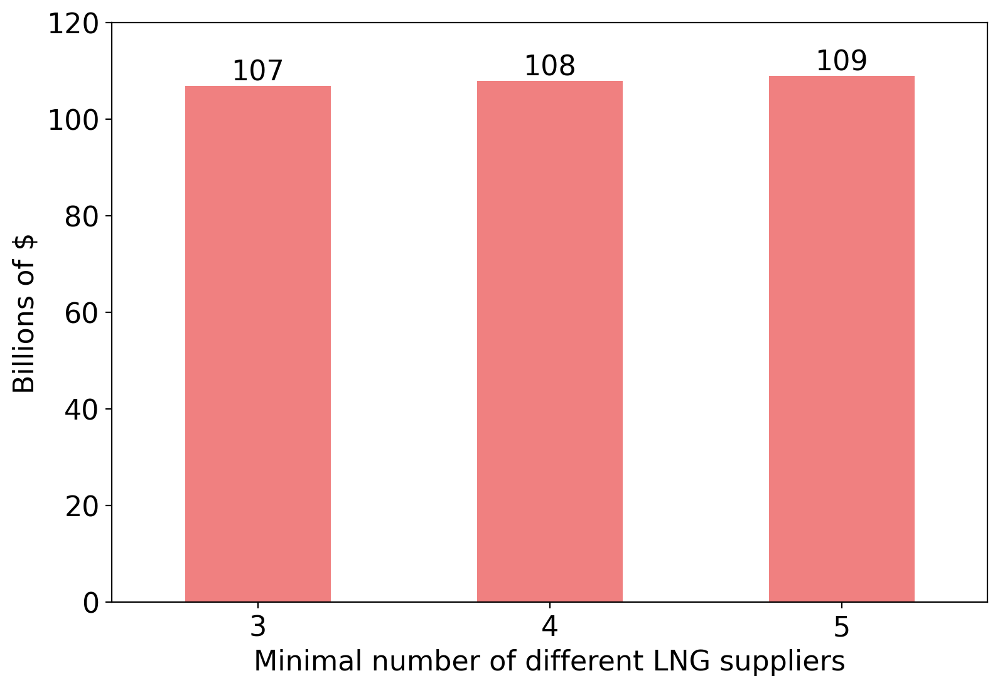

In [108]:
Div_Total_Costs = [round(model_3_2019.Cost() / 10**9, 0),
               round(model_2019_4_Suppliers.Cost() / 10**9, 0),
               round(model_2019_5_Suppliers.Cost() / 10**9, 0)]

Diversification_Total_Costs = pd.DataFrame({#"Import Volumes": Imports_Outlook, 
                                    "Total Costs": Div_Total_Costs}, 
                                   index = ["3", "4", "5"])

ax = Diversification_Total_Costs.plot(figsize = (9, 6), kind="bar", color = [#"lightblue",
                                                                     "lightcoral"], rot=0, ylim=(0,120))

for container in ax.containers:
    ax.bar_label(container)
ax.set_ylabel("Billions of $")

plt.rc('font', size=16)
plt.rc('axes', labelsize=16)
        
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
ax.set_xlabel("Minimal number of different LNG suppliers")
#ax.set_xlabel("Minimal number of different importing routes")
plt.show()

### 7.7 Shadow prices

/tmp/ipykernel_18619/4247141160.py:35: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/4247141160.py:36: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Other ME,Algeria,Qatar,Oman,Russia,Nigeria,Other Europe,Other Africa,Malaysia,Indonesia,Trinidad & Tobago,Other Americas,USA,Other Asia Pacific,Australia
3 Exporters,-4.993263,-4.804103,-4.554918,-4.379098,-2.708389,-2.597601,-2.475919,-2.199369,-2.062965,-1.951106,-1.655774,-0.452381,-0.023680,-0.008027,0.0
4 Exporters,-5.012687,-4.413912,-3.551303,-3.852890,-2.700362,-2.589575,-2.467892,-2.295235,-2.054938,-1.943079,-1.639064,-0.444355,-0.015653,0.000000,0.0
5 Exporters,-5.587099,-4.988323,-4.108494,-4.698392,-3.664678,-3.163986,-2.922025,-2.901319,-3.019255,-2.907396,-2.222158,-1.422865,-0.994164,-0.978510,0.0


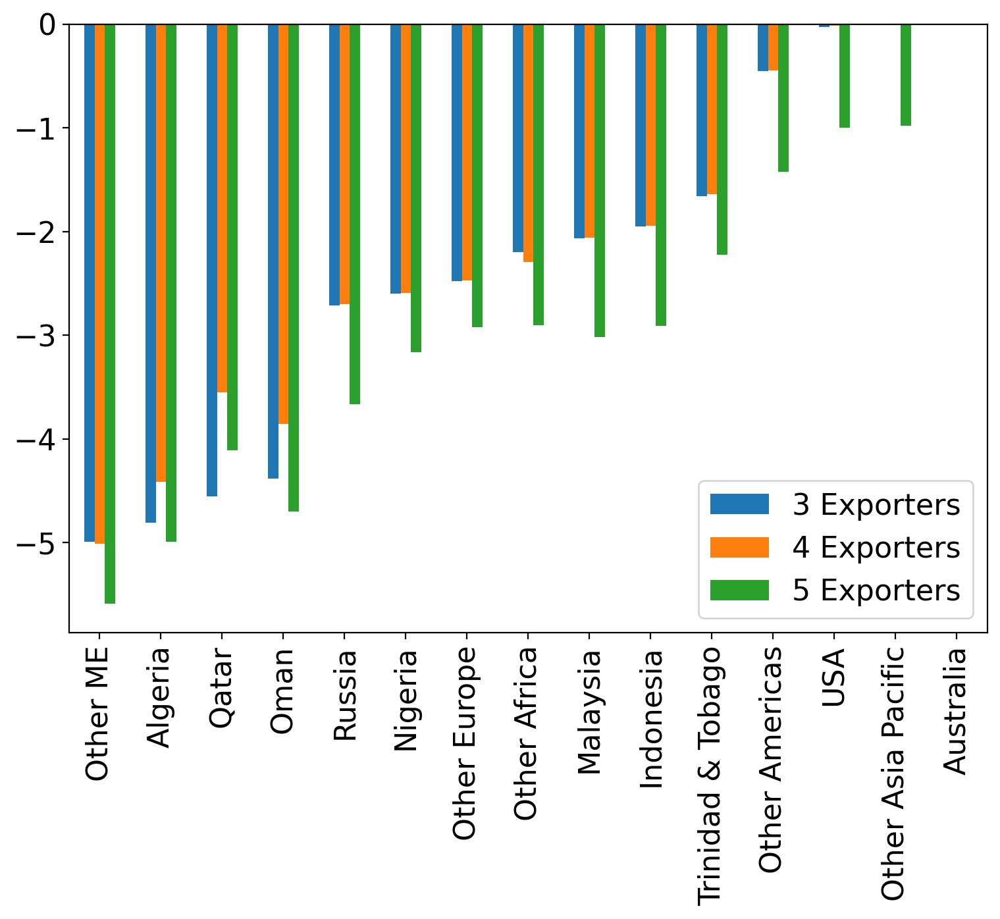

In [111]:
dual_export_2019_4 = pd.DataFrame(np.zeros((1, len(transported_LNG_3_2019.index))),
                   
                   index = ["Shadow Price 2019 ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])

dual_export_2019_5 = pd.DataFrame(np.zeros((1, len(transported_LNG_3_2019.index))),
                   
                   index = ["Shadow Price 2019 ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])

for m in model_2019_4_Suppliers.src.keys():
        s = SRC_2019[m-1]
        dual_export_2019_4.loc["Shadow Price 2019 ($/MMBtu)", s] = model_2019_4_Suppliers.dual[model_2019_4_Suppliers.src[m]]
        #print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_2019[s]/MMBtu_Gas/10**9,model_2019_4_Suppliers.src[m]()/MMBtu_Gas/10**9,model_2019_4_Suppliers.dual[model_2019_4_Suppliers.src[m]]))
        dual_export_2019_5.loc["Shadow Price 2019 ($/MMBtu)", s] = model_2019_5_Suppliers.dual[model_2019_5_Suppliers.src[m]]
        #print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_2019[s]/MMBtu_Gas/10**9,model_2019_5_Suppliers.src[m]()/MMBtu_Gas/10**9,model_2019_5_Suppliers.dual[model_2019_5_Suppliers.src[m]]))
    
Dual_Export_2019.sort_values("Shadow Price 2019 ($/MMBtu)", ascending=True, inplace = True)
# ax = Dual_Export_2019_5.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="red")
# ax.set_xlabel("$/MMBtu", fontsize=14)
# ax.set_ylabel("", fontsize=14)
# plt.show()

Dual_Export_2019_4 = dual_export_2019_4.T
Dual_Export_2019_5 = dual_export_2019_5.T

Diver_Exporter_Shadow = Dual_Export_2019.T

Diver_Exporter_Shadow = Diver_Exporter_Shadow.append(Dual_Export_2019_4.T)
Diver_Exporter_Shadow = Diver_Exporter_Shadow.append(Dual_Export_2019_5.T)

Diver_Exporter_Shadow = Diver_Exporter_Shadow.set_index(id_y)

Diver_Exporter_Shadow.T.plot(figsize = (9, 6), kind="bar")
#plt.legend(bbox_to_anchor=(1.0, 0.2))
#plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)
Diver_Exporter_Shadow

/tmp/ipykernel_18619/2951118502.py:30: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18619/2951118502.py:31: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Total S. & C. America,Spain,France,UK,Belgium,Other Europe,Turkey,Italy,Total North America,Pakistan,Total ME & Africa,India,Taiwan,Other Asia Pacific,Japan,China,South Korea
3 Exporters,7.655537,7.742132,7.850099,7.855224,7.858049,7.977873,8.008226,8.113021,8.141480,8.366177,8.453139,8.463281,8.511094,8.515939,8.613794,8.636760,8.706826
4 Exporters,7.751403,7.734105,7.842072,7.847216,7.849620,7.969847,8.093482,8.003025,9.035958,8.434337,8.549004,8.482706,8.536598,8.626727,8.605767,8.666818,8.698799
5 Exporters,8.564005,8.410428,8.416484,8.421627,8.424433,8.544258,8.676577,8.679406,9.370865,9.040421,9.155088,9.057117,9.515108,9.472229,9.584277,9.645328,9.663115


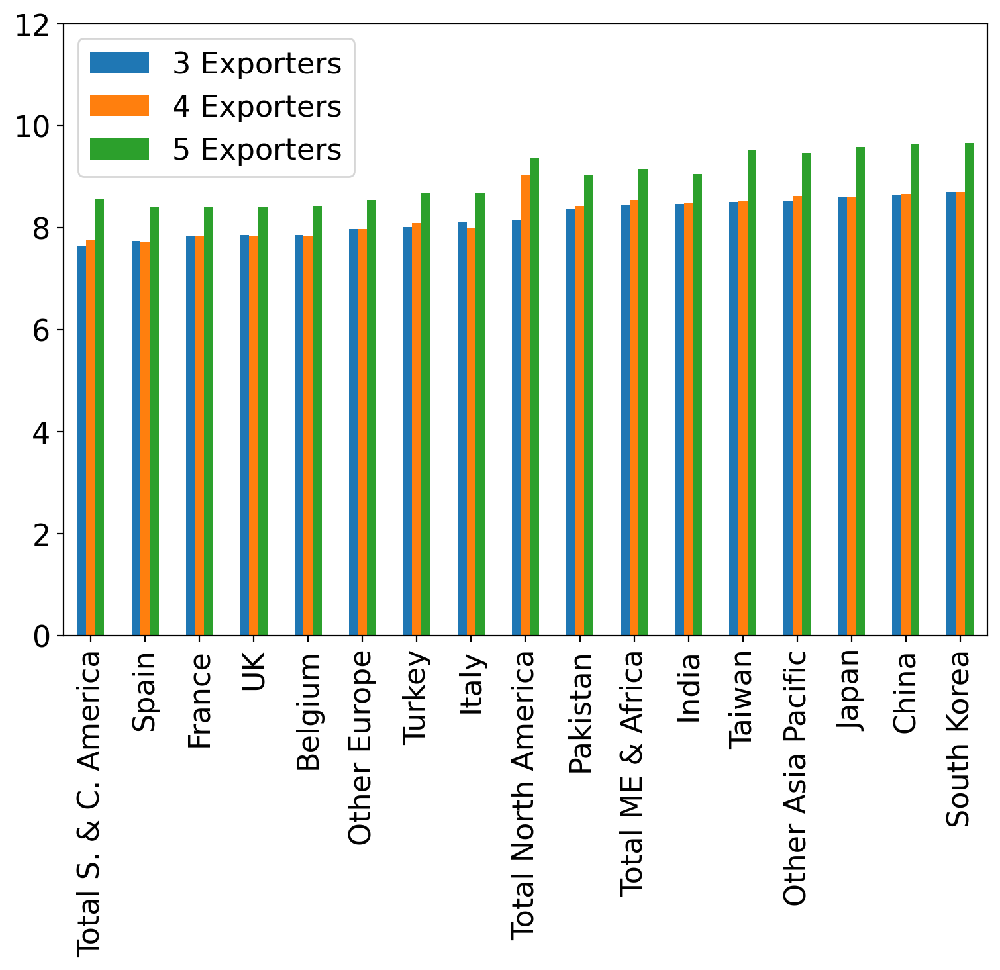

In [113]:
dual_import_2019_4 = pd.DataFrame(np.zeros((1, len(transported_LNG_3_2019.columns))),
                   
                   index = ["Shadow Price 2019 ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

dual_import_2019_5 = pd.DataFrame(np.zeros((1, len(transported_LNG_3_2019.columns))),
                   
                   index = ["Shadow Price 2019 ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_3_2019.dmd.keys():
        c = CUS_2019[n-1]
        dual_import_2019_4.loc["Shadow Price 2019 ($/MMBtu)", c] = model_2019_4_Suppliers.dual[model_2019_4_Suppliers.dmd[n]]
        dual_import_2019_5.loc["Shadow Price 2019 ($/MMBtu)", c] = model_2019_5_Suppliers.dual[model_2019_5_Suppliers.dmd[n]]
        


Dual_Import_2019_4 = dual_import_2019_4.T
Dual_Import_2019_5 = dual_import_2019_5.T

Diver_Importer_Shadow = Dual_Import_2019.T

Diver_Importer_Shadow = Diver_Importer_Shadow.append(Dual_Import_2019_4.T)
Diver_Importer_Shadow = Diver_Importer_Shadow.append(Dual_Import_2019_5.T)

Diver_Importer_Shadow = Diver_Importer_Shadow.set_index(id_y)

Diver_Importer_Shadow.T.plot(figsize = (9, 6), kind="bar", ylim=(0,12))
#plt.legend(bbox_to_anchor=(0.999, 1.011))
#plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)

Diver_Importer_Shadow

### 7.8 Emissions

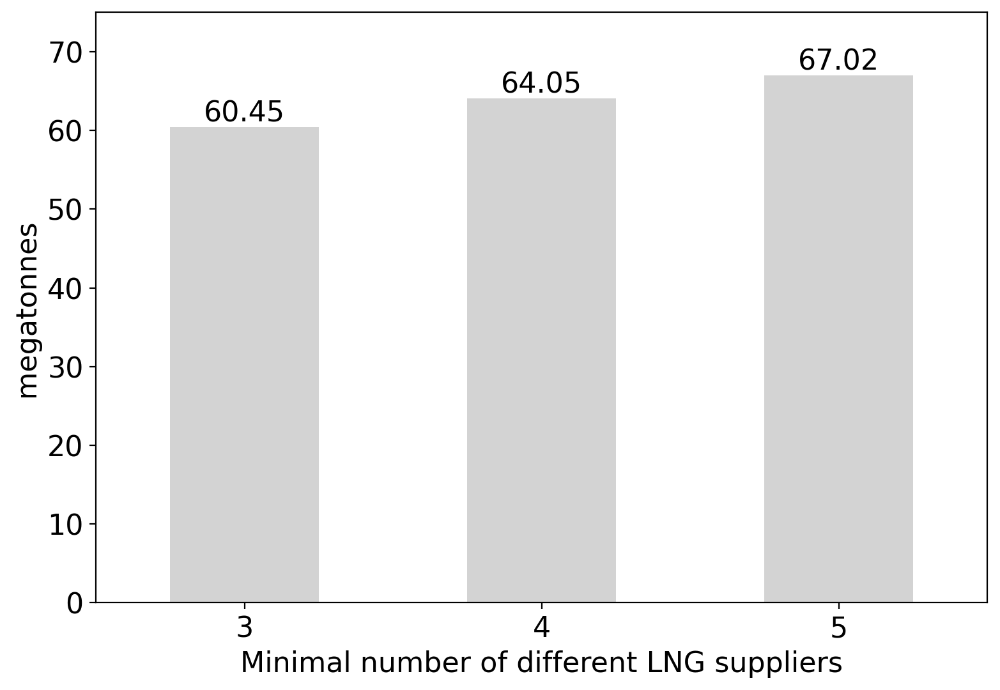

In [114]:
#Emissions_2019_ = CO2_Emissions * (transported_LNG_3_2019*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
#Outlook_2019_CO2 = round(Emissions_2019_.to_numpy().sum()/10**6,2)

Emissions_2019_4 = CO2_Emissions * (transported_LNG_2019_4_Suppliers*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Emissions_CO2_4 = round(Emissions_2019_4.to_numpy().sum()/10**6,2)

Emissions_2019_5 = CO2_Emissions * (transported_LNG_2019_5_Suppliers*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Emissions_CO2_5 = round(Emissions_2019_5.to_numpy().sum()/10**6,2)

Emi_Diver_CO2 = [Outlook_2019_CO2, Emissions_CO2_4, Emissions_CO2_5]

Emissions_Diver_CO2 = pd.DataFrame(Emi_Diver_CO2,
                   
                   index = ["3", "4", "5"],
    
                   columns = ["CO2 Emissions"])

plt.rc('font', size=16)
plt.rc('axes', labelsize=16)
ax = Emissions_Diver_CO2.plot(figsize = (9, 6), kind="bar", color = "lightgray", rot=0, ylim=(0,75))
for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("megatonnes")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
ax.set_xlabel("Minimal number of different LNG suppliers")
plt.show()
#CO2_per_mmBtu_2019_4 = Emissions_2040_.to_numpy().sum()/(transported_LNG_3_2040.to_numpy().sum() * MMBtu_Gas * 10**9)
#CO2_per_mmBtu_2040

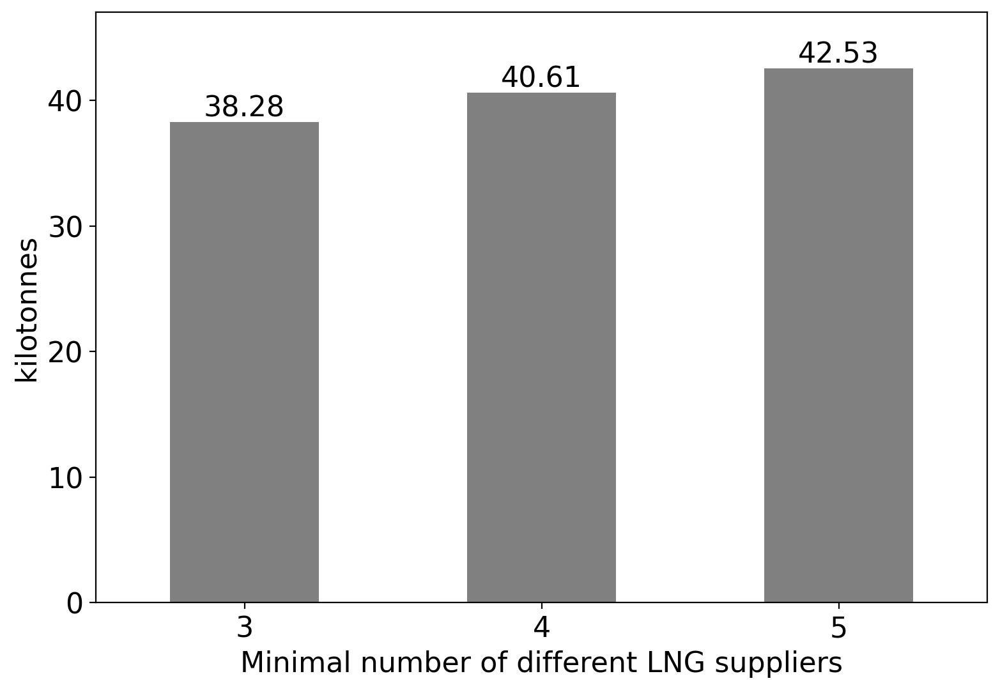

In [115]:
#Emissions_2019_ = CO2_Emissions * (transported_LNG_3_2019*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
#Outlook_2019_CO2 = round(Emissions_2019_.to_numpy().sum()/10**6,2)

Emissions_2019_4_CH4 = CH4_Emissions * (transported_LNG_2019_4_Suppliers*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Emissions_CH4_4 = round(Emissions_2019_4_CH4.to_numpy().sum()/10**3,2)

Emissions_2019_5_CH4 = CH4_Emissions * (transported_LNG_2019_5_Suppliers*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Emissions_CH4_5 = round(Emissions_2019_5_CH4.to_numpy().sum()/10**3,2)

Emi_Diver_CH4 = [Outlook_2019_CH4, Emissions_CH4_4, Emissions_CH4_5]

Emissions_Diver_CH4 = pd.DataFrame(Emi_Diver_CH4,
                   
                   index = ["3", "4", "5"],
    
                   columns = ["CH4 Emissions"])


ax = Emissions_Diver_CH4.plot(figsize = (9, 6), kind="bar", color = "grey", rot=0, ylim=(0,47))
for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("kilotonnes")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
ax.set_xlabel("Minimal number of different LNG suppliers")
plt.show()
#CO2_per_mmBtu_2019_4 = Emissions_2040_.to_numpy().sum()/(transported_LNG_3_2040.to_numpy().sum() * MMBtu_Gas * 10**9)
#CO2_per_mmBtu_2040

## 8 Strait of Hormuz at 2/3

### 8.1 Prices

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: unknown
  Lower bound: 114990530228.316
  Upper bound: 114990530228.316
  Number of objectives: 1
  Number of constraints: 288
  Number of variables: 256
  Number of nonzeros: 766
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Termination condition: optimal
  Statistics: 
    Branch and bound: 
      Number of bounded subproblems: 0
      Number of created subproblems: 0
  Error rc: 0
  Time: 0.19473743438720703
# ----------------------------------------------------------
#   Solution Information
# ---------

/tmp/ipykernel_18619/2702989250.py:80: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



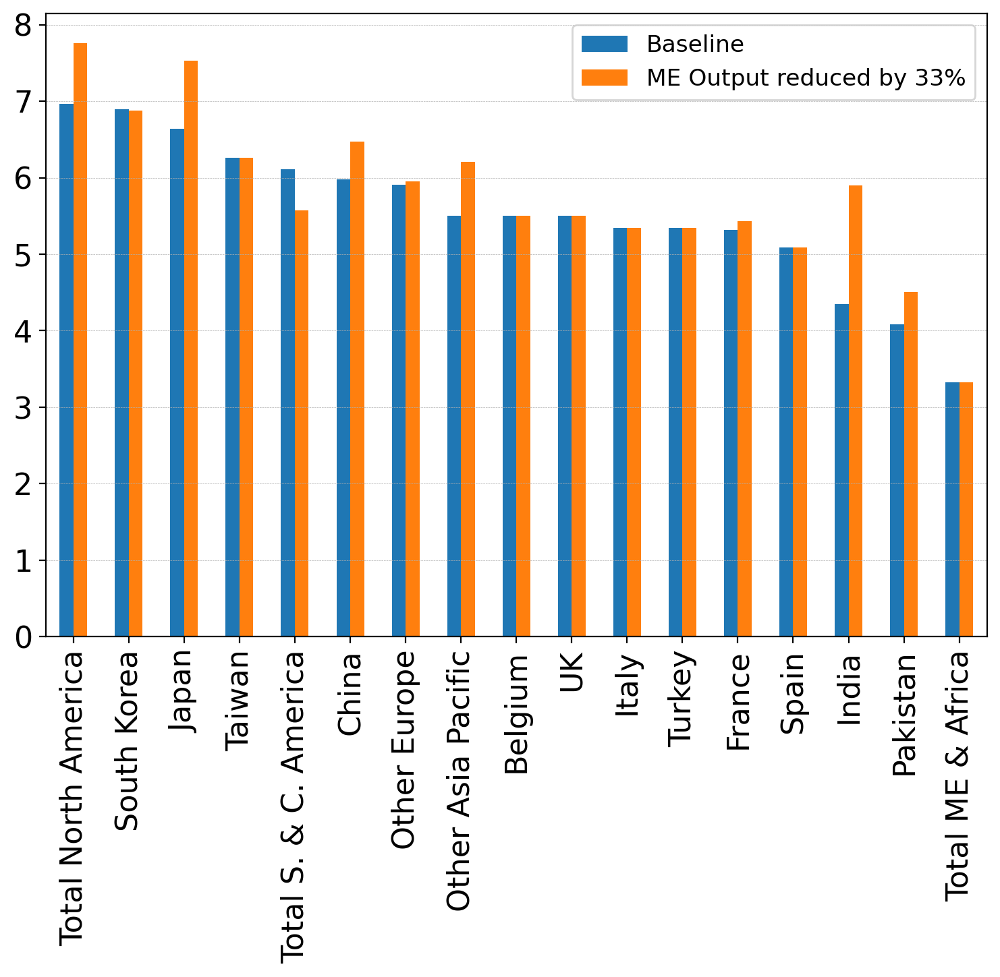

In [116]:
model_2019_HC = LNG_Model_3(Demand_2019, Supply_HC)
results_2019_HC = SolverFactory('glpk').solve(model_2019_HC)
results_2019_HC.write()

transported_2019_HC = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_2019_HC.index:
    for importer in transported_2019_HC.columns:
        transported_2019_HC.loc[exporter, importer] = model_2019_HC.x[importer, exporter]() / MMBtu_Gas / 1000000000
    

Merit_Order_2019_HC = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))


for i in Merit_Order_2019_HC.index:
    for j in Merit_Order_2019_HC.columns:
        if transported_2019_HC.loc[i,j] > 0:
            Merit_Order_2019_HC.loc[i,j] = TotalCosts.loc[i,j]


Sum_2019_HC = Merit_Order_2019_HC * transported_2019_HC * MMBtu_Gas * 1000000000


DES_Pr_2019_HC = pd.DataFrame(np.zeros((1,len(Merit_Order_2019_HC.columns))),
                   
                   index = ["2019"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_2019_HC = pd.DataFrame(np.zeros((1,len(Merit_Order_2019_HC.columns))),
                   
                   index = ["2019"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])



Imp_2019_HC.loc["2019"] = [105.6*10**9 * MMBtu_Gas, 84.9*10**9 * MMBtu_Gas, 55.6*10**9 * MMBtu_Gas,
                         32.9*10**9 * MMBtu_Gas, 23.2*10**9 * MMBtu_Gas, 12.4*10**9 * MMBtu_Gas,
                         23.1*10**9 * MMBtu_Gas, 21.9*10**9 * MMBtu_Gas, 19.1*10**9 * MMBtu_Gas,
                         14.3*10**9 * MMBtu_Gas, 13.2*10**9 * MMBtu_Gas, 9*10**9 * MMBtu_Gas,
                         30.6*10**9 * MMBtu_Gas, 24.4*10**9 * MMBtu_Gas, 11.2*10**9 * MMBtu_Gas,
                         13.5*10**9 * MMBtu_Gas, 10.9*10**9 * MMBtu_Gas]



for column in Imp_2019_HC.columns:
    DES_Pr_2019_HC.loc["2019", column] = Sum_2019_HC[column].sum()


DES_Pri_2019_HC = DES_Pr_2019_HC / Imp_2019_HC
DES_Price_2019_HC = DES_Pri_2019_HC.T

#DES_Prices_1 = DESp.sort_values("DES Price ($/MMBtu)", ascending=False, inplace = True)

DES_Price_3_2019.sort_values(by="Base Year", ascending=False, inplace = True)

#DES_Price_3_Oct_Q.plot(kind = 'barh', color = 'orange', figsize=(9,6))
DES_Price_HC = DES_Price_3_2019.T
DES_Price_HC = DES_Price_HC.append(DES_Price_2019_HC.T)

HC_ = ["Baseline", "ME Output reduced by 33%"]

id_y = pd.Index(HC_)
DES_Price_HC = DES_Price_HC.set_index(id_y)

DES_Price_HC.T.plot(figsize = (9, 6), kind="bar")
#plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)
plt.legend(fontsize=12.4)

### 8.2 Costs

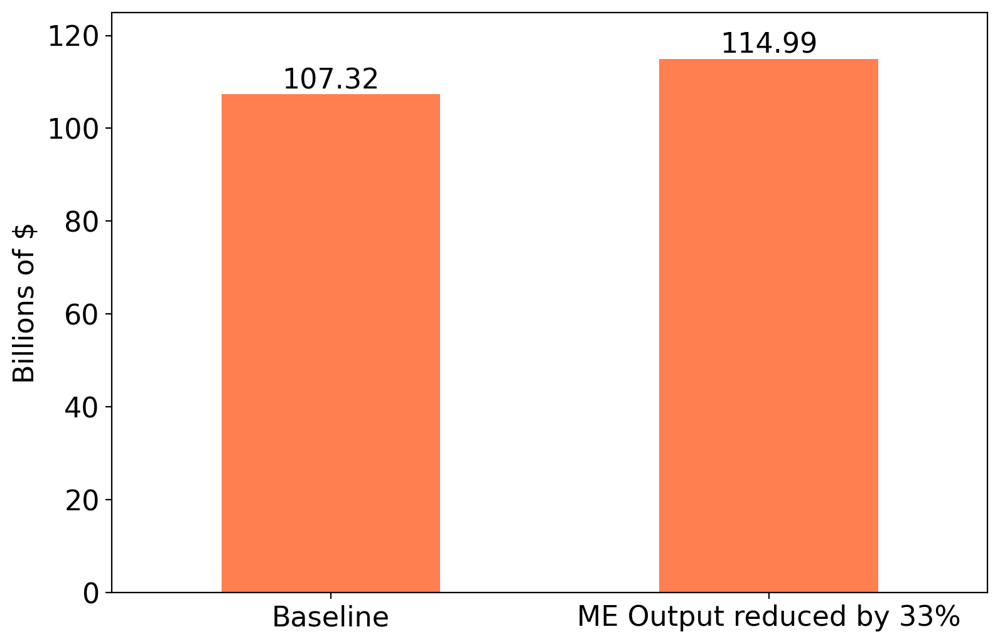

In [117]:
Costs_HC = [round(Total_Costs_2019 / 10**9, 2),
            round(model_2019_HC.Cost() / 10**9, 2)]


Costs_HC_ = pd.DataFrame({"Total costs": Costs_HC, 
                              }, index = ["Baseline", "ME Output reduced by 33%"])


ax = Costs_HC_.plot(figsize = (9, 6), kind="bar", color = ["coral"], rot=0, ylim=(0,125))

for container in ax.containers:
    ax.bar_label(container)
    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.set_ylabel("Billions of $")
ax.get_legend().remove()
plt.show()

### 8.3 Number of LNG Carriers

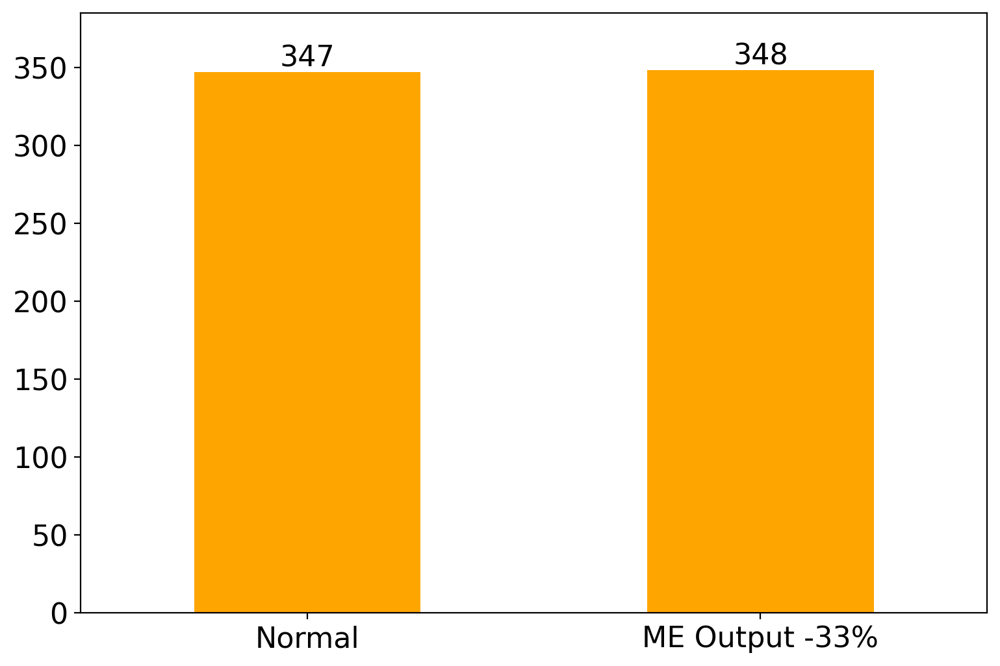

In [118]:
LNG_Carrier_Number_HC = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))



LNG_Carrier_Number_HC = (transported_2019_HC*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/365


Num_of_Carriers_HC = [round(Carriers_2019),
                      round(LNG_Carrier_Number_HC.to_numpy().sum())]

Carriers_2019_HC = pd.DataFrame(Num_of_Carriers_HC,
                   
                   index = ["Normal", "ME Output -33%"],
    
                   columns = ["Average Number of Carriers"])


ax = Carriers_2019_HC.plot(figsize = (9, 6), kind="bar", color = "orange", rot=0, ylim=(0,385))
for container in ax.containers:
    ax.bar_label(container)

#ax.set_xlabel("Minimal number of different LNG suppliers")
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()

### 8.4 Shadow Prices

Qatar                        70.9          70.9       -5.9157
Australia                   118.6         116.7        0.0000
USA                          52.1          52.1       -1.3332
Russia                       39.2          39.2       -3.8922
Malaysia                     42.1          42.1       -3.2468
Nigeria                      30.6          30.6       -3.6203
Trinidad & Tobago            20.4          20.4       -2.6785
Algeria                      35.2          35.2       -5.8355
Indonesia                    36.7          36.7       -3.1300
Oman                          9.6           9.6       -5.1145
Other Asia Pacific           19.4          19.4       -1.3176
Other Europe                  5.8           5.8       -3.5073
Other Americas                6.2           6.2       -1.7619
Other ME                      5.3           5.3       -5.7767
Other Africa                 15.6          15.6       -3.0765


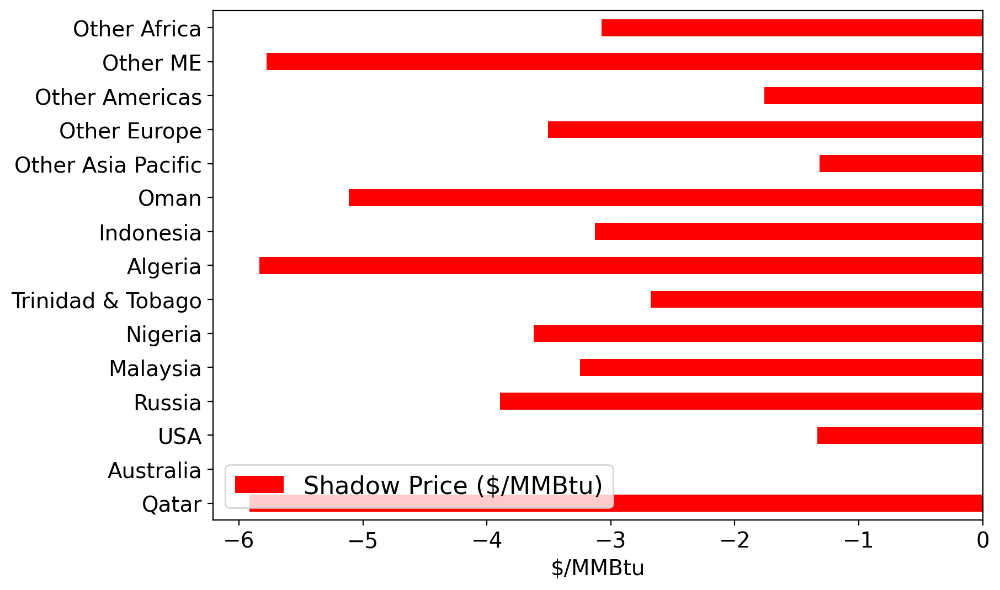

In [120]:
dual_export_2019_HC = pd.DataFrame(np.zeros((1, len(Merit_Order_2019_HC.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])


for m in model_2019_HC.src.keys():
        s = SRC[m-1]
        dual_export_2019_HC.loc["Shadow Price ($/MMBtu)", s] = model_2019_HC.dual[model_2019_HC.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_HC[s]/MMBtu_Gas/10**9,model_2019_HC.src[m]()/MMBtu_Gas/10**9,model_2019_HC.dual[model_2019_HC.src[m]]))

Dual_Export_HC = dual_export_2019_HC.T
#Dual_Export

#Dual_Export_Jun_SA.sort_values("Shadow Price ($/MMBtu)", ascending=True, inplace = True)
ax = Dual_Export_HC.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="red")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

Japan                               105.6     105.6      9.9234
China                                84.9      84.9      9.8156
South Korea                          55.6      55.6      9.8907
India                                32.9      32.9      9.1987
Taiwan                               23.2      23.2      9.7234
Pakistan                             12.4      12.4      9.1496
France                               23.1      23.1      8.8728
Spain                                21.9      21.9      8.7648
UK                                   19.1      19.1      8.8779
Italy                                14.3      14.3      9.0338
Turkey                               13.2      13.2      9.0453
Belgium                               9.0       9.0      8.8803
Other Asia Pacific                   30.6      30.6      9.6474
Other Europe                         24.4      24.4      9.0093
Total North America                  11.2      11.2      9.1642
Total S. & C. America                13.

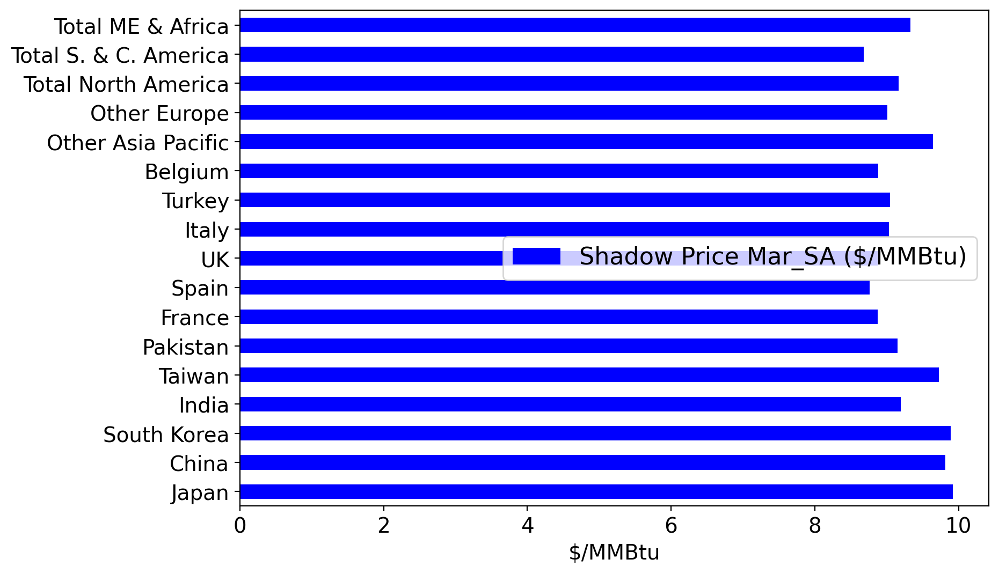

In [121]:
dual_import_2019_HC = pd.DataFrame(np.zeros((1,len(Merit_Order_2019_HC.columns))),
                   
                   index = ["Shadow Price Mar_SA ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])



for n in model_2019_HC.dmd.keys():
        c = CUS[n-1]
        dual_import_2019_HC.loc["Shadow Price Mar_SA ($/MMBtu)", c] = model_2019_HC.dual[model_2019_HC.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_2019[c]/MMBtu_Gas/10**9,model_2019_HC.dmd[n]()/MMBtu_Gas/10**9,model_2019_HC.dual[model_2019_HC.dmd[n]]))

Dual_Import_HC = dual_import_2019_HC.T
#Dual_Import_Jun_Q

#Dual_Import_Jun_SA.sort_values("Shadow Price Mar_SA ($/MMBtu)", ascending=False, inplace = True)
ax = Dual_Import_HC.plot(kind = 'barh', figsize = (9, 6), legend = True, fontsize = 14, color="blue")
ax.set_xlabel("$/MMBtu", fontsize=14)
ax.set_ylabel("", fontsize=14)
plt.show()

/tmp/ipykernel_18619/3426655683.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Total S. & C. America,Spain,France,UK,Belgium,Other Europe,Turkey,Italy,Total North America,Pakistan,Total ME & Africa,India,Taiwan,Other Asia Pacific,Japan,China,South Korea
Baseline,7.655537,7.742132,7.850099,7.855224,7.858049,7.977873,8.008226,8.113021,8.141480,8.366177,8.453139,8.463281,8.511094,8.515939,8.613794,8.636760,8.706826
ME Output reduced by 33%,8.678244,8.764839,8.872806,8.877949,8.880261,9.009263,9.045328,9.033759,9.164187,9.149611,9.330298,9.198685,9.723375,9.647439,9.923359,9.815649,9.890653


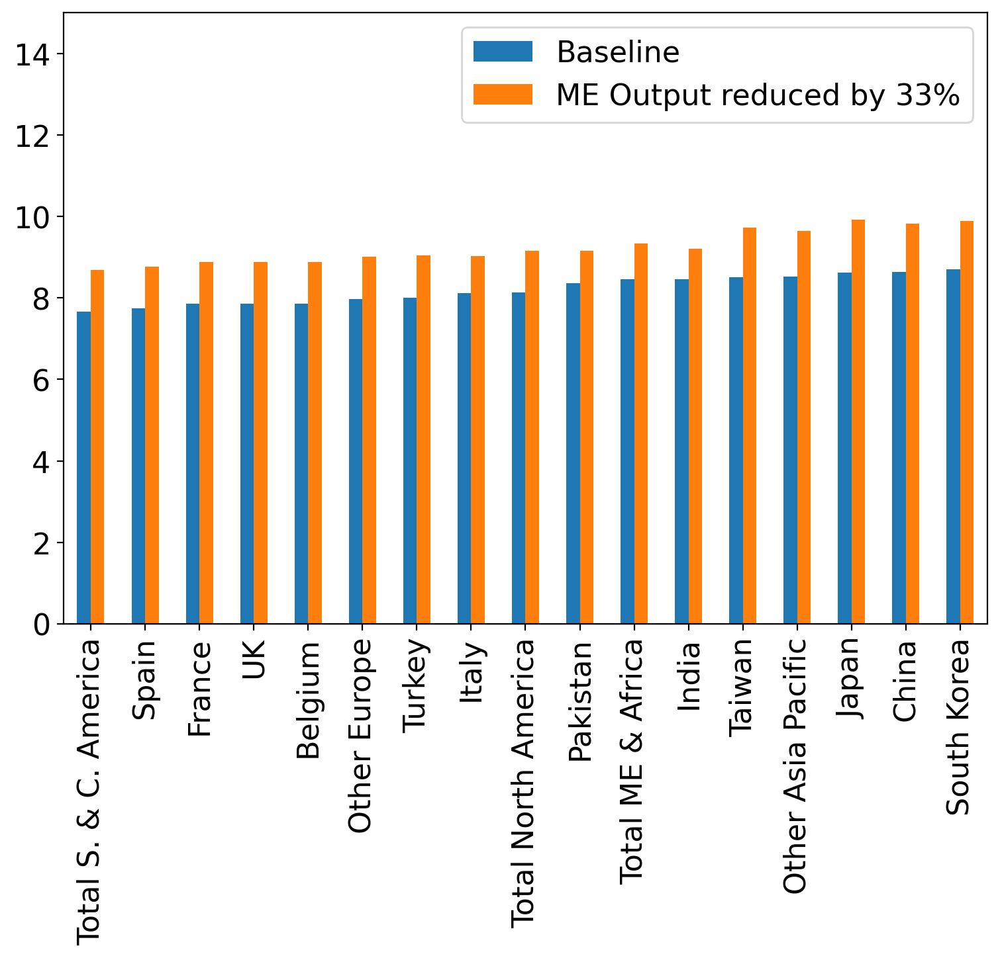

In [122]:
#Dual_Import_2019_4.sort_values("Shadow Price 2019 ($/MMBtu)", ascending=False, inplace = True)
Importer_Shadow_HC = Dual_Import_2019.T
Importer_Shadow_HC = Importer_Shadow_HC.append(Dual_Import_HC.T)

HC_y = ["Baseline", "ME Output reduced by 33%"]

id_y = pd.Index(HC_y) 
Importer_Shadow_HC = Importer_Shadow_HC.set_index(id_y)
Importer_Shadow_HC.T.plot(figsize = (9, 6), kind="bar", ylim=(0,15))
#plt.legend(bbox_to_anchor=(1.0, 1.0))
#plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)
Importer_Shadow_HC

/tmp/ipykernel_18619/166835373.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Other ME,Algeria,Qatar,Oman,Russia,Nigeria,Other Europe,Other Africa,Malaysia,Indonesia,Trinidad & Tobago,Other Americas,USA,Other Asia Pacific,Australia
Baseline,-4.993263,-4.804103,-4.554918,-4.379098,-2.708389,-2.597601,-2.475919,-2.199369,-2.062965,-1.951106,-1.655774,-0.452381,-0.023680,-0.008027,0.0
ME Output reduced by 33%,-5.776696,-5.835493,-5.915654,-5.114501,-3.892216,-3.620308,-3.507309,-3.076529,-3.246793,-3.129995,-2.678481,-1.761947,-1.333246,-1.317592,0.0


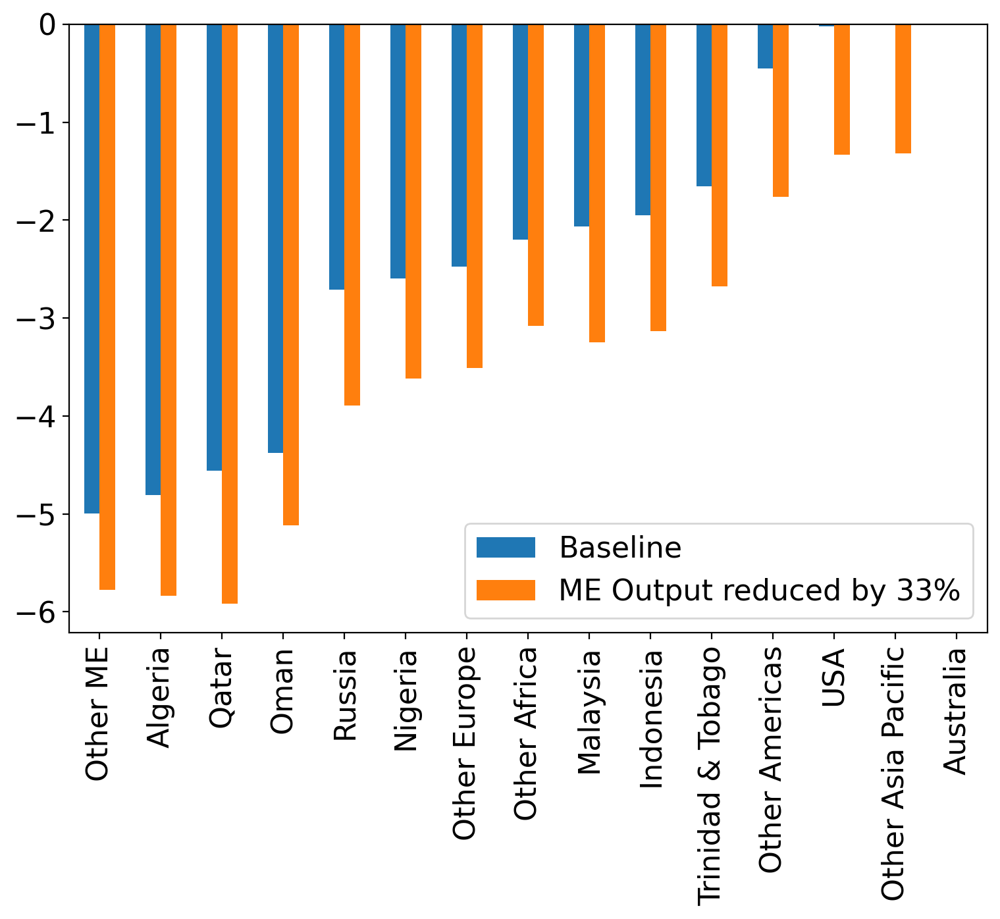

In [123]:
#Dual_Export_2019_4.sort_values("Shadow Price 2019 ($/MMBtu)", ascending=True, inplace = True)

Exporter_Shadow_HC = Dual_Export_2019.T
Exporter_Shadow_HC = Exporter_Shadow_HC.append(Dual_Export_HC.T)

Exporter_Shadow_HC = Exporter_Shadow_HC.set_index(id_y)
#Dual_Import_2019.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
Exporter_Shadow_HC.T.plot(figsize = (9, 6), kind="bar")
#plt.legend(bbox_to_anchor=(1.0, 0.18))
#plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)
Exporter_Shadow_HC

### 8.5 Emissions

#### 8.5.1 CO2

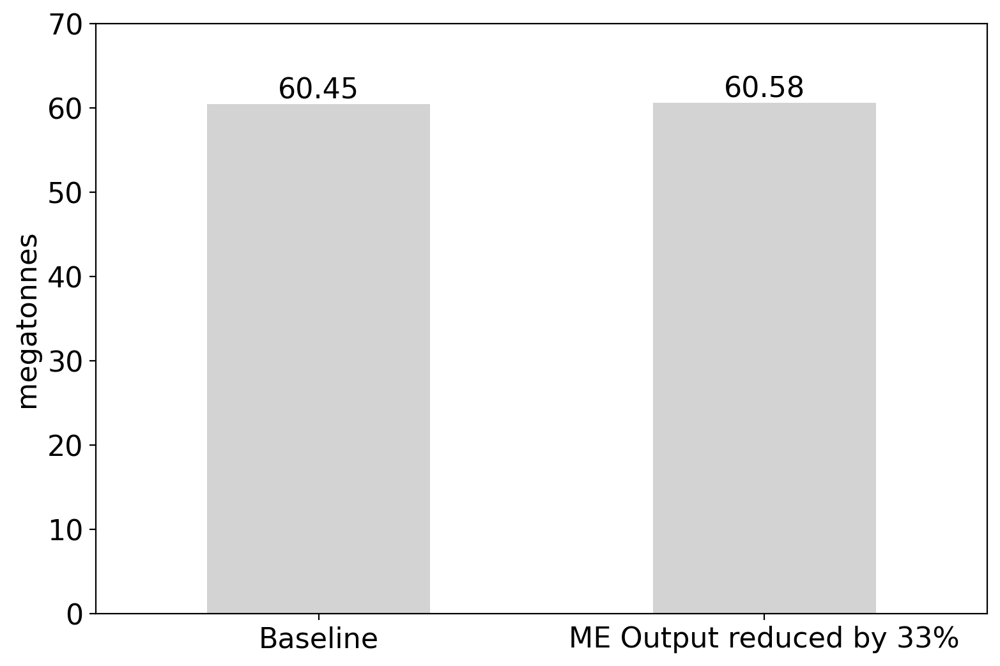

In [124]:
Emissions_2019_HC_ = CO2_Emissions * (transported_2019_HC*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Emissions_2019_HC_CO2 = round(Emissions_2019_HC_.to_numpy().sum()/10**6,2)


Emi_HC_CO2 = [Outlook_2019_CO2, Emissions_2019_HC_CO2]

Emissions_HC_CO2 = pd.DataFrame(Emi_HC_CO2,
                   
                   index = ["Baseline", "ME Output reduced by 33%"],
    
                   columns = ["CO2 Emissions"])


ax = Emissions_HC_CO2.plot(figsize = (9, 6), kind="bar", color = "lightgray", rot=0, ylim=(0,70))

for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("megatonnes")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()

#### 8.5.2 CH4

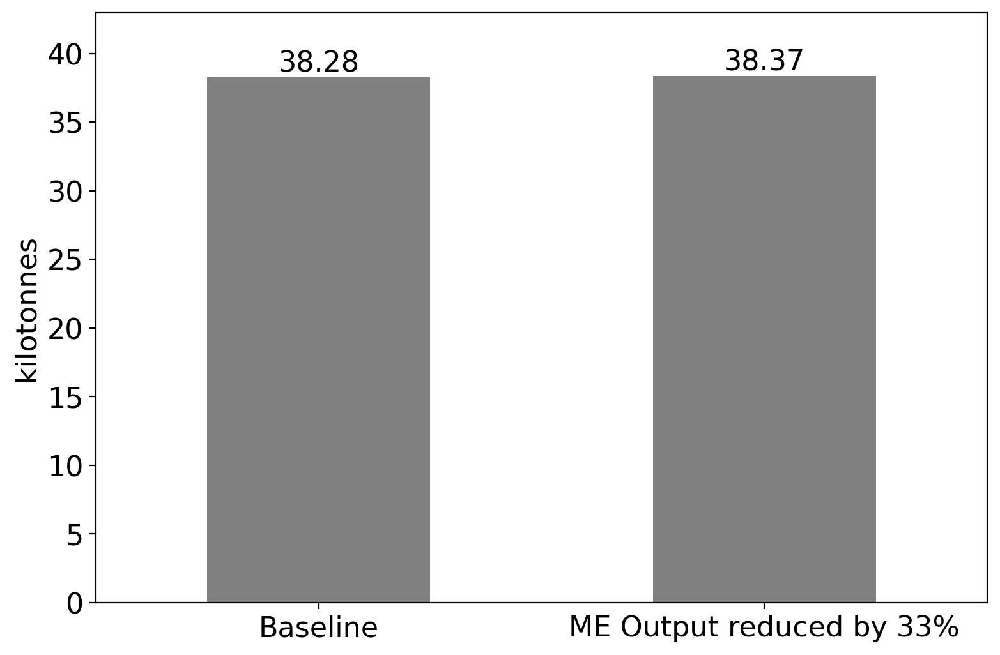

38.37

In [125]:
Emissions_2019_HC_CH4_ = CH4_Emissions * (transported_2019_HC*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Emissions_2019_HC_CH4 = round(Emissions_2019_HC_CH4_.to_numpy().sum()/10**3,2)


Emi_HC_CH4 = [Outlook_2019_CH4, Emissions_2019_HC_CH4]

Emissions_HC_CH4 = pd.DataFrame(Emi_HC_CH4,
                   
                   index = ["Baseline", "ME Output reduced by 33%"],
    
                   columns = ["CH4 Emissions"])


ax = Emissions_HC_CH4.plot(figsize = (9, 6), kind="bar", color = "grey", rot=0, ylim=(0,43))
for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("kilotonnes")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()
Emissions_2019_HC_CH4

## 9 Europe +33% 

In [128]:
model_2019_EU = LNG_Model_4(Demand_2019_EU, Supply_2019)
results_2019_EU = SolverFactory('glpk').solve(model_2019_EU)
results_2019_EU.write()

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: unknown
  Lower bound: 122335849783.428
  Upper bound: 122335849783.428
  Number of objectives: 1
  Number of constraints: 288
  Number of variables: 256
  Number of nonzeros: 766
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Termination condition: optimal
  Statistics: 
    Branch and bound: 
      Number of bounded subproblems: 0
      Number of created subproblems: 0
  Error rc: 0
  Time: 0.028207063674926758
# ----------------------------------------------------------
#   Solution Information
# --------

### 9.1 DES Price

/tmp/ipykernel_18619/2213743835.py:72: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Japan,China,South Korea,India,Taiwan,Pakistan,France,Spain,UK,Italy,Turkey,Belgium,Other Asia Pacific,Other Europe,Total North America,Total S. & C. America,Total ME & Africa
Qatar,26.400,21.225,13.900,8.225,5.8,3.1,0.000,7.300,1.608,4.767,4.4,0.0,7.650,0.000,0.0,0.000,2.725
Australia,26.400,21.225,13.900,8.225,5.8,3.1,0.000,7.300,3.033,4.767,4.4,0.0,7.650,0.000,2.8,3.375,2.725
USA,4.285,0.000,0.000,0.000,0.0,0.0,7.700,7.300,6.367,4.767,4.4,3.0,0.000,8.133,2.8,3.375,0.000
Russia,26.400,0.000,12.849,0.000,0.0,0.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.000,0.000
Malaysia,0.000,21.225,7.385,0.000,5.8,0.0,0.000,0.000,0.000,0.000,0.0,0.0,7.650,0.000,0.0,0.000,0.000
Nigeria,0.000,0.000,0.000,0.000,0.0,0.0,7.700,2.039,6.367,0.000,0.0,3.0,0.000,8.133,0.0,3.375,0.000
Trinidad & Tobago,0.000,0.000,0.000,0.000,0.0,0.0,6.079,0.000,1.726,0.000,0.0,3.0,0.000,6.805,2.8,-0.000,0.000
Algeria,0.000,0.000,0.000,0.000,0.0,0.0,7.700,5.261,6.367,4.767,4.4,3.0,0.000,3.670,0.0,0.000,0.000
Indonesia,0.000,21.225,6.832,0.000,5.8,0.0,0.000,0.000,0.000,0.000,0.0,0.0,2.824,0.000,0.0,0.000,0.000
Oman,0.000,0.000,0.000,8.225,0.0,3.1,0.000,0.000,0.000,0.000,0.0,0.0,0.292,0.000,0.0,0.000,2.725


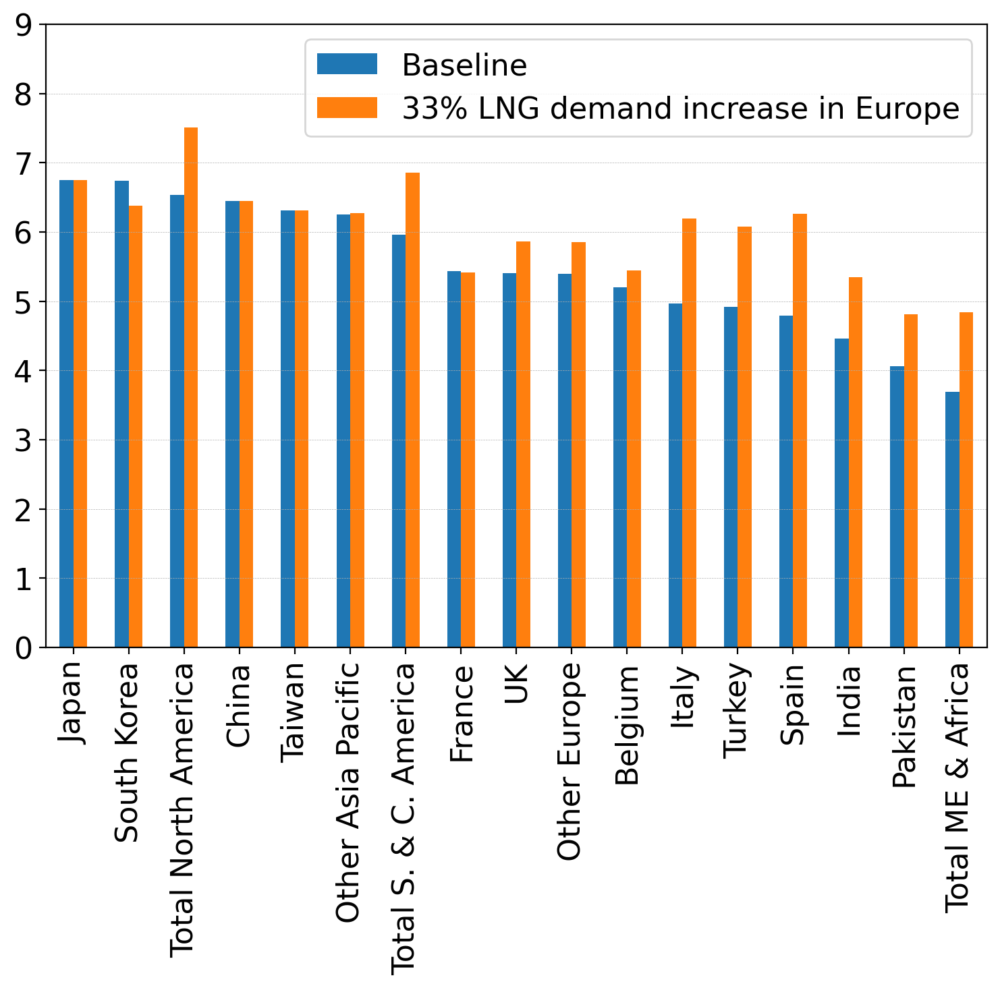

In [129]:
transported_LNG_2019_EU = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_2019_EU.index:
    for importer in transported_LNG_2019_EU.columns:
        transported_LNG_2019_EU.loc[exporter, importer] = model_2019_EU.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_2019_EU = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))


for i in transported_LNG_2019_EU.index:
    for j in transported_LNG_2019_EU.columns:
        if transported_LNG_2019_EU.loc[i,j] > 0:
            Merit_Order_2019_EU.loc[i,j] = Total_Costs.loc[i,j]


Sum_2019_EU = Merit_Order_2019_EU * transported_LNG_2019_EU * MMBtu_Gas * 1000000000

DES_Pr_2019_EU = pd.DataFrame(np.zeros((1,len(Merit_Order_2019_EU.columns))),
                   
                   index = ["2019"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_2019_EU = pd.DataFrame(np.zeros((1,len(Merit_Order_3_2019.columns))),
                   
                   index = ["2019"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_2019_EU.loc["2019"] = [105.6*10**9 * MMBtu_Gas, 84.9*10**9 * MMBtu_Gas, 55.6*10**9 * MMBtu_Gas,
                           32.9*10**9 * MMBtu_Gas, 23.2*10**9 * MMBtu_Gas, 12.4*10**9 * MMBtu_Gas,
                           (4/3)*23.1*10**9 * MMBtu_Gas, (4/3)*21.9*10**9 * MMBtu_Gas, (4/3)*19.1*10**9 * MMBtu_Gas,
                           (4/3)*14.3*10**9 * MMBtu_Gas, (4/3)*13.2*10**9 * MMBtu_Gas, (4/3)*9*10**9 * MMBtu_Gas,
                           30.6*10**9 * MMBtu_Gas, (4/3)*24.4*10**9 * MMBtu_Gas, 11.2*10**9 * MMBtu_Gas,
                           13.5*10**9 * MMBtu_Gas, 10.9*10**9 * MMBtu_Gas]


for column in Sum_2019_EU.columns:
    DES_Pr_2019_EU.loc["2019", column] = Sum_2019_EU[column].sum()


DES_Pri_2019_EU = DES_Pr_2019_EU / Imp_2019_EU
DES_Price_2019_EU = DES_Pri_2019_EU.T

DES_Price_4_2019.sort_values(by="Base Year", ascending=False, inplace = True)

#DES_Price_2019_EU.plot(kind = 'barh', color = 'orange', figsize=(9,6))
#DES_Price_2019_EU

DES_Price_EU = DES_Price_4_2019.T
DES_Price_EU = DES_Price_EU.append(DES_Price_2019_EU.T)

EU_ = ["Baseline", "33% LNG demand increase in Europe"]

id_y = pd.Index(EU_)
DES_Price_EU = DES_Price_EU.set_index(id_y)

DES_Price_EU.T.plot(figsize = (9, 6), kind="bar", ylim=(0,9))
#plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)
transported_LNG_2019_EU.round(3)

### 9.2 Carriers

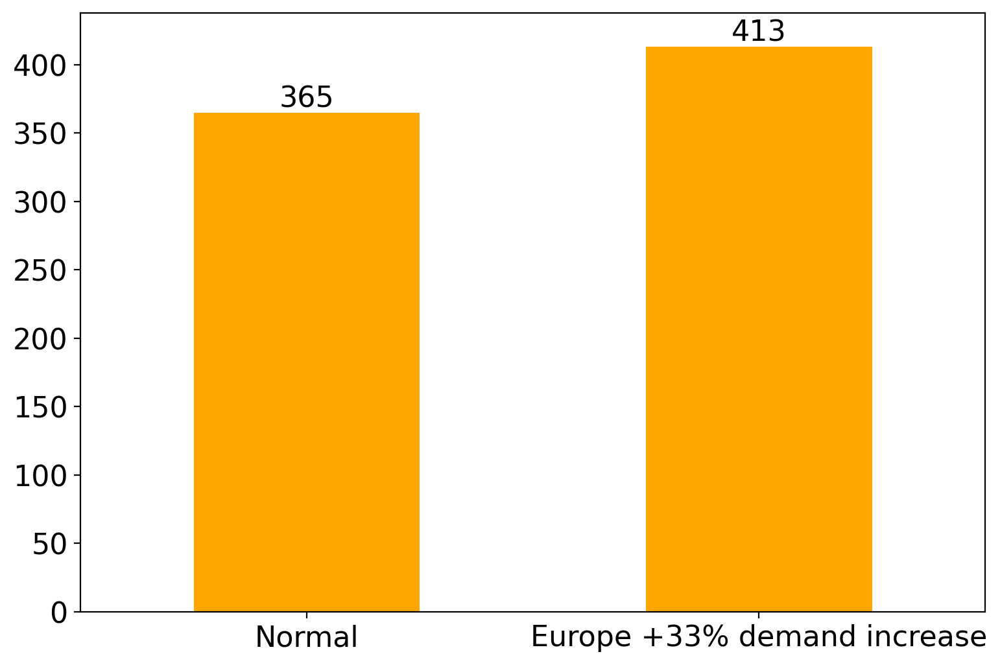

In [130]:
LNG_Carrier_Number_2019_EU = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

LNG_Carrier_Number_EU = (transported_LNG_2019_EU*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/365
Carriers_EU = round(LNG_Carrier_Number_EU.to_numpy().sum())

LNG_Carr_EU_ = [round(num_carrier_2019_4_Suppliers.to_numpy().sum()), Carriers_EU]


LNG_Carriers_EU = pd.DataFrame({"Number of LNG Carriers": LNG_Carr_EU_, 
                              }, index = ["Normal", "Europe +33% demand increase"])


ax = LNG_Carriers_EU.plot(figsize = (9, 6), kind="bar", color = ["orange"], rot=0, ylim=(0,438))

for container in ax.containers:
    ax.bar_label(container)
    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()

### 9.3 Costs

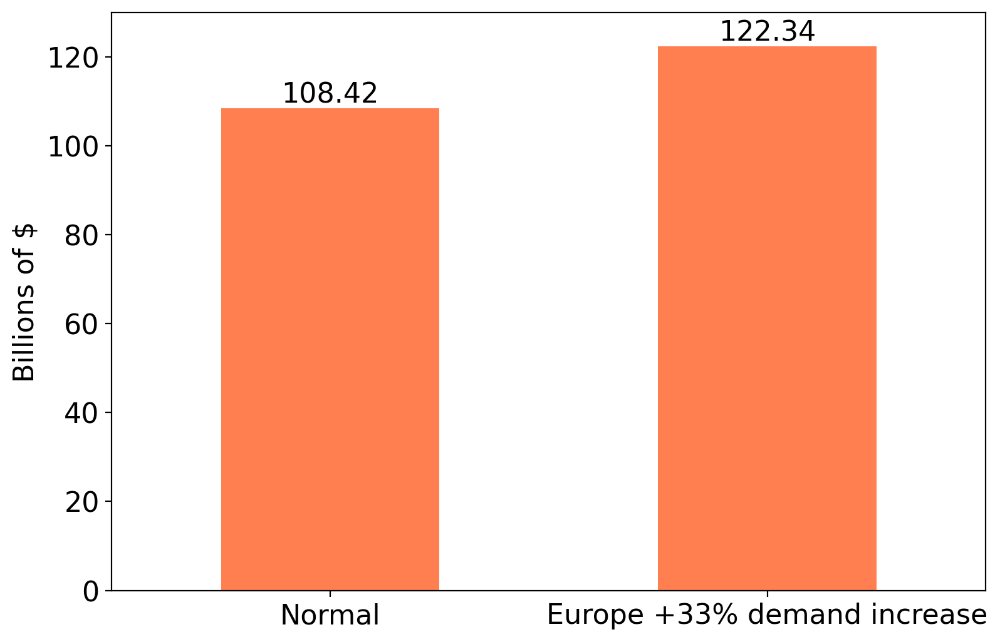

In [131]:
Costs_EU = [round(model_2019_4_Suppliers.Cost() / 10**9, 2),
            round(model_2019_EU.Cost() / 10**9, 2)]


Costs_EU_ = pd.DataFrame({"Total costs": Costs_EU, 
                              }, index = ["Normal", "Europe +33% demand increase"])


ax = Costs_EU_.plot(figsize = (9, 6), kind="bar", color = ["coral"], rot=0, ylim=(0,130))

for container in ax.containers:
    ax.bar_label(container)
    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.set_ylabel("Billions of $")
ax.get_legend().remove()
plt.show()

### 9.4 Shadow Exporters

Qatar                       107.1         107.1       -6.4795
Australia                   118.6         114.7        0.0000
USA                          52.1          52.1       -3.0378
Russia                       39.2          39.2       -5.7225
Malaysia                     42.1          42.1       -5.0771
Nigeria                      30.6          30.6       -5.3579
Trinidad & Tobago            20.4          20.4       -4.5759
Algeria                      35.2          35.2       -7.7329
Indonesia                    36.7          36.7       -4.9652
Oman                         14.3          14.3       -6.7562
Other Asia Pacific           19.4          19.4       -3.0222
Other Europe                  5.8           5.8       -5.4047
Other Americas                6.2           6.2       -3.4665
Other ME                      8.0           8.0       -7.6113
Other Africa                 15.6          15.6       -4.9592


/tmp/ipykernel_18619/2022021303.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Other ME,Algeria,Oman,Qatar,Russia,Nigeria,Other Europe,Other Africa,Malaysia,Indonesia,Trinidad & Tobago,Other Americas,USA,Australia,Other Asia Pacific
Baseline,-5.012687,-4.413912,-3.852890,-3.551303,-2.700362,-2.589575,-2.467892,-2.295235,-2.054938,-1.943079,-1.639064,-0.444355,-0.015653,0.0,0.000000
33% LNG demand increase in Europe,-7.611293,-7.732933,-6.756228,-6.479457,-5.722514,-5.357921,-5.404748,-4.959155,-5.077091,-4.965232,-4.575920,-3.466507,-3.037806,0.0,-3.022152


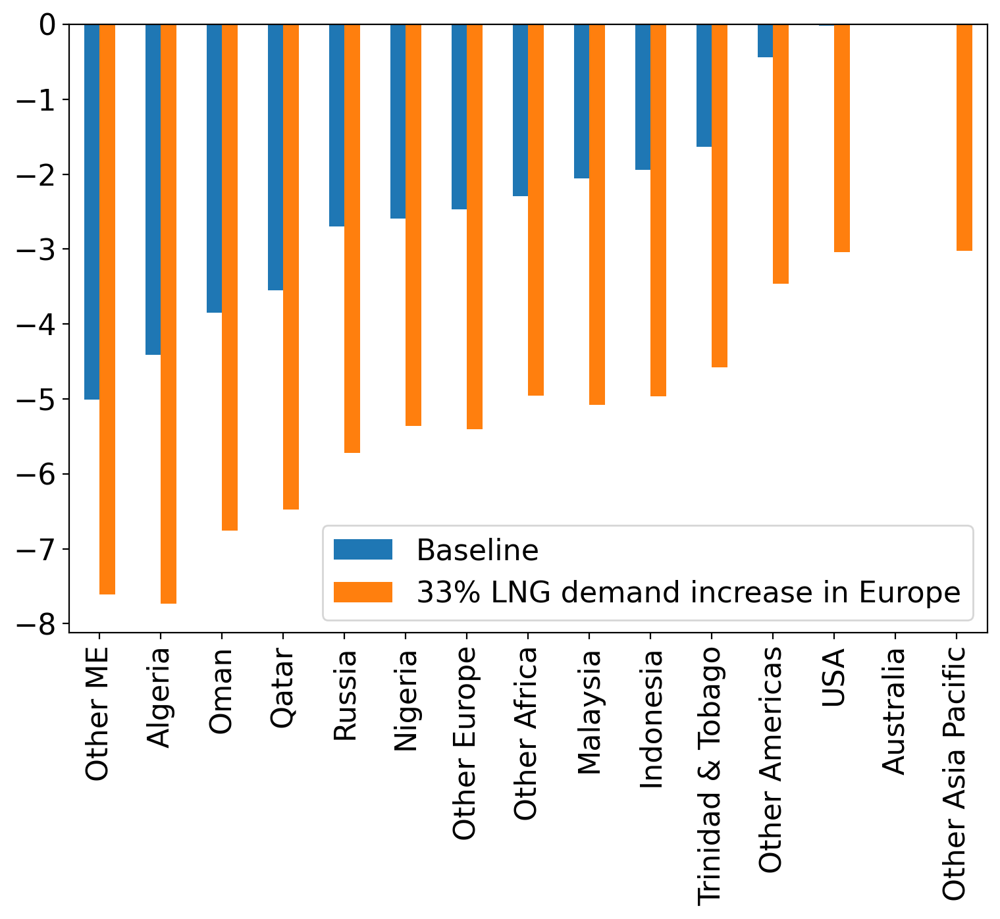

In [132]:
dual_export_2019_EU = pd.DataFrame(np.zeros((1, len(Merit_Order_2019_EU.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])


for m in model_2019_EU.src.keys():
        s = SRC[m-1]
        dual_export_2019_EU.loc["Shadow Price ($/MMBtu)", s] = model_2019_EU.dual[model_2019_EU.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_2019[s]/MMBtu_Gas/10**9,model_2019_EU.src[m]()/MMBtu_Gas/10**9,model_2019_EU.dual[model_2019_EU.src[m]]))

Dual_Export_EU = dual_export_2019_EU.T
Dual_Export_2019_4.sort_values("Shadow Price 2019 ($/MMBtu)", ascending=True, inplace = True)

Exporter_Shadow_EU = Dual_Export_2019_4.T
Exporter_Shadow_EU = Exporter_Shadow_EU.append(Dual_Export_EU.T)
EU_ = ["Baseline", "33% LNG demand increase in Europe"]

id_y = pd.Index(EU_)
Exporter_Shadow_EU = Exporter_Shadow_EU.set_index(id_y)
#Dual_Import_2019.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
Exporter_Shadow_EU.T.plot(figsize = (9, 6), kind="bar")
plt.legend(bbox_to_anchor=(1.0, 0.2))
#plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)
Exporter_Shadow_EU

### 9.5 Shadow Importers

Japan                               105.6     105.6     11.6279
China                                84.9      84.9     11.6509
South Korea                          55.6      55.6     11.7210
India                                32.9      32.9     11.0813
Taiwan                               23.2      23.2     11.5588
Pakistan                             12.4      12.4     10.9842
France                               30.8      30.8     10.7702
Spain                                29.2      29.2     10.5025
UK                                   25.5      25.5     10.7754
Italy                                19.1      19.1     10.7714
Turkey                               17.6      17.6     10.7685
Belgium                              12.0      12.0     10.7777
Other Asia Pacific                   30.6      30.6     11.5301
Other Europe                         32.5      32.5     10.9067
Total North America                  11.2      11.2     11.0616
Total S. & C. America                13.

/tmp/ipykernel_18619/1173733674.py:24: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



<AxesSubplot:>

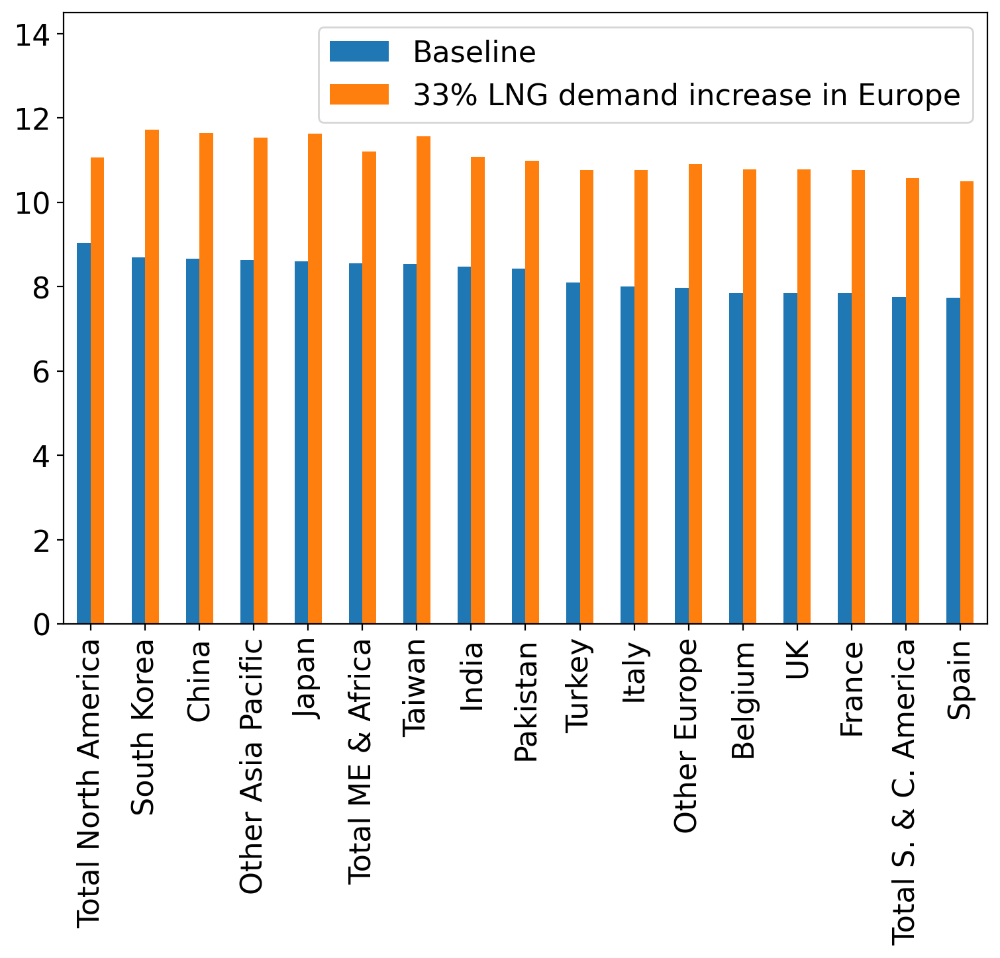

In [133]:
dual_import_2019_EU = pd.DataFrame(np.zeros((1,len(Merit_Order_2019_EU.columns))),
                   
                   index = ["Shadow Price Mar_SA ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_EU.dmd.keys():
        c = CUS[n-1]
        dual_import_2019_EU.loc["Shadow Price Mar_SA ($/MMBtu)", c] = model_2019_EU.dual[model_2019_EU.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_2019_EU[c]/MMBtu_Gas/10**9,model_2019_EU.dmd[n]()/MMBtu_Gas/10**9,model_2019_EU.dual[model_2019_EU.dmd[n]]))

Dual_Import_EU = dual_import_2019_EU.T
#Dual_Import_Jun_Q

Dual_Import_2019_4.sort_values("Shadow Price 2019 ($/MMBtu)", ascending=False, inplace = True)
# ax.set_xlabel("$/MMBtu", fontsize=12)
# ax.set_ylabel("", fontsize=12)
# plt.show()

Importer_Shadow_EU = Dual_Import_2019_4.T
Importer_Shadow_EU = Importer_Shadow_EU.append(Dual_Import_EU.T)

EU_y = ["Baseline", "33% LNG demand increase in Europe"]

id_y = pd.Index(EU_y) 
Importer_Shadow_EU = Importer_Shadow_EU.set_index(id_y)
Importer_Shadow_EU.T.plot(figsize = (9, 6), kind="bar", ylim=(0,14.5))
#plt.legend(bbox_to_anchor=(1.0, 1.0))
#plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)
#Dual_Import_2019_4

### 9.6 CO2

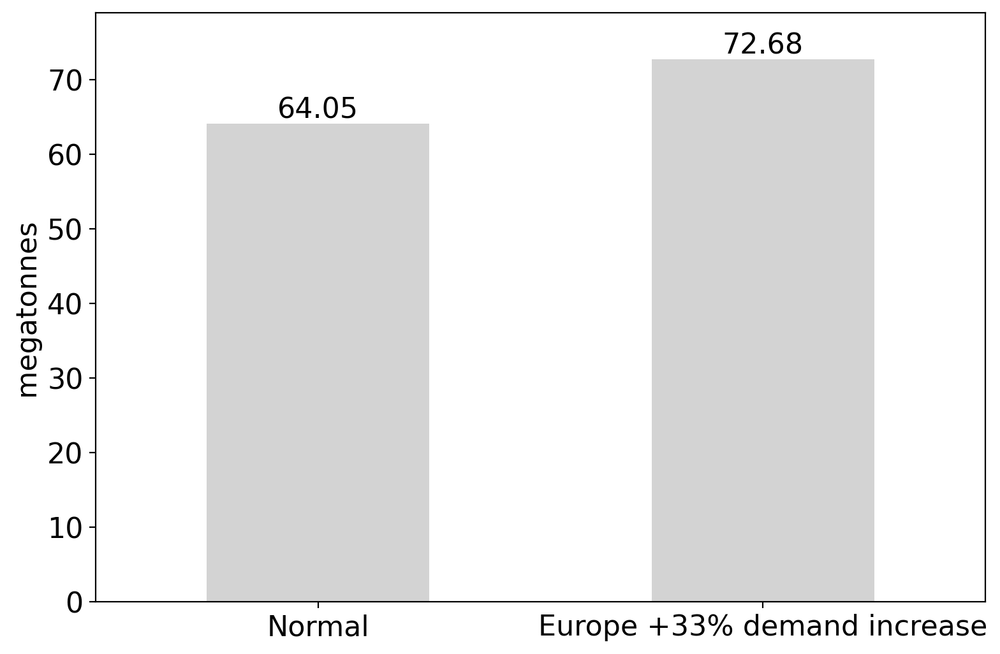

In [134]:
Emissions_2019_EU_ = CO2_Emissions * (transported_LNG_2019_EU*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Emissions_2019_EU_CO2 = round(Emissions_2019_EU_.to_numpy().sum()/10**6,2)


Emi_EU_CO2 = [Emissions_CO2_4, Emissions_2019_EU_CO2]

Emissions_EU_CO2 = pd.DataFrame(Emi_EU_CO2,
                   
                   index = ["Normal", "Europe +33% demand increase"],
    
                   columns = ["CO2 Emissions"])


ax = Emissions_EU_CO2.plot(figsize = (9, 6), kind="bar", color = "lightgray", rot=0, ylim=(0,79))

for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("megatonnes")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()

### 9.7 CH4

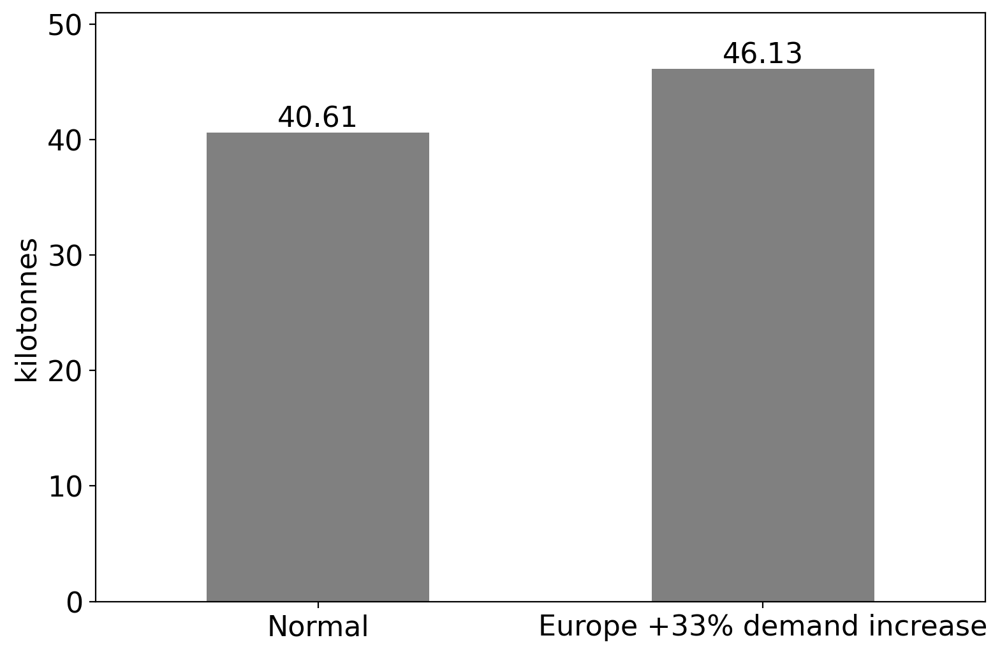

In [135]:
Emissions_2019_EU_CH4_ = CH4_Emissions * (transported_LNG_2019_EU*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Emissions_2019_EU_CH4 = round(Emissions_2019_EU_CH4_.to_numpy().sum()/10**3,2)


Emi_EU_CH4 = [Emissions_CH4_4, Emissions_2019_EU_CH4]

Emissions_EU_CH4 = pd.DataFrame(Emi_EU_CH4,
                   
                   index = ["Normal", "Europe +33% demand increase"],
    
                   columns = ["CH4 Emissions"])


ax = Emissions_EU_CH4.plot(figsize = (9, 6), kind="bar", color = "grey", rot=0, ylim=(0,51))
for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("kilotonnes")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()
#Emissions_EU_CH4

## 10 Asia Pacific -20%

In [136]:
model_2019_Asia = LNG_Model_4(Demand_2019_Asia, Supply_2019)
results_2019_Asia = SolverFactory('glpk').solve(model_2019_Asia)
results_2019_Asia.write()

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: unknown
  Lower bound: 94651804554.1664
  Upper bound: 94651804554.1664
  Number of objectives: 1
  Number of constraints: 288
  Number of variables: 256
  Number of nonzeros: 766
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Termination condition: optimal
  Statistics: 
    Branch and bound: 
      Number of bounded subproblems: 0
      Number of created subproblems: 0
  Error rc: 0
  Time: 0.0325617790222168
# ----------------------------------------------------------
#   Solution Information
# ----------

### 10.1 DES Price

/tmp/ipykernel_18619/1782119013.py:72: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Total ME & Africa,Pakistan,India,Spain,Turkey,Italy,Belgium,Other Europe,UK,France,Total S. & C. America,Other Asia Pacific,Taiwan,China,Total North America,South Korea,Japan
Baseline,3.696487,4.063785,4.461258,4.791172,4.915798,4.972048,5.202647,5.394373,5.406634,5.435866,5.961011,6.249547,6.316356,6.447095,6.538042,6.737043,6.748709
20% LNG demand decrease in Asia Pacific,3.524913,3.444342,4.082215,4.791172,4.915798,4.972048,5.202647,5.345684,5.200192,5.195519,5.961011,4.061696,4.507658,4.999615,6.538042,4.796903,4.813261


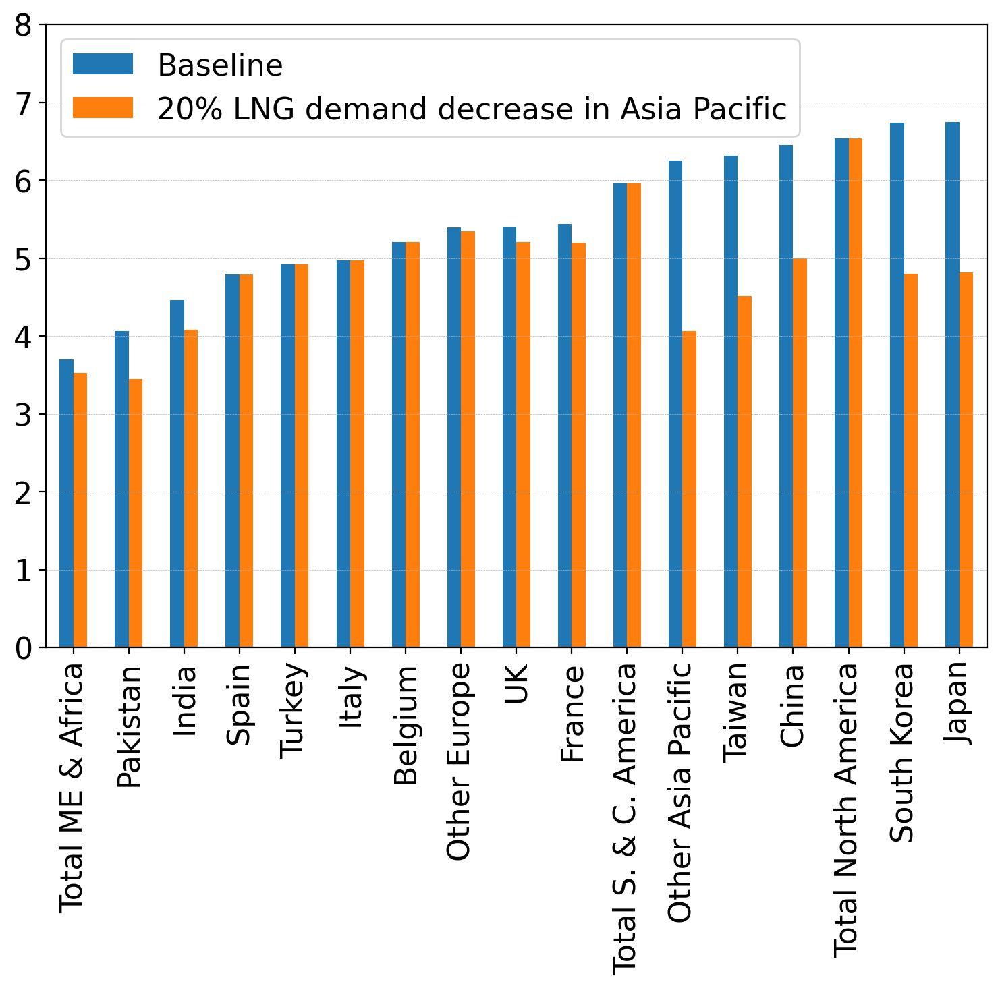

In [137]:
transported_LNG_2019_AS = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

for exporter in transported_LNG_2019_AS.index:
    for importer in transported_LNG_2019_AS.columns:
        transported_LNG_2019_AS.loc[exporter, importer] = model_2019_Asia.x[importer, exporter]() / MMBtu_Gas / 1000000000


Merit_Order_2019_AS = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))


for i in transported_LNG_2019_AS.index:
    for j in transported_LNG_2019_AS.columns:
        if transported_LNG_2019_AS.loc[i,j] > 0:
            Merit_Order_2019_AS.loc[i,j] = Total_Costs.loc[i,j]


Sum_2019_AS = Merit_Order_2019_AS * transported_LNG_2019_AS * MMBtu_Gas * 1000000000

DES_Pr_2019_AS = pd.DataFrame(np.zeros((1,len(Merit_Order_2019_AS.columns))),
                   
                   index = ["2019"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_2019_AS = pd.DataFrame(np.zeros((1,len(Merit_Order_3_2019.columns))),
                   
                   index = ["2019"], #"Import (MMBtu)"
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])

Imp_2019_AS.loc["2019"] = [1.121*105.6*10**9 * MMBtu_Gas, 1.121*84.9*10**9 * MMBtu_Gas, 1.121*55.6*10**9 * MMBtu_Gas,
                           1.121*32.9*10**9 * MMBtu_Gas, 1.121*23.2*10**9 * MMBtu_Gas, 1.121*12.4*10**9 * MMBtu_Gas,
                           23.1*10**9 * MMBtu_Gas, 21.9*10**9 * MMBtu_Gas, 19.1*10**9 * MMBtu_Gas,
                           14.3*10**9 * MMBtu_Gas, 13.2*10**9 * MMBtu_Gas, 9*10**9 * MMBtu_Gas,
                           1.121*30.6*10**9 * MMBtu_Gas, 24.4*10**9 * MMBtu_Gas, 11.2*10**9 * MMBtu_Gas,
                           13.5*10**9 * MMBtu_Gas, 10.9*10**9 * MMBtu_Gas]


for column in Sum_2019_AS.columns:
    DES_Pr_2019_AS.loc["2019", column] = Sum_2019_AS[column].sum()


DES_Pri_2019_AS = DES_Pr_2019_AS / Imp_2019_AS
DES_Price_2019_AS = DES_Pri_2019_AS.T

DES_Price_4_2019.sort_values(by="Base Year", ascending=True, inplace = True)

# DES_Price_2019_EU.plot(kind = 'barh', color = 'orange', figsize=(9,6))
#DES_Price_2019_EU

DES_Price_AS = DES_Price_4_2019.T
DES_Price_AS = DES_Price_AS.append(DES_Price_2019_AS.T)

AS_ = ["Baseline", "20% LNG demand decrease in Asia Pacific"]

id_y = pd.Index(AS_)
DES_Price_AS = DES_Price_AS.set_index(id_y)

DES_Price_AS.T.plot(figsize = (9, 6), kind="bar", ylim=(0,8))
#plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)
DES_Price_AS

### 10.2 Carriers

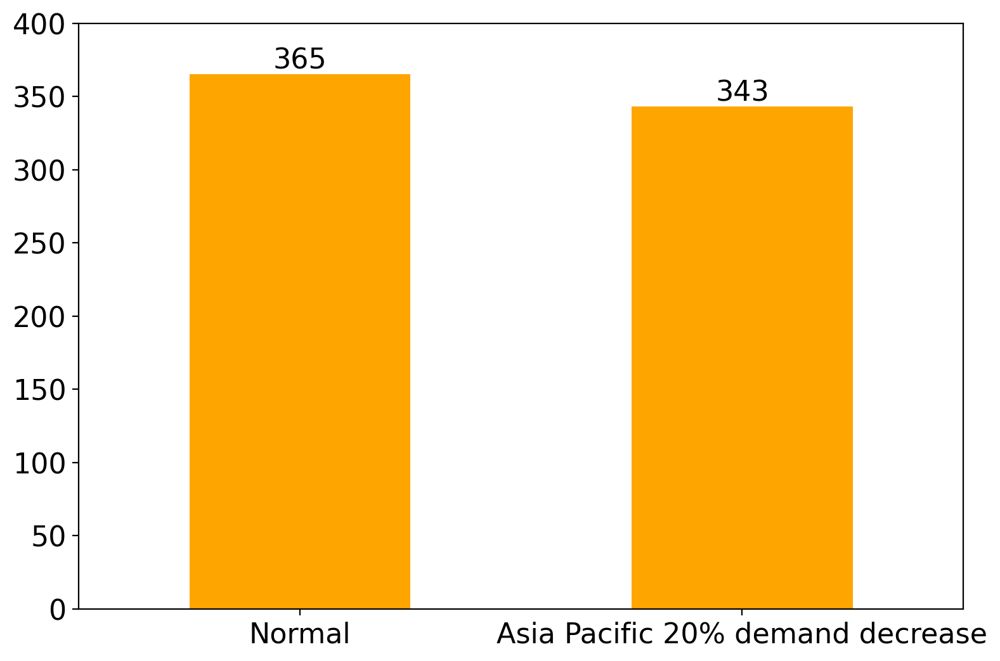

343

In [138]:
LNG_Carrier_Number_2019_AS = pd.DataFrame(np.zeros((len(Distances.index),len(Distances.columns))),
                   
                    index = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"],

                    columns = ("Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"))

LNG_Carrier_Number_AS = (transported_LNG_2019_AS*10**9)/(0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)*(Time+3)/365
Carriers_AS = round(LNG_Carrier_Number_AS.to_numpy().sum())

LNG_Carr_AS_ = [round(num_carrier_2019_4_Suppliers.to_numpy().sum()), Carriers_AS]


LNG_Carriers_AS = pd.DataFrame({"Number of LNG Carriers": LNG_Carr_AS_, 
                              }, index = ["Normal", "Asia Pacific 20% demand decrease"])


bx = LNG_Carriers_AS.plot(figsize = (9, 6), kind="bar", color = ["orange"], rot=0, ylim=(0,400))

for container in bx.containers:
    bx.bar_label(container)
    
plt.legend(bbox_to_anchor=(1.0, 1.0))
bx.get_legend().remove()
plt.show()
Carriers_AS

### 10.3 Costs

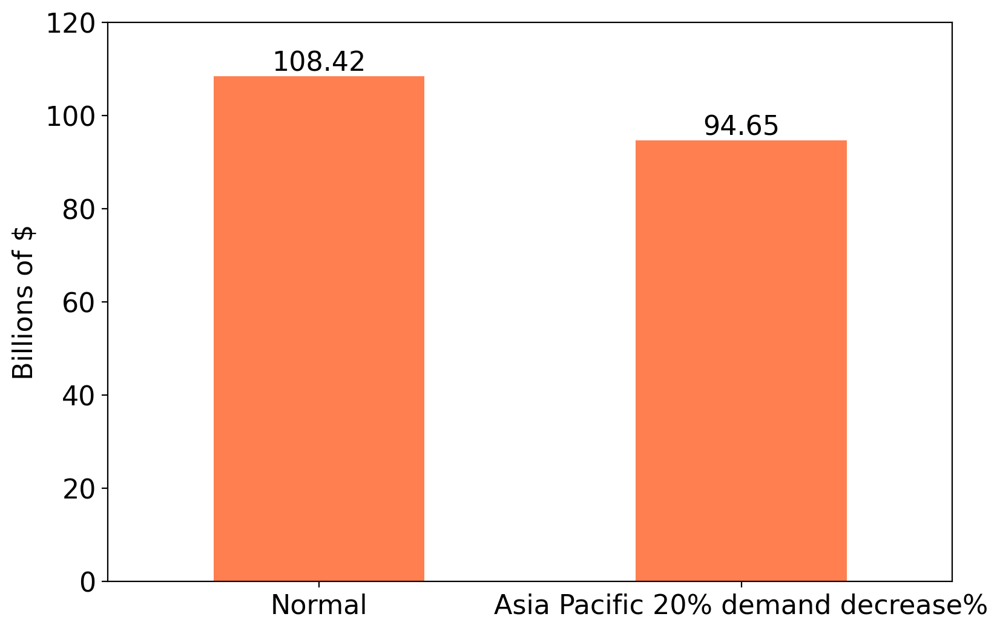

In [139]:
Costs_AS = [round(model_2019_4_Suppliers.Cost() / 10**9, 2),
            round(model_2019_Asia.Cost() / 10**9, 2)]


Costs_AS_ = pd.DataFrame({"Total costs": Costs_AS, 
                              }, index = ["Normal", "Asia Pacific 20% demand decrease%"])


ax = Costs_AS_.plot(figsize = (9, 6), kind="bar", color = ["coral"], rot=0, ylim=(0,120))

for container in ax.containers:
    ax.bar_label(container)
    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.set_ylabel("Billions of $")
ax.get_legend().remove()
plt.show()

### 10.4 Shadow Exporters

Qatar                       107.1         107.1       -3.1240
Australia                   118.6          43.1        0.0000
USA                          52.1          52.1       -0.0157
Russia                       39.2          39.2       -2.6561
Malaysia                     42.1          42.1       -2.0347
Nigeria                      30.6          30.6       -2.1794
Trinidad & Tobago            20.4          20.4       -1.2289
Algeria                      35.2          35.2       -4.0296
Indonesia                    36.7          36.7       -1.9229
Oman                         14.3          14.3       -3.7139
Other Asia Pacific           19.4           3.0        0.0000
Other Europe                  5.8           5.8       -2.0578
Other Americas                6.2           6.2       -0.4444
Other ME                      8.0           8.0       -4.6026
Other Africa                 15.6          15.6       -1.9168


/tmp/ipykernel_18619/4092840860.py:18: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Other ME,Algeria,Oman,Qatar,Russia,Nigeria,Other Europe,Other Africa,Malaysia,Indonesia,Trinidad & Tobago,Other Americas,USA,Australia,Other Asia Pacific
Baseline,-5.012687,-4.413912,-3.852890,-3.551303,-2.700362,-2.589575,-2.467892,-2.295235,-2.054938,-1.943079,-1.639064,-0.444355,-0.015653,0.0,0.0
20% LNG demand decrease in Asia Pacific,-4.602560,-4.029604,-3.713853,-3.123955,-2.656111,-2.179447,-2.057764,-1.916780,-2.034716,-1.922857,-1.228936,-0.444355,-0.015653,0.0,0.0


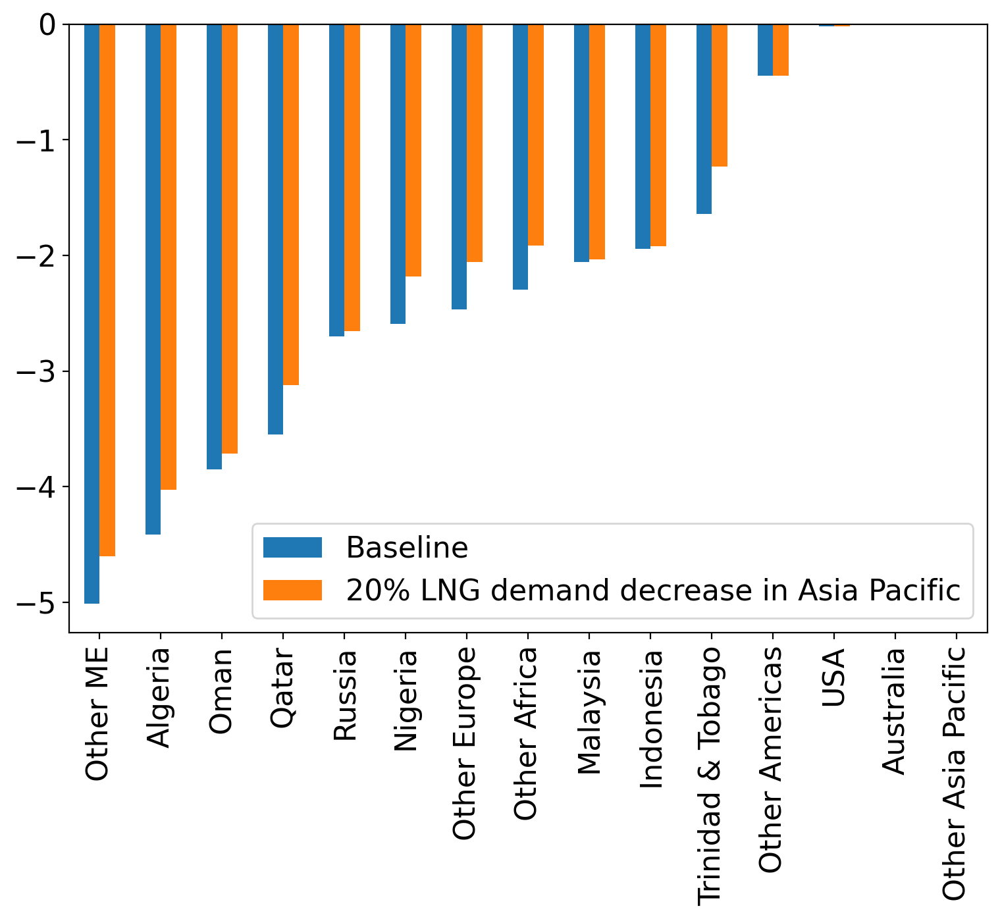

In [140]:
dual_export_2019_AS = pd.DataFrame(np.zeros((1, len(Merit_Order_2019_AS.index))),
                   
                   index = ["Shadow Price ($/MMBtu)"],
    
                   columns = ["Qatar", "Australia", "USA", "Russia", "Malaysia", "Nigeria",
                             "Trinidad & Tobago", "Algeria", "Indonesia", "Oman", "Other Asia Pacific",
                             "Other Europe", "Other Americas", "Other ME", "Other Africa"])

for m in model_2019_Asia.src.keys():
        s = SRC[m-1]
        dual_export_2019_AS.loc["Shadow Price ($/MMBtu)", s] = model_2019_Asia.dual[model_2019_Asia.src[m]]
        print("{0:18s}{1:15.1f}{2:14.1f}{3:14.4f}".format(s,Supply_2019[s]/MMBtu_Gas/10**9,model_2019_Asia.src[m]()/MMBtu_Gas/10**9,model_2019_Asia.dual[model_2019_Asia.src[m]]))

Dual_Export_AS = dual_export_2019_AS.T
Dual_Export_2019_4.sort_values("Shadow Price 2019 ($/MMBtu)", ascending=True, inplace = True)

Exporter_Shadow_AS = Dual_Export_2019_4.T
Exporter_Shadow_AS = Exporter_Shadow_AS.append(Dual_Export_AS.T)

id_y = pd.Index(AS_)
Exporter_Shadow_AS = Exporter_Shadow_AS.set_index(id_y)
#Dual_Import_2019.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
Exporter_Shadow_AS.T.plot(figsize = (9, 6), kind="bar")
#plt.legend(bbox_to_anchor=(1.0, 0.18))
#plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)
Exporter_Shadow_AS

### 10.5 Shadow Importers

Japan                                84.5      84.5      8.6058
China                                76.1      76.1      8.6368
South Korea                          49.9      49.9      8.6786
India                                32.9      32.9      8.0726
Taiwan                               18.6      18.6      8.5113
Pakistan                             12.4      12.4      8.0559
France                               23.1      23.1      7.4233
Spain                                21.9      21.9      7.4172
UK                                   19.1      19.1      7.4371
Italy                                14.3      14.3      7.6862
Turkey                               13.2      13.2      7.6236
Belgium                               9.0       9.0      7.4307
Other Asia Pacific                   24.5      24.5      8.4877
Other Europe                         24.4      24.4      7.5597
Total North America                  11.2      11.2      8.6258
Total S. & C. America                13.

/tmp/ipykernel_18619/1954236153.py:24: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



<AxesSubplot:>

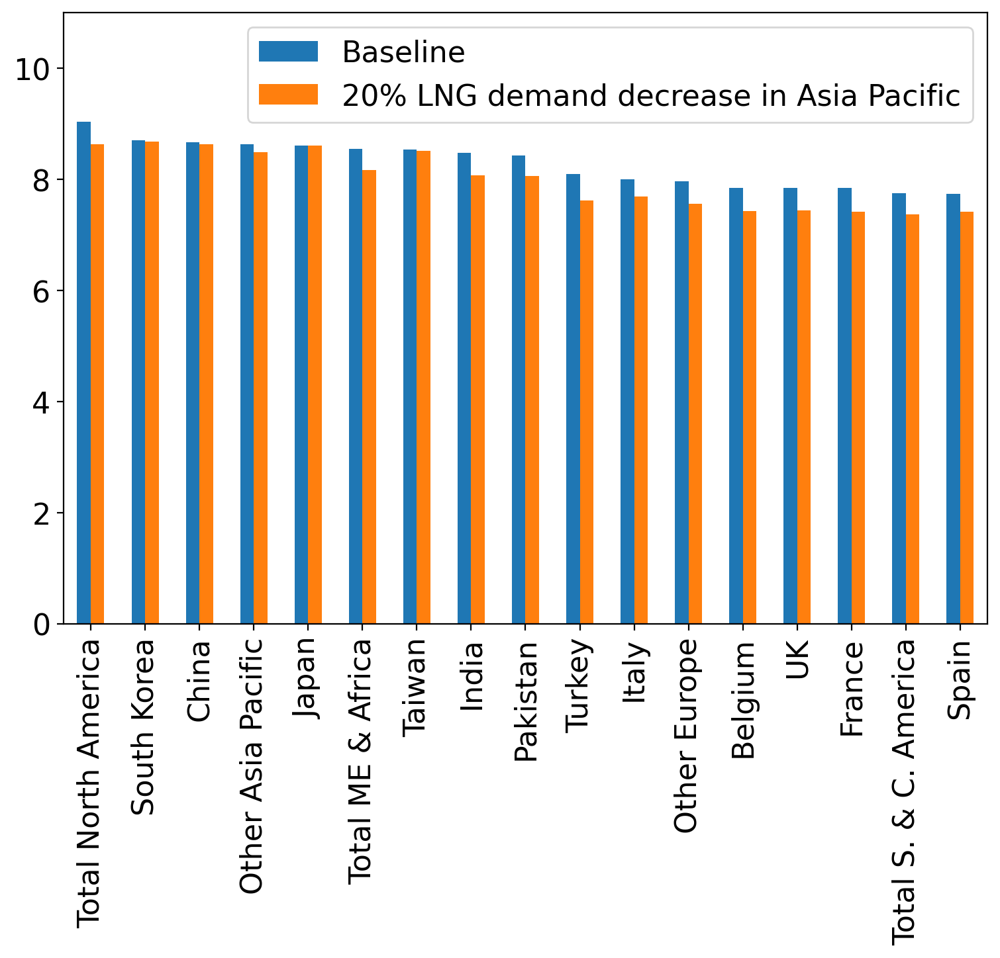

In [141]:
dual_import_2019_AS = pd.DataFrame(np.zeros((1,len(Merit_Order_2019_AS.columns))),
                   
                   index = ["Shadow Price Mar_SA ($/MMBtu)"],
    
                   columns = ["Japan", "China", "South Korea", "India", "Taiwan", "Pakistan", "France",
                             "Spain","UK", "Italy", "Turkey", "Belgium", "Other Asia Pacific", "Other Europe",
                             "Total North America", "Total S. & C. America", "Total ME & Africa"])


for n in model_2019_Asia.dmd.keys():
        c = CUS[n-1]
        dual_import_2019_AS.loc["Shadow Price Mar_SA ($/MMBtu)", c] = model_2019_Asia.dual[model_2019_Asia.dmd[n]]
        print("{0:26s}{1:15.1f}{2:10.1f}{3:12.4f}".format(c,Demand_2019_Asia[c]/MMBtu_Gas/10**9,model_2019_Asia.dmd[n]()/MMBtu_Gas/10**9,model_2019_Asia.dual[model_2019_Asia.dmd[n]]))

Dual_Import_AS = dual_import_2019_AS.T
#Dual_Import_Jun_Q

Dual_Import_2019_4.sort_values("Shadow Price 2019 ($/MMBtu)", ascending=False, inplace = True)
# ax.set_xlabel("$/MMBtu", fontsize=12)
# ax.set_ylabel("", fontsize=12)
# plt.show()

Importer_Shadow_AS = Dual_Import_2019_4.T
Importer_Shadow_AS = Importer_Shadow_AS.append(Dual_Import_AS.T)

id_y = pd.Index(AS_) 
Importer_Shadow_AS = Importer_Shadow_AS.set_index(id_y)
#Dual_Import_2019.sort_values("Shadow Price ($/MMBtu)", ascending=False, inplace = True)
Importer_Shadow_AS.T.plot(figsize = (9, 6), kind="bar", ylim=(0,11))
#plt.legend(bbox_to_anchor=(1.0, 1.0))
#plt.grid(axis = 'y', linestyle = '--', linewidth = 0.25)

### 10.6 CO2

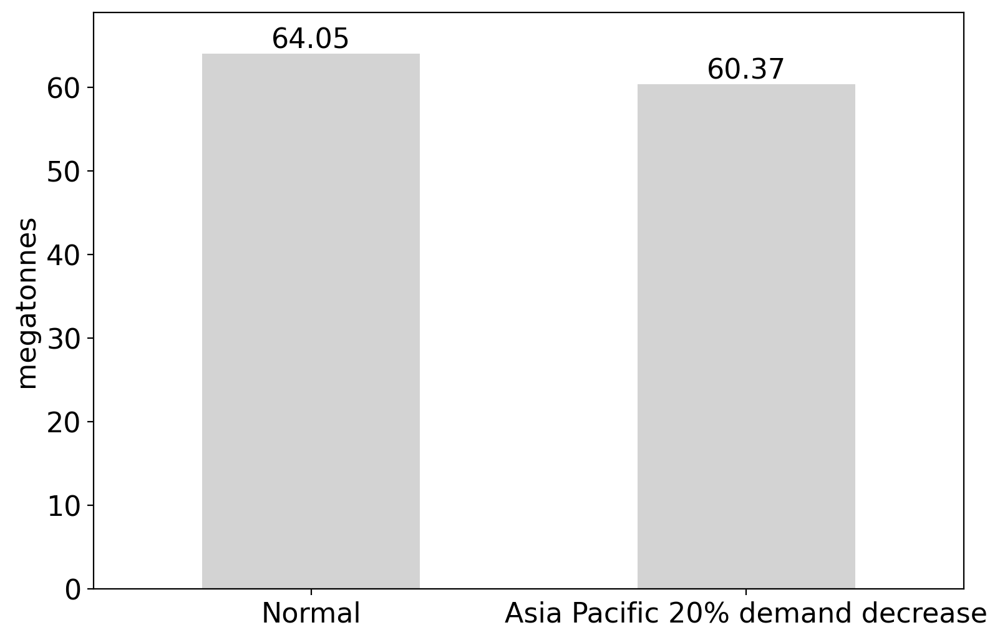

In [142]:
Emissions_2019_AS_ = CO2_Emissions * (transported_LNG_2019_AS*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Emissions_2019_AS_CO2 = round(Emissions_2019_AS_.to_numpy().sum()/10**6,2)


Emi_AS_CO2 = [Emissions_CO2_4, Emissions_2019_AS_CO2]

Emissions_AS_CO2 = pd.DataFrame(Emi_AS_CO2,
                   
                   index = ["Normal", "Asia Pacific 20% demand decrease"],
    
                   columns = ["CO2 Emissions"])


ax = Emissions_AS_CO2.plot(figsize = (9, 6), kind="bar", color = "lightgray", rot=0, ylim=(0,69))

for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("megatonnes")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()

### 10.7 CH4

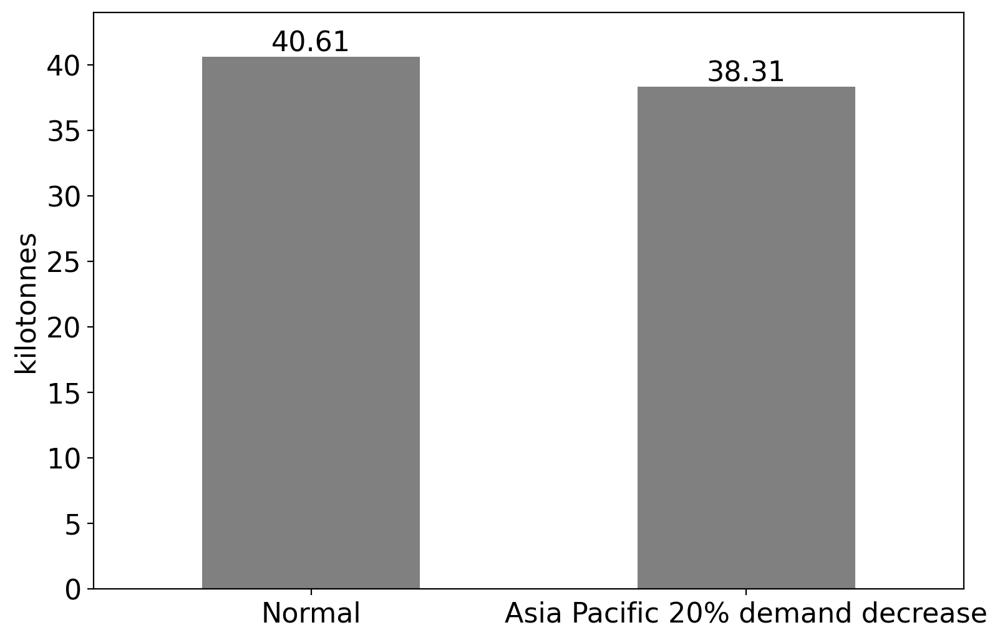

In [143]:
Emissions_2019_AS_CH4_ = CH4_Emissions * (transported_LNG_2019_AS*10**9) / (0.94 * LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas - LNG_Carrier.loc[0, "Capacity (m³)"] * LNG_to_Gas * LNG_Carrier.loc[0, "Boil off"] * Time)
Emissions_2019_AS_CH4 = round(Emissions_2019_AS_CH4_.to_numpy().sum()/10**3,2)


Emi_AS_CH4 = [Emissions_CH4_4, Emissions_2019_AS_CH4]

Emissions_AS_CH4 = pd.DataFrame(Emi_AS_CH4,
                   
                   index = ["Normal", "Asia Pacific 20% demand decrease"],
    
                   columns = ["CH4 Emissions"])


ax = Emissions_AS_CH4.plot(figsize = (9, 6), kind="bar", color = "grey", rot=0, ylim=(0,44))
for container in ax.containers:
    ax.bar_label(container)

ax.set_ylabel("kilotonnes")    
plt.legend(bbox_to_anchor=(1.0, 1.0))
ax.get_legend().remove()
plt.show()